In [1]:
from mxnet import nd, autograd, gluon
from mxnet.gluon import nn, rnn
import mxnet as mx
import datetime
import seaborn as sns
import time

import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.decomposition import PCA
import stockstats

import math


from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score


# Regression models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso, MultiTaskLassoCV, LassoLarsCV, LassoLarsIC 
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor

# Other packages
import numpy as np
import pandas as pd
import re
import scipy as sp
import xgboost as xgb
import matplotlib.pyplot as plt
from numpy import concatenate
from pandas import DataFrame, Series, read_csv, scatter_matrix

import warnings
warnings.filterwarnings("ignore")


In [2]:
SP500 = read_csv('SP500.csv')
SP500 = SP500.drop(['Unnamed: 0'], axis=1)
SP500.shape

(1062, 925)

In [3]:
def calculate_MACD(df, nslow=26, nfast=12):
    emaslow = df.ewm(span=nslow, min_periods=nslow, adjust=True, ignore_na=False).mean()
    emafast = df.ewm(span=nfast, min_periods=nfast, adjust=True, ignore_na=False).mean()
    dif = emafast - emaslow
    MACD = dif.ewm(span=9, min_periods=9, adjust=True, ignore_na=False).mean()
    return dif, MACD

def calculate_RSI(df, periods=14):
    # wilder's RSI
    delta = df.diff()
    up, down = delta.copy(), delta.copy()

    up[up < 0] = 0
    down[down > 0] = 0

    rUp = up.ewm(com=periods,adjust=False).mean()
    rDown = down.ewm(com=periods, adjust=False).mean().abs()

    rsi = 100 - 100 / (1 + rUp / rDown)
    return rsi

def calculate_SMA(df, peroids=15):
    SMA = df.rolling(window=peroids, min_periods=peroids, center=False).mean()
    return SMA

def calculate_BB(df, peroids=15):
    STD = df.rolling(window=peroids,min_periods=peroids, center=False).std()
    SMA = calculate_SMA(df)
    upper_band = SMA + (2 * STD)
    lower_band = SMA - (2 * STD)
    return upper_band, lower_band

def calculate_stdev(df,periods=5):
    STDEV = df.rolling(periods).std()
    return STDEV

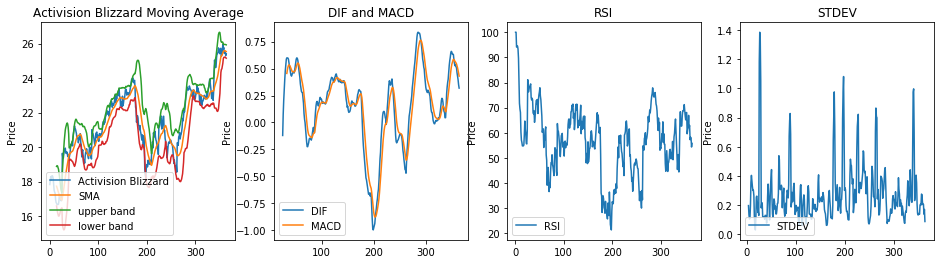

In [4]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Activision Blizzard
SMA_Activision_Blizzard = calculate_SMA(SP500.Activision_Blizzard_Close)

SP500.Activision_Blizzard_Close[:365].plot(title='Activision Blizzard Moving Average',label='Activision Blizzard', ax=axes[0])

SMA_Activision_Blizzard[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Activision Blizzard
upper_band_Activision_Blizzard, lower_band_Activision_Blizzard = calculate_BB(SP500.Activision_Blizzard_Close)

upper_band_Activision_Blizzard[:365].plot(label='upper band', ax=axes[0])
lower_band_Activision_Blizzard[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Activision Blizzard
DIF_Activision_Blizzard, MACD_Activision_Blizzard = calculate_MACD(SP500.Activision_Blizzard_Close)

DIF_Activision_Blizzard[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Activision_Blizzard[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Activision Blizzard
RSI_Activision_Blizzard = calculate_RSI(SP500.Activision_Blizzard_Close)
RSI_Activision_Blizzard[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Activision Blizzard
STDEV_Activision_Blizzard= calculate_stdev(SP500.Activision_Blizzard_Close)
STDEV_Activision_Blizzard[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Activision_Blizzard=SP500.Activision_Blizzard_Open - SP500.Activision_Blizzard_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')

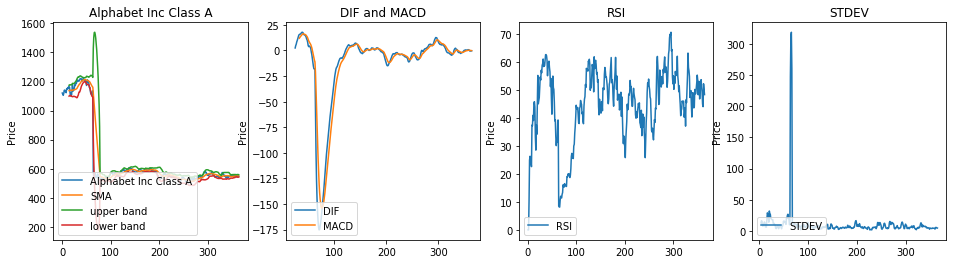

In [5]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Alphabet Inc Class A
SMA_Alphabet_Inc_Class_A = calculate_SMA(SP500.Alphabet_Inc_Class_A_Close)

SP500.Alphabet_Inc_Class_A_Close[:365].plot(title='Alphabet Inc Class A',label='Alphabet Inc Class A', ax=axes[0])

SMA_Alphabet_Inc_Class_A[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Alphabet Inc Class A
upper_band_Alphabet_Inc_Class_A, lower_band_Alphabet_Inc_Class_A = calculate_BB(SP500.Alphabet_Inc_Class_A_Close)

upper_band_Alphabet_Inc_Class_A[:365].plot(label='upper band', ax=axes[0])
lower_band_Alphabet_Inc_Class_A[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Alphabet Inc Class A
DIF_Alphabet_Inc_Class_A,MACD_Alphabet_Inc_Class_A = calculate_MACD(SP500.Alphabet_Inc_Class_A_Close)

DIF_Alphabet_Inc_Class_A[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Alphabet_Inc_Class_A[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Alphabet Inc Class A
RSI_Alphabet_Inc_Class_A = calculate_RSI(SP500.Alphabet_Inc_Class_A_Close)
RSI_Alphabet_Inc_Class_A[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Alphabet Inc Class A
STDEV_Alphabet_Inc_Class_A= calculate_stdev(SP500.Alphabet_Inc_Class_A_Close)
STDEV_Alphabet_Inc_Class_A[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Alphabet_Inc_Class_A=SP500.Alphabet_Inc_Class_A_Open - SP500.Alphabet_Inc_Class_A_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')

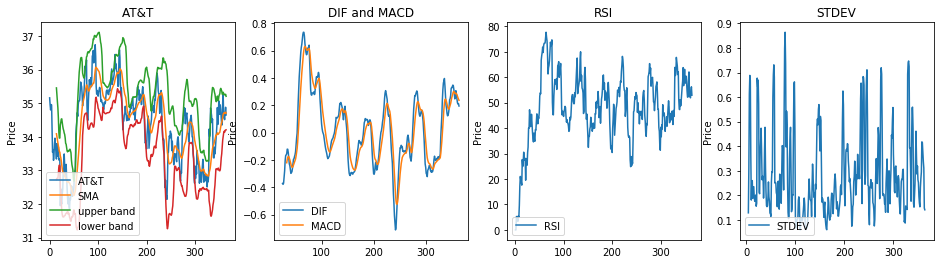

In [6]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for AT&T
SMA_ATT = calculate_SMA(SP500.ATT_Close)

SP500.ATT_Close[:365].plot(title='AT&T',label='AT&T', ax=axes[0])

SMA_ATT[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AT&T
upper_band_ATT, lower_band_ATT = calculate_BB(SP500.ATT_Close)

upper_band_ATT[:365].plot(label='upper band', ax=axes[0])
lower_band_ATT[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AT&T
DIF_ATT, MACD_ATT = calculate_MACD(SP500.ATT_Close)

DIF_ATT[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_ATT[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AT&T
RSI_ATT = calculate_RSI(SP500.ATT_Close)
RSI_ATT[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AT&T
STDEV_ATT= calculate_stdev(SP500.ATT_Close)
STDEV_ATT[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_ATT=SP500.ATT_Open - SP500.ATT_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


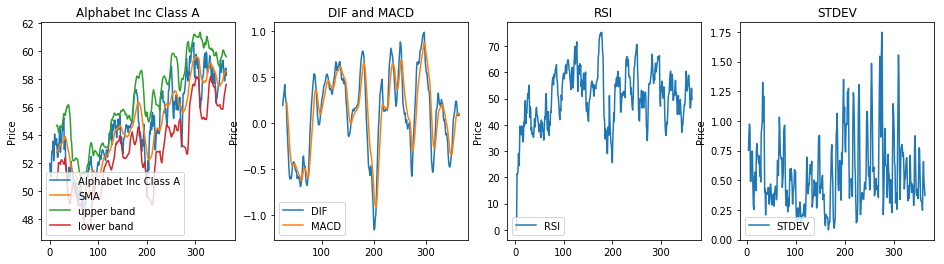

In [7]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Alphabet Inc Class A
SMA_Comcast = calculate_SMA(SP500.Comcast_Close)

SP500.Comcast_Close[:365].plot(title='Alphabet Inc Class A',label='Alphabet Inc Class A', ax=axes[0])

SMA_Comcast[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Alphabet Inc Class A
upper_band_Comcast, lower_band_Comcast = calculate_BB(SP500.Comcast_Close)

upper_band_Comcast[:365].plot(label='upper band', ax=axes[0])
lower_band_Comcast[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Alphabet Inc Class A
DIF_Comcast,MACD_Comcast = calculate_MACD(SP500.Comcast_Close)

DIF_Comcast[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Comcast[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Alphabet Inc Class A
RSI_Comcast = calculate_RSI(SP500.Comcast_Close)
RSI_Comcast[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Alphabet Inc Class A
STDEV_Comcast= calculate_stdev(SP500.Comcast_Close)
STDEV_Comcast[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Comcast=SP500.Comcast_Open - SP500.Comcast_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


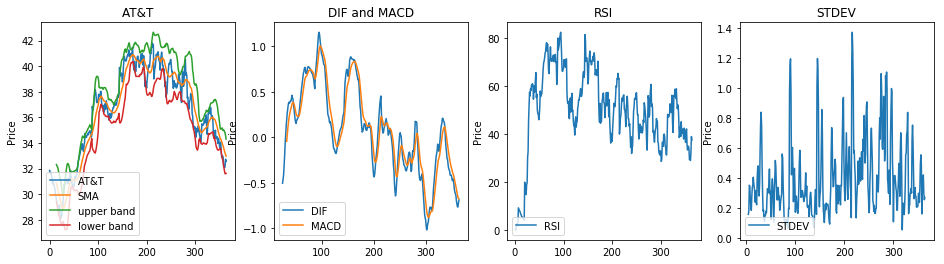

In [8]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for AT&T
SMA_CenturyLink = calculate_SMA(SP500.CenturyLink_Close)

SP500.CenturyLink_Close[:365].plot(title='AT&T',label='AT&T', ax=axes[0])

SMA_CenturyLink[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AT&T
upper_band_CenturyLink, lower_band_CenturyLink = calculate_BB(SP500.CenturyLink_Close)

upper_band_CenturyLink[:365].plot(label='upper band', ax=axes[0])
lower_band_CenturyLink[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AT&T
DIF_CenturyLink, MACD_CenturyLink = calculate_MACD(SP500.CenturyLink_Close)

DIF_CenturyLink[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_CenturyLink[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AT&T
RSI_CenturyLink = calculate_RSI(SP500.CenturyLink_Close)
RSI_CenturyLink[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AT&T
STDEV_CenturyLink= calculate_stdev(SP500.CenturyLink_Close)
STDEV_CenturyLink[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_CenturyLink=SP500.CenturyLink_Open - SP500.CenturyLink_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


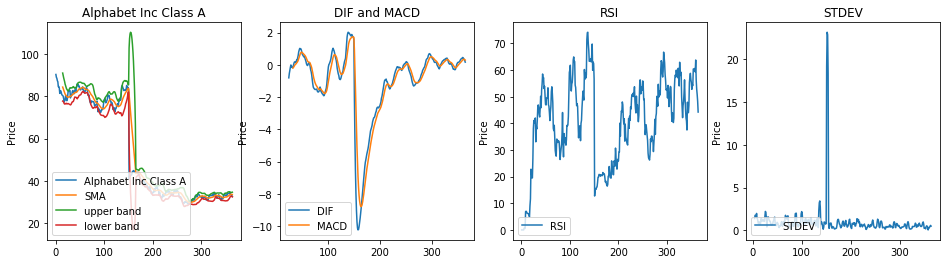

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Alphabet Inc Class A
SMA_Discovery_Class_A = calculate_SMA(SP500.Discovery_Class_A_Close)

SP500.Discovery_Class_A_Close[:365].plot(title='Alphabet Inc Class A',label='Alphabet Inc Class A', ax=axes[0])

SMA_Discovery_Class_A[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Alphabet Inc Class A
upper_band_Discovery_Class_A, lower_band_Discovery_Class_A = calculate_BB(SP500.Discovery_Class_A_Close)

upper_band_Discovery_Class_A[:365].plot(label='upper band', ax=axes[0])
lower_band_Discovery_Class_A[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Alphabet Inc Class A
DIF_Discovery_Class_A,MACD_Discovery_Class_A = calculate_MACD(SP500.Discovery_Class_A_Close)

DIF_Discovery_Class_A[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Discovery_Class_A[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Alphabet Inc Class A
RSI_Discovery_Class_A = calculate_RSI(SP500.Discovery_Class_A_Close)
RSI_Discovery_Class_A[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Alphabet Inc Class A
STDEV_Discovery_Class_A= calculate_stdev(SP500.Discovery_Class_A_Close)
STDEV_Discovery_Class_A[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Discovery_Class_A=SP500.Discovery_Class_A_Open - SP500.Discovery_Class_A_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


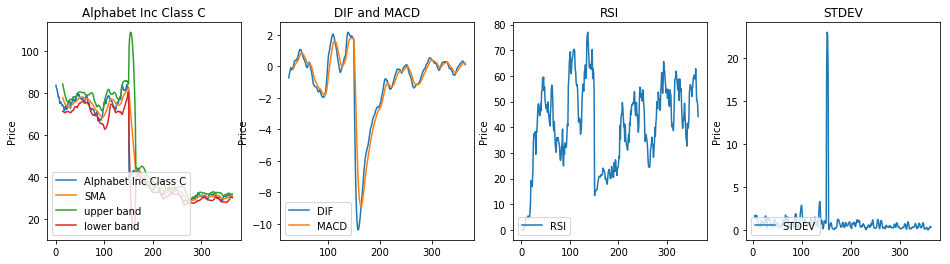

In [10]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Discovery Class C
SMA_Discovery_Class_C = calculate_SMA(SP500.Discovery_Class_C_Close)

SP500.Discovery_Class_C_Close[:365].plot(title='Alphabet Inc Class C',label='Alphabet Inc Class C', ax=axes[0])

SMA_Discovery_Class_C[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Discovery Class C
upper_band_Discovery_Class_C, lower_band_Discovery_Class_C = calculate_BB(SP500.Discovery_Class_C_Close)

upper_band_Discovery_Class_C[:365].plot(label='upper band', ax=axes[0])
lower_band_Discovery_Class_C[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Discovery Class C
DIF_Discovery_Class_C,MACD_Discovery_Class_C = calculate_MACD(SP500.Discovery_Class_C_Close)

DIF_Discovery_Class_C[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Discovery_Class_C[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Discovery Class C
RSI_Discovery_Class_C = calculate_RSI(SP500.Discovery_Class_C_Close)
RSI_Discovery_Class_C[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Discovery Class C
STDEV_Discovery_Class_C= calculate_stdev(SP500.Discovery_Class_C_Close)
STDEV_Discovery_Class_C[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Discovery_Class_C=SP500.Discovery_Class_C_Open - SP500.Discovery_Class_C_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


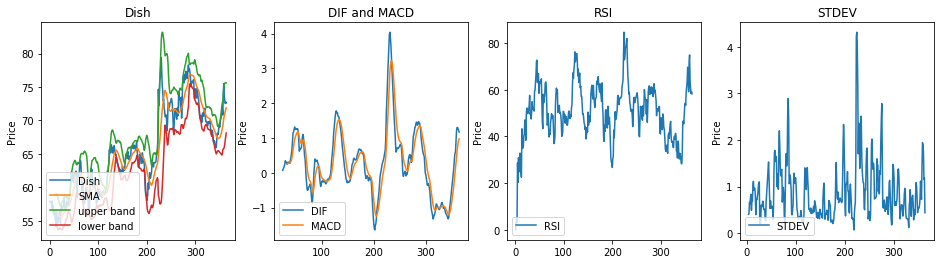

In [11]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Dish
SMA_Dish = calculate_SMA(SP500.Dish_Close)

SP500.Dish_Close[:365].plot(title='Dish',label='Dish', ax=axes[0])

SMA_Dish[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Dish
upper_band_Dish, lower_band_Dish = calculate_BB(SP500.Dish_Close)

upper_band_Dish[:365].plot(label='upper band', ax=axes[0])
lower_band_Dish[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Dish
DIF_Dish,MACD_Dish = calculate_MACD(SP500.Dish_Close)

DIF_Dish[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Dish[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Dish
RSI_Dish = calculate_RSI(SP500.Dish_Close)
RSI_Dish[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Dish
STDEV_Dish= calculate_stdev(SP500.Dish_Close)
STDEV_Dish[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Dish=SP500.Dish_Open - SP500.Dish_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


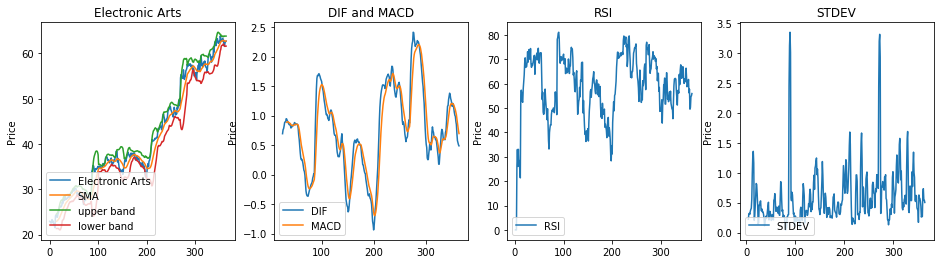

In [12]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Electronic Arts
SMA_Electronic_Arts = calculate_SMA(SP500.Electronic_Arts_Close)

SP500.Electronic_Arts_Close[:365].plot(title='Electronic Arts',label='Electronic Arts', ax=axes[0])

SMA_Electronic_Arts[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Electronic Arts
upper_band_Electronic_Arts, lower_band_Electronic_Arts = calculate_BB(SP500.Electronic_Arts_Close)

upper_band_Electronic_Arts[:365].plot(label='upper band', ax=axes[0])
lower_band_Electronic_Arts[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Electronic Arts
DIF_Electronic_Arts,MACD_Electronic_Arts = calculate_MACD(SP500.Electronic_Arts_Close)

DIF_Electronic_Arts[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Electronic_Arts[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Electronic Arts
RSI_Electronic_Arts = calculate_RSI(SP500.Electronic_Arts_Close)
RSI_Electronic_Arts[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Electronic Arts
STDEV_Electronic_Arts= calculate_stdev(SP500.Electronic_Arts_Close)
STDEV_Electronic_Arts[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Electronic_Arts=SP500.Electronic_Arts_Open - SP500.Electronic_Arts_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


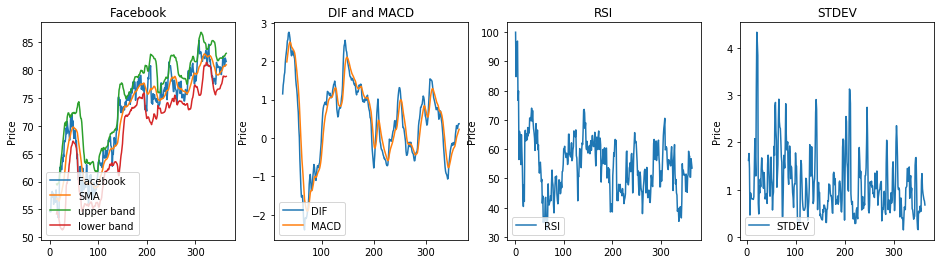

In [13]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Facebook
SMA_Facebook = calculate_SMA(SP500.Facebook_Close)

SP500.Facebook_Close[:365].plot(title='Facebook',label='Facebook', ax=axes[0])

SMA_Facebook[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Facebook
upper_band_Facebook, lower_band_Facebook = calculate_BB(SP500.Facebook_Close)

upper_band_Facebook[:365].plot(label='upper band', ax=axes[0])
lower_band_Facebook[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Facebook
DIF_Facebook,MACD_Facebook = calculate_MACD(SP500.Facebook_Close)

DIF_Facebook[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Facebook[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Facebook
RSI_Facebook = calculate_RSI(SP500.Facebook_Close)
RSI_Facebook[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Facebook
STDEV_Facebook= calculate_stdev(SP500.Facebook_Close)
STDEV_Facebook[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Facebook=SP500.Facebook_Open - SP500.Facebook_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


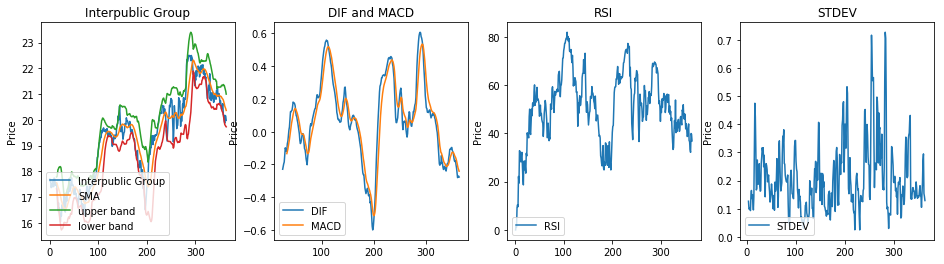

In [14]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Interpublic Group
SMA_Interpublic_Group = calculate_SMA(SP500.Interpublic_Group_Close)

SP500.Interpublic_Group_Close[:365].plot(title='Interpublic Group',label='Interpublic Group', ax=axes[0])

SMA_Interpublic_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Interpublic Group
upper_band_Interpublic_Group, lower_band_Interpublic_Group = calculate_BB(SP500.Interpublic_Group_Close)

upper_band_Interpublic_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Interpublic_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Interpublic Group
DIF_Interpublic_Group,MACD_Interpublic_Group = calculate_MACD(SP500.Interpublic_Group_Close)

DIF_Interpublic_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Interpublic_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Interpublic Group
RSI_Interpublic_Group = calculate_RSI(SP500.Interpublic_Group_Close)
RSI_Interpublic_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Interpublic Group
STDEV_Interpublic_Group= calculate_stdev(SP500.Interpublic_Group_Close)
STDEV_Interpublic_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Interpublic_Group=SP500.Interpublic_Group_Open - SP500.Interpublic_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


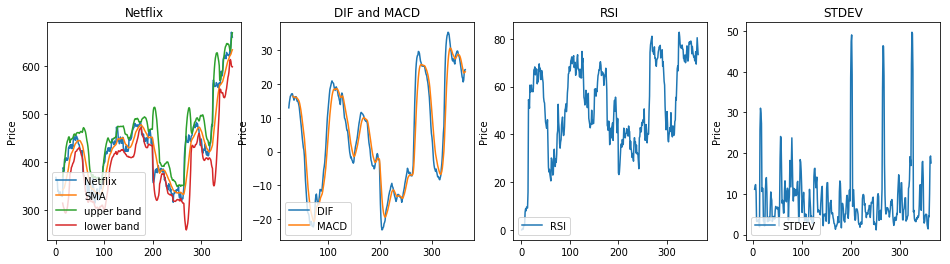

In [15]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

# Calculate Simple Moving Average for Netflix
SMA_Netflix = calculate_SMA(SP500.Netflix_Close)

SP500.Netflix_Close[:365].plot(title='Netflix',label='Netflix', ax=axes[0])

SMA_Netflix[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Netflix
upper_band_Netflix, lower_band_Netflix = calculate_BB(SP500.Netflix_Close)

upper_band_Netflix[:365].plot(label='upper band', ax=axes[0])
lower_band_Netflix[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Netflix
DIF_Netflix,MACD_Netflix = calculate_MACD(SP500.Netflix_Close)

DIF_Netflix[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Netflix[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Netflix
RSI_Netflix = calculate_RSI(SP500.Netflix_Close)
RSI_Netflix[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Netflix
STDEV_Netflix= calculate_stdev(SP500.Netflix_Close)
STDEV_Netflix[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Netflix=SP500.Netflix_Open - SP500.Netflix_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


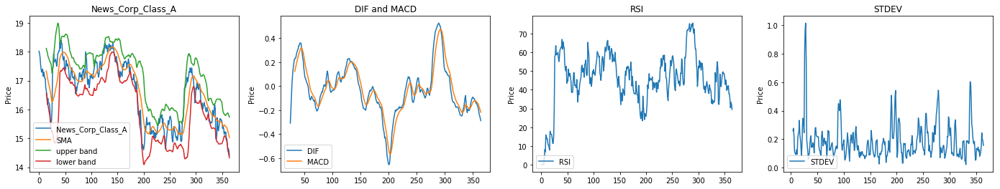

In [16]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for News_Corp_Class_A
SMA_News_Corp_Class_A = calculate_SMA(SP500.News_Corp_Class_A_Close)

SP500.News_Corp_Class_A_Close[:365].plot(title='News_Corp_Class_A',label='News_Corp_Class_A', ax=axes[0])

SMA_News_Corp_Class_A[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for News_Corp_Class_A
upper_band_News_Corp_Class_A, lower_band_News_Corp_Class_A = calculate_BB(SP500.News_Corp_Class_A_Close)

upper_band_News_Corp_Class_A[:365].plot(label='upper band', ax=axes[0])
lower_band_News_Corp_Class_A[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for News_Corp_Class_A
DIF_News_Corp_Class_A,MACD_News_Corp_Class_A = calculate_MACD(SP500.News_Corp_Class_A_Close)

DIF_News_Corp_Class_A[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_News_Corp_Class_A[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for News_Corp_Class_A
RSI_News_Corp_Class_A = calculate_RSI(SP500.News_Corp_Class_A_Close)
RSI_News_Corp_Class_A[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for News_Corp_Class_A
STDEV_News_Corp_Class_A= calculate_stdev(SP500.News_Corp_Class_A_Close)
STDEV_News_Corp_Class_A[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_News_Corp_Class_A=SP500.News_Corp_Class_A_Open - SP500.News_Corp_Class_A_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



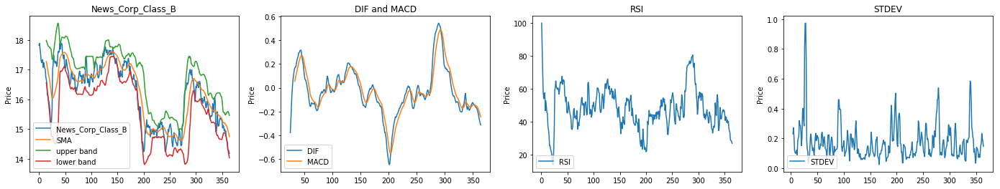

In [17]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for News_Corp_Class_B
SMA_News_Corp_Class_B = calculate_SMA(SP500.News_Corp_Class_B_Close)

SP500.News_Corp_Class_B_Close[:365].plot(title='News_Corp_Class_B',label='News_Corp_Class_B', ax=axes[0])

SMA_News_Corp_Class_B[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for News_Corp_Class_B
upper_band_News_Corp_Class_B, lower_band_News_Corp_Class_B = calculate_BB(SP500.News_Corp_Class_B_Close)

upper_band_News_Corp_Class_B[:365].plot(label='upper band', ax=axes[0])
lower_band_News_Corp_Class_B[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for News_Corp_Class_B
DIF_News_Corp_Class_B,MACD_News_Corp_Class_B = calculate_MACD(SP500.News_Corp_Class_B_Close)

DIF_News_Corp_Class_B[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_News_Corp_Class_B[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for News_Corp_Class_B
RSI_News_Corp_Class_B = calculate_RSI(SP500.News_Corp_Class_B_Close)
RSI_News_Corp_Class_B[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for News_Corp_Class_B
STDEV_News_Corp_Class_B= calculate_stdev(SP500.News_Corp_Class_B_Close)
STDEV_News_Corp_Class_B[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_News_Corp_Class_B=SP500.News_Corp_Class_B_Open - SP500.News_Corp_Class_B_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




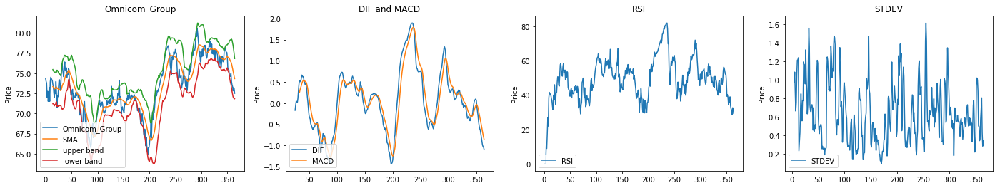

In [18]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Omnicom_Group
SMA_Omnicom_Group = calculate_SMA(SP500.Omnicom_Group_Close)

SP500.Omnicom_Group_Close[:365].plot(title='Omnicom_Group',label='Omnicom_Group', ax=axes[0])

SMA_Omnicom_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Omnicom_Group
upper_band_Omnicom_Group, lower_band_Omnicom_Group = calculate_BB(SP500.Omnicom_Group_Close)

upper_band_Omnicom_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Omnicom_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Omnicom_Group
DIF_Omnicom_Group,MACD_Omnicom_Group = calculate_MACD(SP500.Omnicom_Group_Close)

DIF_Omnicom_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Omnicom_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Omnicom_Group
RSI_Omnicom_Group = calculate_RSI(SP500.Omnicom_Group_Close)
RSI_Omnicom_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Omnicom_Group
STDEV_Omnicom_Group= calculate_stdev(SP500.Omnicom_Group_Close)
STDEV_Omnicom_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Omnicom_Group=SP500.Omnicom_Group_Open - SP500.Omnicom_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




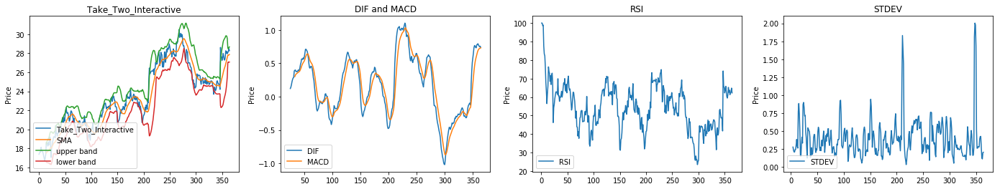

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Take_Two_Interactive
SMA_Take_Two_Interactive = calculate_SMA(SP500.Take_Two_Interactive_Close)

SP500.Take_Two_Interactive_Close[:365].plot(title='Take_Two_Interactive',label='Take_Two_Interactive', ax=axes[0])

SMA_Take_Two_Interactive[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Take_Two_Interactive
upper_band_Take_Two_Interactive, lower_band_Take_Two_Interactive = calculate_BB(SP500.Take_Two_Interactive_Close)

upper_band_Take_Two_Interactive[:365].plot(label='upper band', ax=axes[0])
lower_band_Take_Two_Interactive[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Take_Two_Interactive
DIF_Take_Two_Interactive,MACD_Take_Two_Interactive = calculate_MACD(SP500.Take_Two_Interactive_Close)

DIF_Take_Two_Interactive[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Take_Two_Interactive[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Take_Two_Interactive
RSI_Take_Two_Interactive = calculate_RSI(SP500.Take_Two_Interactive_Close)
RSI_Take_Two_Interactive[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Take_Two_Interactive
STDEV_Take_Two_Interactive= calculate_stdev(SP500.Take_Two_Interactive_Close)
STDEV_Take_Two_Interactive[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Take_Two_Interactive=SP500.Take_Two_Interactive_Open - SP500.Take_Two_Interactive_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




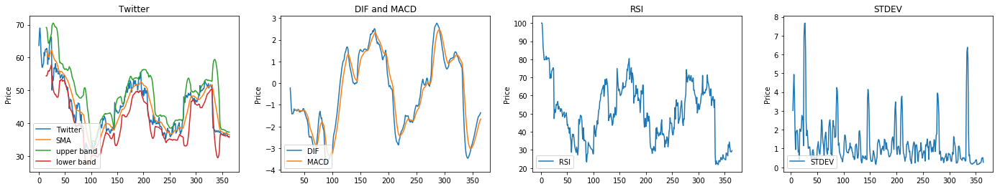

In [20]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Twitter
SMA_Twitter = calculate_SMA(SP500.Twitter_Close)

SP500.Twitter_Close[:365].plot(title='Twitter',label='Twitter', ax=axes[0])

SMA_Twitter[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Twitter
upper_band_Twitter, lower_band_Twitter = calculate_BB(SP500.Twitter_Close)

upper_band_Twitter[:365].plot(label='upper band', ax=axes[0])
lower_band_Twitter[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Twitter
DIF_Twitter,MACD_Twitter = calculate_MACD(SP500.Twitter_Close)

DIF_Twitter[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Twitter[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Twitter
RSI_Twitter = calculate_RSI(SP500.Twitter_Close)
RSI_Twitter[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Twitter
STDEV_Twitter= calculate_stdev(SP500.Twitter_Close)
STDEV_Twitter[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Twitter=SP500.Twitter_Open - SP500.Twitter_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


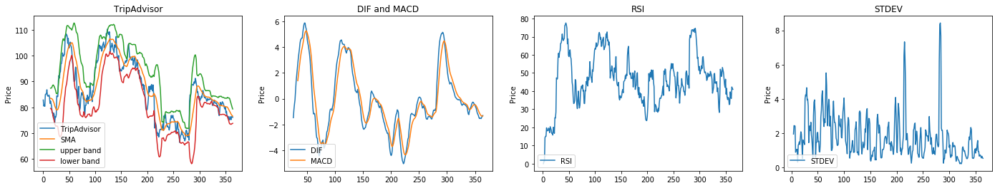

In [21]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for TripAdvisor
SMA_TripAdvisor = calculate_SMA(SP500.TripAdvisor_Close)

SP500.TripAdvisor_Close[:365].plot(title='TripAdvisor',label='TripAdvisor', ax=axes[0])

SMA_TripAdvisor[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for TripAdvisor
upper_band_TripAdvisor, lower_band_TripAdvisor = calculate_BB(SP500.TripAdvisor_Close)

upper_band_TripAdvisor[:365].plot(label='upper band', ax=axes[0])
lower_band_TripAdvisor[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for TripAdvisor
DIF_TripAdvisor,MACD_TripAdvisor = calculate_MACD(SP500.TripAdvisor_Close)

DIF_TripAdvisor[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_TripAdvisor[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for TripAdvisor
RSI_TripAdvisor = calculate_RSI(SP500.TripAdvisor_Close)
RSI_TripAdvisor[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for TripAdvisor
STDEV_TripAdvisor= calculate_stdev(SP500.TripAdvisor_Close)
STDEV_TripAdvisor[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_TripAdvisor=SP500.TripAdvisor_Open - SP500.TripAdvisor_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




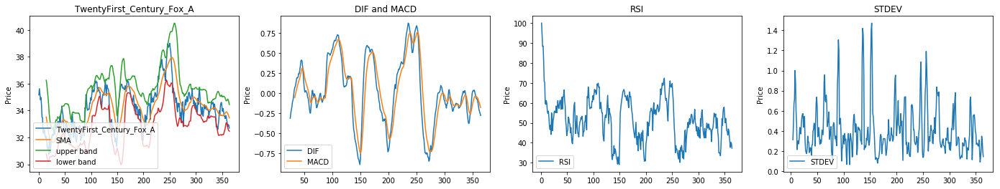

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for TwentyFirst_Century_Fox_A
SMA_TwentyFirst_Century_Fox_A = calculate_SMA(SP500.TwentyFirst_Century_Fox_A_Close)

SP500.TwentyFirst_Century_Fox_A_Close[:365].plot(title='TwentyFirst_Century_Fox_A',label='TwentyFirst_Century_Fox_A', ax=axes[0])

SMA_TwentyFirst_Century_Fox_A[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for TwentyFirst_Century_Fox_A
upper_band_TwentyFirst_Century_Fox_A, lower_band_TwentyFirst_Century_Fox_A = calculate_BB(SP500.TwentyFirst_Century_Fox_A_Close)

upper_band_TwentyFirst_Century_Fox_A[:365].plot(label='upper band', ax=axes[0])
lower_band_TwentyFirst_Century_Fox_A[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for TwentyFirst_Century_Fox_A
DIF_TwentyFirst_Century_Fox_A,MACD_TwentyFirst_Century_Fox_A = calculate_MACD(SP500.TwentyFirst_Century_Fox_A_Close)

DIF_TwentyFirst_Century_Fox_A[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_TwentyFirst_Century_Fox_A[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for TwentyFirst_Century_Fox_A
RSI_TwentyFirst_Century_Fox_A = calculate_RSI(SP500.TwentyFirst_Century_Fox_A_Close)
RSI_TwentyFirst_Century_Fox_A[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for TwentyFirst_Century_Fox_A
STDEV_TwentyFirst_Century_Fox_A= calculate_stdev(SP500.TwentyFirst_Century_Fox_A_Close)
STDEV_TwentyFirst_Century_Fox_A[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_TwentyFirst_Century_Fox_A=SP500.TwentyFirst_Century_Fox_A_Open - SP500.TwentyFirst_Century_Fox_A_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




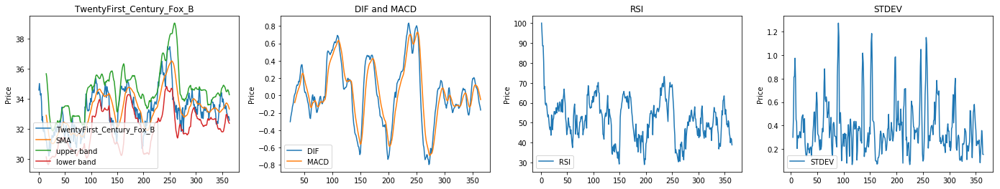

In [23]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for TwentyFirst_Century_Fox_B
SMA_TwentyFirst_Century_Fox_B = calculate_SMA(SP500.TwentyFirst_Century_Fox_B_Close)

SP500.TwentyFirst_Century_Fox_B_Close[:365].plot(title='TwentyFirst_Century_Fox_B',label='TwentyFirst_Century_Fox_B', ax=axes[0])

SMA_TwentyFirst_Century_Fox_B[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for TwentyFirst_Century_Fox_B
upper_band_TwentyFirst_Century_Fox_B, lower_band_TwentyFirst_Century_Fox_B = calculate_BB(SP500.TwentyFirst_Century_Fox_B_Close)

upper_band_TwentyFirst_Century_Fox_B[:365].plot(label='upper band', ax=axes[0])
lower_band_TwentyFirst_Century_Fox_B[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for TwentyFirst_Century_Fox_B
DIF_TwentyFirst_Century_Fox_B,MACD_TwentyFirst_Century_Fox_B = calculate_MACD(SP500.TwentyFirst_Century_Fox_B_Close)

DIF_TwentyFirst_Century_Fox_B[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_TwentyFirst_Century_Fox_B[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for TwentyFirst_Century_Fox_B
RSI_TwentyFirst_Century_Fox_B = calculate_RSI(SP500.TwentyFirst_Century_Fox_B_Close)
RSI_TwentyFirst_Century_Fox_B[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for TwentyFirst_Century_Fox_B
STDEV_TwentyFirst_Century_Fox_B= calculate_stdev(SP500.TwentyFirst_Century_Fox_B_Close)
STDEV_TwentyFirst_Century_Fox_B[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_TwentyFirst_Century_Fox_B=SP500.TwentyFirst_Century_Fox_B_Open - SP500.TwentyFirst_Century_Fox_B_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




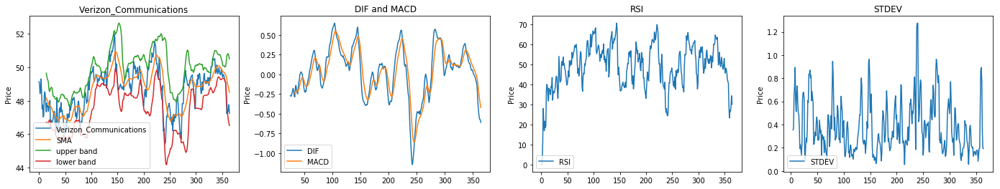

In [24]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Verizon_Communications
SMA_Verizon_Communications = calculate_SMA(SP500.Verizon_Communications_Close)

SP500.Verizon_Communications_Close[:365].plot(title='Verizon_Communications',label='Verizon_Communications', ax=axes[0])

SMA_Verizon_Communications[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Verizon_Communications
upper_band_Verizon_Communications, lower_band_Verizon_Communications = calculate_BB(SP500.Verizon_Communications_Close)

upper_band_Verizon_Communications[:365].plot(label='upper band', ax=axes[0])
lower_band_Verizon_Communications[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Verizon_Communications
DIF_Verizon_Communications,MACD_Verizon_Communications = calculate_MACD(SP500.Verizon_Communications_Close)

DIF_Verizon_Communications[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Verizon_Communications[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Verizon_Communications
RSI_Verizon_Communications = calculate_RSI(SP500.Verizon_Communications_Close)
RSI_Verizon_Communications[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Verizon_Communications
STDEV_Verizon_Communications= calculate_stdev(SP500.Verizon_Communications_Close)
STDEV_Verizon_Communications[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Verizon_Communications=SP500.Verizon_Communications_Open - SP500.Verizon_Communications_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




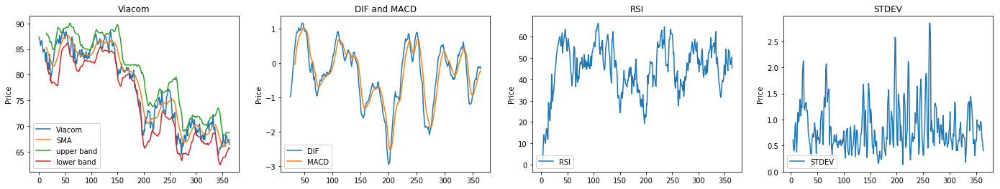

In [25]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Viacom
SMA_Viacom = calculate_SMA(SP500.Viacom_Close)

SP500.Viacom_Close[:365].plot(title='Viacom',label='Viacom', ax=axes[0])

SMA_Viacom[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Viacom
upper_band_Viacom, lower_band_Viacom = calculate_BB(SP500.Viacom_Close)

upper_band_Viacom[:365].plot(label='upper band', ax=axes[0])
lower_band_Viacom[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Viacom
DIF_Viacom,MACD_Viacom = calculate_MACD(SP500.Viacom_Close)

DIF_Viacom[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Viacom[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Viacom
RSI_Viacom = calculate_RSI(SP500.Viacom_Close)
RSI_Viacom[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Viacom
STDEV_Viacom= calculate_stdev(SP500.Viacom_Close)
STDEV_Viacom[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Viacom=SP500.Viacom_Open - SP500.Viacom_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




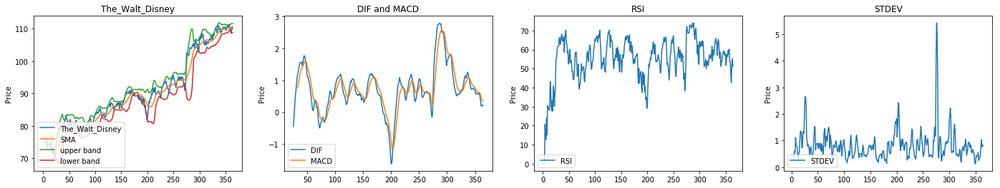

In [26]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for The_Walt_Disney
SMA_The_Walt_Disney = calculate_SMA(SP500.The_Walt_Disney_Close)

SP500.The_Walt_Disney_Close[:365].plot(title='The_Walt_Disney',label='The_Walt_Disney', ax=axes[0])

SMA_The_Walt_Disney[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for The_Walt_Disney
upper_band_The_Walt_Disney, lower_band_The_Walt_Disney = calculate_BB(SP500.The_Walt_Disney_Close)

upper_band_The_Walt_Disney[:365].plot(label='upper band', ax=axes[0])
lower_band_The_Walt_Disney[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for The_Walt_Disney
DIF_The_Walt_Disney,MACD_The_Walt_Disney = calculate_MACD(SP500.The_Walt_Disney_Close)

DIF_The_Walt_Disney[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_The_Walt_Disney[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for The_Walt_Disney
RSI_The_Walt_Disney = calculate_RSI(SP500.The_Walt_Disney_Close)
RSI_The_Walt_Disney[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for The_Walt_Disney
STDEV_The_Walt_Disney= calculate_stdev(SP500.The_Walt_Disney_Close)
STDEV_The_Walt_Disney[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_The_Walt_Disney=SP500.The_Walt_Disney_Open - SP500.The_Walt_Disney_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




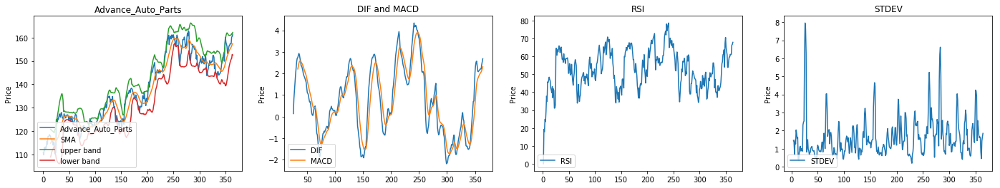

In [27]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Advance_Auto_Parts
SMA_Advance_Auto_Parts = calculate_SMA(SP500.Advance_Auto_Parts_Close)

SP500.Advance_Auto_Parts_Close[:365].plot(title='Advance_Auto_Parts',label='Advance_Auto_Parts', ax=axes[0])

SMA_Advance_Auto_Parts[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Advance_Auto_Parts
upper_band_Advance_Auto_Parts, lower_band_Advance_Auto_Parts = calculate_BB(SP500.Advance_Auto_Parts_Close)

upper_band_Advance_Auto_Parts[:365].plot(label='upper band', ax=axes[0])
lower_band_Advance_Auto_Parts[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Advance_Auto_Parts
DIF_Advance_Auto_Parts,MACD_Advance_Auto_Parts = calculate_MACD(SP500.Advance_Auto_Parts_Close)

DIF_Advance_Auto_Parts[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Advance_Auto_Parts[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Advance_Auto_Parts
RSI_Advance_Auto_Parts = calculate_RSI(SP500.Advance_Auto_Parts_Close)
RSI_Advance_Auto_Parts[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Advance_Auto_Parts
STDEV_Advance_Auto_Parts= calculate_stdev(SP500.Advance_Auto_Parts_Close)
STDEV_Advance_Auto_Parts[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Advance_Auto_Parts=SP500.Advance_Auto_Parts_Open - SP500.Advance_Auto_Parts_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




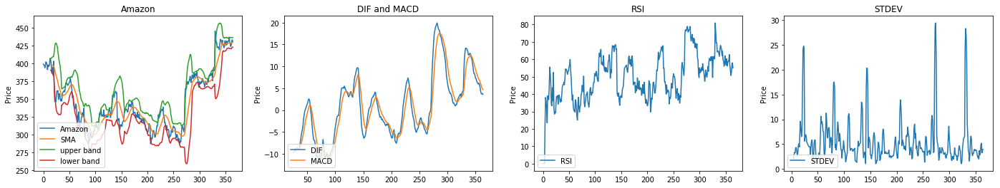

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Amazon
SMA_Amazon = calculate_SMA(SP500.Amazon_Close)

SP500.Amazon_Close[:365].plot(title='Amazon',label='Amazon', ax=axes[0])

SMA_Amazon[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Amazon
upper_band_Amazon, lower_band_Amazon = calculate_BB(SP500.Amazon_Close)

upper_band_Amazon[:365].plot(label='upper band', ax=axes[0])
lower_band_Amazon[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Amazon
DIF_Amazon,MACD_Amazon = calculate_MACD(SP500.Amazon_Close)

DIF_Amazon[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Amazon[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Amazon
RSI_Amazon = calculate_RSI(SP500.Amazon_Close)
RSI_Amazon[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Amazon
STDEV_Amazon= calculate_stdev(SP500.Amazon_Close)
STDEV_Amazon[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Amazon=SP500.Amazon_Open - SP500.Amazon_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




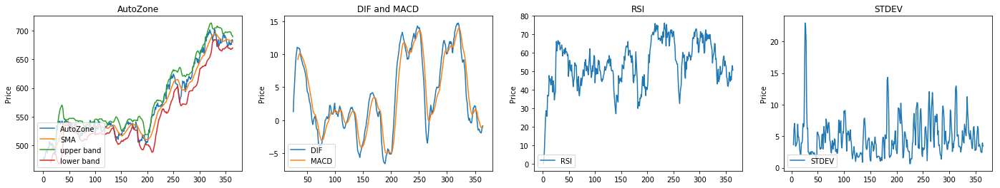

In [29]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for AutoZone
SMA_AutoZone = calculate_SMA(SP500.AutoZone_Close)

SP500.AutoZone_Close[:365].plot(title='AutoZone',label='AutoZone', ax=axes[0])

SMA_AutoZone[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AutoZone
upper_band_AutoZone, lower_band_AutoZone = calculate_BB(SP500.AutoZone_Close)

upper_band_AutoZone[:365].plot(label='upper band', ax=axes[0])
lower_band_AutoZone[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AutoZone
DIF_AutoZone,MACD_AutoZone = calculate_MACD(SP500.AutoZone_Close)

DIF_AutoZone[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_AutoZone[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AutoZone
RSI_AutoZone = calculate_RSI(SP500.AutoZone_Close)
RSI_AutoZone[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AutoZone
STDEV_AutoZone= calculate_stdev(SP500.AutoZone_Close)
STDEV_AutoZone[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_AutoZone=SP500.AutoZone_Open - SP500.AutoZone_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




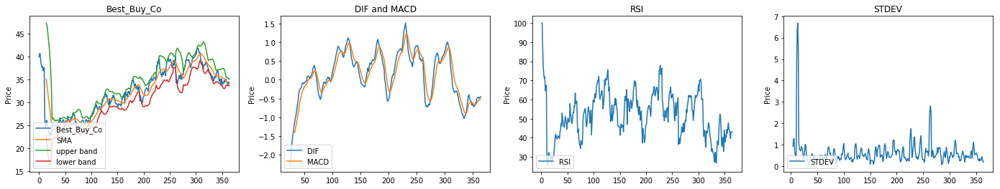

In [30]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Best_Buy_Co
SMA_Best_Buy_Co = calculate_SMA(SP500.Best_Buy_Co_Close)

SP500.Best_Buy_Co_Close[:365].plot(title='Best_Buy_Co',label='Best_Buy_Co', ax=axes[0])

SMA_Best_Buy_Co[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Best_Buy_Co
upper_band_Best_Buy_Co, lower_band_Best_Buy_Co = calculate_BB(SP500.Best_Buy_Co_Close)

upper_band_Best_Buy_Co[:365].plot(label='upper band', ax=axes[0])
lower_band_Best_Buy_Co[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Best_Buy_Co
DIF_Best_Buy_Co,MACD_Best_Buy_Co = calculate_MACD(SP500.Best_Buy_Co_Close)

DIF_Best_Buy_Co[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Best_Buy_Co[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Best_Buy_Co
RSI_Best_Buy_Co = calculate_RSI(SP500.Best_Buy_Co_Close)
RSI_Best_Buy_Co[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Best_Buy_Co
STDEV_Best_Buy_Co= calculate_stdev(SP500.Best_Buy_Co_Close)
STDEV_Best_Buy_Co[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Best_Buy_Co=SP500.Best_Buy_Co_Open - SP500.Best_Buy_Co_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




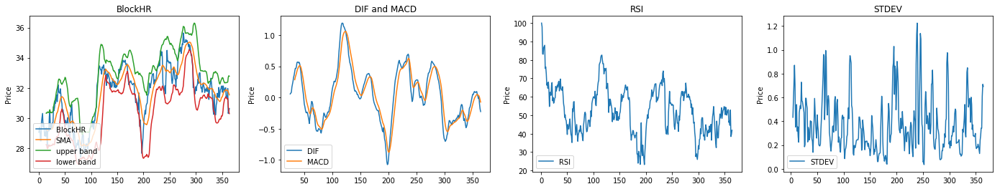

In [31]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for BlockHR
SMA_BlockHR = calculate_SMA(SP500.BlockHR_Close)

SP500.BlockHR_Close[:365].plot(title='BlockHR',label='BlockHR', ax=axes[0])

SMA_BlockHR[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for BlockHR
upper_band_BlockHR, lower_band_BlockHR = calculate_BB(SP500.BlockHR_Close)

upper_band_BlockHR[:365].plot(label='upper band', ax=axes[0])
lower_band_BlockHR[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for BlockHR
DIF_BlockHR,MACD_BlockHR = calculate_MACD(SP500.BlockHR_Close)

DIF_BlockHR[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_BlockHR[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for BlockHR
RSI_BlockHR = calculate_RSI(SP500.BlockHR_Close)
RSI_BlockHR[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for BlockHR
STDEV_BlockHR= calculate_stdev(SP500.BlockHR_Close)
STDEV_BlockHR[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_BlockHR=SP500.BlockHR_Open - SP500.BlockHR_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




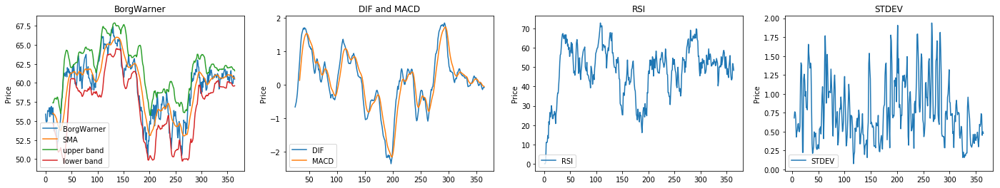

In [32]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for BorgWarner
SMA_BorgWarner = calculate_SMA(SP500.BorgWarner_Close)

SP500.BorgWarner_Close[:365].plot(title='BorgWarner',label='BorgWarner', ax=axes[0])

SMA_BorgWarner[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for BorgWarner
upper_band_BorgWarner, lower_band_BorgWarner = calculate_BB(SP500.BorgWarner_Close)

upper_band_BorgWarner[:365].plot(label='upper band', ax=axes[0])
lower_band_BorgWarner[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for BorgWarner
DIF_BorgWarner,MACD_BorgWarner = calculate_MACD(SP500.BorgWarner_Close)

DIF_BorgWarner[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_BorgWarner[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for BorgWarner
RSI_BorgWarner = calculate_RSI(SP500.BorgWarner_Close)
RSI_BorgWarner[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for BorgWarner
STDEV_BorgWarner= calculate_stdev(SP500.BorgWarner_Close)
STDEV_BorgWarner[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_BorgWarner=SP500.BorgWarner_Open - SP500.BorgWarner_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




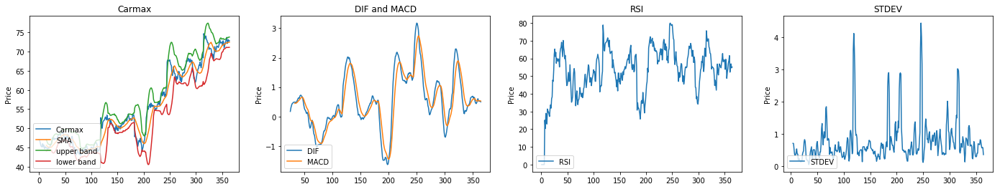

In [33]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Carmax
SMA_Carmax = calculate_SMA(SP500.Carmax_Close)

SP500.Carmax_Close[:365].plot(title='Carmax',label='Carmax', ax=axes[0])

SMA_Carmax[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Carmax
upper_band_Carmax, lower_band_Carmax = calculate_BB(SP500.Carmax_Close)

upper_band_Carmax[:365].plot(label='upper band', ax=axes[0])
lower_band_Carmax[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Carmax
DIF_Carmax,MACD_Carmax = calculate_MACD(SP500.Carmax_Close)

DIF_Carmax[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Carmax[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Carmax
RSI_Carmax = calculate_RSI(SP500.Carmax_Close)
RSI_Carmax[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Carmax
STDEV_Carmax= calculate_stdev(SP500.Carmax_Close)
STDEV_Carmax[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Carmax=SP500.Carmax_Open - SP500.Carmax_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




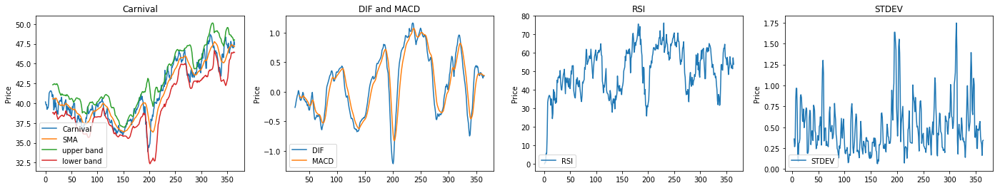

In [34]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Carnival
SMA_Carnival = calculate_SMA(SP500.Carnival_Close)

SP500.Carnival_Close[:365].plot(title='Carnival',label='Carnival', ax=axes[0])

SMA_Carnival[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Carnival
upper_band_Carnival, lower_band_Carnival = calculate_BB(SP500.Carnival_Close)

upper_band_Carnival[:365].plot(label='upper band', ax=axes[0])
lower_band_Carnival[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Carnival
DIF_Carnival,MACD_Carnival = calculate_MACD(SP500.Carnival_Close)

DIF_Carnival[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Carnival[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Carnival
RSI_Carnival = calculate_RSI(SP500.Carnival_Close)
RSI_Carnival[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Carnival
STDEV_Carnival= calculate_stdev(SP500.Carnival_Close)
STDEV_Carnival[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Carnival=SP500.Carnival_Open - SP500.Carnival_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




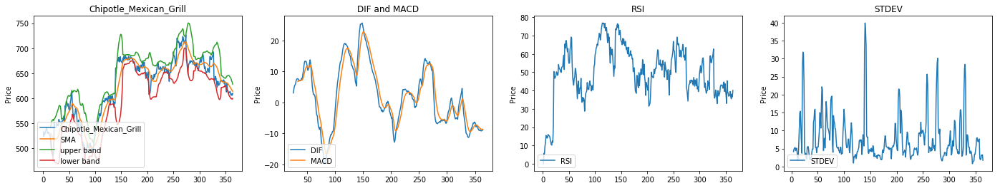

In [35]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Chipotle_Mexican_Grill
SMA_Chipotle_Mexican_Grill = calculate_SMA(SP500.Chipotle_Mexican_Grill_Close)

SP500.Chipotle_Mexican_Grill_Close[:365].plot(title='Chipotle_Mexican_Grill',label='Chipotle_Mexican_Grill', ax=axes[0])

SMA_Chipotle_Mexican_Grill[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Chipotle_Mexican_Grill
upper_band_Chipotle_Mexican_Grill, lower_band_Chipotle_Mexican_Grill = calculate_BB(SP500.Chipotle_Mexican_Grill_Close)

upper_band_Chipotle_Mexican_Grill[:365].plot(label='upper band', ax=axes[0])
lower_band_Chipotle_Mexican_Grill[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Chipotle_Mexican_Grill
DIF_Chipotle_Mexican_Grill,MACD_Chipotle_Mexican_Grill = calculate_MACD(SP500.Chipotle_Mexican_Grill_Close)

DIF_Chipotle_Mexican_Grill[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Chipotle_Mexican_Grill[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Chipotle_Mexican_Grill
RSI_Chipotle_Mexican_Grill = calculate_RSI(SP500.Chipotle_Mexican_Grill_Close)
RSI_Chipotle_Mexican_Grill[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Chipotle_Mexican_Grill
STDEV_Chipotle_Mexican_Grill= calculate_stdev(SP500.Chipotle_Mexican_Grill_Close)
STDEV_Chipotle_Mexican_Grill[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Chipotle_Mexican_Grill=SP500.Chipotle_Mexican_Grill_Open - SP500.Chipotle_Mexican_Grill_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




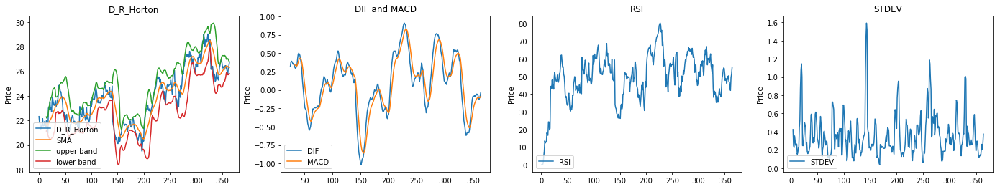

In [36]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for D_R_Horton
SMA_D_R_Horton = calculate_SMA(SP500.D_R_Horton_Close)

SP500.D_R_Horton_Close[:365].plot(title='D_R_Horton',label='D_R_Horton', ax=axes[0])

SMA_D_R_Horton[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for D_R_Horton
upper_band_D_R_Horton, lower_band_D_R_Horton = calculate_BB(SP500.D_R_Horton_Close)

upper_band_D_R_Horton[:365].plot(label='upper band', ax=axes[0])
lower_band_D_R_Horton[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for D_R_Horton
DIF_D_R_Horton,MACD_D_R_Horton = calculate_MACD(SP500.D_R_Horton_Close)

DIF_D_R_Horton[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_D_R_Horton[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for D_R_Horton
RSI_D_R_Horton = calculate_RSI(SP500.D_R_Horton_Close)
RSI_D_R_Horton[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for D_R_Horton
STDEV_D_R_Horton= calculate_stdev(SP500.D_R_Horton_Close)
STDEV_D_R_Horton[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_D_R_Horton=SP500.D_R_Horton_Open - SP500.D_R_Horton_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




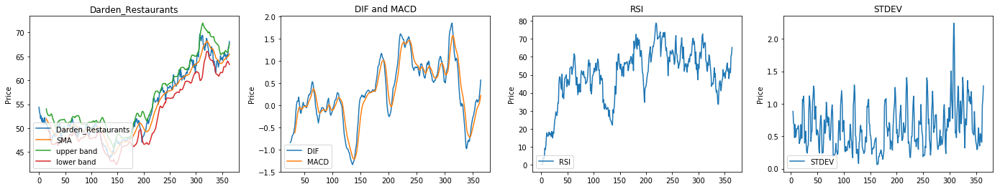

In [37]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Darden_Restaurants
SMA_Darden_Restaurants = calculate_SMA(SP500.Darden_Restaurants_Close)

SP500.Darden_Restaurants_Close[:365].plot(title='Darden_Restaurants',label='Darden_Restaurants', ax=axes[0])

SMA_Darden_Restaurants[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Darden_Restaurants
upper_band_Darden_Restaurants, lower_band_Darden_Restaurants = calculate_BB(SP500.Darden_Restaurants_Close)

upper_band_Darden_Restaurants[:365].plot(label='upper band', ax=axes[0])
lower_band_Darden_Restaurants[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Darden_Restaurants
DIF_Darden_Restaurants,MACD_Darden_Restaurants = calculate_MACD(SP500.Darden_Restaurants_Close)

DIF_Darden_Restaurants[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Darden_Restaurants[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Darden_Restaurants
RSI_Darden_Restaurants = calculate_RSI(SP500.Darden_Restaurants_Close)
RSI_Darden_Restaurants[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Darden_Restaurants
STDEV_Darden_Restaurants= calculate_stdev(SP500.Darden_Restaurants_Close)
STDEV_Darden_Restaurants[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Darden_Restaurants=SP500.Darden_Restaurants_Open - SP500.Darden_Restaurants_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




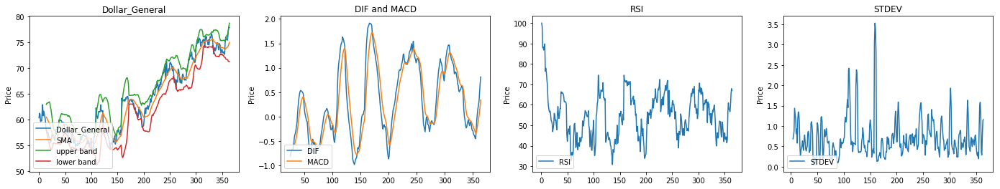

In [38]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Dollar_General
SMA_Dollar_General = calculate_SMA(SP500.Dollar_General_Close)

SP500.Dollar_General_Close[:365].plot(title='Dollar_General',label='Dollar_General', ax=axes[0])

SMA_Dollar_General[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Dollar_General
upper_band_Dollar_General, lower_band_Dollar_General = calculate_BB(SP500.Dollar_General_Close)

upper_band_Dollar_General[:365].plot(label='upper band', ax=axes[0])
lower_band_Dollar_General[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Dollar_General
DIF_Dollar_General,MACD_Dollar_General = calculate_MACD(SP500.Dollar_General_Close)

DIF_Dollar_General[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Dollar_General[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Dollar_General
RSI_Dollar_General = calculate_RSI(SP500.Dollar_General_Close)
RSI_Dollar_General[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Dollar_General
STDEV_Dollar_General= calculate_stdev(SP500.Dollar_General_Close)
STDEV_Dollar_General[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Dollar_General=SP500.Dollar_General_Open - SP500.Dollar_General_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




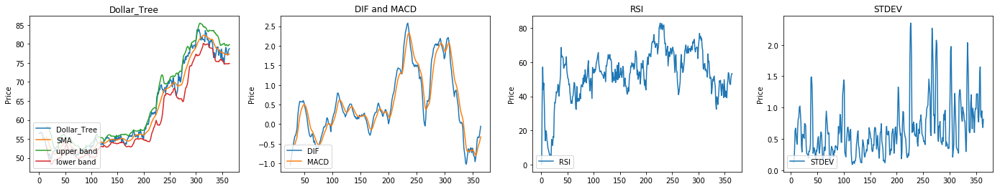

In [39]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Dollar_Tree
SMA_Dollar_Tree = calculate_SMA(SP500.Dollar_Tree_Close)

SP500.Dollar_Tree_Close[:365].plot(title='Dollar_Tree',label='Dollar_Tree', ax=axes[0])

SMA_Dollar_Tree[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Dollar_Tree
upper_band_Dollar_Tree, lower_band_Dollar_Tree = calculate_BB(SP500.Dollar_Tree_Close)

upper_band_Dollar_Tree[:365].plot(label='upper band', ax=axes[0])
lower_band_Dollar_Tree[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Dollar_Tree
DIF_Dollar_Tree,MACD_Dollar_Tree = calculate_MACD(SP500.Dollar_Tree_Close)

DIF_Dollar_Tree[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Dollar_Tree[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Dollar_Tree
RSI_Dollar_Tree = calculate_RSI(SP500.Dollar_Tree_Close)
RSI_Dollar_Tree[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Dollar_Tree
STDEV_Dollar_Tree= calculate_stdev(SP500.Dollar_Tree_Close)
STDEV_Dollar_Tree[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Dollar_Tree=SP500.Dollar_Tree_Open - SP500.Dollar_Tree_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




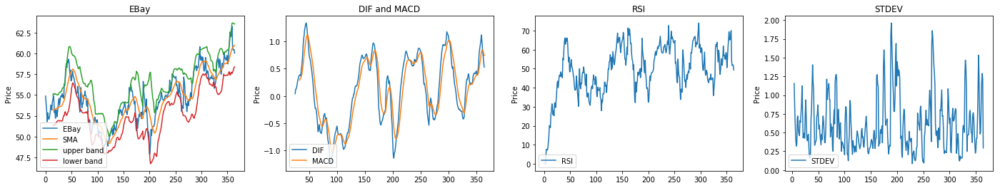

In [40]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for EBay
SMA_eBay = calculate_SMA(SP500.eBay_Close)

SP500.eBay_Close[:365].plot(title='EBay',label='EBay', ax=axes[0])

SMA_eBay[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for EBay
upper_band_eBay, lower_band_eBay = calculate_BB(SP500.eBay_Close)

upper_band_eBay[:365].plot(label='upper band', ax=axes[0])
lower_band_eBay[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for EBay
DIF_eBay,MACD_eBay = calculate_MACD(SP500.eBay_Close)

DIF_eBay[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_eBay[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for EBay
RSI_eBay = calculate_RSI(SP500.eBay_Close)
RSI_eBay[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for EBay
STDEV_eBay= calculate_stdev(SP500.eBay_Close)
STDEV_eBay[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_EBay=SP500.eBay_Open - SP500.eBay_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




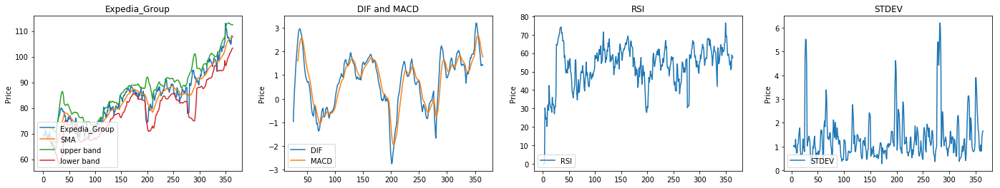

In [41]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Expedia_Group
SMA_Expedia_Group = calculate_SMA(SP500.Expedia_Group_Close)

SP500.Expedia_Group_Close[:365].plot(title='Expedia_Group',label='Expedia_Group', ax=axes[0])

SMA_Expedia_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Expedia_Group
upper_band_Expedia_Group, lower_band_Expedia_Group = calculate_BB(SP500.Expedia_Group_Close)

upper_band_Expedia_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Expedia_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Expedia_Group
DIF_Expedia_Group,MACD_Expedia_Group = calculate_MACD(SP500.Expedia_Group_Close)

DIF_Expedia_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Expedia_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Expedia_Group
RSI_Expedia_Group = calculate_RSI(SP500.Expedia_Group_Close)
RSI_Expedia_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Expedia_Group
STDEV_Expedia_Group= calculate_stdev(SP500.Expedia_Group_Close)
STDEV_Expedia_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Expedia_Group=SP500.Expedia_Group_Open - SP500.Expedia_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




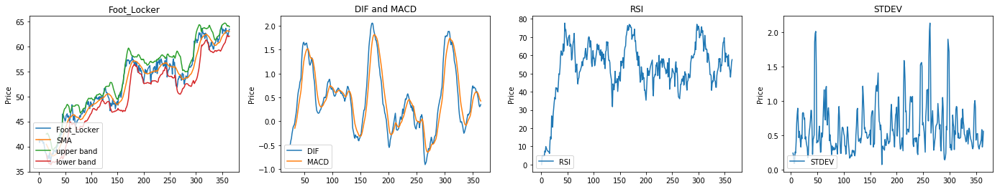

In [42]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Foot_Locker
SMA_Foot_Locker = calculate_SMA(SP500.Foot_Locker_Close)

SP500.Foot_Locker_Close[:365].plot(title='Foot_Locker',label='Foot_Locker', ax=axes[0])

SMA_Foot_Locker[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Foot_Locker
upper_band_Foot_Locker, lower_band_Foot_Locker = calculate_BB(SP500.Foot_Locker_Close)

upper_band_Foot_Locker[:365].plot(label='upper band', ax=axes[0])
lower_band_Foot_Locker[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Foot_Locker
DIF_Foot_Locker,MACD_Foot_Locker = calculate_MACD(SP500.Foot_Locker_Close)

DIF_Foot_Locker[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Foot_Locker[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Foot_Locker
RSI_Foot_Locker = calculate_RSI(SP500.Foot_Locker_Close)
RSI_Foot_Locker[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Foot_Locker
STDEV_Foot_Locker= calculate_stdev(SP500.Foot_Locker_Close)
STDEV_Foot_Locker[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Foot_Locker=SP500.Foot_Locker_Open - SP500.Foot_Locker_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




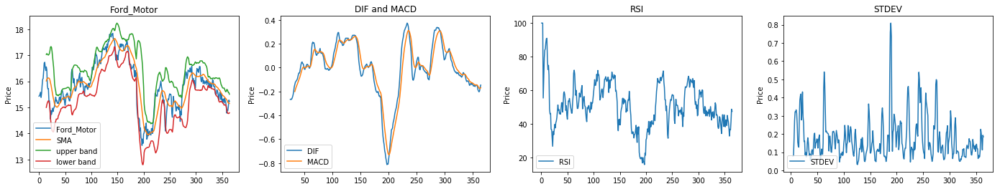

In [43]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ford_Motor
SMA_Ford_Motor = calculate_SMA(SP500.Ford_Motor_Close)

SP500.Ford_Motor_Close[:365].plot(title='Ford_Motor',label='Ford_Motor', ax=axes[0])

SMA_Ford_Motor[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ford_Motor
upper_band_Ford_Motor, lower_band_Ford_Motor = calculate_BB(SP500.Ford_Motor_Close)

upper_band_Ford_Motor[:365].plot(label='upper band', ax=axes[0])
lower_band_Ford_Motor[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ford_Motor
DIF_Ford_Motor,MACD_Ford_Motor = calculate_MACD(SP500.Ford_Motor_Close)

DIF_Ford_Motor[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ford_Motor[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ford_Motor
RSI_Ford_Motor = calculate_RSI(SP500.Ford_Motor_Close)
RSI_Ford_Motor[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ford_Motor
STDEV_Ford_Motor= calculate_stdev(SP500.Ford_Motor_Close)
STDEV_Ford_Motor[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ford_Motor=SP500.Ford_Motor_Open - SP500.Ford_Motor_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




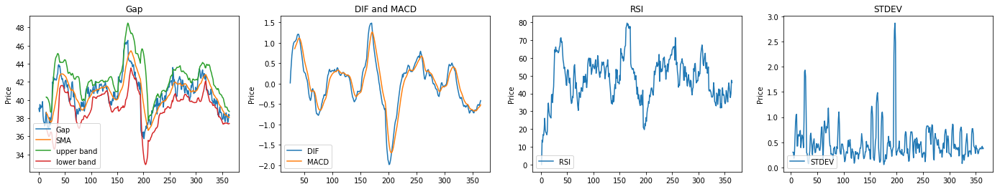

In [44]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Gap
SMA_Gap = calculate_SMA(SP500.Gap_Close)

SP500.Gap_Close[:365].plot(title='Gap',label='Gap', ax=axes[0])

SMA_Gap[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Gap
upper_band_Gap, lower_band_Gap = calculate_BB(SP500.Gap_Close)

upper_band_Gap[:365].plot(label='upper band', ax=axes[0])
lower_band_Gap[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Gap
DIF_Gap,MACD_Gap = calculate_MACD(SP500.Gap_Close)

DIF_Gap[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Gap[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Gap
RSI_Gap = calculate_RSI(SP500.Gap_Close)
RSI_Gap[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Gap
STDEV_Gap= calculate_stdev(SP500.Gap_Close)
STDEV_Gap[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Gap=SP500.Gap_Open - SP500.Gap_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




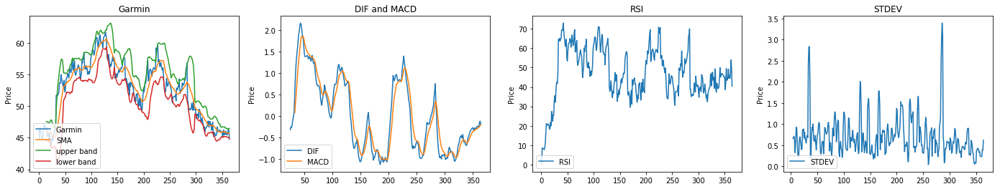

In [45]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Garmin
SMA_Garmin = calculate_SMA(SP500.Garmin_Close)

SP500.Garmin_Close[:365].plot(title='Garmin',label='Garmin', ax=axes[0])

SMA_Garmin[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Garmin
upper_band_Garmin, lower_band_Garmin = calculate_BB(SP500.Garmin_Close)

upper_band_Garmin[:365].plot(label='upper band', ax=axes[0])
lower_band_Garmin[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Garmin
DIF_Garmin,MACD_Garmin = calculate_MACD(SP500.Garmin_Close)

DIF_Garmin[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Garmin[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Garmin
RSI_Garmin = calculate_RSI(SP500.Garmin_Close)
RSI_Garmin[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Garmin
STDEV_Garmin= calculate_stdev(SP500.Garmin_Close)
STDEV_Garmin[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Garmin=SP500.Garmin_Open - SP500.Garmin_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




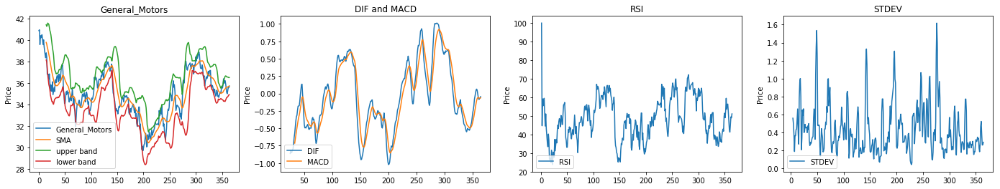

In [46]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for General_Motors
SMA_General_Motors = calculate_SMA(SP500.General_Motors_Close)

SP500.General_Motors_Close[:365].plot(title='General_Motors',label='General_Motors', ax=axes[0])

SMA_General_Motors[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for General_Motors
upper_band_General_Motors, lower_band_General_Motors = calculate_BB(SP500.General_Motors_Close)

upper_band_General_Motors[:365].plot(label='upper band', ax=axes[0])
lower_band_General_Motors[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for General_Motors
DIF_General_Motors,MACD_General_Motors = calculate_MACD(SP500.General_Motors_Close)

DIF_General_Motors[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_General_Motors[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for General_Motors
RSI_General_Motors = calculate_RSI(SP500.General_Motors_Close)
RSI_General_Motors[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for General_Motors
STDEV_General_Motors= calculate_stdev(SP500.General_Motors_Close)
STDEV_General_Motors[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_General_Motors=SP500.General_Motors_Open - SP500.General_Motors_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




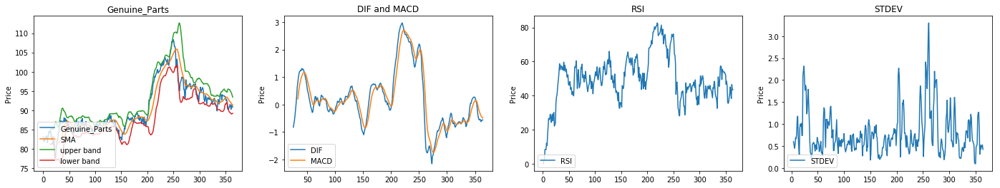

In [47]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Genuine_Parts
SMA_Genuine_Parts = calculate_SMA(SP500.Genuine_Parts_Close)

SP500.Genuine_Parts_Close[:365].plot(title='Genuine_Parts',label='Genuine_Parts', ax=axes[0])

SMA_Genuine_Parts[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Genuine_Parts
upper_band_Genuine_Parts, lower_band_Genuine_Parts = calculate_BB(SP500.Genuine_Parts_Close)

upper_band_Genuine_Parts[:365].plot(label='upper band', ax=axes[0])
lower_band_Genuine_Parts[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Genuine_Parts
DIF_Genuine_Parts,MACD_Genuine_Parts = calculate_MACD(SP500.Genuine_Parts_Close)

DIF_Genuine_Parts[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Genuine_Parts[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Genuine_Parts
RSI_Genuine_Parts = calculate_RSI(SP500.Genuine_Parts_Close)
RSI_Genuine_Parts[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Genuine_Parts
STDEV_Genuine_Parts= calculate_stdev(SP500.Genuine_Parts_Close)
STDEV_Genuine_Parts[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Genuine_Parts=SP500.Genuine_Parts_Open - SP500.Genuine_Parts_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




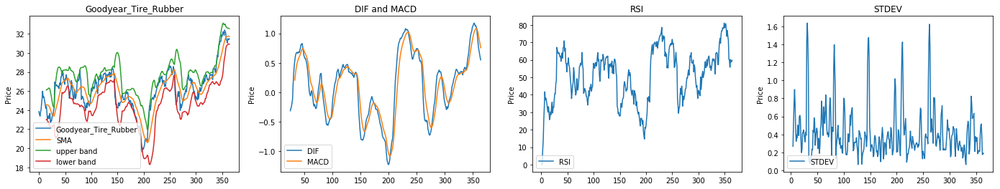

In [48]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Goodyear_Tire_Rubber
SMA_Goodyear_Tire_Rubber = calculate_SMA(SP500.Goodyear_Tire_Rubber_Close)

SP500.Goodyear_Tire_Rubber_Close[:365].plot(title='Goodyear_Tire_Rubber',label='Goodyear_Tire_Rubber', ax=axes[0])

SMA_Goodyear_Tire_Rubber[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Goodyear_Tire_Rubber
upper_band_Goodyear_Tire_Rubber, lower_band_Goodyear_Tire_Rubber = calculate_BB(SP500.Goodyear_Tire_Rubber_Close)

upper_band_Goodyear_Tire_Rubber[:365].plot(label='upper band', ax=axes[0])
lower_band_Goodyear_Tire_Rubber[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Goodyear_Tire_Rubber
DIF_Goodyear_Tire_Rubber,MACD_Goodyear_Tire_Rubber = calculate_MACD(SP500.Goodyear_Tire_Rubber_Close)

DIF_Goodyear_Tire_Rubber[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Goodyear_Tire_Rubber[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Goodyear_Tire_Rubber
RSI_Goodyear_Tire_Rubber = calculate_RSI(SP500.Goodyear_Tire_Rubber_Close)
RSI_Goodyear_Tire_Rubber[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Goodyear_Tire_Rubber
STDEV_Goodyear_Tire_Rubber= calculate_stdev(SP500.Goodyear_Tire_Rubber_Close)
STDEV_Goodyear_Tire_Rubber[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Goodyear_Tire_Rubber=SP500.Goodyear_Tire_Rubber_Open - SP500.Goodyear_Tire_Rubber_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




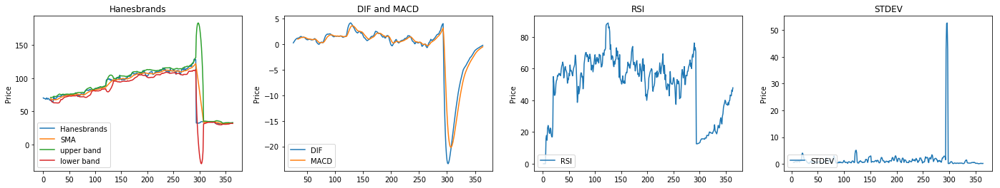

In [49]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Hanesbrands
SMA_Hanesbrands = calculate_SMA(SP500.Hanesbrands_Close)

SP500.Hanesbrands_Close[:365].plot(title='Hanesbrands',label='Hanesbrands', ax=axes[0])

SMA_Hanesbrands[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Hanesbrands
upper_band_Hanesbrands, lower_band_Hanesbrands = calculate_BB(SP500.Hanesbrands_Close)

upper_band_Hanesbrands[:365].plot(label='upper band', ax=axes[0])
lower_band_Hanesbrands[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Hanesbrands
DIF_Hanesbrands,MACD_Hanesbrands = calculate_MACD(SP500.Hanesbrands_Close)

DIF_Hanesbrands[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Hanesbrands[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Hanesbrands
RSI_Hanesbrands = calculate_RSI(SP500.Hanesbrands_Close)
RSI_Hanesbrands[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Hanesbrands
STDEV_Hanesbrands= calculate_stdev(SP500.Hanesbrands_Close)
STDEV_Hanesbrands[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Hanesbrands=SP500.Hanesbrands_Open - SP500.Hanesbrands_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




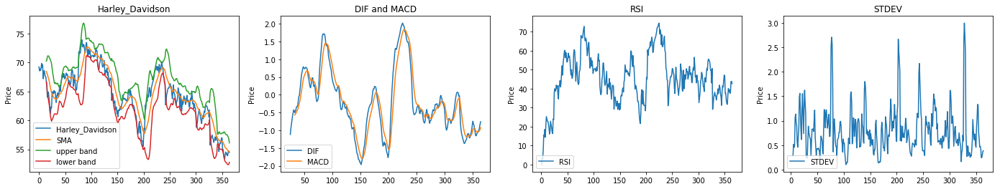

In [50]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Harley_Davidson
SMA_Harley_Davidson = calculate_SMA(SP500.Harley_Davidson_Close)

SP500.Harley_Davidson_Close[:365].plot(title='Harley_Davidson',label='Harley_Davidson', ax=axes[0])

SMA_Harley_Davidson[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Harley_Davidson
upper_band_Harley_Davidson, lower_band_Harley_Davidson = calculate_BB(SP500.Harley_Davidson_Close)

upper_band_Harley_Davidson[:365].plot(label='upper band', ax=axes[0])
lower_band_Harley_Davidson[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Harley_Davidson
DIF_Harley_Davidson,MACD_Harley_Davidson = calculate_MACD(SP500.Harley_Davidson_Close)

DIF_Harley_Davidson[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Harley_Davidson[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Harley_Davidson
RSI_Harley_Davidson = calculate_RSI(SP500.Harley_Davidson_Close)
RSI_Harley_Davidson[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Harley_Davidson
STDEV_Harley_Davidson= calculate_stdev(SP500.Harley_Davidson_Close)
STDEV_Harley_Davidson[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Harley_Davidson=SP500.Harley_Davidson_Open - SP500.Harley_Davidson_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




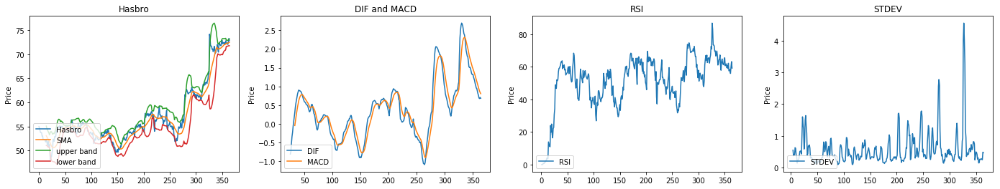

In [51]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Hasbro
SMA_Hasbro = calculate_SMA(SP500.Hasbro_Close)

SP500.Hasbro_Close[:365].plot(title='Hasbro',label='Hasbro', ax=axes[0])

SMA_Hasbro[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Hasbro
upper_band_Hasbro, lower_band_Hasbro = calculate_BB(SP500.Hasbro_Close)

upper_band_Hasbro[:365].plot(label='upper band', ax=axes[0])
lower_band_Hasbro[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Hasbro
DIF_Hasbro,MACD_Hasbro = calculate_MACD(SP500.Hasbro_Close)

DIF_Hasbro[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Hasbro[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Hasbro
RSI_Hasbro = calculate_RSI(SP500.Hasbro_Close)
RSI_Hasbro[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Hasbro
STDEV_Hasbro= calculate_stdev(SP500.Hasbro_Close)
STDEV_Hasbro[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Hasbro=SP500.Hasbro_Open - SP500.Hasbro_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




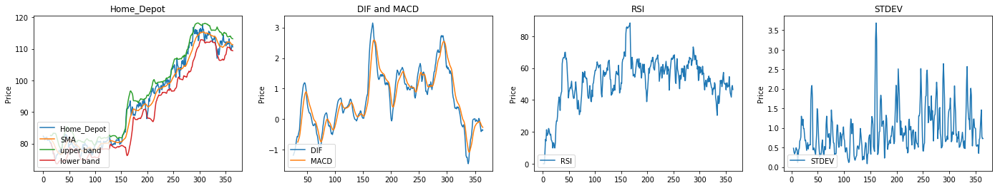

In [52]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Home_Depot
SMA_Home_Depot = calculate_SMA(SP500.Home_Depot_Close)

SP500.Home_Depot_Close[:365].plot(title='Home_Depot',label='Home_Depot', ax=axes[0])

SMA_Home_Depot[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Home_Depot
upper_band_Home_Depot, lower_band_Home_Depot = calculate_BB(SP500.Home_Depot_Close)

upper_band_Home_Depot[:365].plot(label='upper band', ax=axes[0])
lower_band_Home_Depot[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Home_Depot
DIF_Home_Depot,MACD_Home_Depot = calculate_MACD(SP500.Home_Depot_Close)

DIF_Home_Depot[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Home_Depot[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Home_Depot
RSI_Home_Depot = calculate_RSI(SP500.Home_Depot_Close)
RSI_Home_Depot[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Home_Depot
STDEV_Home_Depot= calculate_stdev(SP500.Home_Depot_Close)
STDEV_Home_Depot[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Home_Depot=SP500.Home_Depot_Open - SP500.Home_Depot_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




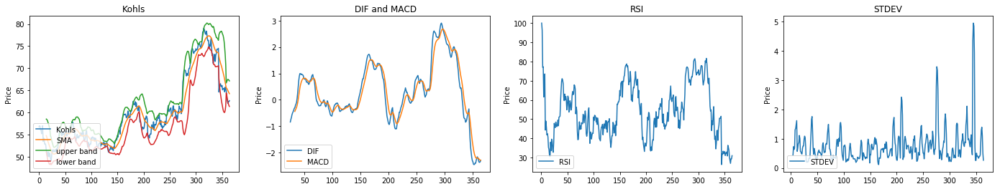

In [53]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Kohls
SMA_Kohls = calculate_SMA(SP500.Kohls_Close)

SP500.Kohls_Close[:365].plot(title='Kohls',label='Kohls', ax=axes[0])

SMA_Kohls[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Kohls
upper_band_Kohls, lower_band_Kohls = calculate_BB(SP500.Kohls_Close)

upper_band_Kohls[:365].plot(label='upper band', ax=axes[0])
lower_band_Kohls[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Kohls
DIF_Kohls,MACD_Kohls = calculate_MACD(SP500.Kohls_Close)

DIF_Kohls[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Kohls[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Kohls
RSI_Kohls = calculate_RSI(SP500.Kohls_Close)
RSI_Kohls[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Kohls
STDEV_Kohls= calculate_stdev(SP500.Kohls_Close)
STDEV_Kohls[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Kohls=SP500.Kohls_Open - SP500.Kohls_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




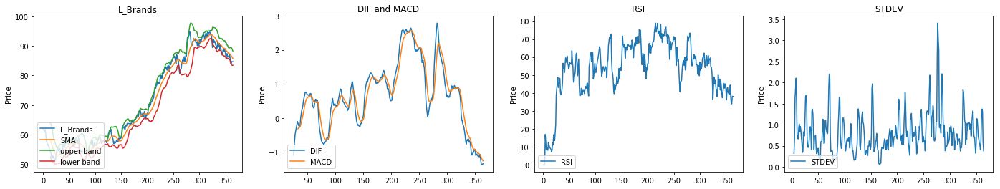

In [54]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for L_Brands
SMA_L_Brands = calculate_SMA(SP500.L_Brands_Close)

SP500.L_Brands_Close[:365].plot(title='L_Brands',label='L_Brands', ax=axes[0])

SMA_L_Brands[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for L_Brands
upper_band_L_Brands, lower_band_L_Brands = calculate_BB(SP500.L_Brands_Close)

upper_band_L_Brands[:365].plot(label='upper band', ax=axes[0])
lower_band_L_Brands[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for L_Brands
DIF_L_Brands,MACD_L_Brands = calculate_MACD(SP500.L_Brands_Close)

DIF_L_Brands[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_L_Brands[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for L_Brands
RSI_L_Brands = calculate_RSI(SP500.L_Brands_Close)
RSI_L_Brands[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for L_Brands
STDEV_L_Brands= calculate_stdev(SP500.L_Brands_Close)
STDEV_L_Brands[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_L_Brands=SP500.L_Brands_Open - SP500.L_Brands_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




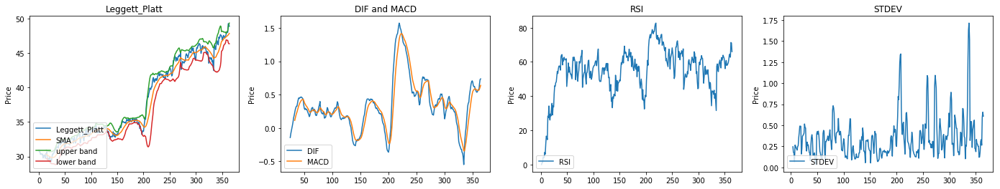

In [55]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Leggett_Platt
SMA_Leggett_Platt = calculate_SMA(SP500.Leggett_Platt_Close)

SP500.Leggett_Platt_Close[:365].plot(title='Leggett_Platt',label='Leggett_Platt', ax=axes[0])

SMA_Leggett_Platt[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Leggett_Platt
upper_band_Leggett_Platt, lower_band_Leggett_Platt = calculate_BB(SP500.Leggett_Platt_Close)

upper_band_Leggett_Platt[:365].plot(label='upper band', ax=axes[0])
lower_band_Leggett_Platt[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Leggett_Platt
DIF_Leggett_Platt,MACD_Leggett_Platt = calculate_MACD(SP500.Leggett_Platt_Close)

DIF_Leggett_Platt[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Leggett_Platt[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Leggett_Platt
RSI_Leggett_Platt = calculate_RSI(SP500.Leggett_Platt_Close)
RSI_Leggett_Platt[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Leggett_Platt
STDEV_Leggett_Platt= calculate_stdev(SP500.Leggett_Platt_Close)
STDEV_Leggett_Platt[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Leggett_Platt=SP500.Leggett_Platt_Open - SP500.Leggett_Platt_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




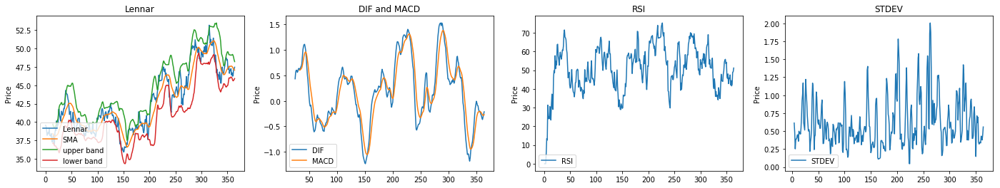

In [56]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Lennar
SMA_Lennar = calculate_SMA(SP500.Lennar_Close)

SP500.Lennar_Close[:365].plot(title='Lennar',label='Lennar', ax=axes[0])

SMA_Lennar[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Lennar
upper_band_Lennar, lower_band_Lennar = calculate_BB(SP500.Lennar_Close)

upper_band_Lennar[:365].plot(label='upper band', ax=axes[0])
lower_band_Lennar[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Lennar
DIF_Lennar,MACD_Lennar = calculate_MACD(SP500.Lennar_Close)

DIF_Lennar[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Lennar[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Lennar
RSI_Lennar = calculate_RSI(SP500.Lennar_Close)
RSI_Lennar[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Lennar
STDEV_Lennar= calculate_stdev(SP500.Lennar_Close)
STDEV_Lennar[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Lennar=SP500.Lennar_Open - SP500.Lennar_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




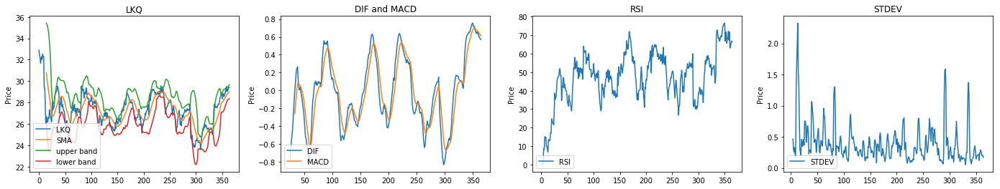

In [57]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for LKQ
SMA_LKQ = calculate_SMA(SP500.LKQ_Close)

SP500.LKQ_Close[:365].plot(title='LKQ',label='LKQ', ax=axes[0])

SMA_LKQ[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for LKQ
upper_band_LKQ, lower_band_LKQ = calculate_BB(SP500.LKQ_Close)

upper_band_LKQ[:365].plot(label='upper band', ax=axes[0])
lower_band_LKQ[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for LKQ
DIF_LKQ,MACD_LKQ = calculate_MACD(SP500.LKQ_Close)

DIF_LKQ[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_LKQ[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for LKQ
RSI_LKQ = calculate_RSI(SP500.LKQ_Close)
RSI_LKQ[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for LKQ
STDEV_LKQ= calculate_stdev(SP500.LKQ_Close)
STDEV_LKQ[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_LKQ=SP500.LKQ_Open - SP500.LKQ_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




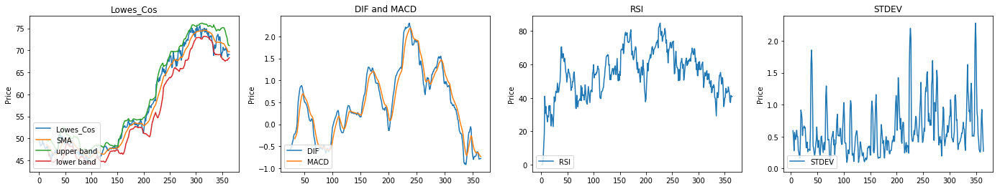

In [58]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Lowes_Cos
SMA_Lowes_Cos = calculate_SMA(SP500.Lowes_Cos_Close)

SP500.Lowes_Cos_Close[:365].plot(title='Lowes_Cos',label='Lowes_Cos', ax=axes[0])

SMA_Lowes_Cos[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Lowes_Cos
upper_band_Lowes_Cos, lower_band_Lowes_Cos = calculate_BB(SP500.Lowes_Cos_Close)

upper_band_Lowes_Cos[:365].plot(label='upper band', ax=axes[0])
lower_band_Lowes_Cos[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Lowes_Cos
DIF_Lowes_Cos,MACD_Lowes_Cos = calculate_MACD(SP500.Lowes_Cos_Close)

DIF_Lowes_Cos[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Lowes_Cos[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Lowes_Cos
RSI_Lowes_Cos = calculate_RSI(SP500.Lowes_Cos_Close)
RSI_Lowes_Cos[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Lowes_Cos
STDEV_Lowes_Cos= calculate_stdev(SP500.Lowes_Cos_Close)
STDEV_Lowes_Cos[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Lowes_Cos=SP500.Lowes_Cos_Open - SP500.Lowes_Cos_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





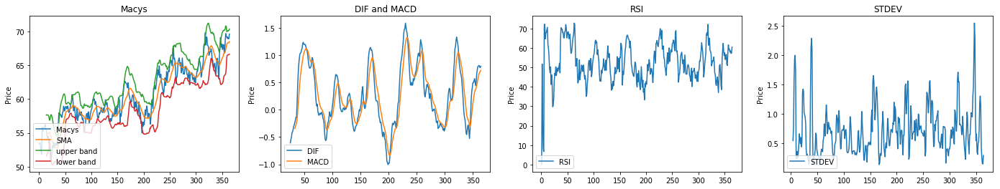

In [59]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Macys
SMA_Macys = calculate_SMA(SP500.Macys_Close)

SP500.Macys_Close[:365].plot(title='Macys',label='Macys', ax=axes[0])

SMA_Macys[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Macys
upper_band_Macys, lower_band_Macys = calculate_BB(SP500.Macys_Close)

upper_band_Macys[:365].plot(label='upper band', ax=axes[0])
lower_band_Macys[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Macys
DIF_Macys,MACD_Macys = calculate_MACD(SP500.Macys_Close)

DIF_Macys[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Macys[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Macys
RSI_Macys = calculate_RSI(SP500.Macys_Close)
RSI_Macys[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Macys
STDEV_Macys= calculate_stdev(SP500.Macys_Close)
STDEV_Macys[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Macys=SP500.Macys_Open - SP500.Macys_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





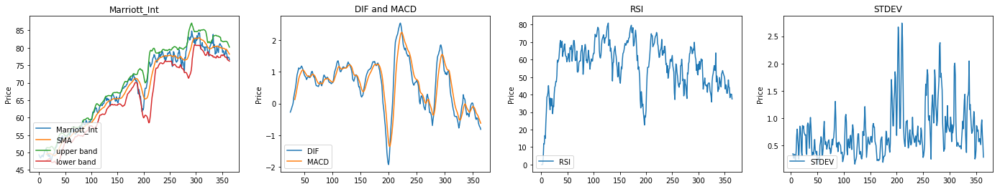

In [60]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Marriott_Int
SMA_Marriott_Int = calculate_SMA(SP500.Marriott_Int_Close)

SP500.Marriott_Int_Close[:365].plot(title='Marriott_Int',label='Marriott_Int', ax=axes[0])

SMA_Marriott_Int[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Marriott_Int
upper_band_Marriott_Int, lower_band_Marriott_Int = calculate_BB(SP500.Marriott_Int_Close)

upper_band_Marriott_Int[:365].plot(label='upper band', ax=axes[0])
lower_band_Marriott_Int[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Marriott_Int
DIF_Marriott_Int,MACD_Marriott_Int = calculate_MACD(SP500.Marriott_Int_Close)

DIF_Marriott_Int[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Marriott_Int[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Marriott_Int
RSI_Marriott_Int = calculate_RSI(SP500.Marriott_Int_Close)
RSI_Marriott_Int[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Marriott_Int
STDEV_Marriott_Int= calculate_stdev(SP500.Marriott_Int_Close)
STDEV_Marriott_Int[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Marriott_Int=SP500.Marriott_Int_Open - SP500.Marriott_Int_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





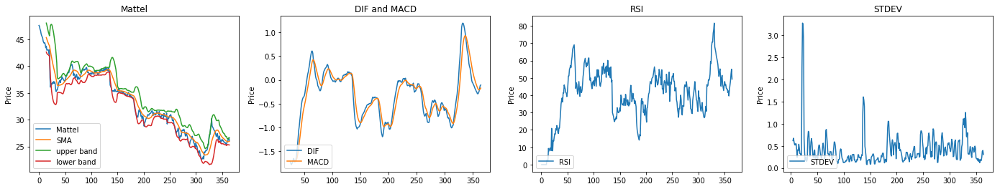

In [61]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Mattel
SMA_Mattel = calculate_SMA(SP500.Mattel_Close)

SP500.Mattel_Close[:365].plot(title='Mattel',label='Mattel', ax=axes[0])

SMA_Mattel[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Mattel
upper_band_Mattel, lower_band_Mattel = calculate_BB(SP500.Mattel_Close)

upper_band_Mattel[:365].plot(label='upper band', ax=axes[0])
lower_band_Mattel[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Mattel
DIF_Mattel,MACD_Mattel = calculate_MACD(SP500.Mattel_Close)

DIF_Mattel[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Mattel[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Mattel
RSI_Mattel = calculate_RSI(SP500.Mattel_Close)
RSI_Mattel[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Mattel
STDEV_Mattel= calculate_stdev(SP500.Mattel_Close)
STDEV_Mattel[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Mattel=SP500.Mattel_Open - SP500.Mattel_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





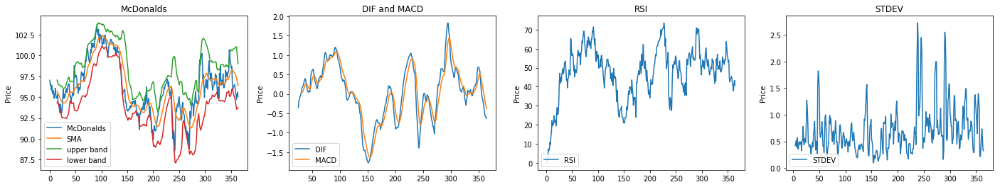

In [62]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for McDonalds
SMA_McDonalds = calculate_SMA(SP500.McDonalds_Close)

SP500.McDonalds_Close[:365].plot(title='McDonalds',label='McDonalds', ax=axes[0])

SMA_McDonalds[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for McDonalds
upper_band_McDonalds, lower_band_McDonalds = calculate_BB(SP500.McDonalds_Close)

upper_band_McDonalds[:365].plot(label='upper band', ax=axes[0])
lower_band_McDonalds[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for McDonalds
DIF_McDonalds,MACD_McDonalds = calculate_MACD(SP500.McDonalds_Close)

DIF_McDonalds[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_McDonalds[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for McDonalds
RSI_McDonalds = calculate_RSI(SP500.McDonalds_Close)
RSI_McDonalds[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for McDonalds
STDEV_McDonalds= calculate_stdev(SP500.McDonalds_Close)
STDEV_McDonalds[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_McDonalds=SP500.McDonalds_Open - SP500.McDonalds_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





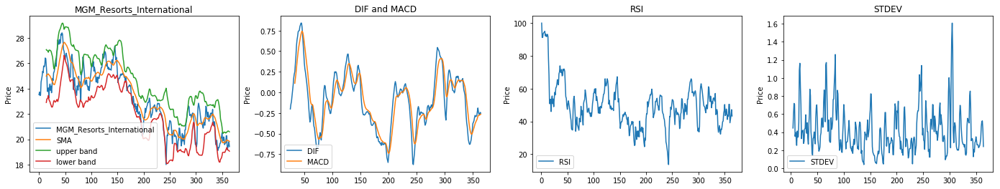

In [63]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for MGM_Resorts_International
SMA_MGM_Resorts_International = calculate_SMA(SP500.MGM_Resorts_International_Close)

SP500.MGM_Resorts_International_Close[:365].plot(title='MGM_Resorts_International',label='MGM_Resorts_International', ax=axes[0])

SMA_MGM_Resorts_International[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for MGM_Resorts_International
upper_band_MGM_Resorts_International, lower_band_MGM_Resorts_International = calculate_BB(SP500.MGM_Resorts_International_Close)

upper_band_MGM_Resorts_International[:365].plot(label='upper band', ax=axes[0])
lower_band_MGM_Resorts_International[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for MGM_Resorts_International
DIF_MGM_Resorts_International,MACD_MGM_Resorts_International = calculate_MACD(SP500.MGM_Resorts_International_Close)

DIF_MGM_Resorts_International[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_MGM_Resorts_International[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for MGM_Resorts_International
RSI_MGM_Resorts_International = calculate_RSI(SP500.MGM_Resorts_International_Close)
RSI_MGM_Resorts_International[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for MGM_Resorts_International
STDEV_MGM_Resorts_International= calculate_stdev(SP500.MGM_Resorts_International_Close)
STDEV_MGM_Resorts_International[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_MGM_Resorts_International=SP500.MGM_Resorts_International_Open - SP500.MGM_Resorts_International_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





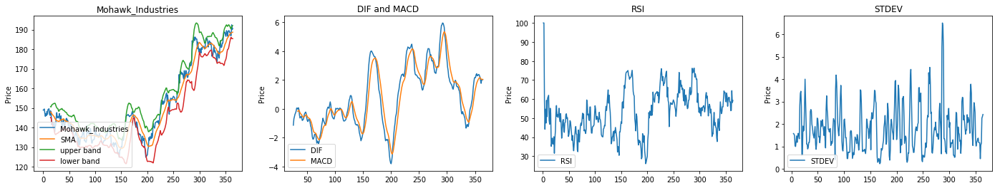

In [64]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Mohawk_Industries
SMA_Mohawk_Industries = calculate_SMA(SP500.Mohawk_Industries_Close)

SP500.Mohawk_Industries_Close[:365].plot(title='Mohawk_Industries',label='Mohawk_Industries', ax=axes[0])

SMA_Mohawk_Industries[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Mohawk_Industries
upper_band_Mohawk_Industries, lower_band_Mohawk_Industries = calculate_BB(SP500.Mohawk_Industries_Close)

upper_band_Mohawk_Industries[:365].plot(label='upper band', ax=axes[0])
lower_band_Mohawk_Industries[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Mohawk_Industries
DIF_Mohawk_Industries,MACD_Mohawk_Industries = calculate_MACD(SP500.Mohawk_Industries_Close)

DIF_Mohawk_Industries[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Mohawk_Industries[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Mohawk_Industries
RSI_Mohawk_Industries = calculate_RSI(SP500.Mohawk_Industries_Close)
RSI_Mohawk_Industries[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Mohawk_Industries
STDEV_Mohawk_Industries= calculate_stdev(SP500.Mohawk_Industries_Close)
STDEV_Mohawk_Industries[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Mohawk_Industries=SP500.Mohawk_Industries_Open - SP500.Mohawk_Industries_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





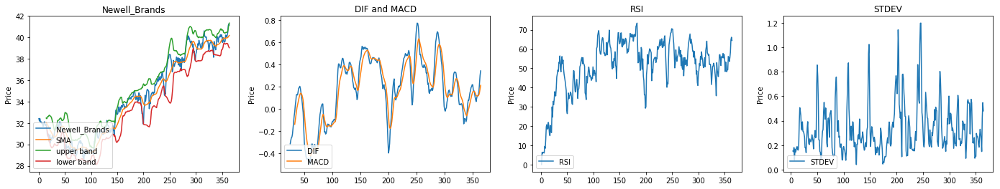

In [65]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Newell_Brands
SMA_Newell_Brands = calculate_SMA(SP500.Newell_Brands_Close)

SP500.Newell_Brands_Close[:365].plot(title='Newell_Brands',label='Newell_Brands', ax=axes[0])

SMA_Newell_Brands[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Newell_Brands
upper_band_Newell_Brands, lower_band_Newell_Brands = calculate_BB(SP500.Newell_Brands_Close)

upper_band_Newell_Brands[:365].plot(label='upper band', ax=axes[0])
lower_band_Newell_Brands[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Newell_Brands
DIF_Newell_Brands,MACD_Newell_Brands = calculate_MACD(SP500.Newell_Brands_Close)

DIF_Newell_Brands[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Newell_Brands[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Newell_Brands
RSI_Newell_Brands = calculate_RSI(SP500.Newell_Brands_Close)
RSI_Newell_Brands[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Newell_Brands
STDEV_Newell_Brands= calculate_stdev(SP500.Newell_Brands_Close)
STDEV_Newell_Brands[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Newell_Brands=SP500.Newell_Brands_Open - SP500.Newell_Brands_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





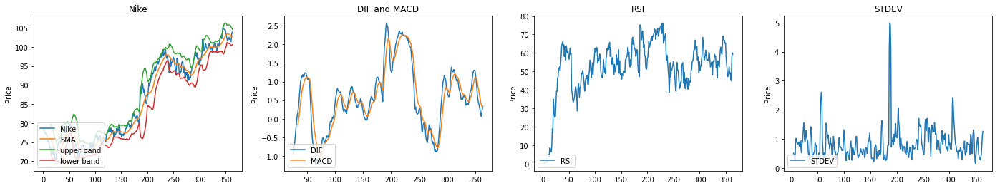

In [66]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Nike
SMA_Nike = calculate_SMA(SP500.Nike_Close)

SP500.Nike_Close[:365].plot(title='Nike',label='Nike', ax=axes[0])

SMA_Nike[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Nike
upper_band_Nike, lower_band_Nike = calculate_BB(SP500.Nike_Close)

upper_band_Nike[:365].plot(label='upper band', ax=axes[0])
lower_band_Nike[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Nike
DIF_Nike,MACD_Nike = calculate_MACD(SP500.Nike_Close)

DIF_Nike[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Nike[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Nike
RSI_Nike = calculate_RSI(SP500.Nike_Close)
RSI_Nike[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Nike
STDEV_Nike= calculate_stdev(SP500.Nike_Close)
STDEV_Nike[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Nike=SP500.Nike_Open - SP500.Nike_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



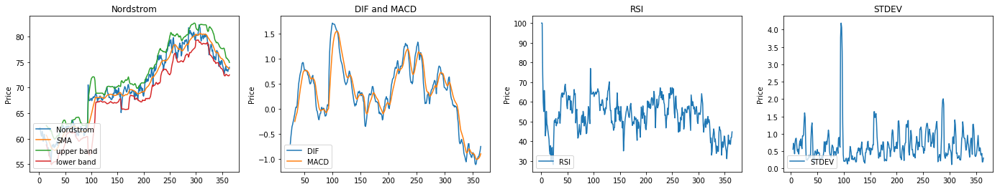

In [67]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Nordstrom
SMA_Nordstrom = calculate_SMA(SP500.Nordstrom_Close)

SP500.Nordstrom_Close[:365].plot(title='Nordstrom',label='Nordstrom', ax=axes[0])

SMA_Nordstrom[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Nordstrom
upper_band_Nordstrom, lower_band_Nordstrom = calculate_BB(SP500.Nordstrom_Close)

upper_band_Nordstrom[:365].plot(label='upper band', ax=axes[0])
lower_band_Nordstrom[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Nordstrom
DIF_Nordstrom,MACD_Nordstrom = calculate_MACD(SP500.Nordstrom_Close)

DIF_Nordstrom[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Nordstrom[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Nordstrom
RSI_Nordstrom = calculate_RSI(SP500.Nordstrom_Close)
RSI_Nordstrom[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Nordstrom
STDEV_Nordstrom= calculate_stdev(SP500.Nordstrom_Close)
STDEV_Nordstrom[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Nordstrom=SP500.Nordstrom_Open - SP500.Nordstrom_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





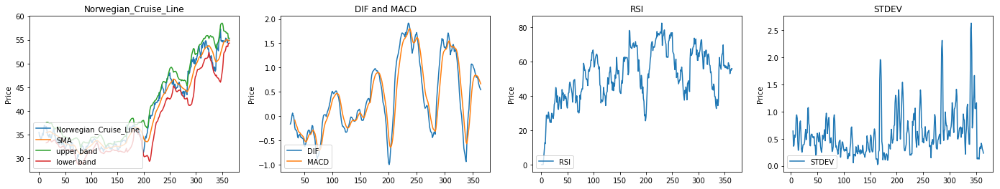

In [68]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Norwegian_Cruise_Line
SMA_Norwegian_Cruise_Line = calculate_SMA(SP500.Norwegian_Cruise_Line_Close)

SP500.Norwegian_Cruise_Line_Close[:365].plot(title='Norwegian_Cruise_Line',label='Norwegian_Cruise_Line', ax=axes[0])

SMA_Norwegian_Cruise_Line[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Norwegian_Cruise_Line
upper_band_Norwegian_Cruise_Line, lower_band_Norwegian_Cruise_Line = calculate_BB(SP500.Norwegian_Cruise_Line_Close)

upper_band_Norwegian_Cruise_Line[:365].plot(label='upper band', ax=axes[0])
lower_band_Norwegian_Cruise_Line[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Norwegian_Cruise_Line
DIF_Norwegian_Cruise_Line,MACD_Norwegian_Cruise_Line = calculate_MACD(SP500.Norwegian_Cruise_Line_Close)

DIF_Norwegian_Cruise_Line[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Norwegian_Cruise_Line[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Norwegian_Cruise_Line
RSI_Norwegian_Cruise_Line = calculate_RSI(SP500.Norwegian_Cruise_Line_Close)
RSI_Norwegian_Cruise_Line[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Norwegian_Cruise_Line
STDEV_Norwegian_Cruise_Line= calculate_stdev(SP500.Norwegian_Cruise_Line_Close)
STDEV_Norwegian_Cruise_Line[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Norwegian_Cruise_Line=SP500.Norwegian_Cruise_Line_Open - SP500.Norwegian_Cruise_Line_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





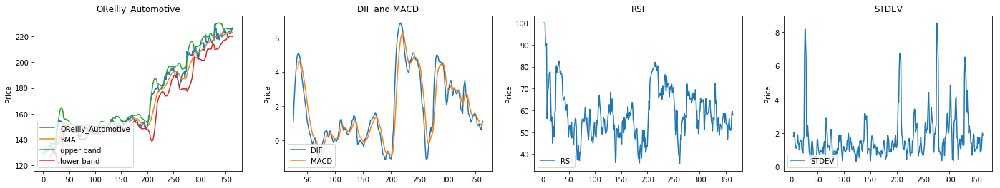

In [69]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for OReilly_Automotive
SMA_OReilly_Automotive = calculate_SMA(SP500.OReilly_Automotive_Close)

SP500.OReilly_Automotive_Close[:365].plot(title='OReilly_Automotive',label='OReilly_Automotive', ax=axes[0])

SMA_OReilly_Automotive[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for OReilly_Automotive
upper_band_OReilly_Automotive, lower_band_OReilly_Automotive = calculate_BB(SP500.OReilly_Automotive_Close)

upper_band_OReilly_Automotive[:365].plot(label='upper band', ax=axes[0])
lower_band_OReilly_Automotive[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for OReilly_Automotive
DIF_OReilly_Automotive,MACD_OReilly_Automotive = calculate_MACD(SP500.OReilly_Automotive_Close)

DIF_OReilly_Automotive[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_OReilly_Automotive[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for OReilly_Automotive
RSI_OReilly_Automotive = calculate_RSI(SP500.OReilly_Automotive_Close)
RSI_OReilly_Automotive[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for OReilly_Automotive
STDEV_OReilly_Automotive= calculate_stdev(SP500.OReilly_Automotive_Close)
STDEV_OReilly_Automotive[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_OReilly_Automotive=SP500.OReilly_Automotive_Open - SP500.OReilly_Automotive_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





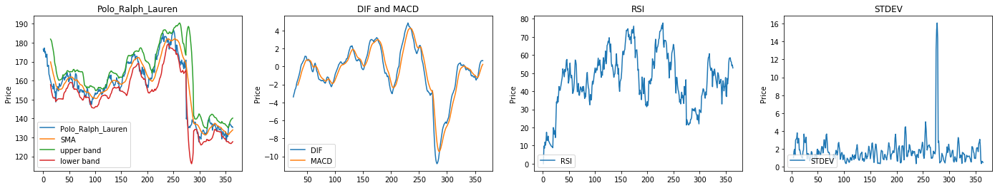

In [70]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Polo_Ralph_Lauren
SMA_Polo_Ralph_Lauren = calculate_SMA(SP500.Polo_Ralph_Lauren_Close)

SP500.Polo_Ralph_Lauren_Close[:365].plot(title='Polo_Ralph_Lauren',label='Polo_Ralph_Lauren', ax=axes[0])

SMA_Polo_Ralph_Lauren[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Polo_Ralph_Lauren
upper_band_Polo_Ralph_Lauren, lower_band_Polo_Ralph_Lauren = calculate_BB(SP500.Polo_Ralph_Lauren_Close)

upper_band_Polo_Ralph_Lauren[:365].plot(label='upper band', ax=axes[0])
lower_band_Polo_Ralph_Lauren[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Polo_Ralph_Lauren
DIF_Polo_Ralph_Lauren,MACD_Polo_Ralph_Lauren = calculate_MACD(SP500.Polo_Ralph_Lauren_Close)

DIF_Polo_Ralph_Lauren[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Polo_Ralph_Lauren[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Polo_Ralph_Lauren
RSI_Polo_Ralph_Lauren = calculate_RSI(SP500.Polo_Ralph_Lauren_Close)
RSI_Polo_Ralph_Lauren[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Polo_Ralph_Lauren
STDEV_Polo_Ralph_Lauren= calculate_stdev(SP500.Polo_Ralph_Lauren_Close)
STDEV_Polo_Ralph_Lauren[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Polo_Ralph_Lauren=SP500.Polo_Ralph_Lauren_Open - SP500.Polo_Ralph_Lauren_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





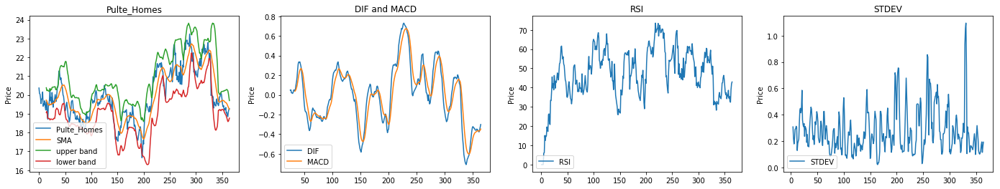

In [71]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Pulte_Homes
SMA_Pulte_Homes = calculate_SMA(SP500.Pulte_Homes_Close)

SP500.Pulte_Homes_Close[:365].plot(title='Pulte_Homes',label='Pulte_Homes', ax=axes[0])

SMA_Pulte_Homes[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Pulte_Homes
upper_band_Pulte_Homes, lower_band_Pulte_Homes = calculate_BB(SP500.Pulte_Homes_Close)

upper_band_Pulte_Homes[:365].plot(label='upper band', ax=axes[0])
lower_band_Pulte_Homes[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Pulte_Homes
DIF_Pulte_Homes,MACD_Pulte_Homes = calculate_MACD(SP500.Pulte_Homes_Close)

DIF_Pulte_Homes[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Pulte_Homes[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Pulte_Homes
RSI_Pulte_Homes = calculate_RSI(SP500.Pulte_Homes_Close)
RSI_Pulte_Homes[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Pulte_Homes
STDEV_Pulte_Homes= calculate_stdev(SP500.Pulte_Homes_Close)
STDEV_Pulte_Homes[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Pulte_Homes=SP500.Pulte_Homes_Open - SP500.Pulte_Homes_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





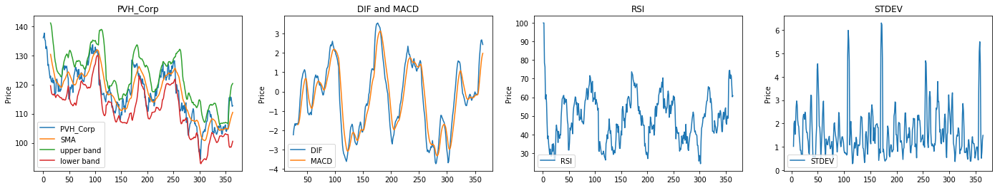

In [72]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for PVH_Corp
SMA_PVH_Corp = calculate_SMA(SP500.PVH_Corp_Close)

SP500.PVH_Corp_Close[:365].plot(title='PVH_Corp',label='PVH_Corp', ax=axes[0])

SMA_PVH_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for PVH_Corp
upper_band_PVH_Corp, lower_band_PVH_Corp = calculate_BB(SP500.PVH_Corp_Close)

upper_band_PVH_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_PVH_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for PVH_Corp
DIF_PVH_Corp,MACD_PVH_Corp = calculate_MACD(SP500.PVH_Corp_Close)

DIF_PVH_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_PVH_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for PVH_Corp
RSI_PVH_Corp = calculate_RSI(SP500.PVH_Corp_Close)
RSI_PVH_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for PVH_Corp
STDEV_PVH_Corp= calculate_stdev(SP500.PVH_Corp_Close)
STDEV_PVH_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_PVH_Corp=SP500.PVH_Corp_Open - SP500.PVH_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





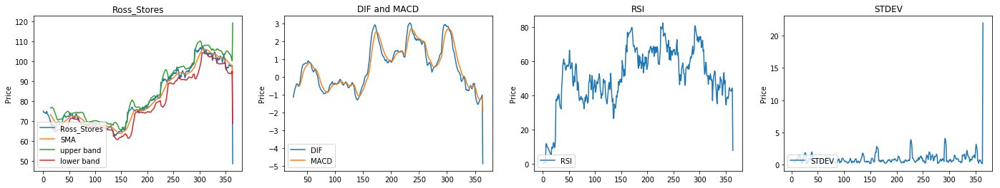

In [73]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ross_Stores
SMA_Ross_Stores = calculate_SMA(SP500.Ross_Stores_Close)

SP500.Ross_Stores_Close[:365].plot(title='Ross_Stores',label='Ross_Stores', ax=axes[0])

SMA_Ross_Stores[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ross_Stores
upper_band_Ross_Stores, lower_band_Ross_Stores = calculate_BB(SP500.Ross_Stores_Close)

upper_band_Ross_Stores[:365].plot(label='upper band', ax=axes[0])
lower_band_Ross_Stores[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ross_Stores
DIF_Ross_Stores,MACD_Ross_Stores = calculate_MACD(SP500.Ross_Stores_Close)

DIF_Ross_Stores[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ross_Stores[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ross_Stores
RSI_Ross_Stores = calculate_RSI(SP500.Ross_Stores_Close)
RSI_Ross_Stores[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ross_Stores
STDEV_Ross_Stores= calculate_stdev(SP500.Ross_Stores_Close)
STDEV_Ross_Stores[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ross_Stores=SP500.Ross_Stores_Open - SP500.Ross_Stores_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





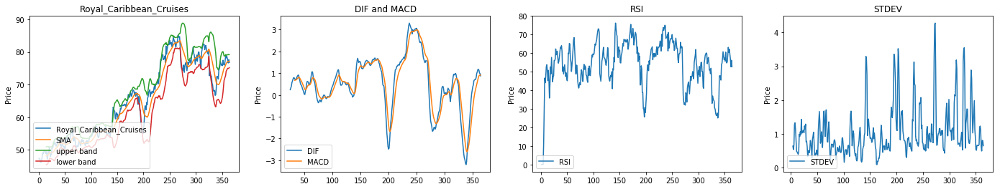

In [74]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Royal_Caribbean_Cruises
SMA_Royal_Caribbean_Cruises = calculate_SMA(SP500.Royal_Caribbean_Cruises_Close)

SP500.Royal_Caribbean_Cruises_Close[:365].plot(title='Royal_Caribbean_Cruises',label='Royal_Caribbean_Cruises', ax=axes[0])

SMA_Royal_Caribbean_Cruises[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Royal_Caribbean_Cruises
upper_band_Royal_Caribbean_Cruises, lower_band_Royal_Caribbean_Cruises = calculate_BB(SP500.Royal_Caribbean_Cruises_Close)

upper_band_Royal_Caribbean_Cruises[:365].plot(label='upper band', ax=axes[0])
lower_band_Royal_Caribbean_Cruises[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Royal_Caribbean_Cruises
DIF_Royal_Caribbean_Cruises,MACD_Royal_Caribbean_Cruises = calculate_MACD(SP500.Royal_Caribbean_Cruises_Close)

DIF_Royal_Caribbean_Cruises[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Royal_Caribbean_Cruises[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Royal_Caribbean_Cruises
RSI_Royal_Caribbean_Cruises = calculate_RSI(SP500.Royal_Caribbean_Cruises_Close)
RSI_Royal_Caribbean_Cruises[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Royal_Caribbean_Cruises
STDEV_Royal_Caribbean_Cruises= calculate_stdev(SP500.Royal_Caribbean_Cruises_Close)
STDEV_Royal_Caribbean_Cruises[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Royal_Caribbean_Cruises=SP500.Royal_Caribbean_Cruises_Open - SP500.Royal_Caribbean_Cruises_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





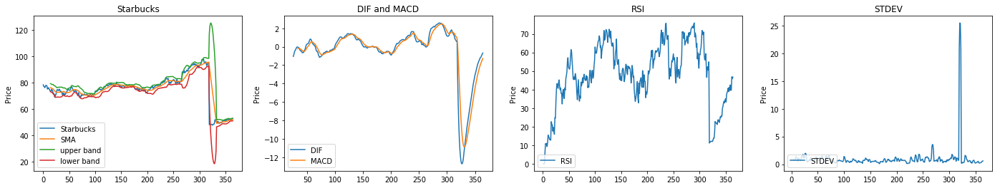

In [75]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Starbucks
SMA_Starbucks = calculate_SMA(SP500.Starbucks_Close)

SP500.Starbucks_Close[:365].plot(title='Starbucks',label='Starbucks', ax=axes[0])

SMA_Starbucks[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Starbucks
upper_band_Starbucks, lower_band_Starbucks = calculate_BB(SP500.Starbucks_Close)

upper_band_Starbucks[:365].plot(label='upper band', ax=axes[0])
lower_band_Starbucks[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Starbucks
DIF_Starbucks,MACD_Starbucks = calculate_MACD(SP500.Starbucks_Close)

DIF_Starbucks[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Starbucks[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Starbucks
RSI_Starbucks = calculate_RSI(SP500.Starbucks_Close)
RSI_Starbucks[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Starbucks
STDEV_Starbucks= calculate_stdev(SP500.Starbucks_Close)
STDEV_Starbucks[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Starbucks=SP500.Starbucks_Open - SP500.Starbucks_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





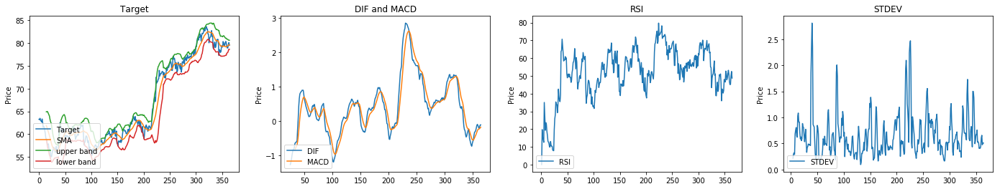

In [76]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Target
SMA_Target = calculate_SMA(SP500.Target_Close)

SP500.Target_Close[:365].plot(title='Target',label='Target', ax=axes[0])

SMA_Target[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Target
upper_band_Target, lower_band_Target = calculate_BB(SP500.Target_Close)

upper_band_Target[:365].plot(label='upper band', ax=axes[0])
lower_band_Target[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Target
DIF_Target,MACD_Target = calculate_MACD(SP500.Target_Close)

DIF_Target[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Target[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Target
RSI_Target = calculate_RSI(SP500.Target_Close)
RSI_Target[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Target
STDEV_Target= calculate_stdev(SP500.Target_Close)
STDEV_Target[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Target=SP500.Target_Open - SP500.Target_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





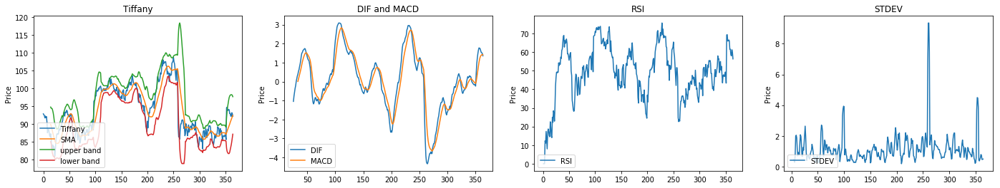

In [77]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Tiffany
SMA_Tiffany = calculate_SMA(SP500.Tiffany_Close)

SP500.Tiffany_Close[:365].plot(title='Tiffany',label='Tiffany', ax=axes[0])

SMA_Tiffany[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Tiffany
upper_band_Tiffany, lower_band_Tiffany = calculate_BB(SP500.Tiffany_Close)

upper_band_Tiffany[:365].plot(label='upper band', ax=axes[0])
lower_band_Tiffany[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Tiffany
DIF_Tiffany,MACD_Tiffany = calculate_MACD(SP500.Tiffany_Close)

DIF_Tiffany[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Tiffany[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Tiffany
RSI_Tiffany = calculate_RSI(SP500.Tiffany_Close)
RSI_Tiffany[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Tiffany
STDEV_Tiffany= calculate_stdev(SP500.Tiffany_Close)
STDEV_Tiffany[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Tiffany=SP500.Tiffany_Open - SP500.Tiffany_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





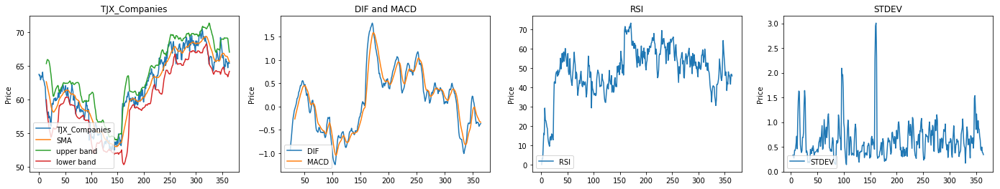

In [78]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for TJX_Companies
SMA_TJX_Companies = calculate_SMA(SP500.TJX_Companies_Close)

SP500.TJX_Companies_Close[:365].plot(title='TJX_Companies',label='TJX_Companies', ax=axes[0])

SMA_TJX_Companies[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for TJX_Companies
upper_band_TJX_Companies, lower_band_TJX_Companies = calculate_BB(SP500.TJX_Companies_Close)

upper_band_TJX_Companies[:365].plot(label='upper band', ax=axes[0])
lower_band_TJX_Companies[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for TJX_Companies
DIF_TJX_Companies,MACD_TJX_Companies = calculate_MACD(SP500.TJX_Companies_Close)

DIF_TJX_Companies[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_TJX_Companies[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for TJX_Companies
RSI_TJX_Companies = calculate_RSI(SP500.TJX_Companies_Close)
RSI_TJX_Companies[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for TJX_Companies
STDEV_TJX_Companies= calculate_stdev(SP500.TJX_Companies_Close)
STDEV_TJX_Companies[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_TJX_Companies=SP500.TJX_Companies_Open - SP500.TJX_Companies_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





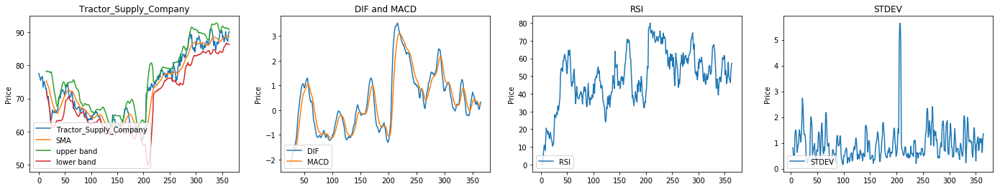

In [79]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Tractor_Supply_Company
SMA_Tractor_Supply_Company = calculate_SMA(SP500.Tractor_Supply_Company_Close)

SP500.Tractor_Supply_Company_Close[:365].plot(title='Tractor_Supply_Company',label='Tractor_Supply_Company', ax=axes[0])

SMA_Tractor_Supply_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Tractor_Supply_Company
upper_band_Tractor_Supply_Company, lower_band_Tractor_Supply_Company = calculate_BB(SP500.Tractor_Supply_Company_Close)

upper_band_Tractor_Supply_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_Tractor_Supply_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Tractor_Supply_Company
DIF_Tractor_Supply_Company,MACD_Tractor_Supply_Company = calculate_MACD(SP500.Tractor_Supply_Company_Close)

DIF_Tractor_Supply_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Tractor_Supply_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Tractor_Supply_Company
RSI_Tractor_Supply_Company = calculate_RSI(SP500.Tractor_Supply_Company_Close)
RSI_Tractor_Supply_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Tractor_Supply_Company
STDEV_Tractor_Supply_Company= calculate_stdev(SP500.Tractor_Supply_Company_Close)
STDEV_Tractor_Supply_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Tractor_Supply_Company=SP500.Tractor_Supply_Company_Open - SP500.Tractor_Supply_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





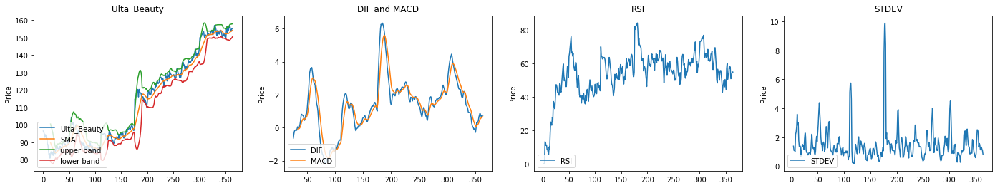

In [80]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ulta_Beauty
SMA_Ulta_Beauty = calculate_SMA(SP500.Ulta_Beauty_Close)

SP500.Ulta_Beauty_Close[:365].plot(title='Ulta_Beauty',label='Ulta_Beauty', ax=axes[0])

SMA_Ulta_Beauty[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ulta_Beauty
upper_band_Ulta_Beauty, lower_band_Ulta_Beauty = calculate_BB(SP500.Ulta_Beauty_Close)

upper_band_Ulta_Beauty[:365].plot(label='upper band', ax=axes[0])
lower_band_Ulta_Beauty[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ulta_Beauty
DIF_Ulta_Beauty,MACD_Ulta_Beauty = calculate_MACD(SP500.Ulta_Beauty_Close)

DIF_Ulta_Beauty[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ulta_Beauty[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ulta_Beauty
RSI_Ulta_Beauty = calculate_RSI(SP500.Ulta_Beauty_Close)
RSI_Ulta_Beauty[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ulta_Beauty
STDEV_Ulta_Beauty= calculate_stdev(SP500.Ulta_Beauty_Close)
STDEV_Ulta_Beauty[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ulta_Beauty=SP500.Ulta_Beauty_Open - SP500.Ulta_Beauty_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





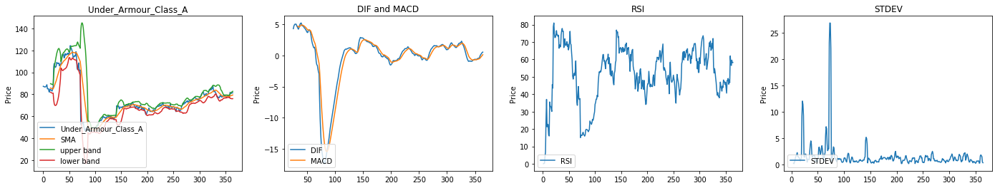

In [81]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Under_Armour_Class_A
SMA_Under_Armour_Class_A = calculate_SMA(SP500.Under_Armour_Class_A_Close)

SP500.Under_Armour_Class_A_Close[:365].plot(title='Under_Armour_Class_A',label='Under_Armour_Class_A', ax=axes[0])

SMA_Under_Armour_Class_A[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Under_Armour_Class_A
upper_band_Under_Armour_Class_A, lower_band_Under_Armour_Class_A = calculate_BB(SP500.Under_Armour_Class_A_Close)

upper_band_Under_Armour_Class_A[:365].plot(label='upper band', ax=axes[0])
lower_band_Under_Armour_Class_A[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Under_Armour_Class_A
DIF_Under_Armour_Class_A,MACD_Under_Armour_Class_A = calculate_MACD(SP500.Under_Armour_Class_A_Close)

DIF_Under_Armour_Class_A[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Under_Armour_Class_A[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Under_Armour_Class_A
RSI_Under_Armour_Class_A = calculate_RSI(SP500.Under_Armour_Class_A_Close)
RSI_Under_Armour_Class_A[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Under_Armour_Class_A
STDEV_Under_Armour_Class_A= calculate_stdev(SP500.Under_Armour_Class_A_Close)
STDEV_Under_Armour_Class_A[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Under_Armour_Class_A=SP500.Under_Armour_Class_A_Open - SP500.Under_Armour_Class_A_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





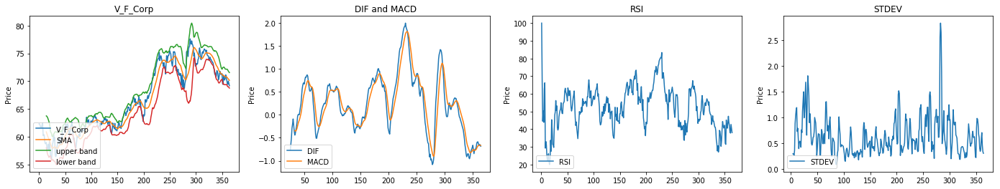

In [82]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for V_F_Corp
SMA_V_F_Corp = calculate_SMA(SP500.V_F_Corp_Close)

SP500.V_F_Corp_Close[:365].plot(title='V_F_Corp',label='V_F_Corp', ax=axes[0])

SMA_V_F_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for V_F_Corp
upper_band_V_F_Corp, lower_band_V_F_Corp = calculate_BB(SP500.V_F_Corp_Close)

upper_band_V_F_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_V_F_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for V_F_Corp
DIF_V_F_Corp,MACD_V_F_Corp = calculate_MACD(SP500.V_F_Corp_Close)

DIF_V_F_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_V_F_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for V_F_Corp
RSI_V_F_Corp = calculate_RSI(SP500.V_F_Corp_Close)
RSI_V_F_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for V_F_Corp
STDEV_V_F_Corp= calculate_stdev(SP500.V_F_Corp_Close)
STDEV_V_F_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_V_F_Corp=SP500.V_F_Corp_Open - SP500.V_F_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





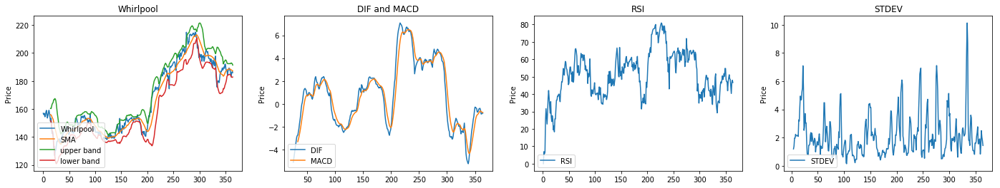

In [83]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Whirlpool
SMA_Whirlpool = calculate_SMA(SP500.Whirlpool_Close)

SP500.Whirlpool_Close[:365].plot(title='Whirlpool',label='Whirlpool', ax=axes[0])

SMA_Whirlpool[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Whirlpool
upper_band_Whirlpool, lower_band_Whirlpool = calculate_BB(SP500.Whirlpool_Close)

upper_band_Whirlpool[:365].plot(label='upper band', ax=axes[0])
lower_band_Whirlpool[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Whirlpool
DIF_Whirlpool,MACD_Whirlpool = calculate_MACD(SP500.Whirlpool_Close)

DIF_Whirlpool[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Whirlpool[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Whirlpool
RSI_Whirlpool = calculate_RSI(SP500.Whirlpool_Close)
RSI_Whirlpool[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Whirlpool
STDEV_Whirlpool= calculate_stdev(SP500.Whirlpool_Close)
STDEV_Whirlpool[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Whirlpool=SP500.Whirlpool_Open - SP500.Whirlpool_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





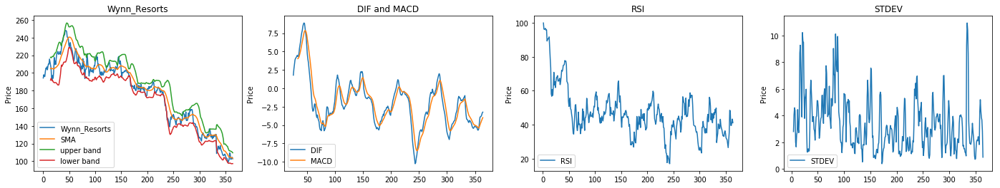

In [84]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Wynn_Resorts
SMA_Wynn_Resorts = calculate_SMA(SP500.Wynn_Resorts_Close)

SP500.Wynn_Resorts_Close[:365].plot(title='Wynn_Resorts',label='Wynn_Resorts', ax=axes[0])

SMA_Wynn_Resorts[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Wynn_Resorts
upper_band_Wynn_Resorts, lower_band_Wynn_Resorts = calculate_BB(SP500.Wynn_Resorts_Close)

upper_band_Wynn_Resorts[:365].plot(label='upper band', ax=axes[0])
lower_band_Wynn_Resorts[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Wynn_Resorts
DIF_Wynn_Resorts,MACD_Wynn_Resorts = calculate_MACD(SP500.Wynn_Resorts_Close)

DIF_Wynn_Resorts[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Wynn_Resorts[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Wynn_Resorts
RSI_Wynn_Resorts = calculate_RSI(SP500.Wynn_Resorts_Close)
RSI_Wynn_Resorts[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Wynn_Resorts
STDEV_Wynn_Resorts= calculate_stdev(SP500.Wynn_Resorts_Close)
STDEV_Wynn_Resorts[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Wynn_Resorts=SP500.Wynn_Resorts_Open - SP500.Wynn_Resorts_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





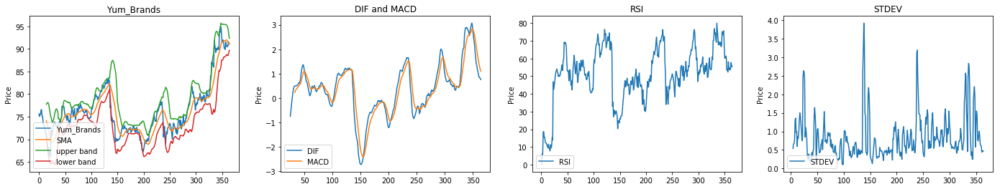

In [85]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Yum_Brands
SMA_Yum_Brands = calculate_SMA(SP500.Yum_Brands_Close)

SP500.Yum_Brands_Close[:365].plot(title='Yum_Brands',label='Yum_Brands', ax=axes[0])

SMA_Yum_Brands[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Yum_Brands
upper_band_Yum_Brands, lower_band_Yum_Brands = calculate_BB(SP500.Yum_Brands_Close)

upper_band_Yum_Brands[:365].plot(label='upper band', ax=axes[0])
lower_band_Yum_Brands[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Yum_Brands
DIF_Yum_Brands,MACD_Yum_Brands = calculate_MACD(SP500.Yum_Brands_Close)

DIF_Yum_Brands[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Yum_Brands[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Yum_Brands
RSI_Yum_Brands = calculate_RSI(SP500.Yum_Brands_Close)
RSI_Yum_Brands[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Yum_Brands
STDEV_Yum_Brands= calculate_stdev(SP500.Yum_Brands_Close)
STDEV_Yum_Brands[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Yum_Brands=SP500.Yum_Brands_Open - SP500.Yum_Brands_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





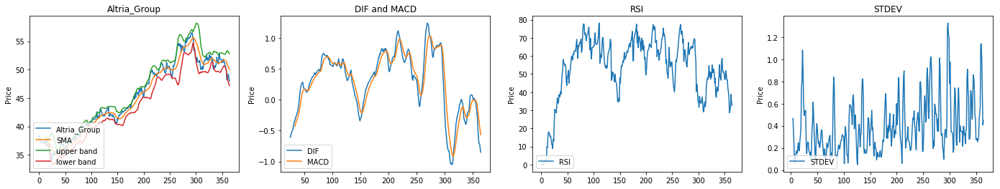

In [86]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Altria_Group
SMA_Altria_Group = calculate_SMA(SP500.Altria_Group_Close)

SP500.Altria_Group_Close[:365].plot(title='Altria_Group',label='Altria_Group', ax=axes[0])

SMA_Altria_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Altria_Group
upper_band_Altria_Group, lower_band_Altria_Group = calculate_BB(SP500.Altria_Group_Close)

upper_band_Altria_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Altria_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Altria_Group
DIF_Altria_Group,MACD_Altria_Group = calculate_MACD(SP500.Altria_Group_Close)

DIF_Altria_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Altria_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Altria_Group
RSI_Altria_Group = calculate_RSI(SP500.Altria_Group_Close)
RSI_Altria_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Altria_Group
STDEV_Altria_Group= calculate_stdev(SP500.Altria_Group_Close)
STDEV_Altria_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Altria_Group=SP500.Altria_Group_Open - SP500.Altria_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





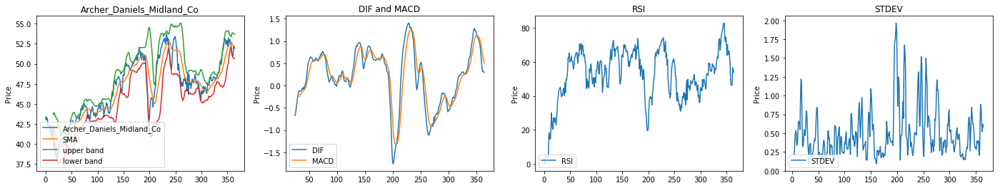

In [87]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Archer_Daniels_Midland_Co
SMA_Archer_Daniels_Midland_Co = calculate_SMA(SP500.Archer_Daniels_Midland_Co_Close)

SP500.Archer_Daniels_Midland_Co_Close[:365].plot(title='Archer_Daniels_Midland_Co',label='Archer_Daniels_Midland_Co', ax=axes[0])

SMA_Archer_Daniels_Midland_Co[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Archer_Daniels_Midland_Co
upper_band_Archer_Daniels_Midland_Co, lower_band_Archer_Daniels_Midland_Co = calculate_BB(SP500.Archer_Daniels_Midland_Co_Close)

upper_band_Archer_Daniels_Midland_Co[:365].plot(label='upper band', ax=axes[0])
lower_band_Archer_Daniels_Midland_Co[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Archer_Daniels_Midland_Co
DIF_Archer_Daniels_Midland_Co,MACD_Archer_Daniels_Midland_Co = calculate_MACD(SP500.Archer_Daniels_Midland_Co_Close)

DIF_Archer_Daniels_Midland_Co[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Archer_Daniels_Midland_Co[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Archer_Daniels_Midland_Co
RSI_Archer_Daniels_Midland_Co = calculate_RSI(SP500.Archer_Daniels_Midland_Co_Close)
RSI_Archer_Daniels_Midland_Co[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Archer_Daniels_Midland_Co
STDEV_Archer_Daniels_Midland_Co= calculate_stdev(SP500.Archer_Daniels_Midland_Co_Close)
STDEV_Archer_Daniels_Midland_Co[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Archer_Daniels_Midland_Co=SP500.Archer_Daniels_Midland_Co_Open - SP500.Archer_Daniels_Midland_Co_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





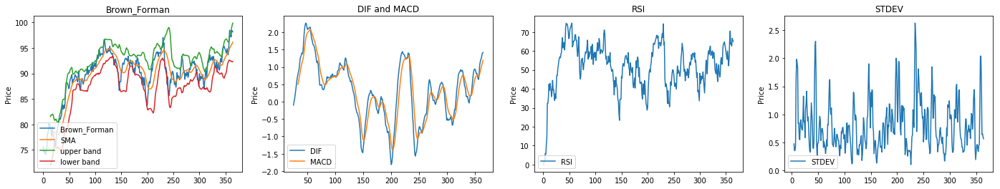

In [88]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Brown_Forman
SMA_Brown_Forman = calculate_SMA(SP500.Brown_Forman_Close)

SP500.Brown_Forman_Close[:365].plot(title='Brown_Forman',label='Brown_Forman', ax=axes[0])

SMA_Brown_Forman[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Brown_Forman
upper_band_Brown_Forman, lower_band_Brown_Forman = calculate_BB(SP500.Brown_Forman_Close)

upper_band_Brown_Forman[:365].plot(label='upper band', ax=axes[0])
lower_band_Brown_Forman[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Brown_Forman
DIF_Brown_Forman,MACD_Brown_Forman = calculate_MACD(SP500.Brown_Forman_Close)

DIF_Brown_Forman[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Brown_Forman[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Brown_Forman
RSI_Brown_Forman = calculate_RSI(SP500.Brown_Forman_Close)
RSI_Brown_Forman[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Brown_Forman
STDEV_Brown_Forman= calculate_stdev(SP500.Brown_Forman_Close)
STDEV_Brown_Forman[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Brown_Forman=SP500.Brown_Forman_Open - SP500.Brown_Forman_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





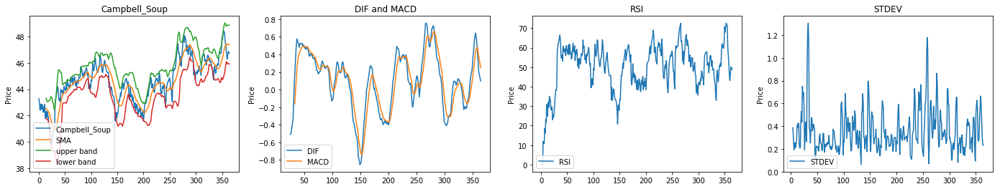

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Campbell_Soup
SMA_Campbell_Soup = calculate_SMA(SP500.Campbell_Soup_Close)

SP500.Campbell_Soup_Close[:365].plot(title='Campbell_Soup',label='Campbell_Soup', ax=axes[0])

SMA_Campbell_Soup[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Campbell_Soup
upper_band_Campbell_Soup, lower_band_Campbell_Soup = calculate_BB(SP500.Campbell_Soup_Close)

upper_band_Campbell_Soup[:365].plot(label='upper band', ax=axes[0])
lower_band_Campbell_Soup[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Campbell_Soup
DIF_Campbell_Soup,MACD_Campbell_Soup = calculate_MACD(SP500.Campbell_Soup_Close)

DIF_Campbell_Soup[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Campbell_Soup[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Campbell_Soup
RSI_Campbell_Soup = calculate_RSI(SP500.Campbell_Soup_Close)
RSI_Campbell_Soup[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Campbell_Soup
STDEV_Campbell_Soup= calculate_stdev(SP500.Campbell_Soup_Close)
STDEV_Campbell_Soup[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Campbell_Soup=SP500.Campbell_Soup_Open - SP500.Campbell_Soup_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





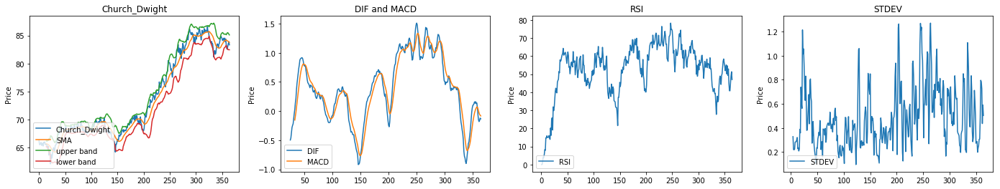

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Church_Dwight
SMA_Church_Dwight = calculate_SMA(SP500.Church_Dwight_Close)

SP500.Church_Dwight_Close[:365].plot(title='Church_Dwight',label='Church_Dwight', ax=axes[0])

SMA_Church_Dwight[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Church_Dwight
upper_band_Church_Dwight, lower_band_Church_Dwight = calculate_BB(SP500.Church_Dwight_Close)

upper_band_Church_Dwight[:365].plot(label='upper band', ax=axes[0])
lower_band_Church_Dwight[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Church_Dwight
DIF_Church_Dwight,MACD_Church_Dwight = calculate_MACD(SP500.Church_Dwight_Close)

DIF_Church_Dwight[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Church_Dwight[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Church_Dwight
RSI_Church_Dwight = calculate_RSI(SP500.Church_Dwight_Close)
RSI_Church_Dwight[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Church_Dwight
STDEV_Church_Dwight= calculate_stdev(SP500.Church_Dwight_Close)
STDEV_Church_Dwight[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Church_Dwight=SP500.Church_Dwight_Open - SP500.Church_Dwight_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





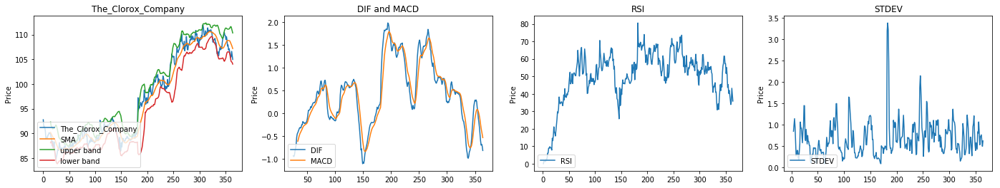

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for The_Clorox_Company
SMA_The_Clorox_Company = calculate_SMA(SP500.The_Clorox_Company_Close)

SP500.The_Clorox_Company_Close[:365].plot(title='The_Clorox_Company',label='The_Clorox_Company', ax=axes[0])

SMA_The_Clorox_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for The_Clorox_Company
upper_band_The_Clorox_Company, lower_band_The_Clorox_Company = calculate_BB(SP500.The_Clorox_Company_Close)

upper_band_The_Clorox_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_The_Clorox_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for The_Clorox_Company
DIF_The_Clorox_Company,MACD_The_Clorox_Company = calculate_MACD(SP500.The_Clorox_Company_Close)

DIF_The_Clorox_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_The_Clorox_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for The_Clorox_Company
RSI_The_Clorox_Company = calculate_RSI(SP500.The_Clorox_Company_Close)
RSI_The_Clorox_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for The_Clorox_Company
STDEV_The_Clorox_Company= calculate_stdev(SP500.The_Clorox_Company_Close)
STDEV_The_Clorox_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_The_Clorox_Company=SP500.The_Clorox_Company_Open - SP500.The_Clorox_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





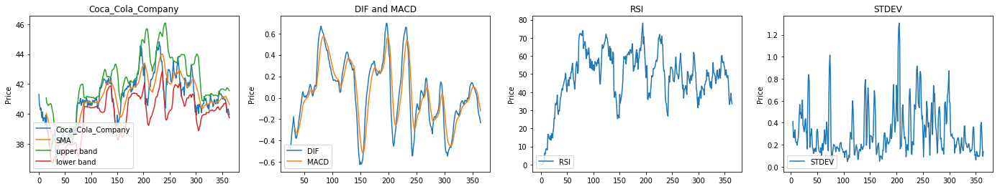

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Coca_Cola_Company
SMA_Coca_Cola_Company = calculate_SMA(SP500.Coca_Cola_Company_Close)

SP500.Coca_Cola_Company_Close[:365].plot(title='Coca_Cola_Company',label='Coca_Cola_Company', ax=axes[0])

SMA_Coca_Cola_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Coca_Cola_Company
upper_band_Coca_Cola_Company, lower_band_Coca_Cola_Company = calculate_BB(SP500.Coca_Cola_Company_Close)

upper_band_Coca_Cola_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_Coca_Cola_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Coca_Cola_Company
DIF_Coca_Cola_Company,MACD_Coca_Cola_Company = calculate_MACD(SP500.Coca_Cola_Company_Close)

DIF_Coca_Cola_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Coca_Cola_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Coca_Cola_Company
RSI_Coca_Cola_Company = calculate_RSI(SP500.Coca_Cola_Company_Close)
RSI_Coca_Cola_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Coca_Cola_Company
STDEV_Coca_Cola_Company= calculate_stdev(SP500.Coca_Cola_Company_Close)
STDEV_Coca_Cola_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Coca_Cola_Company=SP500.Coca_Cola_Company_Open - SP500.Coca_Cola_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





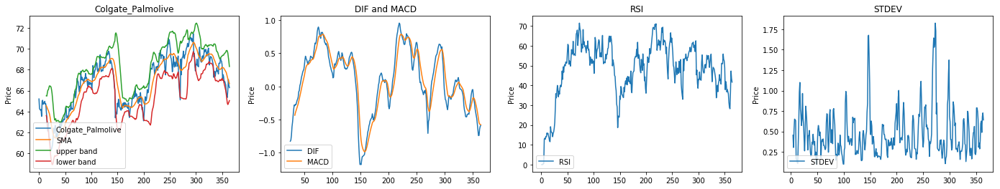

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Colgate_Palmolive
SMA_Colgate_Palmolive = calculate_SMA(SP500.Colgate_Palmolive_Close)

SP500.Colgate_Palmolive_Close[:365].plot(title='Colgate_Palmolive',label='Colgate_Palmolive', ax=axes[0])

SMA_Colgate_Palmolive[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Colgate_Palmolive
upper_band_Colgate_Palmolive, lower_band_Colgate_Palmolive = calculate_BB(SP500.Colgate_Palmolive_Close)

upper_band_Colgate_Palmolive[:365].plot(label='upper band', ax=axes[0])
lower_band_Colgate_Palmolive[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Colgate_Palmolive
DIF_Colgate_Palmolive,MACD_Colgate_Palmolive = calculate_MACD(SP500.Colgate_Palmolive_Close)

DIF_Colgate_Palmolive[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Colgate_Palmolive[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Colgate_Palmolive
RSI_Colgate_Palmolive = calculate_RSI(SP500.Colgate_Palmolive_Close)
RSI_Colgate_Palmolive[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Colgate_Palmolive
STDEV_Colgate_Palmolive= calculate_stdev(SP500.Colgate_Palmolive_Close)
STDEV_Colgate_Palmolive[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Colgate_Palmolive=SP500.Colgate_Palmolive_Open - SP500.Colgate_Palmolive_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





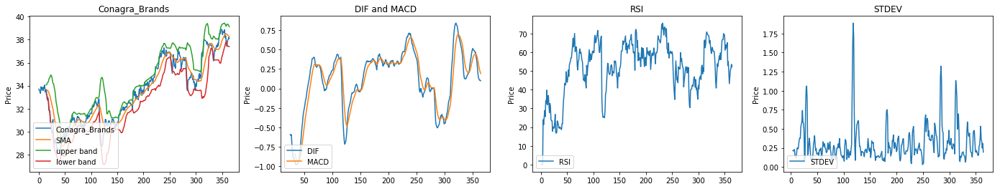

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Conagra_Brands
SMA_Conagra_Brands = calculate_SMA(SP500.Conagra_Brands_Close)

SP500.Conagra_Brands_Close[:365].plot(title='Conagra_Brands',label='Conagra_Brands', ax=axes[0])

SMA_Conagra_Brands[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Conagra_Brands
upper_band_Conagra_Brands, lower_band_Conagra_Brands = calculate_BB(SP500.Conagra_Brands_Close)

upper_band_Conagra_Brands[:365].plot(label='upper band', ax=axes[0])
lower_band_Conagra_Brands[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Conagra_Brands
DIF_Conagra_Brands,MACD_Conagra_Brands = calculate_MACD(SP500.Conagra_Brands_Close)

DIF_Conagra_Brands[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Conagra_Brands[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Conagra_Brands
RSI_Conagra_Brands = calculate_RSI(SP500.Conagra_Brands_Close)
RSI_Conagra_Brands[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Conagra_Brands
STDEV_Conagra_Brands= calculate_stdev(SP500.Conagra_Brands_Close)
STDEV_Conagra_Brands[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Conagra_Brands=SP500.Conagra_Brands_Open - SP500.Conagra_Brands_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Constellation_Brands
SMA_Constellation_Brands = calculate_SMA(SP500.Constellation_Brands_Close)

SP500.Constellation_Brands_Close[:365].plot(title='Constellation_Brands',label='Constellation_Brands', ax=axes[0])

SMA_Constellation_Brands[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Constellation_Brands
upper_band_Constellation_Brands, lower_band_Constellation_Brands = calculate_BB(SP500.Constellation_Brands_Close)

upper_band_Constellation_Brands[:365].plot(label='upper band', ax=axes[0])
lower_band_Constellation_Brands[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Constellation_Brands
DIF_Constellation_Brands,MACD_Constellation_Brands = calculate_MACD(SP500.Constellation_Brands_Close)

DIF_Constellation_Brands[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Constellation_Brands[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Constellation_Brands
RSI_Constellation_Brands = calculate_RSI(SP500.Constellation_Brands_Close)
RSI_Constellation_Brands[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Constellation_Brands
STDEV_Constellation_Brands= calculate_stdev(SP500.Constellation_Brands_Close)
STDEV_Constellation_Brands[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Constellation_Brands=SP500.Constellation_Brands_Open - SP500.Constellation_Brands_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Costco_Wholesale
SMA_Costco_Wholesale = calculate_SMA(SP500.Costco_Wholesale_Close)

SP500.Costco_Wholesale_Close[:365].plot(title='Costco_Wholesale',label='Costco_Wholesale', ax=axes[0])

SMA_Costco_Wholesale[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Costco_Wholesale
upper_band_Costco_Wholesale, lower_band_Costco_Wholesale = calculate_BB(SP500.Costco_Wholesale_Close)

upper_band_Costco_Wholesale[:365].plot(label='upper band', ax=axes[0])
lower_band_Costco_Wholesale[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Costco_Wholesale
DIF_Costco_Wholesale,MACD_Costco_Wholesale = calculate_MACD(SP500.Costco_Wholesale_Close)

DIF_Costco_Wholesale[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Costco_Wholesale[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Costco_Wholesale
RSI_Costco_Wholesale = calculate_RSI(SP500.Costco_Wholesale_Close)
RSI_Costco_Wholesale[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Costco_Wholesale
STDEV_Costco_Wholesale= calculate_stdev(SP500.Costco_Wholesale_Close)
STDEV_Costco_Wholesale[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Costco_Wholesale=SP500.Costco_Wholesale_Open - SP500.Costco_Wholesale_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Coty
SMA_Coty = calculate_SMA(SP500.Coty_Close)

SP500.Coty_Close[:365].plot(title='Coty',label='Coty', ax=axes[0])

SMA_Coty[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Coty
upper_band_Coty, lower_band_Coty = calculate_BB(SP500.Coty_Close)

upper_band_Coty[:365].plot(label='upper band', ax=axes[0])
lower_band_Coty[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Coty
DIF_Coty,MACD_Coty = calculate_MACD(SP500.Coty_Close)

DIF_Coty[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Coty[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Coty
RSI_Coty = calculate_RSI(SP500.Coty_Close)
RSI_Coty[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Coty
STDEV_Coty= calculate_stdev(SP500.Coty_Close)
STDEV_Coty[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Coty=SP500.Coty_Open - SP500.Coty_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for General_Mills
SMA_General_Mills = calculate_SMA(SP500.General_Mills_Close)

SP500.General_Mills_Close[:365].plot(title='General_Mills',label='General_Mills', ax=axes[0])

SMA_General_Mills[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for General_Mills
upper_band_General_Mills, lower_band_General_Mills = calculate_BB(SP500.General_Mills_Close)

upper_band_General_Mills[:365].plot(label='upper band', ax=axes[0])
lower_band_General_Mills[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for General_Mills
DIF_General_Mills,MACD_General_Mills = calculate_MACD(SP500.General_Mills_Close)

DIF_General_Mills[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_General_Mills[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for General_Mills
RSI_General_Mills = calculate_RSI(SP500.General_Mills_Close)
RSI_General_Mills[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for General_Mills
STDEV_General_Mills= calculate_stdev(SP500.General_Mills_Close)
STDEV_General_Mills[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_General_Mills=SP500.General_Mills_Open - SP500.General_Mills_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for The_Hershey_Company
SMA_The_Hershey_Company = calculate_SMA(SP500.The_Hershey_Company_Close)

SP500.The_Hershey_Company_Close[:365].plot(title='The_Hershey_Company',label='The_Hershey_Company', ax=axes[0])

SMA_The_Hershey_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for The_Hershey_Company
upper_band_The_Hershey_Company, lower_band_The_Hershey_Company = calculate_BB(SP500.The_Hershey_Company_Close)

upper_band_The_Hershey_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_The_Hershey_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for The_Hershey_Company
DIF_The_Hershey_Company,MACD_The_Hershey_Company = calculate_MACD(SP500.The_Hershey_Company_Close)

DIF_The_Hershey_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_The_Hershey_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for The_Hershey_Company
RSI_The_Hershey_Company = calculate_RSI(SP500.The_Hershey_Company_Close)
RSI_The_Hershey_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for The_Hershey_Company
STDEV_The_Hershey_Company= calculate_stdev(SP500.The_Hershey_Company_Close)
STDEV_The_Hershey_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_The_Hershey_Company=SP500.The_Hershey_Company_Open - SP500.The_Hershey_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Hormel_Foods
SMA_Hormel_Foods = calculate_SMA(SP500.Hormel_Foods_Close)

SP500.Hormel_Foods_Close[:365].plot(title='Hormel_Foods',label='Hormel_Foods', ax=axes[0])

SMA_Hormel_Foods[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Hormel_Foods
upper_band_Hormel_Foods, lower_band_Hormel_Foods = calculate_BB(SP500.Hormel_Foods_Close)

upper_band_Hormel_Foods[:365].plot(label='upper band', ax=axes[0])
lower_band_Hormel_Foods[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Hormel_Foods
DIF_Hormel_Foods,MACD_Hormel_Foods = calculate_MACD(SP500.Hormel_Foods_Close)

DIF_Hormel_Foods[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Hormel_Foods[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Hormel_Foods
RSI_Hormel_Foods = calculate_RSI(SP500.Hormel_Foods_Close)
RSI_Hormel_Foods[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Hormel_Foods
STDEV_Hormel_Foods= calculate_stdev(SP500.Hormel_Foods_Close)
STDEV_Hormel_Foods[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Hormel_Foods=SP500.Hormel_Foods_Open - SP500.Hormel_Foods_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')






In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for JM_Smucker
SMA_JM_Smucker = calculate_SMA(SP500.JM_Smucker_Close)

SP500.JM_Smucker_Close[:365].plot(title='JM_Smucker',label='JM_Smucker', ax=axes[0])

SMA_JM_Smucker[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for JM_Smucker
upper_band_JM_Smucker, lower_band_JM_Smucker = calculate_BB(SP500.JM_Smucker_Close)

upper_band_JM_Smucker[:365].plot(label='upper band', ax=axes[0])
lower_band_JM_Smucker[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for JM_Smucker
DIF_JM_Smucker,MACD_JM_Smucker = calculate_MACD(SP500.JM_Smucker_Close)

DIF_JM_Smucker[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_JM_Smucker[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for JM_Smucker
RSI_JM_Smucker = calculate_RSI(SP500.JM_Smucker_Close)
RSI_JM_Smucker[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for JM_Smucker
STDEV_JM_Smucker= calculate_stdev(SP500.JM_Smucker_Close)
STDEV_JM_Smucker[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_JM_Smucker=SP500.JM_Smucker_Open - SP500.JM_Smucker_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')






In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Kellogg
SMA_Kellogg = calculate_SMA(SP500.Kellogg_Close)

SP500.Kellogg_Close[:365].plot(title='Kellogg',label='Kellogg', ax=axes[0])

SMA_Kellogg[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Kellogg
upper_band_Kellogg, lower_band_Kellogg = calculate_BB(SP500.Kellogg_Close)

upper_band_Kellogg[:365].plot(label='upper band', ax=axes[0])
lower_band_Kellogg[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Kellogg
DIF_Kellogg,MACD_Kellogg = calculate_MACD(SP500.Kellogg_Close)

DIF_Kellogg[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Kellogg[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Kellogg
RSI_Kellogg = calculate_RSI(SP500.Kellogg_Close)
RSI_Kellogg[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Kellogg
STDEV_Kellogg= calculate_stdev(SP500.Kellogg_Close)
STDEV_Kellogg[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Kellogg=SP500.Kellogg_Open - SP500.Kellogg_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Kimberly_Clark
SMA_Kimberly_Clark = calculate_SMA(SP500.Kimberly_Clark_Close)

SP500.Kimberly_Clark_Close[:365].plot(title='Kimberly_Clark',label='Kimberly_Clark', ax=axes[0])

SMA_Kimberly_Clark[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Kimberly_Clark
upper_band_Kimberly_Clark, lower_band_Kimberly_Clark = calculate_BB(SP500.Kimberly_Clark_Close)

upper_band_Kimberly_Clark[:365].plot(label='upper band', ax=axes[0])
lower_band_Kimberly_Clark[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Kimberly_Clark
DIF_Kimberly_Clark,MACD_Kimberly_Clark = calculate_MACD(SP500.Kimberly_Clark_Close)

DIF_Kimberly_Clark[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Kimberly_Clark[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Kimberly_Clark
RSI_Kimberly_Clark = calculate_RSI(SP500.Kimberly_Clark_Close)
RSI_Kimberly_Clark[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Kimberly_Clark
STDEV_Kimberly_Clark= calculate_stdev(SP500.Kimberly_Clark_Close)
STDEV_Kimberly_Clark[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Kimberly_Clark=SP500.Kimberly_Clark_Open - SP500.Kimberly_Clark_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Kroger
SMA_Kroger = calculate_SMA(SP500.Kroger_Close)

SP500.Kroger_Close[:365].plot(title='Kroger',label='Kroger', ax=axes[0])

SMA_Kroger[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Kroger
upper_band_Kroger, lower_band_Kroger = calculate_BB(SP500.Kroger_Close)

upper_band_Kroger[:365].plot(label='upper band', ax=axes[0])
lower_band_Kroger[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Kroger
DIF_Kroger,MACD_Kroger = calculate_MACD(SP500.Kroger_Close)

DIF_Kroger[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Kroger[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Kroger
RSI_Kroger = calculate_RSI(SP500.Kroger_Close)
RSI_Kroger[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Kroger
STDEV_Kroger= calculate_stdev(SP500.Kroger_Close)
STDEV_Kroger[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Kroger=SP500.Kroger_Open - SP500.Kroger_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')






In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for McCormick
SMA_McCormick = calculate_SMA(SP500.McCormick_Close)

SP500.McCormick_Close[:365].plot(title='McCormick',label='McCormick', ax=axes[0])

SMA_McCormick[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for McCormick
upper_band_McCormick, lower_band_McCormick = calculate_BB(SP500.McCormick_Close)

upper_band_McCormick[:365].plot(label='upper band', ax=axes[0])
lower_band_McCormick[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for McCormick
DIF_McCormick,MACD_McCormick = calculate_MACD(SP500.McCormick_Close)

DIF_McCormick[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_McCormick[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for McCormick
RSI_McCormick = calculate_RSI(SP500.McCormick_Close)
RSI_McCormick[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for McCormick
STDEV_McCormick= calculate_stdev(SP500.McCormick_Close)
STDEV_McCormick[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_McCormick=SP500.McCormick_Open - SP500.McCormick_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')






In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Molson_Coors_Brewing_Company
SMA_Molson_Coors_Brewing_Company = calculate_SMA(SP500.Molson_Coors_Brewing_Company_Close)

SP500.Molson_Coors_Brewing_Company_Close[:365].plot(title='Molson_Coors_Brewing_Company',label='Molson_Coors_Brewing_Company', ax=axes[0])

SMA_Molson_Coors_Brewing_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Molson_Coors_Brewing_Company
upper_band_Molson_Coors_Brewing_Company, lower_band_Molson_Coors_Brewing_Company = calculate_BB(SP500.Molson_Coors_Brewing_Company_Close)

upper_band_Molson_Coors_Brewing_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_Molson_Coors_Brewing_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Molson_Coors_Brewing_Company
DIF_Molson_Coors_Brewing_Company,MACD_Molson_Coors_Brewing_Company = calculate_MACD(SP500.Molson_Coors_Brewing_Company_Close)

DIF_Molson_Coors_Brewing_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Molson_Coors_Brewing_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Molson_Coors_Brewing_Company
RSI_Molson_Coors_Brewing_Company = calculate_RSI(SP500.Molson_Coors_Brewing_Company_Close)
RSI_Molson_Coors_Brewing_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Molson_Coors_Brewing_Company
STDEV_Molson_Coors_Brewing_Company= calculate_stdev(SP500.Molson_Coors_Brewing_Company_Close)
STDEV_Molson_Coors_Brewing_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Molson_Coors_Brewing_Company=SP500.Molson_Coors_Brewing_Company_Open - SP500.Molson_Coors_Brewing_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Mondelez_International
SMA_Mondelez_International = calculate_SMA(SP500.Mondelez_International_Close)

SP500.Mondelez_International_Close[:365].plot(title='Mondelez_International',label='Mondelez_International', ax=axes[0])

SMA_Mondelez_International[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Mondelez_International
upper_band_Mondelez_International, lower_band_Mondelez_International = calculate_BB(SP500.Mondelez_International_Close)

upper_band_Mondelez_International[:365].plot(label='upper band', ax=axes[0])
lower_band_Mondelez_International[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Mondelez_International
DIF_Mondelez_International,MACD_Mondelez_International = calculate_MACD(SP500.Mondelez_International_Close)

DIF_Mondelez_International[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Mondelez_International[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Mondelez_International
RSI_Mondelez_International = calculate_RSI(SP500.Mondelez_International_Close)
RSI_Mondelez_International[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Mondelez_International
STDEV_Mondelez_International= calculate_stdev(SP500.Mondelez_International_Close)
STDEV_Mondelez_International[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Mondelez_International=SP500.Mondelez_International_Open - SP500.Mondelez_International_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Monster_Beverage
SMA_Monster_Beverage = calculate_SMA(SP500.Monster_Beverage_Close)

SP500.Monster_Beverage_Close[:365].plot(title='Monster_Beverage',label='Monster_Beverage', ax=axes[0])

SMA_Monster_Beverage[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Monster_Beverage
upper_band_Monster_Beverage, lower_band_Monster_Beverage = calculate_BB(SP500.Monster_Beverage_Close)

upper_band_Monster_Beverage[:365].plot(label='upper band', ax=axes[0])
lower_band_Monster_Beverage[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Monster_Beverage
DIF_Monster_Beverage,MACD_Monster_Beverage = calculate_MACD(SP500.Monster_Beverage_Close)

DIF_Monster_Beverage[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Monster_Beverage[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Monster_Beverage
RSI_Monster_Beverage = calculate_RSI(SP500.Monster_Beverage_Close)
RSI_Monster_Beverage[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Monster_Beverage
STDEV_Monster_Beverage= calculate_stdev(SP500.Monster_Beverage_Close)
STDEV_Monster_Beverage[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Monster_Beverage=SP500.Monster_Beverage_Open - SP500.Monster_Beverage_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for PepsiCo
SMA_PepsiCo = calculate_SMA(SP500.PepsiCo_Close)

SP500.PepsiCo_Close[:365].plot(title='PepsiCo',label='PepsiCo', ax=axes[0])

SMA_PepsiCo[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for PepsiCo
upper_band_PepsiCo, lower_band_PepsiCo = calculate_BB(SP500.PepsiCo_Close)

upper_band_PepsiCo[:365].plot(label='upper band', ax=axes[0])
lower_band_PepsiCo[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for PepsiCo
DIF_PepsiCo,MACD_PepsiCo = calculate_MACD(SP500.PepsiCo_Close)

DIF_PepsiCo[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_PepsiCo[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for PepsiCo
RSI_PepsiCo = calculate_RSI(SP500.PepsiCo_Close)
RSI_PepsiCo[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for PepsiCo
STDEV_PepsiCo= calculate_stdev(SP500.PepsiCo_Close)
STDEV_PepsiCo[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_PepsiCo=SP500.PepsiCo_Open - SP500.PepsiCo_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')






In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Philip_Morris_International
SMA_Philip_Morris_International = calculate_SMA(SP500.Philip_Morris_International_Close)

SP500.Philip_Morris_International_Close[:365].plot(title='Philip_Morris_International',label='Philip_Morris_International', ax=axes[0])

SMA_Philip_Morris_International[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Philip_Morris_International
upper_band_Philip_Morris_International, lower_band_Philip_Morris_International = calculate_BB(SP500.Philip_Morris_International_Close)

upper_band_Philip_Morris_International[:365].plot(label='upper band', ax=axes[0])
lower_band_Philip_Morris_International[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Philip_Morris_International
DIF_Philip_Morris_International,MACD_Philip_Morris_International = calculate_MACD(SP500.Philip_Morris_International_Close)

DIF_Philip_Morris_International[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Philip_Morris_International[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Philip_Morris_International
RSI_Philip_Morris_International = calculate_RSI(SP500.Philip_Morris_International_Close)
RSI_Philip_Morris_International[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Philip_Morris_International
STDEV_Philip_Morris_International= calculate_stdev(SP500.Philip_Morris_International_Close)
STDEV_Philip_Morris_International[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Philip_Morris_International=SP500.Philip_Morris_International_Open - SP500.Philip_Morris_International_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Procter_Gamble
SMA_Procter_Gamble = calculate_SMA(SP500.Procter_Gamble_Close)

SP500.Procter_Gamble_Close[:365].plot(title='Procter_Gamble',label='Procter_Gamble', ax=axes[0])

SMA_Procter_Gamble[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Procter_Gamble
upper_band_Procter_Gamble, lower_band_Procter_Gamble = calculate_BB(SP500.Procter_Gamble_Close)

upper_band_Procter_Gamble[:365].plot(label='upper band', ax=axes[0])
lower_band_Procter_Gamble[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Procter_Gamble
DIF_Procter_Gamble,MACD_Procter_Gamble = calculate_MACD(SP500.Procter_Gamble_Close)

DIF_Procter_Gamble[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Procter_Gamble[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Procter_Gamble
RSI_Procter_Gamble = calculate_RSI(SP500.Procter_Gamble_Close)
RSI_Procter_Gamble[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Procter_Gamble
STDEV_Procter_Gamble= calculate_stdev(SP500.Procter_Gamble_Close)
STDEV_Procter_Gamble[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Procter_Gamble=SP500.Procter_Gamble_Open - SP500.Procter_Gamble_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Sysco
SMA_Sysco = calculate_SMA(SP500.Sysco_Close)

SP500.Sysco_Close[:365].plot(title='Sysco',label='Sysco', ax=axes[0])

SMA_Sysco[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Sysco
upper_band_Sysco, lower_band_Sysco = calculate_BB(SP500.Sysco_Close)

upper_band_Sysco[:365].plot(label='upper band', ax=axes[0])
lower_band_Sysco[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Sysco
DIF_Sysco,MACD_Sysco = calculate_MACD(SP500.Sysco_Close)

DIF_Sysco[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Sysco[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Sysco
RSI_Sysco = calculate_RSI(SP500.Sysco_Close)
RSI_Sysco[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Sysco
STDEV_Sysco= calculate_stdev(SP500.Sysco_Close)
STDEV_Sysco[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Sysco=SP500.Sysco_Open - SP500.Sysco_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Tyson_Foods
SMA_Tyson_Foods = calculate_SMA(SP500.Tyson_Foods_Close)

SP500.Tyson_Foods_Close[:365].plot(title='Tyson_Foods',label='Tyson_Foods', ax=axes[0])

SMA_Tyson_Foods[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Tyson_Foods
upper_band_Tyson_Foods, lower_band_Tyson_Foods = calculate_BB(SP500.Tyson_Foods_Close)

upper_band_Tyson_Foods[:365].plot(label='upper band', ax=axes[0])
lower_band_Tyson_Foods[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Tyson_Foods
DIF_Tyson_Foods,MACD_Tyson_Foods = calculate_MACD(SP500.Tyson_Foods_Close)

DIF_Tyson_Foods[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Tyson_Foods[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Tyson_Foods
RSI_Tyson_Foods = calculate_RSI(SP500.Tyson_Foods_Close)
RSI_Tyson_Foods[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Tyson_Foods
STDEV_Tyson_Foods= calculate_stdev(SP500.Tyson_Foods_Close)
STDEV_Tyson_Foods[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Tyson_Foods=SP500.Tyson_Foods_Open - SP500.Tyson_Foods_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Walmart
SMA_Walmart = calculate_SMA(SP500.Walmart_Close)

SP500.Walmart_Close[:365].plot(title='Walmart',label='Walmart', ax=axes[0])

SMA_Walmart[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Walmart
upper_band_Walmart, lower_band_Walmart = calculate_BB(SP500.Walmart_Close)

upper_band_Walmart[:365].plot(label='upper band', ax=axes[0])
lower_band_Walmart[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Walmart
DIF_Walmart,MACD_Walmart = calculate_MACD(SP500.Walmart_Close)

DIF_Walmart[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Walmart[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Walmart
RSI_Walmart = calculate_RSI(SP500.Walmart_Close)
RSI_Walmart[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Walmart
STDEV_Walmart= calculate_stdev(SP500.Walmart_Close)
STDEV_Walmart[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Walmart=SP500.Walmart_Open - SP500.Walmart_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Walmart
SMA_Walmart = calculate_SMA(SP500.Walmart_Close)

SP500.Walmart_Close[:365].plot(title='Walmart',label='Walmart', ax=axes[0])

SMA_Walmart[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Walmart
upper_band_Walmart, lower_band_Walmart = calculate_BB(SP500.Walmart_Close)

upper_band_Walmart[:365].plot(label='upper band', ax=axes[0])
lower_band_Walmart[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Walmart
DIF_Walmart,MACD_Walmart = calculate_MACD(SP500.Walmart_Close)

DIF_Walmart[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Walmart[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Walmart
RSI_Walmart = calculate_RSI(SP500.Walmart_Close)
RSI_Walmart[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Walmart
STDEV_Walmart= calculate_stdev(SP500.Walmart_Close)
STDEV_Walmart[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Walmart=SP500.Walmart_Open - SP500.Walmart_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Walgreens_Boots_Alliance
SMA_Walgreens_Boots_Alliance = calculate_SMA(SP500.Walgreens_Boots_Alliance_Close)

SP500.Walgreens_Boots_Alliance_Close[:365].plot(title='Walgreens_Boots_Alliance',label='Walgreens_Boots_Alliance', ax=axes[0])

SMA_Walgreens_Boots_Alliance[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Walgreens_Boots_Alliance
upper_band_Walgreens_Boots_Alliance, lower_band_Walgreens_Boots_Alliance = calculate_BB(SP500.Walgreens_Boots_Alliance_Close)

upper_band_Walgreens_Boots_Alliance[:365].plot(label='upper band', ax=axes[0])
lower_band_Walgreens_Boots_Alliance[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Walgreens_Boots_Alliance
DIF_Walgreens_Boots_Alliance,MACD_Walgreens_Boots_Alliance = calculate_MACD(SP500.Walgreens_Boots_Alliance_Close)

DIF_Walgreens_Boots_Alliance[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Walgreens_Boots_Alliance[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Walgreens_Boots_Alliance
RSI_Walgreens_Boots_Alliance = calculate_RSI(SP500.Walgreens_Boots_Alliance_Close)
RSI_Walgreens_Boots_Alliance[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Walgreens_Boots_Alliance
STDEV_Walgreens_Boots_Alliance= calculate_stdev(SP500.Walgreens_Boots_Alliance_Close)
STDEV_Walgreens_Boots_Alliance[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Walgreens_Boots_Alliance=SP500.Walgreens_Boots_Alliance_Open - SP500.Walgreens_Boots_Alliance_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Anadarko_Petroleum
SMA_Anadarko_Petroleum = calculate_SMA(SP500.Anadarko_Petroleum_Close)

SP500.Anadarko_Petroleum_Close[:365].plot(title='Anadarko_Petroleum',label='Anadarko_Petroleum', ax=axes[0])

SMA_Anadarko_Petroleum[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Anadarko_Petroleum
upper_band_Anadarko_Petroleum, lower_band_Anadarko_Petroleum = calculate_BB(SP500.Anadarko_Petroleum_Close)

upper_band_Anadarko_Petroleum[:365].plot(label='upper band', ax=axes[0])
lower_band_Anadarko_Petroleum[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Anadarko_Petroleum
DIF_Anadarko_Petroleum,MACD_Anadarko_Petroleum = calculate_MACD(SP500.Anadarko_Petroleum_Close)

DIF_Anadarko_Petroleum[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Anadarko_Petroleum[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Anadarko_Petroleum
RSI_Anadarko_Petroleum = calculate_RSI(SP500.Anadarko_Petroleum_Close)
RSI_Anadarko_Petroleum[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Anadarko_Petroleum
STDEV_Anadarko_Petroleum= calculate_stdev(SP500.Anadarko_Petroleum_Close)
STDEV_Anadarko_Petroleum[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Anadarko_Petroleum=SP500.Anadarko_Petroleum_Open - SP500.Anadarko_Petroleum_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Apache_Corporation
SMA_Apache_Corporation = calculate_SMA(SP500.Apache_Corporation_Close)

SP500.Apache_Corporation_Close[:365].plot(title='Apache_Corporation',label='Apache_Corporation', ax=axes[0])

SMA_Apache_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Apache_Corporation
upper_band_Apache_Corporation, lower_band_Apache_Corporation = calculate_BB(SP500.Apache_Corporation_Close)

upper_band_Apache_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Apache_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Apache_Corporation
DIF_Apache_Corporation,MACD_Apache_Corporation = calculate_MACD(SP500.Apache_Corporation_Close)

DIF_Apache_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Apache_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Apache_Corporation
RSI_Apache_Corporation = calculate_RSI(SP500.Apache_Corporation_Close)
RSI_Apache_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Apache_Corporation
STDEV_Apache_Corporation= calculate_stdev(SP500.Apache_Corporation_Close)
STDEV_Apache_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Apache_Corporation=SP500.Apache_Corporation_Open - SP500.Apache_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Campbell_Soup
SMA_Campbell_Soup = calculate_SMA(SP500.Campbell_Soup_Close)

SP500.Campbell_Soup_Close[:365].plot(title='Campbell_Soup',label='Campbell_Soup', ax=axes[0])

SMA_Campbell_Soup[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Campbell_Soup
upper_band_Campbell_Soup, lower_band_Campbell_Soup = calculate_BB(SP500.Campbell_Soup_Close)

upper_band_Campbell_Soup[:365].plot(label='upper band', ax=axes[0])
lower_band_Campbell_Soup[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Campbell_Soup
DIF_Campbell_Soup,MACD_Campbell_Soup = calculate_MACD(SP500.Campbell_Soup_Close)

DIF_Campbell_Soup[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Campbell_Soup[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Campbell_Soup
RSI_Campbell_Soup = calculate_RSI(SP500.Campbell_Soup_Close)
RSI_Campbell_Soup[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Campbell_Soup
STDEV_Campbell_Soup= calculate_stdev(SP500.Campbell_Soup_Close)
STDEV_Campbell_Soup[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Campbell_Soup=SP500.Campbell_Soup_Open - SP500.Campbell_Soup_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cabot_Oil_Gas
SMA_Cabot_Oil_Gas = calculate_SMA(SP500.Cabot_Oil_Gas_Close)

SP500.Cabot_Oil_Gas_Close[:365].plot(title='Cabot_Oil_Gas',label='Cabot_Oil_Gas', ax=axes[0])

SMA_Cabot_Oil_Gas[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cabot_Oil_Gas
upper_band_Cabot_Oil_Gas, lower_band_Cabot_Oil_Gas = calculate_BB(SP500.Cabot_Oil_Gas_Close)

upper_band_Cabot_Oil_Gas[:365].plot(label='upper band', ax=axes[0])
lower_band_Cabot_Oil_Gas[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cabot_Oil_Gas
DIF_Cabot_Oil_Gas,MACD_Cabot_Oil_Gas = calculate_MACD(SP500.Cabot_Oil_Gas_Close)

DIF_Cabot_Oil_Gas[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cabot_Oil_Gas[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cabot_Oil_Gas
RSI_Cabot_Oil_Gas = calculate_RSI(SP500.Cabot_Oil_Gas_Close)
RSI_Cabot_Oil_Gas[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cabot_Oil_Gas
STDEV_Cabot_Oil_Gas= calculate_stdev(SP500.Cabot_Oil_Gas_Close)
STDEV_Cabot_Oil_Gas[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cabot_Oil_Gas=SP500.Cabot_Oil_Gas_Open - SP500.Cabot_Oil_Gas_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Chevron
SMA_Chevron = calculate_SMA(SP500.Chevron_Close)

SP500.Chevron_Close[:365].plot(title='Chevron',label='Chevron', ax=axes[0])

SMA_Chevron[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Chevron
upper_band_Chevron, lower_band_Chevron = calculate_BB(SP500.Chevron_Close)

upper_band_Chevron[:365].plot(label='upper band', ax=axes[0])
lower_band_Chevron[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Chevron
DIF_Chevron,MACD_Chevron = calculate_MACD(SP500.Chevron_Close)

DIF_Chevron[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Chevron[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Chevron
RSI_Chevron = calculate_RSI(SP500.Chevron_Close)
RSI_Chevron[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Chevron
STDEV_Chevron= calculate_stdev(SP500.Chevron_Close)
STDEV_Chevron[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Chevron=SP500.Chevron_Open - SP500.Chevron_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cimarex_Energy
SMA_Cimarex_Energy = calculate_SMA(SP500.Cimarex_Energy_Close)

SP500.Cimarex_Energy_Close[:365].plot(title='Cimarex_Energy',label='Cimarex_Energy', ax=axes[0])

SMA_Cimarex_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cimarex_Energy
upper_band_Cimarex_Energy, lower_band_Cimarex_Energy = calculate_BB(SP500.Cimarex_Energy_Close)

upper_band_Cimarex_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Cimarex_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cimarex_Energy
DIF_Cimarex_Energy,MACD_Cimarex_Energy = calculate_MACD(SP500.Cimarex_Energy_Close)

DIF_Cimarex_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cimarex_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cimarex_Energy
RSI_Cimarex_Energy = calculate_RSI(SP500.Cimarex_Energy_Close)
RSI_Cimarex_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cimarex_Energy
STDEV_Cimarex_Energy= calculate_stdev(SP500.Cimarex_Energy_Close)
STDEV_Cimarex_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cimarex_Energy=SP500.Cimarex_Energy_Open - SP500.Cimarex_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Concho_Resources
SMA_Concho_Resources = calculate_SMA(SP500.Concho_Resources_Close)

SP500.Concho_Resources_Close[:365].plot(title='Concho_Resources',label='Concho_Resources', ax=axes[0])

SMA_Concho_Resources[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Concho_Resources
upper_band_Concho_Resources, lower_band_Concho_Resources = calculate_BB(SP500.Concho_Resources_Close)

upper_band_Concho_Resources[:365].plot(label='upper band', ax=axes[0])
lower_band_Concho_Resources[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Concho_Resources
DIF_Concho_Resources,MACD_Concho_Resources = calculate_MACD(SP500.Concho_Resources_Close)

DIF_Concho_Resources[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Concho_Resources[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Concho_Resources
RSI_Concho_Resources = calculate_RSI(SP500.Concho_Resources_Close)
RSI_Concho_Resources[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Concho_Resources
STDEV_Concho_Resources= calculate_stdev(SP500.Concho_Resources_Close)
STDEV_Concho_Resources[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Concho_Resources=SP500.Concho_Resources_Open - SP500.Concho_Resources_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for ConocoPhillips
SMA_ConocoPhillips = calculate_SMA(SP500.ConocoPhillips_Close)

SP500.ConocoPhillips_Close[:365].plot(title='ConocoPhillips',label='ConocoPhillips', ax=axes[0])

SMA_ConocoPhillips[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for ConocoPhillips
upper_band_ConocoPhillips, lower_band_ConocoPhillips = calculate_BB(SP500.ConocoPhillips_Close)

upper_band_ConocoPhillips[:365].plot(label='upper band', ax=axes[0])
lower_band_ConocoPhillips[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for ConocoPhillips
DIF_ConocoPhillips,MACD_ConocoPhillips = calculate_MACD(SP500.ConocoPhillips_Close)

DIF_ConocoPhillips[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_ConocoPhillips[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for ConocoPhillips
RSI_ConocoPhillips = calculate_RSI(SP500.ConocoPhillips_Close)
RSI_ConocoPhillips[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for ConocoPhillips
STDEV_ConocoPhillips= calculate_stdev(SP500.ConocoPhillips_Close)
STDEV_ConocoPhillips[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_ConocoPhillips=SP500.ConocoPhillips_Open - SP500.ConocoPhillips_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Devon_Energy
SMA_Devon_Energy = calculate_SMA(SP500.Devon_Energy_Close)

SP500.Devon_Energy_Close[:365].plot(title='Devon_Energy',label='Devon_Energy', ax=axes[0])

SMA_Devon_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Devon_Energy
upper_band_Devon_Energy, lower_band_Devon_Energy = calculate_BB(SP500.Devon_Energy_Close)

upper_band_Devon_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Devon_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Devon_Energy
DIF_Devon_Energy,MACD_Devon_Energy = calculate_MACD(SP500.Devon_Energy_Close)

DIF_Devon_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Devon_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Devon_Energy
RSI_Devon_Energy = calculate_RSI(SP500.Devon_Energy_Close)
RSI_Devon_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Devon_Energy
STDEV_Devon_Energy= calculate_stdev(SP500.Devon_Energy_Close)
STDEV_Devon_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Devon_Energy=SP500.Devon_Energy_Open - SP500.Devon_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Diamondback_Energy
SMA_Diamondback_Energy = calculate_SMA(SP500.Diamondback_Energy_Close)

SP500.Diamondback_Energy_Close[:365].plot(title='Diamondback_Energy',label='Diamondback_Energy', ax=axes[0])

SMA_Diamondback_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Diamondback_Energy
upper_band_Diamondback_Energy, lower_band_Diamondback_Energy = calculate_BB(SP500.Diamondback_Energy_Close)

upper_band_Diamondback_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Diamondback_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Diamondback_Energy
DIF_Diamondback_Energy,MACD_Diamondback_Energy = calculate_MACD(SP500.Diamondback_Energy_Close)

DIF_Diamondback_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Diamondback_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Diamondback_Energy
RSI_Diamondback_Energy = calculate_RSI(SP500.Diamondback_Energy_Close)
RSI_Diamondback_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Diamondback_Energy
STDEV_Diamondback_Energy= calculate_stdev(SP500.Diamondback_Energy_Close)
STDEV_Diamondback_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Diamondback_Energy=SP500.Diamondback_Energy_Open - SP500.Diamondback_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for EOG_Resources
SMA_EOG_Resources = calculate_SMA(SP500.EOG_Resources_Close)

SP500.EOG_Resources_Close[:365].plot(title='EOG_Resources',label='EOG_Resources', ax=axes[0])

SMA_EOG_Resources[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for EOG_Resources
upper_band_EOG_Resources, lower_band_EOG_Resources = calculate_BB(SP500.EOG_Resources_Close)

upper_band_EOG_Resources[:365].plot(label='upper band', ax=axes[0])
lower_band_EOG_Resources[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for EOG_Resources
DIF_EOG_Resources,MACD_EOG_Resources = calculate_MACD(SP500.EOG_Resources_Close)

DIF_EOG_Resources[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_EOG_Resources[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for EOG_Resources
RSI_EOG_Resources = calculate_RSI(SP500.EOG_Resources_Close)
RSI_EOG_Resources[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for EOG_Resources
STDEV_EOG_Resources= calculate_stdev(SP500.EOG_Resources_Close)
STDEV_EOG_Resources[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_EOG_Resources=SP500.EOG_Resources_Open - SP500.EOG_Resources_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Exxon_Mobil
SMA_Exxon_Mobil = calculate_SMA(SP500.Exxon_Mobil_Close)

SP500.Exxon_Mobil_Close[:365].plot(title='Exxon_Mobil',label='Exxon_Mobil', ax=axes[0])

SMA_Exxon_Mobil[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Exxon_Mobil
upper_band_Exxon_Mobil, lower_band_Exxon_Mobil = calculate_BB(SP500.Exxon_Mobil_Close)

upper_band_Exxon_Mobil[:365].plot(label='upper band', ax=axes[0])
lower_band_Exxon_Mobil[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Exxon_Mobil
DIF_Exxon_Mobil,MACD_Exxon_Mobil = calculate_MACD(SP500.Exxon_Mobil_Close)

DIF_Exxon_Mobil[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Exxon_Mobil[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Exxon_Mobil
RSI_Exxon_Mobil = calculate_RSI(SP500.Exxon_Mobil_Close)
RSI_Exxon_Mobil[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Exxon_Mobil
STDEV_Exxon_Mobil= calculate_stdev(SP500.Exxon_Mobil_Close)
STDEV_Exxon_Mobil[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Exxon_Mobil=SP500.Exxon_Mobil_Open - SP500.Exxon_Mobil_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Halliburton
SMA_Halliburton = calculate_SMA(SP500.Halliburton_Close)

SP500.Halliburton_Close[:365].plot(title='Halliburton',label='Halliburton', ax=axes[0])

SMA_Halliburton[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Halliburton
upper_band_Halliburton, lower_band_Halliburton = calculate_BB(SP500.Halliburton_Close)

upper_band_Halliburton[:365].plot(label='upper band', ax=axes[0])
lower_band_Halliburton[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Halliburton
DIF_Halliburton,MACD_Halliburton = calculate_MACD(SP500.Halliburton_Close)

DIF_Halliburton[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Halliburton[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Halliburton
RSI_Halliburton = calculate_RSI(SP500.Halliburton_Close)
RSI_Halliburton[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Halliburton
STDEV_Halliburton= calculate_stdev(SP500.Halliburton_Close)
STDEV_Halliburton[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Halliburton=SP500.Halliburton_Open - SP500.Halliburton_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Helmerich_Payne
SMA_Helmerich_Payne = calculate_SMA(SP500.Helmerich_Payne_Close)

SP500.Helmerich_Payne_Close[:365].plot(title='Helmerich_Payne',label='Helmerich_Payne', ax=axes[0])

SMA_Helmerich_Payne[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Helmerich_Payne
upper_band_Helmerich_Payne, lower_band_Helmerich_Payne = calculate_BB(SP500.Helmerich_Payne_Close)

upper_band_Helmerich_Payne[:365].plot(label='upper band', ax=axes[0])
lower_band_Helmerich_Payne[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Helmerich_Payne
DIF_Helmerich_Payne,MACD_Helmerich_Payne = calculate_MACD(SP500.Helmerich_Payne_Close)

DIF_Helmerich_Payne[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Helmerich_Payne[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Helmerich_Payne
RSI_Helmerich_Payne = calculate_RSI(SP500.Helmerich_Payne_Close)
RSI_Helmerich_Payne[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Helmerich_Payne
STDEV_Helmerich_Payne= calculate_stdev(SP500.Helmerich_Payne_Close)
STDEV_Helmerich_Payne[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Helmerich_Payne=SP500.Helmerich_Payne_Open - SP500.Helmerich_Payne_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Hess_Corporation
SMA_Hess_Corporation = calculate_SMA(SP500.Hess_Corporation_Close)

SP500.Hess_Corporation_Close[:365].plot(title='Hess_Corporation',label='Hess_Corporation', ax=axes[0])

SMA_Hess_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Hess_Corporation
upper_band_Hess_Corporation, lower_band_Hess_Corporation = calculate_BB(SP500.Hess_Corporation_Close)

upper_band_Hess_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Hess_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Hess_Corporation
DIF_Hess_Corporation,MACD_Hess_Corporation = calculate_MACD(SP500.Hess_Corporation_Close)

DIF_Hess_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Hess_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Hess_Corporation
RSI_Hess_Corporation = calculate_RSI(SP500.Hess_Corporation_Close)
RSI_Hess_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Hess_Corporation
STDEV_Hess_Corporation= calculate_stdev(SP500.Hess_Corporation_Close)
STDEV_Hess_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Hess_Corporation=SP500.Hess_Corporation_Open - SP500.Hess_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Kinder_Morgan
SMA_Kinder_Morgan = calculate_SMA(SP500.Kinder_Morgan_Close)

SP500.Kinder_Morgan_Close[:365].plot(title='Kinder_Morgan',label='Kinder_Morgan', ax=axes[0])

SMA_Kinder_Morgan[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Kinder_Morgan
upper_band_Kinder_Morgan, lower_band_Kinder_Morgan = calculate_BB(SP500.Kinder_Morgan_Close)

upper_band_Kinder_Morgan[:365].plot(label='upper band', ax=axes[0])
lower_band_Kinder_Morgan[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Kinder_Morgan
DIF_Kinder_Morgan,MACD_Kinder_Morgan = calculate_MACD(SP500.Kinder_Morgan_Close)

DIF_Kinder_Morgan[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Kinder_Morgan[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Kinder_Morgan
RSI_Kinder_Morgan = calculate_RSI(SP500.Kinder_Morgan_Close)
RSI_Kinder_Morgan[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Kinder_Morgan
STDEV_Kinder_Morgan= calculate_stdev(SP500.Kinder_Morgan_Close)
STDEV_Kinder_Morgan[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Kinder_Morgan=SP500.Kinder_Morgan_Open - SP500.Kinder_Morgan_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Marathon_Oil
SMA_Marathon_Oil = calculate_SMA(SP500.Marathon_Oil_Close)

SP500.Marathon_Oil_Close[:365].plot(title='Marathon_Oil',label='Marathon_Oil', ax=axes[0])

SMA_Marathon_Oil[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Marathon_Oil
upper_band_Marathon_Oil, lower_band_Marathon_Oil = calculate_BB(SP500.Marathon_Oil_Close)

upper_band_Marathon_Oil[:365].plot(label='upper band', ax=axes[0])
lower_band_Marathon_Oil[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Marathon_Oil
DIF_Marathon_Oil,MACD_Marathon_Oil = calculate_MACD(SP500.Marathon_Oil_Close)

DIF_Marathon_Oil[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Marathon_Oil[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Marathon_Oil
RSI_Marathon_Oil = calculate_RSI(SP500.Marathon_Oil_Close)
RSI_Marathon_Oil[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Marathon_Oil
STDEV_Marathon_Oil= calculate_stdev(SP500.Marathon_Oil_Close)
STDEV_Marathon_Oil[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Marathon_Oil=SP500.Marathon_Oil_Open - SP500.Marathon_Oil_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Marathon_Petroleum
SMA_Marathon_Petroleum = calculate_SMA(SP500.Marathon_Petroleum_Close)

SP500.Marathon_Petroleum_Close[:365].plot(title='Marathon_Petroleum',label='Marathon_Petroleum', ax=axes[0])

SMA_Marathon_Petroleum[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Marathon_Petroleum
upper_band_Marathon_Petroleum, lower_band_Marathon_Petroleum = calculate_BB(SP500.Marathon_Petroleum_Close)

upper_band_Marathon_Petroleum[:365].plot(label='upper band', ax=axes[0])
lower_band_Marathon_Petroleum[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Marathon_Petroleum
DIF_Marathon_Petroleum,MACD_Marathon_Petroleum = calculate_MACD(SP500.Marathon_Petroleum_Close)

DIF_Marathon_Petroleum[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Marathon_Petroleum[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Marathon_Petroleum
RSI_Marathon_Petroleum = calculate_RSI(SP500.Marathon_Petroleum_Close)
RSI_Marathon_Petroleum[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Marathon_Petroleum
STDEV_Marathon_Petroleum= calculate_stdev(SP500.Marathon_Petroleum_Close)
STDEV_Marathon_Petroleum[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Marathon_Petroleum=SP500.Marathon_Petroleum_Open - SP500.Marathon_Petroleum_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for National_Oilwell_Varco
SMA_National_Oilwell_Varco = calculate_SMA(SP500.National_Oilwell_Varco_Close)

SP500.National_Oilwell_Varco_Close[:365].plot(title='National_Oilwell_Varco',label='National_Oilwell_Varco', ax=axes[0])

SMA_National_Oilwell_Varco[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for National_Oilwell_Varco
upper_band_National_Oilwell_Varco, lower_band_National_Oilwell_Varco = calculate_BB(SP500.National_Oilwell_Varco_Close)

upper_band_National_Oilwell_Varco[:365].plot(label='upper band', ax=axes[0])
lower_band_National_Oilwell_Varco[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for National_Oilwell_Varco
DIF_National_Oilwell_Varco,MACD_National_Oilwell_Varco = calculate_MACD(SP500.National_Oilwell_Varco_Close)

DIF_National_Oilwell_Varco[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_National_Oilwell_Varco[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for National_Oilwell_Varco
RSI_National_Oilwell_Varco = calculate_RSI(SP500.National_Oilwell_Varco_Close)
RSI_National_Oilwell_Varco[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for National_Oilwell_Varco
STDEV_National_Oilwell_Varco= calculate_stdev(SP500.National_Oilwell_Varco_Close)
STDEV_National_Oilwell_Varco[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_National_Oilwell_Varco=SP500.National_Oilwell_Varco_Open - SP500.National_Oilwell_Varco_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Newfield_Exploration
SMA_Newfield_Exploration = calculate_SMA(SP500.Newfield_Exploration_Close)

SP500.Newfield_Exploration_Close[:365].plot(title='Newfield_Exploration',label='Newfield_Exploration', ax=axes[0])

SMA_Newfield_Exploration[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Newfield_Exploration
upper_band_Newfield_Exploration, lower_band_Newfield_Exploration = calculate_BB(SP500.Newfield_Exploration_Close)

upper_band_Newfield_Exploration[:365].plot(label='upper band', ax=axes[0])
lower_band_Newfield_Exploration[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Newfield_Exploration
DIF_Newfield_Exploration,MACD_Newfield_Exploration = calculate_MACD(SP500.Newfield_Exploration_Close)

DIF_Newfield_Exploration[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Newfield_Exploration[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Newfield_Exploration
RSI_Newfield_Exploration = calculate_RSI(SP500.Newfield_Exploration_Close)
RSI_Newfield_Exploration[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Newfield_Exploration
STDEV_Newfield_Exploration= calculate_stdev(SP500.Newfield_Exploration_Close)
STDEV_Newfield_Exploration[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Newfield_Exploration=SP500.Newfield_Exploration_Open - SP500.Newfield_Exploration_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Noble_Energy
SMA_Noble_Energy = calculate_SMA(SP500.Noble_Energy_Close)

SP500.Noble_Energy_Close[:365].plot(title='Noble_Energy',label='Noble_Energy', ax=axes[0])

SMA_Noble_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Noble_Energy
upper_band_Noble_Energy, lower_band_Noble_Energy = calculate_BB(SP500.Noble_Energy_Close)

upper_band_Noble_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Noble_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Noble_Energy
DIF_Noble_Energy,MACD_Noble_Energy = calculate_MACD(SP500.Noble_Energy_Close)

DIF_Noble_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Noble_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Noble_Energy
RSI_Noble_Energy = calculate_RSI(SP500.Noble_Energy_Close)
RSI_Noble_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Noble_Energy
STDEV_Noble_Energy= calculate_stdev(SP500.Noble_Energy_Close)
STDEV_Noble_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Noble_Energy=SP500.Noble_Energy_Open - SP500.Noble_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Occidental_Petroleum
SMA_Occidental_Petroleum = calculate_SMA(SP500.Occidental_Petroleum_Close)

SP500.Occidental_Petroleum_Close[:365].plot(title='Occidental_Petroleum',label='Occidental_Petroleum', ax=axes[0])

SMA_Occidental_Petroleum[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Occidental_Petroleum
upper_band_Occidental_Petroleum, lower_band_Occidental_Petroleum = calculate_BB(SP500.Occidental_Petroleum_Close)

upper_band_Occidental_Petroleum[:365].plot(label='upper band', ax=axes[0])
lower_band_Occidental_Petroleum[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Occidental_Petroleum
DIF_Occidental_Petroleum,MACD_Occidental_Petroleum = calculate_MACD(SP500.Occidental_Petroleum_Close)

DIF_Occidental_Petroleum[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Occidental_Petroleum[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Occidental_Petroleum
RSI_Occidental_Petroleum = calculate_RSI(SP500.Occidental_Petroleum_Close)
RSI_Occidental_Petroleum[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Occidental_Petroleum
STDEV_Occidental_Petroleum= calculate_stdev(SP500.Occidental_Petroleum_Close)
STDEV_Occidental_Petroleum[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Occidental_Petroleum=SP500.Occidental_Petroleum_Open - SP500.Occidental_Petroleum_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for ONEOK
SMA_ONEOK = calculate_SMA(SP500.ONEOK_Close)

SP500.ONEOK_Close[:365].plot(title='ONEOK',label='ONEOK', ax=axes[0])

SMA_ONEOK[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for ONEOK
upper_band_ONEOK, lower_band_ONEOK = calculate_BB(SP500.ONEOK_Close)

upper_band_ONEOK[:365].plot(label='upper band', ax=axes[0])
lower_band_ONEOK[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for ONEOK
DIF_ONEOK,MACD_ONEOK = calculate_MACD(SP500.ONEOK_Close)

DIF_ONEOK[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_ONEOK[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for ONEOK
RSI_ONEOK = calculate_RSI(SP500.ONEOK_Close)
RSI_ONEOK[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for ONEOK
STDEV_ONEOK= calculate_stdev(SP500.ONEOK_Close)
STDEV_ONEOK[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_ONEOK=SP500.ONEOK_Open - SP500.ONEOK_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Phillips_SixtySix
SMA_Phillips_SixtySix = calculate_SMA(SP500.Phillips_SixtySix_Close)

SP500.Phillips_SixtySix_Close[:365].plot(title='Phillips_SixtySix',label='Phillips_SixtySix', ax=axes[0])

SMA_Phillips_SixtySix[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Phillips_SixtySix
upper_band_Phillips_SixtySix, lower_band_Phillips_SixtySix = calculate_BB(SP500.Phillips_SixtySix_Close)

upper_band_Phillips_SixtySix[:365].plot(label='upper band', ax=axes[0])
lower_band_Phillips_SixtySix[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Phillips_SixtySix
DIF_Phillips_SixtySix,MACD_Phillips_SixtySix = calculate_MACD(SP500.Phillips_SixtySix_Close)

DIF_Phillips_SixtySix[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Phillips_SixtySix[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Phillips_SixtySix
RSI_Phillips_SixtySix = calculate_RSI(SP500.Phillips_SixtySix_Close)
RSI_Phillips_SixtySix[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Phillips_SixtySix
STDEV_Phillips_SixtySix= calculate_stdev(SP500.Phillips_SixtySix_Close)
STDEV_Phillips_SixtySix[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Phillips_SixtySix=SP500.Phillips_SixtySix_Open - SP500.Phillips_SixtySix_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Schlumberger
SMA_Schlumberger = calculate_SMA(SP500.Schlumberger_Close)

SP500.Schlumberger_Close[:365].plot(title='Schlumberger',label='Schlumberger', ax=axes[0])

SMA_Schlumberger[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Schlumberger
upper_band_Schlumberger, lower_band_Schlumberger = calculate_BB(SP500.Schlumberger_Close)

upper_band_Schlumberger[:365].plot(label='upper band', ax=axes[0])
lower_band_Schlumberger[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Schlumberger
DIF_Schlumberger,MACD_Schlumberger = calculate_MACD(SP500.Schlumberger_Close)

DIF_Schlumberger[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Schlumberger[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Schlumberger
RSI_Schlumberger = calculate_RSI(SP500.Schlumberger_Close)
RSI_Schlumberger[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Schlumberger
STDEV_Schlumberger= calculate_stdev(SP500.Schlumberger_Close)
STDEV_Schlumberger[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Schlumberger=SP500.Schlumberger_Open - SP500.Schlumberger_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for TechnipFMC
SMA_TechnipFMC = calculate_SMA(SP500.TechnipFMC_Close)

SP500.TechnipFMC_Close[:365].plot(title='TechnipFMC',label='TechnipFMC', ax=axes[0])

SMA_TechnipFMC[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for TechnipFMC
upper_band_TechnipFMC, lower_band_TechnipFMC = calculate_BB(SP500.TechnipFMC_Close)

upper_band_TechnipFMC[:365].plot(label='upper band', ax=axes[0])
lower_band_TechnipFMC[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for TechnipFMC
DIF_TechnipFMC,MACD_TechnipFMC = calculate_MACD(SP500.TechnipFMC_Close)

DIF_TechnipFMC[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_TechnipFMC[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for TechnipFMC
RSI_TechnipFMC = calculate_RSI(SP500.TechnipFMC_Close)
RSI_TechnipFMC[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for TechnipFMC
STDEV_TechnipFMC= calculate_stdev(SP500.TechnipFMC_Close)
STDEV_TechnipFMC[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_TechnipFMC=SP500.TechnipFMC_Open - SP500.TechnipFMC_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Valero_Energy
SMA_Valero_Energy = calculate_SMA(SP500.Valero_Energy_Close)

SP500.Valero_Energy_Close[:365].plot(title='Valero_Energy',label='Valero_Energy', ax=axes[0])

SMA_Valero_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Valero_Energy
upper_band_Valero_Energy, lower_band_Valero_Energy = calculate_BB(SP500.Valero_Energy_Close)

upper_band_Valero_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Valero_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Valero_Energy
DIF_Valero_Energy,MACD_Valero_Energy = calculate_MACD(SP500.Valero_Energy_Close)

DIF_Valero_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Valero_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Valero_Energy
RSI_Valero_Energy = calculate_RSI(SP500.Valero_Energy_Close)
RSI_Valero_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Valero_Energy
STDEV_Valero_Energy= calculate_stdev(SP500.Valero_Energy_Close)
STDEV_Valero_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Valero_Energy=SP500.Valero_Energy_Open - SP500.Valero_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Williams_Cos
SMA_Williams_Cos = calculate_SMA(SP500.Williams_Cos_Close)

SP500.Williams_Cos_Close[:365].plot(title='Williams_Cos',label='Williams_Cos', ax=axes[0])

SMA_Williams_Cos[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Williams_Cos
upper_band_Williams_Cos, lower_band_Williams_Cos = calculate_BB(SP500.Williams_Cos_Close)

upper_band_Williams_Cos[:365].plot(label='upper band', ax=axes[0])
lower_band_Williams_Cos[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Williams_Cos
DIF_Williams_Cos,MACD_Williams_Cos = calculate_MACD(SP500.Williams_Cos_Close)

DIF_Williams_Cos[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Williams_Cos[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Williams_Cos
RSI_Williams_Cos = calculate_RSI(SP500.Williams_Cos_Close)
RSI_Williams_Cos[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Williams_Cos
STDEV_Williams_Cos= calculate_stdev(SP500.Williams_Cos_Close)
STDEV_Williams_Cos[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Williams_Cos=SP500.Williams_Cos_Open - SP500.Williams_Cos_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Affiliated_Managers_Group
SMA_Affiliated_Managers_Group = calculate_SMA(SP500.Affiliated_Managers_Group_Close)

SP500.Affiliated_Managers_Group_Close[:365].plot(title='Affiliated_Managers_Group',label='Affiliated_Managers_Group', ax=axes[0])

SMA_Affiliated_Managers_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Affiliated_Managers_Group
upper_band_Affiliated_Managers_Group, lower_band_Affiliated_Managers_Group = calculate_BB(SP500.Affiliated_Managers_Group_Close)

upper_band_Affiliated_Managers_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Affiliated_Managers_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Affiliated_Managers_Group
DIF_Affiliated_Managers_Group,MACD_Affiliated_Managers_Group = calculate_MACD(SP500.Affiliated_Managers_Group_Close)

DIF_Affiliated_Managers_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Affiliated_Managers_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Affiliated_Managers_Group
RSI_Affiliated_Managers_Group = calculate_RSI(SP500.Affiliated_Managers_Group_Close)
RSI_Affiliated_Managers_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Affiliated_Managers_Group
STDEV_Affiliated_Managers_Group= calculate_stdev(SP500.Affiliated_Managers_Group_Close)
STDEV_Affiliated_Managers_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Affiliated_Managers_Group=SP500.Affiliated_Managers_Group_Open - SP500.Affiliated_Managers_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for AFLAC
SMA_AFLAC = calculate_SMA(SP500.AFLAC_Close)

SP500.AFLAC_Close[:365].plot(title='AFLAC',label='AFLAC', ax=axes[0])

SMA_AFLAC[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AFLAC
upper_band_AFLAC, lower_band_AFLAC = calculate_BB(SP500.AFLAC_Close)

upper_band_AFLAC[:365].plot(label='upper band', ax=axes[0])
lower_band_AFLAC[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AFLAC
DIF_AFLAC,MACD_AFLAC = calculate_MACD(SP500.AFLAC_Close)

DIF_AFLAC[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_AFLAC[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AFLAC
RSI_AFLAC = calculate_RSI(SP500.AFLAC_Close)
RSI_AFLAC[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AFLAC
STDEV_AFLAC= calculate_stdev(SP500.AFLAC_Close)
STDEV_AFLAC[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_AFLAC=SP500.AFLAC_Open - SP500.AFLAC_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Allstate_Corp
SMA_Allstate_Corp = calculate_SMA(SP500.Allstate_Corp_Close)

SP500.Allstate_Corp_Close[:365].plot(title='Allstate_Corp',label='Allstate_Corp', ax=axes[0])

SMA_Allstate_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Allstate_Corp
upper_band_Allstate_Corp, lower_band_Allstate_Corp = calculate_BB(SP500.Allstate_Corp_Close)

upper_band_Allstate_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_Allstate_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Allstate_Corp
DIF_Allstate_Corp,MACD_Allstate_Corp = calculate_MACD(SP500.Allstate_Corp_Close)

DIF_Allstate_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Allstate_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Allstate_Corp
RSI_Allstate_Corp = calculate_RSI(SP500.Allstate_Corp_Close)
RSI_Allstate_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Allstate_Corp
STDEV_Allstate_Corp= calculate_stdev(SP500.Allstate_Corp_Close)
STDEV_Allstate_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Allstate_Corp=SP500.Allstate_Corp_Open - SP500.Allstate_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for American_Express
SMA_American_Express = calculate_SMA(SP500.American_Express_Close)

SP500.American_Express_Close[:365].plot(title='American_Express',label='American_Express', ax=axes[0])

SMA_American_Express[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for American_Express
upper_band_American_Express, lower_band_American_Express = calculate_BB(SP500.American_Express_Close)

upper_band_American_Express[:365].plot(label='upper band', ax=axes[0])
lower_band_American_Express[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for American_Express
DIF_American_Express,MACD_American_Express = calculate_MACD(SP500.American_Express_Close)

DIF_American_Express[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_American_Express[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for American_Express
RSI_American_Express = calculate_RSI(SP500.American_Express_Close)
RSI_American_Express[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for American_Express
STDEV_American_Express= calculate_stdev(SP500.American_Express_Close)
STDEV_American_Express[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_American_Express=SP500.American_Express_Open - SP500.American_Express_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for American_International_Group
SMA_American_International_Group = calculate_SMA(SP500.American_International_Group_Close)

SP500.American_International_Group_Close[:365].plot(title='American_International_Group',label='American_International_Group', ax=axes[0])

SMA_American_International_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for American_International_Group
upper_band_American_International_Group, lower_band_American_International_Group = calculate_BB(SP500.American_International_Group_Close)

upper_band_American_International_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_American_International_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for American_International_Group
DIF_American_International_Group,MACD_American_International_Group = calculate_MACD(SP500.American_International_Group_Close)

DIF_American_International_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_American_International_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for American_International_Group
RSI_American_International_Group = calculate_RSI(SP500.American_International_Group_Close)
RSI_American_International_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for American_International_Group
STDEV_American_International_Group= calculate_stdev(SP500.American_International_Group_Close)
STDEV_American_International_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_American_International_Group=SP500.American_International_Group_Open - SP500.American_International_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ameriprise_Financial
SMA_Ameriprise_Financial = calculate_SMA(SP500.Ameriprise_Financial_Close)

SP500.Ameriprise_Financial_Close[:365].plot(title='Ameriprise_Financial',label='Ameriprise_Financial', ax=axes[0])

SMA_Ameriprise_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ameriprise_Financial
upper_band_Ameriprise_Financial, lower_band_Ameriprise_Financial = calculate_BB(SP500.Ameriprise_Financial_Close)

upper_band_Ameriprise_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_Ameriprise_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ameriprise_Financial
DIF_Ameriprise_Financial,MACD_Ameriprise_Financial = calculate_MACD(SP500.Ameriprise_Financial_Close)

DIF_Ameriprise_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ameriprise_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ameriprise_Financial
RSI_Ameriprise_Financial = calculate_RSI(SP500.Ameriprise_Financial_Close)
RSI_Ameriprise_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ameriprise_Financial
STDEV_Ameriprise_Financial= calculate_stdev(SP500.Ameriprise_Financial_Close)
STDEV_Ameriprise_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ameriprise_Financial=SP500.Ameriprise_Financial_Open - SP500.Ameriprise_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Aon
SMA_Aon = calculate_SMA(SP500.Aon_Close)

SP500.Aon_Close[:365].plot(title='Aon',label='Aon', ax=axes[0])

SMA_Aon[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Aon
upper_band_Aon, lower_band_Aon = calculate_BB(SP500.Aon_Close)

upper_band_Aon[:365].plot(label='upper band', ax=axes[0])
lower_band_Aon[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Aon
DIF_Aon,MACD_Aon = calculate_MACD(SP500.Aon_Close)

DIF_Aon[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Aon[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Aon
RSI_Aon = calculate_RSI(SP500.Aon_Close)
RSI_Aon[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Aon
STDEV_Aon= calculate_stdev(SP500.Aon_Close)
STDEV_Aon[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Aon=SP500.Aon_Open - SP500.Aon_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Arthur_J_Gallagher
SMA_Arthur_J_Gallagher = calculate_SMA(SP500.Arthur_J_Gallagher_Close)

SP500.Arthur_J_Gallagher_Close[:365].plot(title='Arthur_J_Gallagher',label='Arthur_J_Gallagher', ax=axes[0])

SMA_Arthur_J_Gallagher[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Arthur_J_Gallagher
upper_band_Arthur_J_Gallagher, lower_band_Arthur_J_Gallagher = calculate_BB(SP500.Arthur_J_Gallagher_Close)

upper_band_Arthur_J_Gallagher[:365].plot(label='upper band', ax=axes[0])
lower_band_Arthur_J_Gallagher[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Arthur_J_Gallagher
DIF_Arthur_J_Gallagher,MACD_Arthur_J_Gallagher = calculate_MACD(SP500.Arthur_J_Gallagher_Close)

DIF_Arthur_J_Gallagher[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Arthur_J_Gallagher[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Arthur_J_Gallagher
RSI_Arthur_J_Gallagher = calculate_RSI(SP500.Arthur_J_Gallagher_Close)
RSI_Arthur_J_Gallagher[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Arthur_J_Gallagher
STDEV_Arthur_J_Gallagher= calculate_stdev(SP500.Arthur_J_Gallagher_Close)
STDEV_Arthur_J_Gallagher[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Arthur_J_Gallagher=SP500.Arthur_J_Gallagher_Open - SP500.Arthur_J_Gallagher_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Assurant
SMA_Assurant = calculate_SMA(SP500.Assurant_Close)

SP500.Assurant_Close[:365].plot(title='Assurant',label='Assurant', ax=axes[0])

SMA_Assurant[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Assurant
upper_band_Assurant, lower_band_Assurant = calculate_BB(SP500.Assurant_Close)

upper_band_Assurant[:365].plot(label='upper band', ax=axes[0])
lower_band_Assurant[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Assurant
DIF_Assurant,MACD_Assurant = calculate_MACD(SP500.Assurant_Close)

DIF_Assurant[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Assurant[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Assurant
RSI_Assurant = calculate_RSI(SP500.Assurant_Close)
RSI_Assurant[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Assurant
STDEV_Assurant= calculate_stdev(SP500.Assurant_Close)
STDEV_Assurant[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Assurant=SP500.Assurant_Open - SP500.Assurant_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Bank_of_America
SMA_Bank_of_America = calculate_SMA(SP500.Bank_of_America_Close)

SP500.Bank_of_America_Close[:365].plot(title='Bank_of_America',label='Bank_of_America', ax=axes[0])

SMA_Bank_of_America[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Bank_of_America
upper_band_Bank_of_America, lower_band_Bank_of_America = calculate_BB(SP500.Bank_of_America_Close)

upper_band_Bank_of_America[:365].plot(label='upper band', ax=axes[0])
lower_band_Bank_of_America[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Bank_of_America
DIF_Bank_of_America,MACD_Bank_of_America = calculate_MACD(SP500.Bank_of_America_Close)

DIF_Bank_of_America[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Bank_of_America[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Bank_of_America
RSI_Bank_of_America = calculate_RSI(SP500.Bank_of_America_Close)
RSI_Bank_of_America[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Bank_of_America
STDEV_Bank_of_America= calculate_stdev(SP500.Bank_of_America_Close)
STDEV_Bank_of_America[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Bank_of_America=SP500.Bank_of_America_Open - SP500.Bank_of_America_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for The_Bank_of_NewYork
SMA_The_Bank_of_NewYork = calculate_SMA(SP500.The_Bank_of_NewYork_Close)

SP500.The_Bank_of_NewYork_Close[:365].plot(title='The_Bank_of_NewYork',label='The_Bank_of_NewYork', ax=axes[0])

SMA_The_Bank_of_NewYork[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for The_Bank_of_NewYork
upper_band_The_Bank_of_NewYork, lower_band_The_Bank_of_NewYork = calculate_BB(SP500.The_Bank_of_NewYork_Close)

upper_band_The_Bank_of_NewYork[:365].plot(label='upper band', ax=axes[0])
lower_band_The_Bank_of_NewYork[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for The_Bank_of_NewYork
DIF_The_Bank_of_NewYork,MACD_The_Bank_of_NewYork = calculate_MACD(SP500.The_Bank_of_NewYork_Close)

DIF_The_Bank_of_NewYork[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_The_Bank_of_NewYork[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for The_Bank_of_NewYork
RSI_The_Bank_of_NewYork = calculate_RSI(SP500.The_Bank_of_NewYork_Close)
RSI_The_Bank_of_NewYork[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for The_Bank_of_NewYork
STDEV_The_Bank_of_NewYork= calculate_stdev(SP500.The_Bank_of_NewYork_Close)
STDEV_The_Bank_of_NewYork[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_The_Bank_of_NewYork=SP500.The_Bank_of_NewYork_Open - SP500.The_Bank_of_NewYork_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for BBT
SMA_BBT = calculate_SMA(SP500.BBT_Close)

SP500.BBT_Close[:365].plot(title='BBT',label='BBT', ax=axes[0])

SMA_BBT[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for BBT
upper_band_BBT, lower_band_BBT = calculate_BB(SP500.BBT_Close)

upper_band_BBT[:365].plot(label='upper band', ax=axes[0])
lower_band_BBT[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for BBT
DIF_BBT,MACD_BBT = calculate_MACD(SP500.BBT_Close)

DIF_BBT[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_BBT[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for BBT
RSI_BBT = calculate_RSI(SP500.BBT_Close)
RSI_BBT[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for BBT
STDEV_BBT= calculate_stdev(SP500.BBT_Close)
STDEV_BBT[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_BBT=SP500.BBT_Open - SP500.BBT_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Berkshire_Hathaway
SMA_Berkshire_Hathaway = calculate_SMA(SP500.Berkshire_Hathaway_Close)

SP500.Berkshire_Hathaway_Close[:365].plot(title='Berkshire_Hathaway',label='Berkshire_Hathaway', ax=axes[0])

SMA_Berkshire_Hathaway[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Berkshire_Hathaway
upper_band_Berkshire_Hathaway, lower_band_Berkshire_Hathaway = calculate_BB(SP500.Berkshire_Hathaway_Close)

upper_band_Berkshire_Hathaway[:365].plot(label='upper band', ax=axes[0])
lower_band_Berkshire_Hathaway[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Berkshire_Hathaway
DIF_Berkshire_Hathaway,MACD_Berkshire_Hathaway = calculate_MACD(SP500.Berkshire_Hathaway_Close)

DIF_Berkshire_Hathaway[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Berkshire_Hathaway[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Berkshire_Hathaway
RSI_Berkshire_Hathaway = calculate_RSI(SP500.Berkshire_Hathaway_Close)
RSI_Berkshire_Hathaway[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Berkshire_Hathaway
STDEV_Berkshire_Hathaway= calculate_stdev(SP500.Berkshire_Hathaway_Close)
STDEV_Berkshire_Hathaway[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Berkshire_Hathaway=SP500.Berkshire_Hathaway_Open - SP500.Berkshire_Hathaway_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for BlackRock
SMA_BlackRock = calculate_SMA(SP500.BlackRock_Close)

SP500.BlackRock_Close[:365].plot(title='BlackRock',label='BlackRock', ax=axes[0])

SMA_BlackRock[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for BlackRock
upper_band_BlackRock, lower_band_BlackRock = calculate_BB(SP500.BlackRock_Close)

upper_band_BlackRock[:365].plot(label='upper band', ax=axes[0])
lower_band_BlackRock[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for BlackRock
DIF_BlackRock,MACD_BlackRock = calculate_MACD(SP500.BlackRock_Close)

DIF_BlackRock[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_BlackRock[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for BlackRock
RSI_BlackRock = calculate_RSI(SP500.BlackRock_Close)
RSI_BlackRock[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for BlackRock
STDEV_BlackRock= calculate_stdev(SP500.BlackRock_Close)
STDEV_BlackRock[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_BlackRock=SP500.BlackRock_Open - SP500.BlackRock_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Capital_One_Financial
SMA_Capital_One_Financial = calculate_SMA(SP500.Capital_One_Financial_Close)

SP500.Capital_One_Financial_Close[:365].plot(title='Capital_One_Financial',label='Capital_One_Financial', ax=axes[0])

SMA_Capital_One_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Capital_One_Financial
upper_band_Capital_One_Financial, lower_band_Capital_One_Financial = calculate_BB(SP500.Capital_One_Financial_Close)

upper_band_Capital_One_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_Capital_One_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Capital_One_Financial
DIF_Capital_One_Financial,MACD_Capital_One_Financial = calculate_MACD(SP500.Capital_One_Financial_Close)

DIF_Capital_One_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Capital_One_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Capital_One_Financial
RSI_Capital_One_Financial = calculate_RSI(SP500.Capital_One_Financial_Close)
RSI_Capital_One_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Capital_One_Financial
STDEV_Capital_One_Financial= calculate_stdev(SP500.Capital_One_Financial_Close)
STDEV_Capital_One_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Capital_One_Financial=SP500.Capital_One_Financial_Open - SP500.Capital_One_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cboe_Global_Markets
SMA_Cboe_Global_Markets = calculate_SMA(SP500.Cboe_Global_Markets_Close)

SP500.Cboe_Global_Markets_Close[:365].plot(title='Cboe_Global_Markets',label='Cboe_Global_Markets', ax=axes[0])

SMA_Cboe_Global_Markets[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cboe_Global_Markets
upper_band_Cboe_Global_Markets, lower_band_Cboe_Global_Markets = calculate_BB(SP500.Cboe_Global_Markets_Close)

upper_band_Cboe_Global_Markets[:365].plot(label='upper band', ax=axes[0])
lower_band_Cboe_Global_Markets[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cboe_Global_Markets
DIF_Cboe_Global_Markets,MACD_Cboe_Global_Markets = calculate_MACD(SP500.Cboe_Global_Markets_Close)

DIF_Cboe_Global_Markets[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cboe_Global_Markets[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cboe_Global_Markets
RSI_Cboe_Global_Markets = calculate_RSI(SP500.Cboe_Global_Markets_Close)
RSI_Cboe_Global_Markets[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cboe_Global_Markets
STDEV_Cboe_Global_Markets= calculate_stdev(SP500.Cboe_Global_Markets_Close)
STDEV_Cboe_Global_Markets[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cboe_Global_Markets=SP500.Cboe_Global_Markets_Open - SP500.Cboe_Global_Markets_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Charles_Schwab_Corporation
SMA_Charles_Schwab_Corporation = calculate_SMA(SP500.Charles_Schwab_Corporation_Close)

SP500.Charles_Schwab_Corporation_Close[:365].plot(title='Charles_Schwab_Corporation',label='Charles_Schwab_Corporation', ax=axes[0])

SMA_Charles_Schwab_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Charles_Schwab_Corporation
upper_band_Charles_Schwab_Corporation, lower_band_Charles_Schwab_Corporation = calculate_BB(SP500.Charles_Schwab_Corporation_Close)

upper_band_Charles_Schwab_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Charles_Schwab_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Charles_Schwab_Corporation
DIF_Charles_Schwab_Corporation,MACD_Charles_Schwab_Corporation = calculate_MACD(SP500.Charles_Schwab_Corporation_Close)

DIF_Charles_Schwab_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Charles_Schwab_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Charles_Schwab_Corporation
RSI_Charles_Schwab_Corporation = calculate_RSI(SP500.Charles_Schwab_Corporation_Close)
RSI_Charles_Schwab_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Charles_Schwab_Corporation
STDEV_Charles_Schwab_Corporation= calculate_stdev(SP500.Charles_Schwab_Corporation_Close)
STDEV_Charles_Schwab_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Charles_Schwab_Corporation=SP500.Charles_Schwab_Corporation_Open - SP500.Charles_Schwab_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Chubb
SMA_Chubb = calculate_SMA(SP500.Chubb_Close)

SP500.Chubb_Close[:365].plot(title='Chubb',label='Chubb', ax=axes[0])

SMA_Chubb[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Chubb
upper_band_Chubb, lower_band_Chubb = calculate_BB(SP500.Chubb_Close)

upper_band_Chubb[:365].plot(label='upper band', ax=axes[0])
lower_band_Chubb[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Chubb
DIF_Chubb,MACD_Chubb = calculate_MACD(SP500.Chubb_Close)

DIF_Chubb[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Chubb[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Chubb
RSI_Chubb = calculate_RSI(SP500.Chubb_Close)
RSI_Chubb[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Chubb
STDEV_Chubb= calculate_stdev(SP500.Chubb_Close)
STDEV_Chubb[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Chubb=SP500.Chubb_Open - SP500.Chubb_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cincinnati_Financial
SMA_Cincinnati_Financial = calculate_SMA(SP500.Cincinnati_Financial_Close)

SP500.Cincinnati_Financial_Close[:365].plot(title='Cincinnati_Financial',label='Cincinnati_Financial', ax=axes[0])

SMA_Cincinnati_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cincinnati_Financial
upper_band_Cincinnati_Financial, lower_band_Cincinnati_Financial = calculate_BB(SP500.Cincinnati_Financial_Close)

upper_band_Cincinnati_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_Cincinnati_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cincinnati_Financial
DIF_Cincinnati_Financial,MACD_Cincinnati_Financial = calculate_MACD(SP500.Cincinnati_Financial_Close)

DIF_Cincinnati_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cincinnati_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cincinnati_Financial
RSI_Cincinnati_Financial = calculate_RSI(SP500.Cincinnati_Financial_Close)
RSI_Cincinnati_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cincinnati_Financial
STDEV_Cincinnati_Financial= calculate_stdev(SP500.Cincinnati_Financial_Close)
STDEV_Cincinnati_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cincinnati_Financial=SP500.Cincinnati_Financial_Open - SP500.Cincinnati_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Citigroup
SMA_Citigroup = calculate_SMA(SP500.Citigroup_Close)

SP500.Citigroup_Close[:365].plot(title='Citigroup',label='Citigroup', ax=axes[0])

SMA_Citigroup[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Citigroup
upper_band_Citigroup, lower_band_Citigroup = calculate_BB(SP500.Citigroup_Close)

upper_band_Citigroup[:365].plot(label='upper band', ax=axes[0])
lower_band_Citigroup[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Citigroup
DIF_Citigroup,MACD_Citigroup = calculate_MACD(SP500.Citigroup_Close)

DIF_Citigroup[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Citigroup[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Citigroup
RSI_Citigroup = calculate_RSI(SP500.Citigroup_Close)
RSI_Citigroup[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Citigroup
STDEV_Citigroup= calculate_stdev(SP500.Citigroup_Close)
STDEV_Citigroup[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Citigroup=SP500.Citigroup_Open - SP500.Citigroup_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for CME_Group
SMA_CME_Group = calculate_SMA(SP500.CME_Group_Close)

SP500.CME_Group_Close[:365].plot(title='CME_Group',label='CME_Group', ax=axes[0])

SMA_CME_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for CME_Group
upper_band_CME_Group, lower_band_CME_Group = calculate_BB(SP500.CME_Group_Close)

upper_band_CME_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_CME_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for CME_Group
DIF_CME_Group,MACD_CME_Group = calculate_MACD(SP500.CME_Group_Close)

DIF_CME_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_CME_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for CME_Group
RSI_CME_Group = calculate_RSI(SP500.CME_Group_Close)
RSI_CME_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for CME_Group
STDEV_CME_Group= calculate_stdev(SP500.CME_Group_Close)
STDEV_CME_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_CME_Group=SP500.CME_Group_Open - SP500.CME_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Comerica
SMA_Comerica = calculate_SMA(SP500.Comerica_Close)

SP500.Comerica_Close[:365].plot(title='Comerica',label='Comerica', ax=axes[0])

SMA_Comerica[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Comerica
upper_band_Comerica, lower_band_Comerica = calculate_BB(SP500.Comerica_Close)

upper_band_Comerica[:365].plot(label='upper band', ax=axes[0])
lower_band_Comerica[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Comerica
DIF_Comerica,MACD_Comerica = calculate_MACD(SP500.Comerica_Close)

DIF_Comerica[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Comerica[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Comerica
RSI_Comerica = calculate_RSI(SP500.Comerica_Close)
RSI_Comerica[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Comerica
STDEV_Comerica= calculate_stdev(SP500.Comerica_Close)
STDEV_Comerica[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Comerica=SP500.Comerica_Open - SP500.Comerica_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Discover_Financial_Services
SMA_Discover_Financial_Services = calculate_SMA(SP500.Discover_Financial_Services_Close)

SP500.Discover_Financial_Services_Close[:365].plot(title='Discover_Financial_Services',label='Discover_Financial_Services', ax=axes[0])

SMA_Discover_Financial_Services[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Discover_Financial_Services
upper_band_Discover_Financial_Services, lower_band_Discover_Financial_Services = calculate_BB(SP500.Discover_Financial_Services_Close)

upper_band_Discover_Financial_Services[:365].plot(label='upper band', ax=axes[0])
lower_band_Discover_Financial_Services[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Discover_Financial_Services
DIF_Discover_Financial_Services,MACD_Discover_Financial_Services = calculate_MACD(SP500.Discover_Financial_Services_Close)

DIF_Discover_Financial_Services[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Discover_Financial_Services[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Discover_Financial_Services
RSI_Discover_Financial_Services = calculate_RSI(SP500.Discover_Financial_Services_Close)
RSI_Discover_Financial_Services[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Discover_Financial_Services
STDEV_Discover_Financial_Services= calculate_stdev(SP500.Discover_Financial_Services_Close)
STDEV_Discover_Financial_Services[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Discover_Financial_Services=SP500.Discover_Financial_Services_Open - SP500.Discover_Financial_Services_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for ETrade
SMA_ETrade = calculate_SMA(SP500.ETrade_Close)

SP500.ETrade_Close[:365].plot(title='ETrade',label='ETrade', ax=axes[0])

SMA_ETrade[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for ETrade
upper_band_ETrade, lower_band_ETrade = calculate_BB(SP500.ETrade_Close)

upper_band_ETrade[:365].plot(label='upper band', ax=axes[0])
lower_band_ETrade[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for ETrade
DIF_ETrade,MACD_ETrade = calculate_MACD(SP500.ETrade_Close)

DIF_ETrade[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_ETrade[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for ETrade
RSI_ETrade = calculate_RSI(SP500.ETrade_Close)
RSI_ETrade[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for ETrade
STDEV_ETrade= calculate_stdev(SP500.ETrade_Close)
STDEV_ETrade[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_ETrade=SP500.ETrade_Open - SP500.ETrade_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Everest_Re_Group
SMA_Everest_Re_Group = calculate_SMA(SP500.Everest_Re_Group_Close)

SP500.Everest_Re_Group_Close[:365].plot(title='Everest_Re_Group',label='Everest_Re_Group', ax=axes[0])

SMA_Everest_Re_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Everest_Re_Group
upper_band_Everest_Re_Group, lower_band_Everest_Re_Group = calculate_BB(SP500.Everest_Re_Group_Close)

upper_band_Everest_Re_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Everest_Re_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Everest_Re_Group
DIF_Everest_Re_Group,MACD_Everest_Re_Group = calculate_MACD(SP500.Everest_Re_Group_Close)

DIF_Everest_Re_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Everest_Re_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Everest_Re_Group
RSI_Everest_Re_Group = calculate_RSI(SP500.Everest_Re_Group_Close)
RSI_Everest_Re_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Everest_Re_Group
STDEV_Everest_Re_Group= calculate_stdev(SP500.Everest_Re_Group_Close)
STDEV_Everest_Re_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Everest_Re_Group=SP500.Everest_Re_Group_Open - SP500.Everest_Re_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Fifth_Third_Bancorp
SMA_Fifth_Third_Bancorp = calculate_SMA(SP500.Fifth_Third_Bancorp_Close)

SP500.Fifth_Third_Bancorp_Close[:365].plot(title='Fifth_Third_Bancorp',label='Fifth_Third_Bancorp', ax=axes[0])

SMA_Fifth_Third_Bancorp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Fifth_Third_Bancorp
upper_band_Fifth_Third_Bancorp, lower_band_Fifth_Third_Bancorp = calculate_BB(SP500.Fifth_Third_Bancorp_Close)

upper_band_Fifth_Third_Bancorp[:365].plot(label='upper band', ax=axes[0])
lower_band_Fifth_Third_Bancorp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Fifth_Third_Bancorp
DIF_Fifth_Third_Bancorp,MACD_Fifth_Third_Bancorp = calculate_MACD(SP500.Fifth_Third_Bancorp_Close)

DIF_Fifth_Third_Bancorp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Fifth_Third_Bancorp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Fifth_Third_Bancorp
RSI_Fifth_Third_Bancorp = calculate_RSI(SP500.Fifth_Third_Bancorp_Close)
RSI_Fifth_Third_Bancorp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Fifth_Third_Bancorp
STDEV_Fifth_Third_Bancorp= calculate_stdev(SP500.Fifth_Third_Bancorp_Close)
STDEV_Fifth_Third_Bancorp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Fifth_Third_Bancorp=SP500.Fifth_Third_Bancorp_Open - SP500.Fifth_Third_Bancorp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for First_Republic_Bank
SMA_First_Republic_Bank = calculate_SMA(SP500.First_Republic_Bank_Close)

SP500.First_Republic_Bank_Close[:365].plot(title='First_Republic_Bank',label='First_Republic_Bank', ax=axes[0])

SMA_First_Republic_Bank[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for First_Republic_Bank
upper_band_First_Republic_Bank, lower_band_First_Republic_Bank = calculate_BB(SP500.First_Republic_Bank_Close)

upper_band_First_Republic_Bank[:365].plot(label='upper band', ax=axes[0])
lower_band_First_Republic_Bank[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for First_Republic_Bank
DIF_First_Republic_Bank,MACD_First_Republic_Bank = calculate_MACD(SP500.First_Republic_Bank_Close)

DIF_First_Republic_Bank[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_First_Republic_Bank[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for First_Republic_Bank
RSI_First_Republic_Bank = calculate_RSI(SP500.First_Republic_Bank_Close)
RSI_First_Republic_Bank[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for First_Republic_Bank
STDEV_First_Republic_Bank= calculate_stdev(SP500.First_Republic_Bank_Close)
STDEV_First_Republic_Bank[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_First_Republic_Bank=SP500.First_Republic_Bank_Open - SP500.First_Republic_Bank_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Franklin_Resources
SMA_Franklin_Resources = calculate_SMA(SP500.Franklin_Resources_Close)

SP500.Franklin_Resources_Close[:365].plot(title='Franklin_Resources',label='Franklin_Resources', ax=axes[0])

SMA_Franklin_Resources[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Franklin_Resources
upper_band_Franklin_Resources, lower_band_Franklin_Resources = calculate_BB(SP500.Franklin_Resources_Close)

upper_band_Franklin_Resources[:365].plot(label='upper band', ax=axes[0])
lower_band_Franklin_Resources[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Franklin_Resources
DIF_Franklin_Resources,MACD_Franklin_Resources = calculate_MACD(SP500.Franklin_Resources_Close)

DIF_Franklin_Resources[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Franklin_Resources[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Franklin_Resources
RSI_Franklin_Resources = calculate_RSI(SP500.Franklin_Resources_Close)
RSI_Franklin_Resources[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Franklin_Resources
STDEV_Franklin_Resources= calculate_stdev(SP500.Franklin_Resources_Close)
STDEV_Franklin_Resources[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Franklin_Resources=SP500.Franklin_Resources_Open - SP500.Franklin_Resources_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Goldman_Sachs_Group
SMA_Goldman_Sachs_Group = calculate_SMA(SP500.Goldman_Sachs_Group_Close)

SP500.Goldman_Sachs_Group_Close[:365].plot(title='Goldman_Sachs_Group',label='Goldman_Sachs_Group', ax=axes[0])

SMA_Goldman_Sachs_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Goldman_Sachs_Group
upper_band_Goldman_Sachs_Group, lower_band_Goldman_Sachs_Group = calculate_BB(SP500.Goldman_Sachs_Group_Close)

upper_band_Goldman_Sachs_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Goldman_Sachs_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Goldman_Sachs_Group
DIF_Goldman_Sachs_Group,MACD_Goldman_Sachs_Group = calculate_MACD(SP500.Goldman_Sachs_Group_Close)

DIF_Goldman_Sachs_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Goldman_Sachs_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Goldman_Sachs_Group
RSI_Goldman_Sachs_Group = calculate_RSI(SP500.Goldman_Sachs_Group_Close)
RSI_Goldman_Sachs_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Goldman_Sachs_Group
STDEV_Goldman_Sachs_Group= calculate_stdev(SP500.Goldman_Sachs_Group_Close)
STDEV_Goldman_Sachs_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Goldman_Sachs_Group=SP500.Goldman_Sachs_Group_Open - SP500.Goldman_Sachs_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Hartford_Financial
SMA_Hartford_Financial = calculate_SMA(SP500.Hartford_Financial_Close)

SP500.Hartford_Financial_Close[:365].plot(title='Hartford_Financial',label='Hartford_Financial', ax=axes[0])

SMA_Hartford_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Hartford_Financial
upper_band_Hartford_Financial, lower_band_Hartford_Financial = calculate_BB(SP500.Hartford_Financial_Close)

upper_band_Hartford_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_Hartford_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Hartford_Financial
DIF_Hartford_Financial,MACD_Hartford_Financial = calculate_MACD(SP500.Hartford_Financial_Close)

DIF_Hartford_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Hartford_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Hartford_Financial
RSI_Hartford_Financial = calculate_RSI(SP500.Hartford_Financial_Close)
RSI_Hartford_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Hartford_Financial
STDEV_Hartford_Financial= calculate_stdev(SP500.Hartford_Financial_Close)
STDEV_Hartford_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Hartford_Financial=SP500.Hartford_Financial_Open - SP500.Hartford_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Huntington_Bancshares
SMA_Huntington_Bancshares = calculate_SMA(SP500.Huntington_Bancshares_Close)

SP500.Huntington_Bancshares_Close[:365].plot(title='Huntington_Bancshares',label='Huntington_Bancshares', ax=axes[0])

SMA_Huntington_Bancshares[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Huntington_Bancshares
upper_band_Huntington_Bancshares, lower_band_Huntington_Bancshares = calculate_BB(SP500.Huntington_Bancshares_Close)

upper_band_Huntington_Bancshares[:365].plot(label='upper band', ax=axes[0])
lower_band_Huntington_Bancshares[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Huntington_Bancshares
DIF_Huntington_Bancshares,MACD_Huntington_Bancshares = calculate_MACD(SP500.Huntington_Bancshares_Close)

DIF_Huntington_Bancshares[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Huntington_Bancshares[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Huntington_Bancshares
RSI_Huntington_Bancshares = calculate_RSI(SP500.Huntington_Bancshares_Close)
RSI_Huntington_Bancshares[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Huntington_Bancshares
STDEV_Huntington_Bancshares= calculate_stdev(SP500.Huntington_Bancshares_Close)
STDEV_Huntington_Bancshares[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Huntington_Bancshares=SP500.Huntington_Bancshares_Open - SP500.Huntington_Bancshares_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Intercontinental_Exchange
SMA_Intercontinental_Exchange = calculate_SMA(SP500.Intercontinental_Exchange_Close)

SP500.Intercontinental_Exchange_Close[:365].plot(title='Intercontinental_Exchange',label='Intercontinental_Exchange', ax=axes[0])

SMA_Intercontinental_Exchange[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Intercontinental_Exchange
upper_band_Intercontinental_Exchange, lower_band_Intercontinental_Exchange = calculate_BB(SP500.Intercontinental_Exchange_Close)

upper_band_Intercontinental_Exchange[:365].plot(label='upper band', ax=axes[0])
lower_band_Intercontinental_Exchange[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Intercontinental_Exchange
DIF_Intercontinental_Exchange,MACD_Intercontinental_Exchange = calculate_MACD(SP500.Intercontinental_Exchange_Close)

DIF_Intercontinental_Exchange[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Intercontinental_Exchange[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Intercontinental_Exchange
RSI_Intercontinental_Exchange = calculate_RSI(SP500.Intercontinental_Exchange_Close)
RSI_Intercontinental_Exchange[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Intercontinental_Exchange
STDEV_Intercontinental_Exchange= calculate_stdev(SP500.Intercontinental_Exchange_Close)
STDEV_Intercontinental_Exchange[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Intercontinental_Exchange=SP500.Intercontinental_Exchange_Open - SP500.Intercontinental_Exchange_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Invesco
SMA_Invesco = calculate_SMA(SP500.Invesco_Close)

SP500.Invesco_Close[:365].plot(title='Invesco',label='Invesco', ax=axes[0])

SMA_Invesco[:365].plot(label="SMA",ax=axes[0])
	

# Calculate Bollinger Bands for Invesco
upper_band_Invesco, lower_band_Invesco = calculate_BB(SP500.Invesco_Close)

upper_band_Invesco[:365].plot(label='upper band', ax=axes[0])
lower_band_Invesco[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Invesco
DIF_Invesco,MACD_Invesco = calculate_MACD(SP500.Invesco_Close)

DIF_Invesco[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Invesco[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Invesco
RSI_Invesco = calculate_RSI(SP500.Invesco_Close)
RSI_Invesco[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Invesco
STDEV_Invesco= calculate_stdev(SP500.Invesco_Close)
STDEV_Invesco[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Invesco=SP500.Invesco_Open - SP500.Invesco_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for JPMorgan_Chase
SMA_JPMorgan_Chase = calculate_SMA(SP500.JPMorgan_Chase_Close)

SP500.JPMorgan_Chase_Close[:365].plot(title='JPMorgan_Chase',label='JPMorgan_Chase', ax=axes[0])

SMA_JPMorgan_Chase[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for JPMorgan_Chase
upper_band_JPMorgan_Chase, lower_band_JPMorgan_Chase = calculate_BB(SP500.JPMorgan_Chase_Close)

upper_band_JPMorgan_Chase[:365].plot(label='upper band', ax=axes[0])
lower_band_JPMorgan_Chase[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for JPMorgan_Chase
DIF_JPMorgan_Chase,MACD_JPMorgan_Chase = calculate_MACD(SP500.JPMorgan_Chase_Close)

DIF_JPMorgan_Chase[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_JPMorgan_Chase[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for JPMorgan_Chase
RSI_JPMorgan_Chase = calculate_RSI(SP500.JPMorgan_Chase_Close)
RSI_JPMorgan_Chase[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for JPMorgan_Chase
STDEV_JPMorgan_Chase= calculate_stdev(SP500.JPMorgan_Chase_Close)
STDEV_JPMorgan_Chase[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_JPMorgan_Chase=SP500.JPMorgan_Chase_Open - SP500.JPMorgan_Chase_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for KeyCorp
SMA_KeyCorp = calculate_SMA(SP500.KeyCorp_Close)

SP500.KeyCorp_Close[:365].plot(title='KeyCorp',label='KeyCorp', ax=axes[0])

SMA_KeyCorp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for KeyCorp
upper_band_KeyCorp, lower_band_KeyCorp = calculate_BB(SP500.KeyCorp_Close)

upper_band_KeyCorp[:365].plot(label='upper band', ax=axes[0])
lower_band_KeyCorp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for KeyCorp
DIF_KeyCorp,MACD_KeyCorp = calculate_MACD(SP500.KeyCorp_Close)

DIF_KeyCorp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_KeyCorp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for KeyCorp
RSI_KeyCorp = calculate_RSI(SP500.KeyCorp_Close)
RSI_KeyCorp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for KeyCorp
STDEV_KeyCorp= calculate_stdev(SP500.KeyCorp_Close)
STDEV_KeyCorp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_KeyCorp=SP500.KeyCorp_Open - SP500.KeyCorp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Lincoln_National
SMA_Lincoln_National = calculate_SMA(SP500.Lincoln_National_Close)

SP500.Lincoln_National_Close[:365].plot(title='Lincoln_National',label='Lincoln_National', ax=axes[0])

SMA_Lincoln_National[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Lincoln_National
upper_band_Lincoln_National, lower_band_Lincoln_National = calculate_BB(SP500.Lincoln_National_Close)

upper_band_Lincoln_National[:365].plot(label='upper band', ax=axes[0])
lower_band_Lincoln_National[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Lincoln_National
DIF_Lincoln_National,MACD_Lincoln_National = calculate_MACD(SP500.Lincoln_National_Close)

DIF_Lincoln_National[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Lincoln_National[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Lincoln_National
RSI_Lincoln_National = calculate_RSI(SP500.Lincoln_National_Close)
RSI_Lincoln_National[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Lincoln_National
STDEV_Lincoln_National= calculate_stdev(SP500.Lincoln_National_Close)
STDEV_Lincoln_National[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Lincoln_National=SP500.Lincoln_National_Open - SP500.Lincoln_National_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Loews
SMA_Loews = calculate_SMA(SP500.Loews_Close)

SP500.Loews_Close[:365].plot(title='Loews',label='Loews', ax=axes[0])

SMA_Loews[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Loews
upper_band_Loews, lower_band_Loews = calculate_BB(SP500.Loews_Close)

upper_band_Loews[:365].plot(label='upper band', ax=axes[0])
lower_band_Loews[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Loews
DIF_Loews,MACD_Loews = calculate_MACD(SP500.Loews_Close)

DIF_Loews[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Loews[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Loews
RSI_Loews = calculate_RSI(SP500.Loews_Close)
RSI_Loews[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Loews
STDEV_Loews= calculate_stdev(SP500.Loews_Close)
STDEV_Loews[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Loews=SP500.Loews_Open - SP500.Loews_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for MT_Bank
SMA_MT_Bank = calculate_SMA(SP500.MT_Bank_Close)

SP500.MT_Bank_Close[:365].plot(title='MT_Bank',label='MT_Bank', ax=axes[0])

SMA_MT_Bank[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for MT_Bank
upper_band_MT_Bank, lower_band_MT_Bank = calculate_BB(SP500.MT_Bank_Close)

upper_band_MT_Bank[:365].plot(label='upper band', ax=axes[0])
lower_band_MT_Bank[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for MT_Bank
DIF_MT_Bank,MACD_MT_Bank = calculate_MACD(SP500.MT_Bank_Close)

DIF_MT_Bank[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_MT_Bank[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for MT_Bank
RSI_MT_Bank = calculate_RSI(SP500.MT_Bank_Close)
RSI_MT_Bank[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for MT_Bank
STDEV_MT_Bank= calculate_stdev(SP500.MT_Bank_Close)
STDEV_MT_Bank[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_MT_Bank=SP500.MT_Bank_Open - SP500.MT_Bank_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Marsh_McLennan
SMA_Marsh_McLennan = calculate_SMA(SP500.Marsh_McLennan_Close)

SP500.Marsh_McLennan_Close[:365].plot(title='Marsh_McLennan',label='Marsh_McLennan', ax=axes[0])

SMA_Marsh_McLennan[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Marsh_McLennan
upper_band_Marsh_McLennan, lower_band_Marsh_McLennan = calculate_BB(SP500.Marsh_McLennan_Close)

upper_band_Marsh_McLennan[:365].plot(label='upper band', ax=axes[0])
lower_band_Marsh_McLennan[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Marsh_McLennan
DIF_Marsh_McLennan,MACD_Marsh_McLennan = calculate_MACD(SP500.Marsh_McLennan_Close)

DIF_Marsh_McLennan[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Marsh_McLennan[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Marsh_McLennan
RSI_Marsh_McLennan = calculate_RSI(SP500.Marsh_McLennan_Close)
RSI_Marsh_McLennan[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Marsh_McLennan
STDEV_Marsh_McLennan= calculate_stdev(SP500.Marsh_McLennan_Close)
STDEV_Marsh_McLennan[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Marsh_McLennan=SP500.Marsh_McLennan_Open - SP500.Marsh_McLennan_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for MetLife
SMA_MetLife = calculate_SMA(SP500.MetLife_Close)

SP500.MetLife_Close[:365].plot(title='MetLife',label='MetLife', ax=axes[0])

SMA_MetLife[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for MetLife
upper_band_MetLife, lower_band_MetLife = calculate_BB(SP500.MetLife_Close)

upper_band_MetLife[:365].plot(label='upper band', ax=axes[0])
lower_band_MetLife[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for MetLife
DIF_MetLife,MACD_MetLife = calculate_MACD(SP500.MetLife_Close)

DIF_MetLife[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_MetLife[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for MetLife
RSI_MetLife = calculate_RSI(SP500.MetLife_Close)
RSI_MetLife[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for MetLife
STDEV_MetLife= calculate_stdev(SP500.MetLife_Close)
STDEV_MetLife[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_MetLife=SP500.MetLife_Open - SP500.MetLife_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Moodys
SMA_Moodys = calculate_SMA(SP500.Moodys_Close)

SP500.Moodys_Close[:365].plot(title='Moodys',label='Moodys', ax=axes[0])

SMA_Moodys[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Moodys
upper_band_Moodys, lower_band_Moodys = calculate_BB(SP500.Moodys_Close)

upper_band_Moodys[:365].plot(label='upper band', ax=axes[0])
lower_band_Moodys[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Moodys
DIF_Moodys,MACD_Moodys = calculate_MACD(SP500.Moodys_Close)

DIF_Moodys[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Moodys[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Moodys
RSI_Moodys = calculate_RSI(SP500.Moodys_Close)
RSI_Moodys[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Moodys
STDEV_Moodys= calculate_stdev(SP500.Moodys_Close)
STDEV_Moodys[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Moodys=SP500.Moodys_Open - SP500.Moodys_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Morgan_Stanley
SMA_Morgan_Stanley = calculate_SMA(SP500.Morgan_Stanley_Close)

SP500.Morgan_Stanley_Close[:365].plot(title='Morgan_Stanley',label='Morgan_Stanley', ax=axes[0])

SMA_Morgan_Stanley[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Morgan_Stanley
upper_band_Morgan_Stanley, lower_band_Morgan_Stanley = calculate_BB(SP500.Morgan_Stanley_Close)

upper_band_Morgan_Stanley[:365].plot(label='upper band', ax=axes[0])
lower_band_Morgan_Stanley[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Morgan_Stanley
DIF_Morgan_Stanley,MACD_Morgan_Stanley = calculate_MACD(SP500.Morgan_Stanley_Close)

DIF_Morgan_Stanley[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Morgan_Stanley[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Morgan_Stanley
RSI_Morgan_Stanley = calculate_RSI(SP500.Morgan_Stanley_Close)
RSI_Morgan_Stanley[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Morgan_Stanley
STDEV_Morgan_Stanley= calculate_stdev(SP500.Morgan_Stanley_Close)
STDEV_Morgan_Stanley[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Morgan_Stanley=SP500.Morgan_Stanley_Open - SP500.Morgan_Stanley_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for MSCI
SMA_MSCI = calculate_SMA(SP500.MSCI_Close)

SP500.MSCI_Close[:365].plot(title='MSCI',label='MSCI', ax=axes[0])

SMA_MSCI[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for MSCI
upper_band_MSCI, lower_band_MSCI = calculate_BB(SP500.MSCI_Close)

upper_band_MSCI[:365].plot(label='upper band', ax=axes[0])
lower_band_MSCI[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for MSCI
DIF_MSCI,MACD_MSCI = calculate_MACD(SP500.MSCI_Close)

DIF_MSCI[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_MSCI[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for MSCI
RSI_MSCI = calculate_RSI(SP500.MSCI_Close)
RSI_MSCI[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for MSCI
STDEV_MSCI= calculate_stdev(SP500.MSCI_Close)
STDEV_MSCI[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_MSCI=SP500.MSCI_Open - SP500.MSCI_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Nasdaq
SMA_Nasdaq = calculate_SMA(SP500.Nasdaq_Close)

SP500.Nasdaq_Close[:365].plot(title='Nasdaq',label='Nasdaq', ax=axes[0])

SMA_Nasdaq[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Nasdaq
upper_band_Nasdaq, lower_band_Nasdaq = calculate_BB(SP500.Nasdaq_Close)

upper_band_Nasdaq[:365].plot(label='upper band', ax=axes[0])
lower_band_Nasdaq[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Nasdaq
DIF_Nasdaq,MACD_Nasdaq = calculate_MACD(SP500.Nasdaq_Close)

DIF_Nasdaq[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Nasdaq[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Nasdaq
RSI_Nasdaq = calculate_RSI(SP500.Nasdaq_Close)
RSI_Nasdaq[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Nasdaq
STDEV_Nasdaq= calculate_stdev(SP500.Nasdaq_Close)
STDEV_Nasdaq[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Nasdaq=SP500.Nasdaq_Open - SP500.Nasdaq_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Northern_Trust
SMA_Northern_Trust = calculate_SMA(SP500.Northern_Trust_Close)

SP500.Northern_Trust_Close[:365].plot(title='Northern_Trust',label='Northern_Trust', ax=axes[0])

SMA_Northern_Trust[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Northern_Trust
upper_band_Northern_Trust, lower_band_Northern_Trust = calculate_BB(SP500.Northern_Trust_Close)

upper_band_Northern_Trust[:365].plot(label='upper band', ax=axes[0])
lower_band_Northern_Trust[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Northern_Trust
DIF_Northern_Trust,MACD_Northern_Trust = calculate_MACD(SP500.Northern_Trust_Close)

DIF_Northern_Trust[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Northern_Trust[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Northern_Trust
RSI_Northern_Trust = calculate_RSI(SP500.Northern_Trust_Close)
RSI_Northern_Trust[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Northern_Trust
STDEV_Northern_Trust= calculate_stdev(SP500.Northern_Trust_Close)
STDEV_Northern_Trust[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Northern_Trust=SP500.Northern_Trust_Open - SP500.Northern_Trust_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Peoples_United_Financial
SMA_Peoples_United_Financial = calculate_SMA(SP500.Peoples_United_Financial_Close)

SP500.Peoples_United_Financial_Close[:365].plot(title='Peoples_United_Financial',label='Peoples_United_Financial', ax=axes[0])

SMA_Peoples_United_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Peoples_United_Financial
upper_band_Peoples_United_Financial, lower_band_Peoples_United_Financial = calculate_BB(SP500.Peoples_United_Financial_Close)

upper_band_Peoples_United_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_Peoples_United_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Peoples_United_Financial
DIF_Peoples_United_Financial,MACD_Peoples_United_Financial = calculate_MACD(SP500.Peoples_United_Financial_Close)

DIF_Peoples_United_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Peoples_United_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Peoples_United_Financial
RSI_Peoples_United_Financial = calculate_RSI(SP500.Peoples_United_Financial_Close)
RSI_Peoples_United_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Peoples_United_Financial
STDEV_Peoples_United_Financial= calculate_stdev(SP500.Peoples_United_Financial_Close)
STDEV_Peoples_United_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Peoples_United_Financial=SP500.Peoples_United_Financial_Open - SP500.Peoples_United_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for PNC_Financial_Services
SMA_PNC_Financial_Services = calculate_SMA(SP500.PNC_Financial_Services_Close)

SP500.PNC_Financial_Services_Close[:365].plot(title='PNC_Financial_Services',label='PNC_Financial_Services', ax=axes[0])

SMA_PNC_Financial_Services[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for PNC_Financial_Services
upper_band_PNC_Financial_Services, lower_band_PNC_Financial_Services = calculate_BB(SP500.PNC_Financial_Services_Close)

upper_band_PNC_Financial_Services[:365].plot(label='upper band', ax=axes[0])
lower_band_PNC_Financial_Services[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for PNC_Financial_Services
DIF_PNC_Financial_Services,MACD_PNC_Financial_Services = calculate_MACD(SP500.PNC_Financial_Services_Close)

DIF_PNC_Financial_Services[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_PNC_Financial_Services[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for PNC_Financial_Services
RSI_PNC_Financial_Services = calculate_RSI(SP500.PNC_Financial_Services_Close)
RSI_PNC_Financial_Services[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for PNC_Financial_Services
STDEV_PNC_Financial_Services= calculate_stdev(SP500.PNC_Financial_Services_Close)
STDEV_PNC_Financial_Services[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_PNC_Financial_Services=SP500.PNC_Financial_Services_Open - SP500.PNC_Financial_Services_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Principal_Financial_Group
SMA_Principal_Financial_Group = calculate_SMA(SP500.Principal_Financial_Group_Close)

SP500.Principal_Financial_Group_Close[:365].plot(title='Principal_Financial_Group',label='Principal_Financial_Group', ax=axes[0])

SMA_Principal_Financial_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Principal_Financial_Group
upper_band_Principal_Financial_Group, lower_band_Principal_Financial_Group = calculate_BB(SP500.Principal_Financial_Group_Close)

upper_band_Principal_Financial_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Principal_Financial_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Principal_Financial_Group
DIF_Principal_Financial_Group,MACD_Principal_Financial_Group = calculate_MACD(SP500.Principal_Financial_Group_Close)

DIF_Principal_Financial_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Principal_Financial_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Principal_Financial_Group
RSI_Principal_Financial_Group = calculate_RSI(SP500.Principal_Financial_Group_Close)
RSI_Principal_Financial_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Principal_Financial_Group
STDEV_Principal_Financial_Group= calculate_stdev(SP500.Principal_Financial_Group_Close)
STDEV_Principal_Financial_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Principal_Financial_Group=SP500.Principal_Financial_Group_Open - SP500.Principal_Financial_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Progressive
SMA_Progressive = calculate_SMA(SP500.Progressive_Close)

SP500.Progressive_Close[:365].plot(title='Progressive',label='Progressive', ax=axes[0])

SMA_Progressive[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Progressive
upper_band_Progressive, lower_band_Progressive = calculate_BB(SP500.Progressive_Close)

upper_band_Progressive[:365].plot(label='upper band', ax=axes[0])
lower_band_Progressive[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Progressive
DIF_Progressive,MACD_Progressive = calculate_MACD(SP500.Progressive_Close)

DIF_Progressive[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Progressive[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Progressive
RSI_Progressive = calculate_RSI(SP500.Progressive_Close)
RSI_Progressive[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Progressive
STDEV_Progressive= calculate_stdev(SP500.Progressive_Close)
STDEV_Progressive[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Progressive=SP500.Progressive_Open - SP500.Progressive_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Prudential_Financial
SMA_Prudential_Financial = calculate_SMA(SP500.Prudential_Financial_Close)

SP500.Prudential_Financial_Close[:365].plot(title='Prudential_Financial',label='Prudential_Financial', ax=axes[0])

SMA_Prudential_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Prudential_Financial
upper_band_Prudential_Financial, lower_band_Prudential_Financial = calculate_BB(SP500.Prudential_Financial_Close)

upper_band_Prudential_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_Prudential_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Prudential_Financial
DIF_Prudential_Financial,MACD_Prudential_Financial = calculate_MACD(SP500.Prudential_Financial_Close)

DIF_Prudential_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Prudential_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Prudential_Financial
RSI_Prudential_Financial = calculate_RSI(SP500.Prudential_Financial_Close)
RSI_Prudential_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Prudential_Financial
STDEV_Prudential_Financial= calculate_stdev(SP500.Prudential_Financial_Close)
STDEV_Prudential_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Prudential_Financial=SP500.Prudential_Financial_Open - SP500.Prudential_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Raymond_James_Financial
SMA_Raymond_James_Financial = calculate_SMA(SP500.Raymond_James_Financial_Close)

SP500.Raymond_James_Financial_Close[:365].plot(title='Raymond_James_Financial',label='Raymond_James_Financial', ax=axes[0])

SMA_Raymond_James_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Raymond_James_Financial
upper_band_Raymond_James_Financial, lower_band_Raymond_James_Financial = calculate_BB(SP500.Raymond_James_Financial_Close)

upper_band_Raymond_James_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_Raymond_James_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Raymond_James_Financial
DIF_Raymond_James_Financial,MACD_Raymond_James_Financial = calculate_MACD(SP500.Raymond_James_Financial_Close)

DIF_Raymond_James_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Raymond_James_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Raymond_James_Financial
RSI_Raymond_James_Financial = calculate_RSI(SP500.Raymond_James_Financial_Close)
RSI_Raymond_James_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Raymond_James_Financial
STDEV_Raymond_James_Financial= calculate_stdev(SP500.Raymond_James_Financial_Close)
STDEV_Raymond_James_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Raymond_James_Financial=SP500.Raymond_James_Financial_Open - SP500.Raymond_James_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Regions_Financial
SMA_Regions_Financial = calculate_SMA(SP500.Regions_Financial_Close)

SP500.Regions_Financial_Close[:365].plot(title='Regions_Financial',label='Regions_Financial', ax=axes[0])

SMA_Regions_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Regions_Financial
upper_band_Regions_Financial, lower_band_Regions_Financial = calculate_BB(SP500.Regions_Financial_Close)

upper_band_Regions_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_Regions_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Regions_Financial
DIF_Regions_Financial,MACD_Regions_Financial = calculate_MACD(SP500.Regions_Financial_Close)

DIF_Regions_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Regions_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Regions_Financial
RSI_Regions_Financial = calculate_RSI(SP500.Regions_Financial_Close)
RSI_Regions_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Regions_Financial
STDEV_Regions_Financial= calculate_stdev(SP500.Regions_Financial_Close)
STDEV_Regions_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Regions_Financial=SP500.Regions_Financial_Open - SP500.Regions_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for State_Street
SMA_State_Street = calculate_SMA(SP500.State_Street_Close)

SP500.State_Street_Close[:365].plot(title='State_Street',label='State_Street', ax=axes[0])

SMA_State_Street[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for State_Street
upper_band_State_Street, lower_band_State_Street = calculate_BB(SP500.State_Street_Close)

upper_band_State_Street[:365].plot(label='upper band', ax=axes[0])
lower_band_State_Street[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for State_Street
DIF_State_Street,MACD_State_Street = calculate_MACD(SP500.State_Street_Close)

DIF_State_Street[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_State_Street[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for State_Street
RSI_State_Street = calculate_RSI(SP500.State_Street_Close)
RSI_State_Street[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for State_Street
STDEV_State_Street= calculate_stdev(SP500.State_Street_Close)
STDEV_State_Street[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_State_Street=SP500.State_Street_Open - SP500.State_Street_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for SunTrust_Banks
SMA_SunTrust_Banks = calculate_SMA(SP500.SunTrust_Banks_Close)

SP500.SunTrust_Banks_Close[:365].plot(title='SunTrust_Banks',label='SunTrust_Banks', ax=axes[0])

SMA_SunTrust_Banks[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for SunTrust_Banks
upper_band_SunTrust_Banks, lower_band_SunTrust_Banks = calculate_BB(SP500.SunTrust_Banks_Close)

upper_band_SunTrust_Banks[:365].plot(label='upper band', ax=axes[0])
lower_band_SunTrust_Banks[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for SunTrust_Banks
DIF_SunTrust_Banks,MACD_SunTrust_Banks = calculate_MACD(SP500.SunTrust_Banks_Close)

DIF_SunTrust_Banks[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_SunTrust_Banks[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for SunTrust_Banks
RSI_SunTrust_Banks = calculate_RSI(SP500.SunTrust_Banks_Close)
RSI_SunTrust_Banks[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for SunTrust_Banks
STDEV_SunTrust_Banks= calculate_stdev(SP500.SunTrust_Banks_Close)
STDEV_SunTrust_Banks[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_SunTrust_Banks=SP500.SunTrust_Banks_Open - SP500.SunTrust_Banks_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for SVB_Financial
SMA_SVB_Financial = calculate_SMA(SP500.SVB_Financial_Close)

SP500.SVB_Financial_Close[:365].plot(title='SVB_Financial',label='SVB_Financial', ax=axes[0])

SMA_SVB_Financial[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for SVB_Financial
upper_band_SVB_Financial, lower_band_SVB_Financial = calculate_BB(SP500.SVB_Financial_Close)

upper_band_SVB_Financial[:365].plot(label='upper band', ax=axes[0])
lower_band_SVB_Financial[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for SVB_Financial
DIF_SVB_Financial,MACD_SVB_Financial = calculate_MACD(SP500.SVB_Financial_Close)

DIF_SVB_Financial[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_SVB_Financial[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for SVB_Financial
RSI_SVB_Financial = calculate_RSI(SP500.SVB_Financial_Close)
RSI_SVB_Financial[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for SVB_Financial
STDEV_SVB_Financial= calculate_stdev(SP500.SVB_Financial_Close)
STDEV_SVB_Financial[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_SVB_Financial=SP500.SVB_Financial_Open - SP500.SVB_Financial_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for T_Rowe_Price_Group
SMA_T_Rowe_Price_Group = calculate_SMA(SP500.T_Rowe_Price_Group_Close)

SP500.T_Rowe_Price_Group_Close[:365].plot(title='T_Rowe_Price_Group',label='T_Rowe_Price_Group', ax=axes[0])

SMA_T_Rowe_Price_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for T_Rowe_Price_Group
upper_band_T_Rowe_Price_Group, lower_band_T_Rowe_Price_Group = calculate_BB(SP500.T_Rowe_Price_Group_Close)

upper_band_T_Rowe_Price_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_T_Rowe_Price_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for T_Rowe_Price_Group
DIF_T_Rowe_Price_Group,MACD_T_Rowe_Price_Group = calculate_MACD(SP500.T_Rowe_Price_Group_Close)

DIF_T_Rowe_Price_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_T_Rowe_Price_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for T_Rowe_Price_Group
RSI_T_Rowe_Price_Group = calculate_RSI(SP500.T_Rowe_Price_Group_Close)
RSI_T_Rowe_Price_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for T_Rowe_Price_Group
STDEV_T_Rowe_Price_Group= calculate_stdev(SP500.T_Rowe_Price_Group_Close)
STDEV_T_Rowe_Price_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_T_Rowe_Price_Group=SP500.T_Rowe_Price_Group_Open - SP500.T_Rowe_Price_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Torchmark
SMA_Torchmark = calculate_SMA(SP500.Torchmark_Close)

SP500.Torchmark_Close[:365].plot(title='Torchmark',label='Torchmark', ax=axes[0])

SMA_Torchmark[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Torchmark
upper_band_Torchmark, lower_band_Torchmark = calculate_BB(SP500.Torchmark_Close)

upper_band_Torchmark[:365].plot(label='upper band', ax=axes[0])
lower_band_Torchmark[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Torchmark
DIF_Torchmark,MACD_Torchmark = calculate_MACD(SP500.Torchmark_Close)

DIF_Torchmark[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Torchmark[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Torchmark
RSI_Torchmark = calculate_RSI(SP500.Torchmark_Close)
RSI_Torchmark[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Torchmark
STDEV_Torchmark= calculate_stdev(SP500.Torchmark_Close)
STDEV_Torchmark[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Torchmark=SP500.Torchmark_Open - SP500.Torchmark_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for US_Bancorp
SMA_US_Bancorp = calculate_SMA(SP500.US_Bancorp_Close)

SP500.US_Bancorp_Close[:365].plot(title='US_Bancorp',label='US_Bancorp', ax=axes[0])

SMA_US_Bancorp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for US_Bancorp
upper_band_US_Bancorp, lower_band_US_Bancorp = calculate_BB(SP500.US_Bancorp_Close)

upper_band_US_Bancorp[:365].plot(label='upper band', ax=axes[0])
lower_band_US_Bancorp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for US_Bancorp
DIF_US_Bancorp,MACD_US_Bancorp = calculate_MACD(SP500.US_Bancorp_Close)

DIF_US_Bancorp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_US_Bancorp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for US_Bancorp
RSI_US_Bancorp = calculate_RSI(SP500.US_Bancorp_Close)
RSI_US_Bancorp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for US_Bancorp
STDEV_US_Bancorp= calculate_stdev(SP500.US_Bancorp_Close)
STDEV_US_Bancorp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_US_Bancorp=SP500.US_Bancorp_Open - SP500.US_Bancorp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Unum_Group
SMA_Unum_Group = calculate_SMA(SP500.Unum_Group_Close)

SP500.Unum_Group_Close[:365].plot(title='Unum_Group',label='Unum_Group', ax=axes[0])

SMA_Unum_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Unum_Group
upper_band_Unum_Group, lower_band_Unum_Group = calculate_BB(SP500.Unum_Group_Close)

upper_band_Unum_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Unum_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Unum_Group
DIF_Unum_Group,MACD_Unum_Group = calculate_MACD(SP500.Unum_Group_Close)

DIF_Unum_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Unum_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Unum_Group
RSI_Unum_Group = calculate_RSI(SP500.Unum_Group_Close)
RSI_Unum_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Unum_Group
STDEV_Unum_Group= calculate_stdev(SP500.Unum_Group_Close)
STDEV_Unum_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Unum_Group=SP500.Unum_Group_Open - SP500.Unum_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Wells_Fargo
SMA_Wells_Fargo = calculate_SMA(SP500.Wells_Fargo_Close)

SP500.Wells_Fargo_Close[:365].plot(title='Wells_Fargo',label='Wells_Fargo', ax=axes[0])

SMA_Wells_Fargo[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Wells_Fargo
upper_band_Wells_Fargo, lower_band_Wells_Fargo = calculate_BB(SP500.Wells_Fargo_Close)

upper_band_Wells_Fargo[:365].plot(label='upper band', ax=axes[0])
lower_band_Wells_Fargo[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Wells_Fargo
DIF_Wells_Fargo,MACD_Wells_Fargo = calculate_MACD(SP500.Wells_Fargo_Close)

DIF_Wells_Fargo[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Wells_Fargo[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Wells_Fargo
RSI_Wells_Fargo = calculate_RSI(SP500.Wells_Fargo_Close)
RSI_Wells_Fargo[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Wells_Fargo
STDEV_Wells_Fargo= calculate_stdev(SP500.Wells_Fargo_Close)
STDEV_Wells_Fargo[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Wells_Fargo=SP500.Wells_Fargo_Open - SP500.Wells_Fargo_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Zions_Bancorp
SMA_Zions_Bancorp = calculate_SMA(SP500.Zions_Bancorp_Close)

SP500.Zions_Bancorp_Close[:365].plot(title='Zions_Bancorp',label='Zions_Bancorp', ax=axes[0])

SMA_Zions_Bancorp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Zions_Bancorp
upper_band_Zions_Bancorp, lower_band_Zions_Bancorp = calculate_BB(SP500.Zions_Bancorp_Close)

upper_band_Zions_Bancorp[:365].plot(label='upper band', ax=axes[0])
lower_band_Zions_Bancorp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Zions_Bancorp
DIF_Zions_Bancorp,MACD_Zions_Bancorp = calculate_MACD(SP500.Zions_Bancorp_Close)

DIF_Zions_Bancorp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Zions_Bancorp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Zions_Bancorp
RSI_Zions_Bancorp = calculate_RSI(SP500.Zions_Bancorp_Close)
RSI_Zions_Bancorp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Zions_Bancorp
STDEV_Zions_Bancorp= calculate_stdev(SP500.Zions_Bancorp_Close)
STDEV_Zions_Bancorp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Zions_Bancorp=SP500.Zions_Bancorp_Open - SP500.Zions_Bancorp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Abbott_Laboratories
SMA_Abbott_Laboratories = calculate_SMA(SP500.Abbott_Laboratories_Close)

SP500.Abbott_Laboratories_Close[:365].plot(title='Abbott_Laboratories',label='Abbott_Laboratories', ax=axes[0])

SMA_Abbott_Laboratories[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Abbott_Laboratories
upper_band_Abbott_Laboratories, lower_band_Abbott_Laboratories = calculate_BB(SP500.Abbott_Laboratories_Close)

upper_band_Abbott_Laboratories[:365].plot(label='upper band', ax=axes[0])
lower_band_Abbott_Laboratories[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Abbott_Laboratories
DIF_Abbott_Laboratories,MACD_Abbott_Laboratories = calculate_MACD(SP500.Abbott_Laboratories_Close)

DIF_Abbott_Laboratories[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Abbott_Laboratories[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Abbott_Laboratories
RSI_Abbott_Laboratories = calculate_RSI(SP500.Abbott_Laboratories_Close)
RSI_Abbott_Laboratories[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Abbott_Laboratories
STDEV_Abbott_Laboratories= calculate_stdev(SP500.Abbott_Laboratories_Close)
STDEV_Abbott_Laboratories[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Abbott_Laboratories=SP500.Abbott_Laboratories_Open - SP500.Abbott_Laboratories_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for AbbVie
SMA_AbbVie = calculate_SMA(SP500.AbbVie_Close)

SP500.AbbVie_Close[:365].plot(title='AbbVie',label='AbbVie', ax=axes[0])

SMA_AbbVie[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AbbVie
upper_band_AbbVie, lower_band_AbbVie = calculate_BB(SP500.AbbVie_Close)

upper_band_AbbVie[:365].plot(label='upper band', ax=axes[0])
lower_band_AbbVie[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AbbVie
DIF_AbbVie,MACD_AbbVie = calculate_MACD(SP500.AbbVie_Close)

DIF_AbbVie[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_AbbVie[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AbbVie
RSI_AbbVie = calculate_RSI(SP500.AbbVie_Close)
RSI_AbbVie[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AbbVie
STDEV_AbbVie= calculate_stdev(SP500.AbbVie_Close)
STDEV_AbbVie[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_AbbVie=SP500.AbbVie_Open - SP500.AbbVie_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for ABIOMED
SMA_ABIOMED = calculate_SMA(SP500.ABIOMED_Close)

SP500.ABIOMED_Close[:365].plot(title='ABIOMED',label='ABIOMED', ax=axes[0])

SMA_ABIOMED[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for ABIOMED
upper_band_ABIOMED, lower_band_ABIOMED = calculate_BB(SP500.ABIOMED_Close)

upper_band_ABIOMED[:365].plot(label='upper band', ax=axes[0])
lower_band_ABIOMED[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for ABIOMED
DIF_ABIOMED,MACD_ABIOMED = calculate_MACD(SP500.ABIOMED_Close)

DIF_ABIOMED[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_ABIOMED[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for ABIOMED
RSI_ABIOMED = calculate_RSI(SP500.ABIOMED_Close)
RSI_ABIOMED[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for ABIOMED
STDEV_ABIOMED= calculate_stdev(SP500.ABIOMED_Close)
STDEV_ABIOMED[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_ABIOMED=SP500.ABIOMED_Open - SP500.ABIOMED_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Agilent
SMA_Agilent = calculate_SMA(SP500.Agilent_Close)

SP500.Agilent_Close[:365].plot(title='Agilent',label='Agilent', ax=axes[0])

SMA_Agilent[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Agilent
upper_band_Agilent, lower_band_Agilent = calculate_BB(SP500.Agilent_Close)

upper_band_Agilent[:365].plot(label='upper band', ax=axes[0])
lower_band_Agilent[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Agilent
DIF_Agilent,MACD_Agilent = calculate_MACD(SP500.Agilent_Close)

DIF_Agilent[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Agilent[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Agilent
RSI_Agilent = calculate_RSI(SP500.Agilent_Close)
RSI_Agilent[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Agilent
STDEV_Agilent= calculate_stdev(SP500.Agilent_Close)
STDEV_Agilent[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Agilent=SP500.Agilent_Open - SP500.Agilent_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Align_Technology
SMA_Align_Technology = calculate_SMA(SP500.Align_Technology_Close)

SP500.Align_Technology_Close[:365].plot(title='Align_Technology',label='Align_Technology', ax=axes[0])

SMA_Align_Technology[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Align_Technology
upper_band_Align_Technology, lower_band_Align_Technology = calculate_BB(SP500.Align_Technology_Close)

upper_band_Align_Technology[:365].plot(label='upper band', ax=axes[0])
lower_band_Align_Technology[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Align_Technology
DIF_Align_Technology,MACD_Align_Technology = calculate_MACD(SP500.Align_Technology_Close)

DIF_Align_Technology[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Align_Technology[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Align_Technology
RSI_Align_Technology = calculate_RSI(SP500.Align_Technology_Close)
RSI_Align_Technology[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Align_Technology
STDEV_Align_Technology= calculate_stdev(SP500.Align_Technology_Close)
STDEV_Align_Technology[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Align_Technology=SP500.Align_Technology_Open - SP500.Align_Technology_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Allergan
SMA_Allergan = calculate_SMA(SP500.Allergan_Close)

SP500.Allergan_Close[:365].plot(title='Allergan',label='Allergan', ax=axes[0])

SMA_Allergan[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Allergan
upper_band_Allergan, lower_band_Allergan = calculate_BB(SP500.Allergan_Close)

upper_band_Allergan[:365].plot(label='upper band', ax=axes[0])
lower_band_Allergan[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Allergan
DIF_Allergan,MACD_Allergan = calculate_MACD(SP500.Allergan_Close)

DIF_Allergan[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Allergan[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Allergan
RSI_Allergan = calculate_RSI(SP500.Allergan_Close)
RSI_Allergan[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Allergan
STDEV_Allergan= calculate_stdev(SP500.Allergan_Close)
STDEV_Allergan[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Allergan=SP500.Allergan_Open - SP500.Allergan_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for AmerisourceBergen_Corp
SMA_AmerisourceBergen_Corp = calculate_SMA(SP500.AmerisourceBergen_Corp_Close)

SP500.AmerisourceBergen_Corp_Close[:365].plot(title='AmerisourceBergen_Corp',label='AmerisourceBergen_Corp', ax=axes[0])

SMA_AmerisourceBergen_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AmerisourceBergen_Corp
upper_band_AmerisourceBergen_Corp, lower_band_AmerisourceBergen_Corp = calculate_BB(SP500.AmerisourceBergen_Corp_Close)

upper_band_AmerisourceBergen_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_AmerisourceBergen_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AmerisourceBergen_Corp
DIF_AmerisourceBergen_Corp,MACD_AmerisourceBergen_Corp = calculate_MACD(SP500.AmerisourceBergen_Corp_Close)

DIF_AmerisourceBergen_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_AmerisourceBergen_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AmerisourceBergen_Corp
RSI_AmerisourceBergen_Corp = calculate_RSI(SP500.AmerisourceBergen_Corp_Close)
RSI_AmerisourceBergen_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AmerisourceBergen_Corp
STDEV_AmerisourceBergen_Corp= calculate_stdev(SP500.AmerisourceBergen_Corp_Close)
STDEV_AmerisourceBergen_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_AmerisourceBergen_Corp=SP500.AmerisourceBergen_Corp_Open - SP500.AmerisourceBergen_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Amgen
SMA_Amgen = calculate_SMA(SP500.Amgen_Close)

SP500.Amgen_Close[:365].plot(title='Amgen',label='Amgen', ax=axes[0])

SMA_Amgen[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Amgen
upper_band_Amgen, lower_band_Amgen = calculate_BB(SP500.Amgen_Close)

upper_band_Amgen[:365].plot(label='upper band', ax=axes[0])
lower_band_Amgen[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Amgen
DIF_Amgen,MACD_Amgen = calculate_MACD(SP500.Amgen_Close)

DIF_Amgen[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Amgen[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Amgen
RSI_Amgen = calculate_RSI(SP500.Amgen_Close)
RSI_Amgen[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Amgen
STDEV_Amgen= calculate_stdev(SP500.Amgen_Close)
STDEV_Amgen[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Amgen=SP500.Amgen_Open - SP500.Amgen_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Anthem
SMA_Anthem = calculate_SMA(SP500.Anthem_Close)

SP500.Anthem_Close[:365].plot(title='Anthem',label='Anthem', ax=axes[0])

SMA_Anthem[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Anthem
upper_band_Anthem, lower_band_Anthem = calculate_BB(SP500.Anthem_Close)

upper_band_Anthem[:365].plot(label='upper band', ax=axes[0])
lower_band_Anthem[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Anthem
DIF_Anthem,MACD_Anthem = calculate_MACD(SP500.Anthem_Close)

DIF_Anthem[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Anthem[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Anthem
RSI_Anthem = calculate_RSI(SP500.Anthem_Close)
RSI_Anthem[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Anthem
STDEV_Anthem= calculate_stdev(SP500.Anthem_Close)
STDEV_Anthem[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Anthem=SP500.Anthem_Open - SP500.Anthem_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Baxter_International
SMA_Baxter_International = calculate_SMA(SP500.Baxter_International_Close)

SP500.Baxter_International_Close[:365].plot(title='Baxter_International',label='Baxter_International', ax=axes[0])

SMA_Baxter_International[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Baxter_International
upper_band_Baxter_International, lower_band_Baxter_International = calculate_BB(SP500.Baxter_International_Close)

upper_band_Baxter_International[:365].plot(label='upper band', ax=axes[0])
lower_band_Baxter_International[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Baxter_International
DIF_Baxter_International,MACD_Baxter_International = calculate_MACD(SP500.Baxter_International_Close)

DIF_Baxter_International[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Baxter_International[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Baxter_International
RSI_Baxter_International = calculate_RSI(SP500.Baxter_International_Close)
RSI_Baxter_International[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Baxter_International
STDEV_Baxter_International= calculate_stdev(SP500.Baxter_International_Close)
STDEV_Baxter_International[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Baxter_International=SP500.Baxter_International_Open - SP500.Baxter_International_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Baxter_International
SMA_Baxter_International = calculate_SMA(SP500.Baxter_International_Close)

SP500.Baxter_International_Close[:365].plot(title='Baxter_International',label='Baxter_International', ax=axes[0])

SMA_Baxter_International[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Baxter_International
upper_band_Baxter_International, lower_band_Baxter_International = calculate_BB(SP500.Baxter_International_Close)

upper_band_Baxter_International[:365].plot(label='upper band', ax=axes[0])
lower_band_Baxter_International[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Baxter_International
DIF_Baxter_International,MACD_Baxter_International = calculate_MACD(SP500.Baxter_International_Close)

DIF_Baxter_International[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Baxter_International[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Baxter_International
RSI_Baxter_International = calculate_RSI(SP500.Baxter_International_Close)
RSI_Baxter_International[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Baxter_International
STDEV_Baxter_International= calculate_stdev(SP500.Baxter_International_Close)
STDEV_Baxter_International[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Baxter_International=SP500.Baxter_International_Open - SP500.Baxter_International_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Biogen
SMA_Biogen = calculate_SMA(SP500.Biogen_Close)

SP500.Biogen_Close[:365].plot(title='Biogen',label='Biogen', ax=axes[0])

SMA_Biogen[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Biogen
upper_band_Biogen, lower_band_Biogen = calculate_BB(SP500.Biogen_Close)

upper_band_Biogen[:365].plot(label='upper band', ax=axes[0])
lower_band_Biogen[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Biogen
DIF_Biogen,MACD_Biogen = calculate_MACD(SP500.Biogen_Close)

DIF_Biogen[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Biogen[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Biogen
RSI_Biogen = calculate_RSI(SP500.Biogen_Close)
RSI_Biogen[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Biogen
STDEV_Biogen= calculate_stdev(SP500.Biogen_Close)
STDEV_Biogen[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Biogen=SP500.Biogen_Open - SP500.Biogen_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Boston_Scientific
SMA_Boston_Scientific = calculate_SMA(SP500.Boston_Scientific_Close)

SP500.Boston_Scientific_Close[:365].plot(title='Boston_Scientific',label='Boston_Scientific', ax=axes[0])

SMA_Boston_Scientific[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Boston_Scientific
upper_band_Boston_Scientific, lower_band_Boston_Scientific = calculate_BB(SP500.Boston_Scientific_Close)

upper_band_Boston_Scientific[:365].plot(label='upper band', ax=axes[0])
lower_band_Boston_Scientific[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Boston_Scientific
DIF_Boston_Scientific,MACD_Boston_Scientific = calculate_MACD(SP500.Boston_Scientific_Close)

DIF_Boston_Scientific[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Boston_Scientific[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Boston_Scientific
RSI_Boston_Scientific = calculate_RSI(SP500.Boston_Scientific_Close)
RSI_Boston_Scientific[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Boston_Scientific
STDEV_Boston_Scientific= calculate_stdev(SP500.Boston_Scientific_Close)
STDEV_Boston_Scientific[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Boston_Scientific=SP500.Boston_Scientific_Open - SP500.Boston_Scientific_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Bristol_Myers_Squibb
SMA_Bristol_Myers_Squibb = calculate_SMA(SP500.Bristol_Myers_Squibb_Close)

SP500.Bristol_Myers_Squibb_Close[:365].plot(title='Bristol_Myers_Squibb',label='Bristol_Myers_Squibb', ax=axes[0])

SMA_Bristol_Myers_Squibb[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Bristol_Myers_Squibb
upper_band_Bristol_Myers_Squibb, lower_band_Bristol_Myers_Squibb = calculate_BB(SP500.Bristol_Myers_Squibb_Close)

upper_band_Bristol_Myers_Squibb[:365].plot(label='upper band', ax=axes[0])
lower_band_Bristol_Myers_Squibb[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Bristol_Myers_Squibb
DIF_Bristol_Myers_Squibb,MACD_Bristol_Myers_Squibb = calculate_MACD(SP500.Bristol_Myers_Squibb_Close)

DIF_Bristol_Myers_Squibb[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Bristol_Myers_Squibb[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Bristol_Myers_Squibb
RSI_Bristol_Myers_Squibb = calculate_RSI(SP500.Bristol_Myers_Squibb_Close)
RSI_Bristol_Myers_Squibb[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Bristol_Myers_Squibb
STDEV_Bristol_Myers_Squibb= calculate_stdev(SP500.Bristol_Myers_Squibb_Close)
STDEV_Bristol_Myers_Squibb[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Bristol_Myers_Squibb=SP500.Bristol_Myers_Squibb_Open - SP500.Bristol_Myers_Squibb_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cardinal_Health
SMA_Cardinal_Health = calculate_SMA(SP500.Cardinal_Health_Close)

SP500.Cardinal_Health_Close[:365].plot(title='Cardinal_Health',label='Cardinal_Health', ax=axes[0])

SMA_Cardinal_Health[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cardinal_Health
upper_band_Cardinal_Health, lower_band_Cardinal_Health = calculate_BB(SP500.Cardinal_Health_Close)

upper_band_Cardinal_Health[:365].plot(label='upper band', ax=axes[0])
lower_band_Cardinal_Health[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cardinal_Health
DIF_Cardinal_Health,MACD_Cardinal_Health = calculate_MACD(SP500.Cardinal_Health_Close)

DIF_Cardinal_Health[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cardinal_Health[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cardinal_Health
RSI_Cardinal_Health = calculate_RSI(SP500.Cardinal_Health_Close)
RSI_Cardinal_Health[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cardinal_Health
STDEV_Cardinal_Health= calculate_stdev(SP500.Cardinal_Health_Close)
STDEV_Cardinal_Health[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cardinal_Health=SP500.Cardinal_Health_Open - SP500.Cardinal_Health_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Celgene
SMA_Celgene = calculate_SMA(SP500.Celgene_Close)

SP500.Celgene_Close[:365].plot(title='Celgene',label='Celgene', ax=axes[0])

SMA_Celgene[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Celgene
upper_band_Celgene, lower_band_Celgene = calculate_BB(SP500.Celgene_Close)

upper_band_Celgene[:365].plot(label='upper band', ax=axes[0])
lower_band_Celgene[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Celgene
DIF_Celgene,MACD_Celgene = calculate_MACD(SP500.Celgene_Close)

DIF_Celgene[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Celgene[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Celgene
RSI_Celgene = calculate_RSI(SP500.Celgene_Close)
RSI_Celgene[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Celgene
STDEV_Celgene= calculate_stdev(SP500.Celgene_Close)
STDEV_Celgene[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Celgene=SP500.Celgene_Open - SP500.Celgene_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Centene_Corporation
SMA_Centene_Corporation = calculate_SMA(SP500.Centene_Corporation_Close)

SP500.Centene_Corporation_Close[:365].plot(title='Centene_Corporation',label='Centene_Corporation', ax=axes[0])

SMA_Centene_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Centene_Corporation
upper_band_Centene_Corporation, lower_band_Centene_Corporation = calculate_BB(SP500.Centene_Corporation_Close)

upper_band_Centene_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Centene_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Centene_Corporation
DIF_Centene_Corporation,MACD_Centene_Corporation = calculate_MACD(SP500.Centene_Corporation_Close)

DIF_Centene_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Centene_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Centene_Corporation
RSI_Centene_Corporation = calculate_RSI(SP500.Centene_Corporation_Close)
RSI_Centene_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Centene_Corporation
STDEV_Centene_Corporation= calculate_stdev(SP500.Centene_Corporation_Close)
STDEV_Centene_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Centene_Corporation=SP500.Centene_Corporation_Open - SP500.Centene_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cerner
SMA_Cerner = calculate_SMA(SP500.Cerner_Close)

SP500.Cerner_Close[:365].plot(title='Cerner',label='Cerner', ax=axes[0])

SMA_Cerner[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cerner
upper_band_Cerner, lower_band_Cerner = calculate_BB(SP500.Cerner_Close)

upper_band_Cerner[:365].plot(label='upper band', ax=axes[0])
lower_band_Cerner[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cerner
DIF_Cerner,MACD_Cerner = calculate_MACD(SP500.Cerner_Close)

DIF_Cerner[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cerner[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cerner
RSI_Cerner = calculate_RSI(SP500.Cerner_Close)
RSI_Cerner[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cerner
STDEV_Cerner= calculate_stdev(SP500.Cerner_Close)
STDEV_Cerner[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cerner=SP500.Cerner_Open - SP500.Cerner_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for CIGNA
SMA_CIGNA = calculate_SMA(SP500.CIGNA_Close)

SP500.CIGNA_Close[:365].plot(title='CIGNA',label='CIGNA', ax=axes[0])

SMA_CIGNA[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for CIGNA
upper_band_CIGNA, lower_band_CIGNA = calculate_BB(SP500.CIGNA_Close)

upper_band_CIGNA[:365].plot(label='upper band', ax=axes[0])
lower_band_CIGNA[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for CIGNA
DIF_CIGNA,MACD_CIGNA = calculate_MACD(SP500.CIGNA_Close)

DIF_CIGNA[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_CIGNA[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for CIGNA
RSI_CIGNA = calculate_RSI(SP500.CIGNA_Close)
RSI_CIGNA[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for CIGNA
STDEV_CIGNA= calculate_stdev(SP500.CIGNA_Close)
STDEV_CIGNA[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_CIGNA=SP500.CIGNA_Open - SP500.CIGNA_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for The_Cooper_Companies
SMA_The_Cooper_Companies = calculate_SMA(SP500.The_Cooper_Companies_Close)

SP500.The_Cooper_Companies_Close[:365].plot(title='The_Cooper_Companies',label='The_Cooper_Companies', ax=axes[0])

SMA_The_Cooper_Companies[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for The_Cooper_Companies
upper_band_The_Cooper_Companies, lower_band_The_Cooper_Companies = calculate_BB(SP500.The_Cooper_Companies_Close)

upper_band_The_Cooper_Companies[:365].plot(label='upper band', ax=axes[0])
lower_band_The_Cooper_Companies[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for The_Cooper_Companies
DIF_The_Cooper_Companies,MACD_The_Cooper_Companies = calculate_MACD(SP500.The_Cooper_Companies_Close)

DIF_The_Cooper_Companies[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_The_Cooper_Companies[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for The_Cooper_Companies
RSI_The_Cooper_Companies = calculate_RSI(SP500.The_Cooper_Companies_Close)
RSI_The_Cooper_Companies[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for The_Cooper_Companies
STDEV_The_Cooper_Companies= calculate_stdev(SP500.The_Cooper_Companies_Close)
STDEV_The_Cooper_Companies[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_The_Cooper_Companies=SP500.The_Cooper_Companies_Open - SP500.The_Cooper_Companies_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for CVS_Health
SMA_CVS_Health = calculate_SMA(SP500.CVS_Health_Close)

SP500.CVS_Health_Close[:365].plot(title='CVS_Health',label='CVS_Health', ax=axes[0])

SMA_CVS_Health[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for CVS_Health
upper_band_CVS_Health, lower_band_CVS_Health = calculate_BB(SP500.CVS_Health_Close)

upper_band_CVS_Health[:365].plot(label='upper band', ax=axes[0])
lower_band_CVS_Health[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for CVS_Health
DIF_CVS_Health,MACD_CVS_Health = calculate_MACD(SP500.CVS_Health_Close)

DIF_CVS_Health[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_CVS_Health[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for CVS_Health
RSI_CVS_Health = calculate_RSI(SP500.CVS_Health_Close)
RSI_CVS_Health[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for CVS_Health
STDEV_CVS_Health= calculate_stdev(SP500.CVS_Health_Close)
STDEV_CVS_Health[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_CVS_Health=SP500.CVS_Health_Open - SP500.CVS_Health_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Danaher
SMA_Danaher = calculate_SMA(SP500.Danaher_Close)

SP500.Danaher_Close[:365].plot(title='Danaher',label='Danaher', ax=axes[0])

SMA_Danaher[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Danaher
upper_band_Danaher, lower_band_Danaher = calculate_BB(SP500.Danaher_Close)

upper_band_Danaher[:365].plot(label='upper band', ax=axes[0])
lower_band_Danaher[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Danaher
DIF_Danaher,MACD_Danaher = calculate_MACD(SP500.Danaher_Close)

DIF_Danaher[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Danaher[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Danaher
RSI_Danaher = calculate_RSI(SP500.Danaher_Close)
RSI_Danaher[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Danaher
STDEV_Danaher= calculate_stdev(SP500.Danaher_Close)
STDEV_Danaher[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Danaher=SP500.Danaher_Open - SP500.Danaher_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Danaher
SMA_Danaher = calculate_SMA(SP500.Danaher_Close)

SP500.Danaher_Close[:365].plot(title='Danaher',label='Danaher', ax=axes[0])

SMA_Danaher[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Danaher
upper_band_Danaher, lower_band_Danaher = calculate_BB(SP500.Danaher_Close)

upper_band_Danaher[:365].plot(label='upper band', ax=axes[0])
lower_band_Danaher[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Danaher
DIF_Danaher,MACD_Danaher = calculate_MACD(SP500.Danaher_Close)

DIF_Danaher[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Danaher[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Danaher
RSI_Danaher = calculate_RSI(SP500.Danaher_Close)
RSI_Danaher[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Danaher
STDEV_Danaher= calculate_stdev(SP500.Danaher_Close)
STDEV_Danaher[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Danaher=SP500.Danaher_Open - SP500.Danaher_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Dentsply_Sirona
SMA_Dentsply_Sirona = calculate_SMA(SP500.Dentsply_Sirona_Close)

SP500.Dentsply_Sirona_Close[:365].plot(title='Dentsply_Sirona',label='Dentsply_Sirona', ax=axes[0])

SMA_Dentsply_Sirona[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Dentsply_Sirona
upper_band_Dentsply_Sirona, lower_band_Dentsply_Sirona = calculate_BB(SP500.Dentsply_Sirona_Close)

upper_band_Dentsply_Sirona[:365].plot(label='upper band', ax=axes[0])
lower_band_Dentsply_Sirona[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Dentsply_Sirona
DIF_Dentsply_Sirona,MACD_Dentsply_Sirona = calculate_MACD(SP500.Dentsply_Sirona_Close)

DIF_Dentsply_Sirona[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Dentsply_Sirona[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Dentsply_Sirona
RSI_Dentsply_Sirona = calculate_RSI(SP500.Dentsply_Sirona_Close)
RSI_Dentsply_Sirona[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Dentsply_Sirona
STDEV_Dentsply_Sirona= calculate_stdev(SP500.Dentsply_Sirona_Close)
STDEV_Dentsply_Sirona[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Dentsply_Sirona=SP500.Dentsply_Sirona_Open - SP500.Dentsply_Sirona_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Edwards_Lifesciences
SMA_Edwards_Lifesciences = calculate_SMA(SP500.Edwards_Lifesciences_Close)

SP500.Edwards_Lifesciences_Close[:365].plot(title='Edwards_Lifesciences',label='Edwards_Lifesciences', ax=axes[0])

SMA_Edwards_Lifesciences[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Edwards_Lifesciences
upper_band_Edwards_Lifesciences, lower_band_Edwards_Lifesciences = calculate_BB(SP500.Edwards_Lifesciences_Close)

upper_band_Edwards_Lifesciences[:365].plot(label='upper band', ax=axes[0])
lower_band_Edwards_Lifesciences[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Edwards_Lifesciences
DIF_Edwards_Lifesciences,MACD_Edwards_Lifesciences = calculate_MACD(SP500.Edwards_Lifesciences_Close)

DIF_Edwards_Lifesciences[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Edwards_Lifesciences[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Edwards_Lifesciences
RSI_Edwards_Lifesciences = calculate_RSI(SP500.Edwards_Lifesciences_Close)
RSI_Edwards_Lifesciences[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Edwards_Lifesciences
STDEV_Edwards_Lifesciences= calculate_stdev(SP500.Edwards_Lifesciences_Close)
STDEV_Edwards_Lifesciences[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Edwards_Lifesciences=SP500.Edwards_Lifesciences_Open - SP500.Edwards_Lifesciences_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Gilead_Sciences
SMA_Gilead_Sciences = calculate_SMA(SP500.Gilead_Sciences_Close)

SP500.Gilead_Sciences_Close[:365].plot(title='Gilead_Sciences',label='Gilead_Sciences', ax=axes[0])

SMA_Gilead_Sciences[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Gilead_Sciences
upper_band_Gilead_Sciences, lower_band_Gilead_Sciences = calculate_BB(SP500.Gilead_Sciences_Close)

upper_band_Gilead_Sciences[:365].plot(label='upper band', ax=axes[0])
lower_band_Gilead_Sciences[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Gilead_Sciences
DIF_Gilead_Sciences,MACD_Gilead_Sciences = calculate_MACD(SP500.Gilead_Sciences_Close)

DIF_Gilead_Sciences[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Gilead_Sciences[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Gilead_Sciences
RSI_Gilead_Sciences = calculate_RSI(SP500.Gilead_Sciences_Close)
RSI_Gilead_Sciences[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Gilead_Sciences
STDEV_Gilead_Sciences= calculate_stdev(SP500.Gilead_Sciences_Close)
STDEV_Gilead_Sciences[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Gilead_Sciences=SP500.Gilead_Sciences_Open - SP500.Gilead_Sciences_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for HCA_Holdings
SMA_HCA_Holdings = calculate_SMA(SP500.HCA_Holdings_Close)

SP500.HCA_Holdings_Close[:365].plot(title='HCA_Holdings',label='HCA_Holdings', ax=axes[0])

SMA_HCA_Holdings[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for HCA_Holdings
upper_band_HCA_Holdings, lower_band_HCA_Holdings = calculate_BB(SP500.HCA_Holdings_Close)

upper_band_HCA_Holdings[:365].plot(label='upper band', ax=axes[0])
lower_band_HCA_Holdings[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for HCA_Holdings
DIF_HCA_Holdings,MACD_HCA_Holdings = calculate_MACD(SP500.HCA_Holdings_Close)

DIF_HCA_Holdings[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_HCA_Holdings[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for HCA_Holdings
RSI_HCA_Holdings = calculate_RSI(SP500.HCA_Holdings_Close)
RSI_HCA_Holdings[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for HCA_Holdings
STDEV_HCA_Holdings= calculate_stdev(SP500.HCA_Holdings_Close)
STDEV_HCA_Holdings[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_HCA_Holdings=SP500.HCA_Holdings_Open - SP500.HCA_Holdings_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Henry_Schein
SMA_Henry_Schein = calculate_SMA(SP500.Henry_Schein_Close)

SP500.Henry_Schein_Close[:365].plot(title='Henry_Schein',label='Henry_Schein', ax=axes[0])

SMA_Henry_Schein[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Henry_Schein
upper_band_Henry_Schein, lower_band_Henry_Schein = calculate_BB(SP500.Henry_Schein_Close)

upper_band_Henry_Schein[:365].plot(label='upper band', ax=axes[0])
lower_band_Henry_Schein[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Henry_Schein
DIF_Henry_Schein,MACD_Henry_Schein = calculate_MACD(SP500.Henry_Schein_Close)

DIF_Henry_Schein[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Henry_Schein[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Henry_Schein
RSI_Henry_Schein = calculate_RSI(SP500.Henry_Schein_Close)
RSI_Henry_Schein[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Henry_Schein
STDEV_Henry_Schein= calculate_stdev(SP500.Henry_Schein_Close)
STDEV_Henry_Schein[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Henry_Schein=SP500.Henry_Schein_Open - SP500.Henry_Schein_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Hologic
SMA_Hologic = calculate_SMA(SP500.Hologic_Close)

SP500.Hologic_Close[:365].plot(title='Hologic',label='Hologic', ax=axes[0])

SMA_Hologic[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Hologic
upper_band_Hologic, lower_band_Hologic = calculate_BB(SP500.Hologic_Close)

upper_band_Hologic[:365].plot(label='upper band', ax=axes[0])
lower_band_Hologic[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Hologic
DIF_Hologic,MACD_Hologic = calculate_MACD(SP500.Hologic_Close)

DIF_Hologic[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Hologic[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Hologic
RSI_Hologic = calculate_RSI(SP500.Hologic_Close)
RSI_Hologic[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Hologic
STDEV_Hologic= calculate_stdev(SP500.Hologic_Close)
STDEV_Hologic[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Hologic=SP500.Hologic_Open - SP500.Hologic_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Humana
SMA_Humana = calculate_SMA(SP500.Humana_Close)

SP500.Humana_Close[:365].plot(title='Humana',label='Humana', ax=axes[0])

SMA_Humana[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Humana
upper_band_Humana, lower_band_Humana = calculate_BB(SP500.Humana_Close)

upper_band_Humana[:365].plot(label='upper band', ax=axes[0])
lower_band_Humana[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Humana
DIF_Humana,MACD_Humana = calculate_MACD(SP500.Humana_Close)

DIF_Humana[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Humana[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Humana
RSI_Humana = calculate_RSI(SP500.Humana_Close)
RSI_Humana[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Humana
STDEV_Humana= calculate_stdev(SP500.Humana_Close)
STDEV_Humana[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Humana=SP500.Humana_Open - SP500.Humana_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for IDEXX_Laboratories
SMA_IDEXX_Laboratories = calculate_SMA(SP500.IDEXX_Laboratories_Close)

SP500.IDEXX_Laboratories_Close[:365].plot(title='IDEXX_Laboratories',label='IDEXX_Laboratories', ax=axes[0])

SMA_IDEXX_Laboratories[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for IDEXX_Laboratories
upper_band_IDEXX_Laboratories, lower_band_IDEXX_Laboratories = calculate_BB(SP500.IDEXX_Laboratories_Close)

upper_band_IDEXX_Laboratories[:365].plot(label='upper band', ax=axes[0])
lower_band_IDEXX_Laboratories[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for IDEXX_Laboratories
DIF_IDEXX_Laboratories,MACD_IDEXX_Laboratories = calculate_MACD(SP500.IDEXX_Laboratories_Close)

DIF_IDEXX_Laboratories[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_IDEXX_Laboratories[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for IDEXX_Laboratories
RSI_IDEXX_Laboratories = calculate_RSI(SP500.IDEXX_Laboratories_Close)
RSI_IDEXX_Laboratories[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for IDEXX_Laboratories
STDEV_IDEXX_Laboratories= calculate_stdev(SP500.IDEXX_Laboratories_Close)
STDEV_IDEXX_Laboratories[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_IDEXX_Laboratories=SP500.IDEXX_Laboratories_Open - SP500.IDEXX_Laboratories_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Illumina
SMA_Illumina = calculate_SMA(SP500.Illumina_Close)

SP500.Illumina_Close[:365].plot(title='Illumina',label='Illumina', ax=axes[0])

SMA_Illumina[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Illumina
upper_band_Illumina, lower_band_Illumina = calculate_BB(SP500.Illumina_Close)

upper_band_Illumina[:365].plot(label='upper band', ax=axes[0])
lower_band_Illumina[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Illumina
DIF_Illumina,MACD_Illumina = calculate_MACD(SP500.Illumina_Close)

DIF_Illumina[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Illumina[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Illumina
RSI_Illumina = calculate_RSI(SP500.Illumina_Close)
RSI_Illumina[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Illumina
STDEV_Illumina= calculate_stdev(SP500.Illumina_Close)
STDEV_Illumina[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Illumina=SP500.Illumina_Open - SP500.Illumina_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Incyte
SMA_Incyte = calculate_SMA(SP500.Incyte_Close)

SP500.Incyte_Close[:365].plot(title='Incyte',label='Incyte', ax=axes[0])

SMA_Incyte[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Incyte
upper_band_Incyte, lower_band_Incyte = calculate_BB(SP500.Incyte_Close)

upper_band_Incyte[:365].plot(label='upper band', ax=axes[0])
lower_band_Incyte[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Incyte
DIF_Incyte,MACD_Incyte = calculate_MACD(SP500.Incyte_Close)

DIF_Incyte[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Incyte[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Incyte
RSI_Incyte = calculate_RSI(SP500.Incyte_Close)
RSI_Incyte[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Incyte
STDEV_Incyte= calculate_stdev(SP500.Incyte_Close)
STDEV_Incyte[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Incyte=SP500.Incyte_Open - SP500.Incyte_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Intuitive_Surgical
SMA_Intuitive_Surgical = calculate_SMA(SP500.Intuitive_Surgical_Close)

SP500.Intuitive_Surgical_Close[:365].plot(title='Intuitive_Surgical',label='Intuitive_Surgical', ax=axes[0])

SMA_Intuitive_Surgical[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Intuitive_Surgical
upper_band_Intuitive_Surgical, lower_band_Intuitive_Surgical = calculate_BB(SP500.Intuitive_Surgical_Close)

upper_band_Intuitive_Surgical[:365].plot(label='upper band', ax=axes[0])
lower_band_Intuitive_Surgical[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Intuitive_Surgical
DIF_Intuitive_Surgical,MACD_Intuitive_Surgical = calculate_MACD(SP500.Intuitive_Surgical_Close)

DIF_Intuitive_Surgical[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Intuitive_Surgical[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Intuitive_Surgical
RSI_Intuitive_Surgical = calculate_RSI(SP500.Intuitive_Surgical_Close)
RSI_Intuitive_Surgical[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Intuitive_Surgical
STDEV_Intuitive_Surgical= calculate_stdev(SP500.Intuitive_Surgical_Close)
STDEV_Intuitive_Surgical[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Intuitive_Surgical=SP500.Intuitive_Surgical_Open - SP500.Intuitive_Surgical_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Johnson_Johnson
SMA_Johnson_Johnson = calculate_SMA(SP500.Johnson_Johnson_Close)

SP500.Johnson_Johnson_Close[:365].plot(title='Johnson_Johnson',label='Johnson_Johnson', ax=axes[0])

SMA_Johnson_Johnson[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Johnson_Johnson
upper_band_Johnson_Johnson, lower_band_Johnson_Johnson = calculate_BB(SP500.Johnson_Johnson_Close)

upper_band_Johnson_Johnson[:365].plot(label='upper band', ax=axes[0])
lower_band_Johnson_Johnson[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Johnson_Johnson
DIF_Johnson_Johnson,MACD_Johnson_Johnson = calculate_MACD(SP500.Johnson_Johnson_Close)

DIF_Johnson_Johnson[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Johnson_Johnson[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Johnson_Johnson
RSI_Johnson_Johnson = calculate_RSI(SP500.Johnson_Johnson_Close)
RSI_Johnson_Johnson[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Johnson_Johnson
STDEV_Johnson_Johnson= calculate_stdev(SP500.Johnson_Johnson_Close)
STDEV_Johnson_Johnson[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Johnson_Johnson=SP500.Johnson_Johnson_Open - SP500.Johnson_Johnson_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Laboratory_America_Holding
SMA_Laboratory_America_Holding = calculate_SMA(SP500.Laboratory_America_Holding_Close)

SP500.Laboratory_America_Holding_Close[:365].plot(title='Laboratory_America_Holding',label='Laboratory_America_Holding', ax=axes[0])

SMA_Laboratory_America_Holding[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Laboratory_America_Holding
upper_band_Laboratory_America_Holding, lower_band_Laboratory_America_Holding = calculate_BB(SP500.Laboratory_America_Holding_Close)

upper_band_Laboratory_America_Holding[:365].plot(label='upper band', ax=axes[0])
lower_band_Laboratory_America_Holding[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Laboratory_America_Holding
DIF_Laboratory_America_Holding,MACD_Laboratory_America_Holding = calculate_MACD(SP500.Laboratory_America_Holding_Close)

DIF_Laboratory_America_Holding[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Laboratory_America_Holding[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Laboratory_America_Holding
RSI_Laboratory_America_Holding = calculate_RSI(SP500.Laboratory_America_Holding_Close)
RSI_Laboratory_America_Holding[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Laboratory_America_Holding
STDEV_Laboratory_America_Holding= calculate_stdev(SP500.Laboratory_America_Holding_Close)
STDEV_Laboratory_America_Holding[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Laboratory_America_Holding=SP500.Laboratory_America_Holding_Open - SP500.Laboratory_America_Holding_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Lilly
SMA_Lilly = calculate_SMA(SP500.Lilly_Close)

SP500.Lilly_Close[:365].plot(title='Lilly',label='Lilly', ax=axes[0])

SMA_Lilly[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Lilly
upper_band_Lilly, lower_band_Lilly = calculate_BB(SP500.Lilly_Close)

upper_band_Lilly[:365].plot(label='upper band', ax=axes[0])
lower_band_Lilly[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Lilly
DIF_Lilly,MACD_Lilly = calculate_MACD(SP500.Lilly_Close)

DIF_Lilly[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Lilly[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Lilly
RSI_Lilly = calculate_RSI(SP500.Lilly_Close)
RSI_Lilly[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Lilly
STDEV_Lilly= calculate_stdev(SP500.Lilly_Close)
STDEV_Lilly[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Lilly=SP500.Lilly_Open - SP500.Lilly_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for McKesson
SMA_McKesson = calculate_SMA(SP500.McKesson_Close)

SP500.McKesson_Close[:365].plot(title='McKesson',label='McKesson', ax=axes[0])

SMA_McKesson[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for McKesson
upper_band_McKesson, lower_band_McKesson = calculate_BB(SP500.McKesson_Close)

upper_band_McKesson[:365].plot(label='upper band', ax=axes[0])
lower_band_McKesson[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for McKesson
DIF_McKesson,MACD_McKesson = calculate_MACD(SP500.McKesson_Close)

DIF_McKesson[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_McKesson[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for McKesson
RSI_McKesson = calculate_RSI(SP500.McKesson_Close)
RSI_McKesson[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for McKesson
STDEV_McKesson= calculate_stdev(SP500.McKesson_Close)
STDEV_McKesson[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_McKesson=SP500.McKesson_Open - SP500.McKesson_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Medtronic
SMA_Medtronic = calculate_SMA(SP500.Medtronic_Close)

SP500.Medtronic_Close[:365].plot(title='Medtronic',label='Medtronic', ax=axes[0])

SMA_Medtronic[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Medtronic
upper_band_Medtronic, lower_band_Medtronic = calculate_BB(SP500.Medtronic_Close)

upper_band_Medtronic[:365].plot(label='upper band', ax=axes[0])
lower_band_Medtronic[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Medtronic
DIF_Medtronic,MACD_Medtronic = calculate_MACD(SP500.Medtronic_Close)

DIF_Medtronic[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Medtronic[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Medtronic
RSI_Medtronic = calculate_RSI(SP500.Medtronic_Close)
RSI_Medtronic[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Medtronic
STDEV_Medtronic= calculate_stdev(SP500.Medtronic_Close)
STDEV_Medtronic[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Medtronic=SP500.Medtronic_Open - SP500.Medtronic_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Merck
SMA_Merck = calculate_SMA(SP500.Merck_Close)

SP500.Merck_Close[:365].plot(title='Merck',label='Merck', ax=axes[0])

SMA_Merck[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Merck
upper_band_Merck, lower_band_Merck = calculate_BB(SP500.Merck_Close)

upper_band_Merck[:365].plot(label='upper band', ax=axes[0])
lower_band_Merck[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Merck
DIF_Merck,MACD_Merck = calculate_MACD(SP500.Merck_Close)

DIF_Merck[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Merck[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Merck
RSI_Merck = calculate_RSI(SP500.Merck_Close)
RSI_Merck[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Merck
STDEV_Merck= calculate_stdev(SP500.Merck_Close)
STDEV_Merck[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Merck=SP500.Merck_Open - SP500.Merck_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Mylan_NV
SMA_Mylan_NV = calculate_SMA(SP500.Mylan_NV_Close)

SP500.Mylan_NV_Close[:365].plot(title='Mylan_NV',label='Mylan_NV', ax=axes[0])

SMA_Mylan_NV[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Mylan_NV
upper_band_Mylan_NV, lower_band_Mylan_NV = calculate_BB(SP500.Mylan_NV_Close)

upper_band_Mylan_NV[:365].plot(label='upper band', ax=axes[0])
lower_band_Mylan_NV[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Mylan_NV
DIF_Mylan_NV,MACD_Mylan_NV = calculate_MACD(SP500.Mylan_NV_Close)

DIF_Mylan_NV[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Mylan_NV[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Mylan_NV
RSI_Mylan_NV = calculate_RSI(SP500.Mylan_NV_Close)
RSI_Mylan_NV[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Mylan_NV
STDEV_Mylan_NV= calculate_stdev(SP500.Mylan_NV_Close)
STDEV_Mylan_NV[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Mylan_NV=SP500.Mylan_NV_Open - SP500.Mylan_NV_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Nektar_Therapeutics
SMA_Nektar_Therapeutics = calculate_SMA(SP500.Nektar_Therapeutics_Close)

SP500.Nektar_Therapeutics_Close[:365].plot(title='Nektar_Therapeutics',label='Nektar_Therapeutics', ax=axes[0])

SMA_Nektar_Therapeutics[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Nektar_Therapeutics
upper_band_Nektar_Therapeutics, lower_band_Nektar_Therapeutics = calculate_BB(SP500.Nektar_Therapeutics_Close)

upper_band_Nektar_Therapeutics[:365].plot(label='upper band', ax=axes[0])
lower_band_Nektar_Therapeutics[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Nektar_Therapeutics
DIF_Nektar_Therapeutics,MACD_Nektar_Therapeutics = calculate_MACD(SP500.Nektar_Therapeutics_Close)

DIF_Nektar_Therapeutics[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Nektar_Therapeutics[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Nektar_Therapeutics
RSI_Nektar_Therapeutics = calculate_RSI(SP500.Nektar_Therapeutics_Close)
RSI_Nektar_Therapeutics[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Nektar_Therapeutics
STDEV_Nektar_Therapeutics= calculate_stdev(SP500.Nektar_Therapeutics_Close)
STDEV_Nektar_Therapeutics[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Nektar_Therapeutics=SP500.Nektar_Therapeutics_Open - SP500.Nektar_Therapeutics_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for PerkinElmer
SMA_PerkinElmer = calculate_SMA(SP500.PerkinElmer_Close)

SP500.PerkinElmer_Close[:365].plot(title='PerkinElmer',label='PerkinElmer', ax=axes[0])

SMA_PerkinElmer[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for PerkinElmer
upper_band_PerkinElmer, lower_band_PerkinElmer = calculate_BB(SP500.PerkinElmer_Close)

upper_band_PerkinElmer[:365].plot(label='upper band', ax=axes[0])
lower_band_PerkinElmer[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for PerkinElmer
DIF_PerkinElmer,MACD_PerkinElmer = calculate_MACD(SP500.PerkinElmer_Close)

DIF_PerkinElmer[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_PerkinElmer[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for PerkinElmer
RSI_PerkinElmer = calculate_RSI(SP500.PerkinElmer_Close)
RSI_PerkinElmer[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for PerkinElmer
STDEV_PerkinElmer= calculate_stdev(SP500.PerkinElmer_Close)
STDEV_PerkinElmer[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_PerkinElmer=SP500.PerkinElmer_Open - SP500.PerkinElmer_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Perrigo
SMA_Perrigo = calculate_SMA(SP500.Perrigo_Close)

SP500.Perrigo_Close[:365].plot(title='Perrigo',label='Perrigo', ax=axes[0])

SMA_Perrigo[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Perrigo
upper_band_Perrigo, lower_band_Perrigo = calculate_BB(SP500.Perrigo_Close)

upper_band_Perrigo[:365].plot(label='upper band', ax=axes[0])
lower_band_Perrigo[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Perrigo
DIF_Perrigo,MACD_Perrigo = calculate_MACD(SP500.Perrigo_Close)

DIF_Perrigo[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Perrigo[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Perrigo
RSI_Perrigo = calculate_RSI(SP500.Perrigo_Close)
RSI_Perrigo[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Perrigo
STDEV_Perrigo= calculate_stdev(SP500.Perrigo_Close)
STDEV_Perrigo[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Perrigo=SP500.Perrigo_Open - SP500.Perrigo_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Pfizer
SMA_Pfizer = calculate_SMA(SP500.Pfizer_Close)

SP500.Pfizer_Close[:365].plot(title='Pfizer',label='Pfizer', ax=axes[0])

SMA_Pfizer[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Pfizer
upper_band_Pfizer, lower_band_Pfizer = calculate_BB(SP500.Pfizer_Close)

upper_band_Pfizer[:365].plot(label='upper band', ax=axes[0])
lower_band_Pfizer[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Pfizer
DIF_Pfizer,MACD_Pfizer = calculate_MACD(SP500.Pfizer_Close)

DIF_Pfizer[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Pfizer[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Pfizer
RSI_Pfizer = calculate_RSI(SP500.Pfizer_Close)
RSI_Pfizer[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Pfizer
STDEV_Pfizer= calculate_stdev(SP500.Pfizer_Close)
STDEV_Pfizer[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Pfizer=SP500.Pfizer_Open - SP500.Pfizer_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Quest_Diagnostics
SMA_Quest_Diagnostics = calculate_SMA(SP500.Quest_Diagnostics_Close)

SP500.Quest_Diagnostics_Close[:365].plot(title='Quest_Diagnostics',label='Quest_Diagnostics', ax=axes[0])

SMA_Quest_Diagnostics[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Quest_Diagnostics
upper_band_Quest_Diagnostics, lower_band_Quest_Diagnostics = calculate_BB(SP500.Quest_Diagnostics_Close)

upper_band_Quest_Diagnostics[:365].plot(label='upper band', ax=axes[0])
lower_band_Quest_Diagnostics[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Quest_Diagnostics
DIF_Quest_Diagnostics,MACD_Quest_Diagnostics = calculate_MACD(SP500.Quest_Diagnostics_Close)

DIF_Quest_Diagnostics[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Quest_Diagnostics[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Quest_Diagnostics
RSI_Quest_Diagnostics = calculate_RSI(SP500.Quest_Diagnostics_Close)
RSI_Quest_Diagnostics[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Quest_Diagnostics
STDEV_Quest_Diagnostics= calculate_stdev(SP500.Quest_Diagnostics_Close)
STDEV_Quest_Diagnostics[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Quest_Diagnostics=SP500.Quest_Diagnostics_Open - SP500.Quest_Diagnostics_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Regeneron
SMA_Regeneron = calculate_SMA(SP500.Regeneron_Close)

SP500.Regeneron_Close[:365].plot(title='Regeneron',label='Regeneron', ax=axes[0])

SMA_Regeneron[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Regeneron
upper_band_Regeneron, lower_band_Regeneron = calculate_BB(SP500.Regeneron_Close)

upper_band_Regeneron[:365].plot(label='upper band', ax=axes[0])
lower_band_Regeneron[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Regeneron
DIF_Regeneron,MACD_Regeneron = calculate_MACD(SP500.Regeneron_Close)

DIF_Regeneron[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Regeneron[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Regeneron
RSI_Regeneron = calculate_RSI(SP500.Regeneron_Close)
RSI_Regeneron[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Regeneron
STDEV_Regeneron= calculate_stdev(SP500.Regeneron_Close)
STDEV_Regeneron[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Regeneron=SP500.Regeneron_Open - SP500.Regeneron_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for ResMed
SMA_ResMed = calculate_SMA(SP500.ResMed_Close)

SP500.ResMed_Close[:365].plot(title='ResMed',label='ResMed', ax=axes[0])

SMA_ResMed[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for ResMed
upper_band_ResMed, lower_band_ResMed = calculate_BB(SP500.ResMed_Close)

upper_band_ResMed[:365].plot(label='upper band', ax=axes[0])
lower_band_ResMed[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for ResMed
DIF_ResMed,MACD_ResMed = calculate_MACD(SP500.ResMed_Close)

DIF_ResMed[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_ResMed[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for ResMed
RSI_ResMed = calculate_RSI(SP500.ResMed_Close)
RSI_ResMed[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for ResMed
STDEV_ResMed= calculate_stdev(SP500.ResMed_Close)
STDEV_ResMed[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_ResMed=SP500.ResMed_Open - SP500.ResMed_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Stryker
SMA_Stryker = calculate_SMA(SP500.Stryker_Close)

SP500.Stryker_Close[:365].plot(title='Stryker',label='Stryker', ax=axes[0])

SMA_Stryker[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Stryker
upper_band_Stryker, lower_band_Stryker = calculate_BB(SP500.Stryker_Close)

upper_band_Stryker[:365].plot(label='upper band', ax=axes[0])
lower_band_Stryker[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Stryker
DIF_Stryker,MACD_Stryker = calculate_MACD(SP500.Stryker_Close)

DIF_Stryker[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Stryker[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Stryker
RSI_Stryker = calculate_RSI(SP500.Stryker_Close)
RSI_Stryker[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Stryker
STDEV_Stryker= calculate_stdev(SP500.Stryker_Close)
STDEV_Stryker[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Stryker=SP500.Stryker_Open - SP500.Stryker_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Teleflex
SMA_Teleflex = calculate_SMA(SP500.Teleflex_Close)

SP500.Teleflex_Close[:365].plot(title='Teleflex',label='Teleflex', ax=axes[0])

SMA_Teleflex[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Teleflex
upper_band_Teleflex, lower_band_Teleflex = calculate_BB(SP500.Teleflex_Close)

upper_band_Teleflex[:365].plot(label='upper band', ax=axes[0])
lower_band_Teleflex[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Teleflex
DIF_Teleflex,MACD_Teleflex = calculate_MACD(SP500.Teleflex_Close)

DIF_Teleflex[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Teleflex[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Teleflex
RSI_Teleflex = calculate_RSI(SP500.Teleflex_Close)
RSI_Teleflex[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Teleflex
STDEV_Teleflex= calculate_stdev(SP500.Teleflex_Close)
STDEV_Teleflex[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Teleflex=SP500.Teleflex_Open - SP500.Teleflex_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Thermo_Fisher_Scientific
SMA_Thermo_Fisher_Scientific = calculate_SMA(SP500.Thermo_Fisher_Scientific_Close)

SP500.Thermo_Fisher_Scientific_Close[:365].plot(title='Thermo_Fisher_Scientific',label='Thermo_Fisher_Scientific', ax=axes[0])

SMA_Thermo_Fisher_Scientific[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Thermo_Fisher_Scientific
upper_band_Thermo_Fisher_Scientific, lower_band_Thermo_Fisher_Scientific = calculate_BB(SP500.Thermo_Fisher_Scientific_Close)

upper_band_Thermo_Fisher_Scientific[:365].plot(label='upper band', ax=axes[0])
lower_band_Thermo_Fisher_Scientific[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Thermo_Fisher_Scientific
DIF_Thermo_Fisher_Scientific,MACD_Thermo_Fisher_Scientific = calculate_MACD(SP500.Thermo_Fisher_Scientific_Close)

DIF_Thermo_Fisher_Scientific[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Thermo_Fisher_Scientific[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Thermo_Fisher_Scientific
RSI_Thermo_Fisher_Scientific = calculate_RSI(SP500.Thermo_Fisher_Scientific_Close)
RSI_Thermo_Fisher_Scientific[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Thermo_Fisher_Scientific
STDEV_Thermo_Fisher_Scientific= calculate_stdev(SP500.Thermo_Fisher_Scientific_Close)
STDEV_Thermo_Fisher_Scientific[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Thermo_Fisher_Scientific=SP500.Thermo_Fisher_Scientific_Open - SP500.Thermo_Fisher_Scientific_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for United_Health_Group
SMA_United_Health_Group = calculate_SMA(SP500.United_Health_Group_Close)

SP500.United_Health_Group_Close[:365].plot(title='United_Health_Group',label='United_Health_Group', ax=axes[0])

SMA_United_Health_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for United_Health_Group
upper_band_United_Health_Group, lower_band_United_Health_Group = calculate_BB(SP500.United_Health_Group_Close)

upper_band_United_Health_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_United_Health_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for United_Health_Group
DIF_United_Health_Group,MACD_United_Health_Group = calculate_MACD(SP500.United_Health_Group_Close)

DIF_United_Health_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_United_Health_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for United_Health_Group
RSI_United_Health_Group = calculate_RSI(SP500.United_Health_Group_Close)
RSI_United_Health_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for United_Health_Group
STDEV_United_Health_Group= calculate_stdev(SP500.United_Health_Group_Close)
STDEV_United_Health_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_United_Health_Group=SP500.United_Health_Group_Open - SP500.United_Health_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Universal_Health_Services
SMA_Universal_Health_Services = calculate_SMA(SP500.Universal_Health_Services_Close)

SP500.Universal_Health_Services_Close[:365].plot(title='Universal_Health_Services',label='Universal_Health_Services', ax=axes[0])

SMA_Universal_Health_Services[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Universal_Health_Services
upper_band_Universal_Health_Services, lower_band_Universal_Health_Services = calculate_BB(SP500.Universal_Health_Services_Close)

upper_band_Universal_Health_Services[:365].plot(label='upper band', ax=axes[0])
lower_band_Universal_Health_Services[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Universal_Health_Services
DIF_Universal_Health_Services,MACD_Universal_Health_Services = calculate_MACD(SP500.Universal_Health_Services_Close)

DIF_Universal_Health_Services[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Universal_Health_Services[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Universal_Health_Services
RSI_Universal_Health_Services = calculate_RSI(SP500.Universal_Health_Services_Close)
RSI_Universal_Health_Services[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Universal_Health_Services
STDEV_Universal_Health_Services= calculate_stdev(SP500.Universal_Health_Services_Close)
STDEV_Universal_Health_Services[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Universal_Health_Services=SP500.Universal_Health_Servicesr_Open - SP500.Universal_Health_Services_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Varian_Medical_Systems
SMA_Varian_Medical_Systems = calculate_SMA(SP500.Varian_Medical_Systems_Close)

SP500.Varian_Medical_Systems_Close[:365].plot(title='Varian_Medical_Systems',label='Varian_Medical_Systems', ax=axes[0])

SMA_Varian_Medical_Systems[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Varian_Medical_Systems
upper_band_Varian_Medical_Systems, lower_band_Varian_Medical_Systems = calculate_BB(SP500.Varian_Medical_Systems_Close)

upper_band_Varian_Medical_Systems[:365].plot(label='upper band', ax=axes[0])
lower_band_Varian_Medical_Systems[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Varian_Medical_Systems
DIF_Varian_Medical_Systems,MACD_Varian_Medical_Systems = calculate_MACD(SP500.Varian_Medical_Systems_Close)

DIF_Varian_Medical_Systems[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Varian_Medical_Systems[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Varian_Medical_Systems
RSI_Varian_Medical_Systems = calculate_RSI(SP500.Varian_Medical_Systems_Close)
RSI_Varian_Medical_Systems[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Varian_Medical_Systems
STDEV_Varian_Medical_Systems= calculate_stdev(SP500.Varian_Medical_Systems_Close)
STDEV_Varian_Medical_Systems[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Varian_Medical_Systems=SP500.Varian_Medical_Systems_Open - SP500.Varian_Medical_Systems_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Vertex_Pharmaceuticals
SMA_Vertex_Pharmaceuticals = calculate_SMA(SP500.Vertex_Pharmaceuticals_Close)

SP500.Vertex_Pharmaceuticals_Close[:365].plot(title='Vertex_Pharmaceuticals',label='Vertex_Pharmaceuticals', ax=axes[0])

SMA_Vertex_Pharmaceuticals[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Vertex_Pharmaceuticals
upper_band_Vertex_Pharmaceuticals, lower_band_Vertex_Pharmaceuticals = calculate_BB(SP500.Vertex_Pharmaceuticals_Close)

upper_band_Vertex_Pharmaceuticals[:365].plot(label='upper band', ax=axes[0])
lower_band_Vertex_Pharmaceuticals[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Vertex_Pharmaceuticals
DIF_Vertex_Pharmaceuticals,MACD_Vertex_Pharmaceuticals = calculate_MACD(SP500.Vertex_Pharmaceuticals_Close)

DIF_Vertex_Pharmaceuticals[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Vertex_Pharmaceuticals[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Vertex_Pharmaceuticals
RSI_Vertex_Pharmaceuticals = calculate_RSI(SP500.Vertex_Pharmaceuticals_Close)
RSI_Vertex_Pharmaceuticals[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Vertex_Pharmaceuticals
STDEV_Vertex_Pharmaceuticals= calculate_stdev(SP500.Vertex_Pharmaceuticals_Close)
STDEV_Vertex_Pharmaceuticals[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Vertex_Pharmaceuticals=SP500.Vertex_Pharmaceuticals_Open - SP500.Vertex_Pharmaceuticals_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Waters_Corporation
SMA_Waters_Corporation = calculate_SMA(SP500.Waters_Corporation_Close)

SP500.Waters_Corporation_Close[:365].plot(title='Waters_Corporation',label='Waters_Corporation', ax=axes[0])

SMA_Waters_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Waters_Corporation
upper_band_Waters_Corporation, lower_band_Waters_Corporation = calculate_BB(SP500.Waters_Corporation_Close)

upper_band_Waters_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Waters_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Waters_Corporation
DIF_Waters_Corporation,MACD_Waters_Corporation = calculate_MACD(SP500.Waters_Corporation_Close)

DIF_Waters_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Waters_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Waters_Corporation
RSI_Waters_Corporation = calculate_RSI(SP500.Waters_Corporation_Close)
RSI_Waters_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Waters_Corporation
STDEV_Waters_Corporation= calculate_stdev(SP500.Waters_Corporation_Close)
STDEV_Waters_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Waters_Corporation=SP500.Waters_Corporation_Open - SP500.Waters_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Zimmer_Biomet_Holdings
SMA_Zimmer_Biomet_Holdings = calculate_SMA(SP500.Zimmer_Biomet_Holdings_Close)

SP500.Zimmer_Biomet_Holdings_Close[:365].plot(title='Zimmer_Biomet_Holdings',label='Zimmer_Biomet_Holdings', ax=axes[0])

SMA_Zimmer_Biomet_Holdings[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Zimmer_Biomet_Holdings
upper_band_Zimmer_Biomet_Holdings, lower_band_Zimmer_Biomet_Holdings = calculate_BB(SP500.Zimmer_Biomet_Holdings_Close)

upper_band_Zimmer_Biomet_Holdings[:365].plot(label='upper band', ax=axes[0])
lower_band_Zimmer_Biomet_Holdings[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Zimmer_Biomet_Holdings
DIF_Zimmer_Biomet_Holdings,MACD_Zimmer_Biomet_Holdings = calculate_MACD(SP500.Zimmer_Biomet_Holdings_Close)

DIF_Zimmer_Biomet_Holdings[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Zimmer_Biomet_Holdings[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Zimmer_Biomet_Holdings
RSI_Zimmer_Biomet_Holdings = calculate_RSI(SP500.Zimmer_Biomet_Holdings_Close)
RSI_Zimmer_Biomet_Holdings[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Zimmer_Biomet_Holdings
STDEV_Zimmer_Biomet_Holdings= calculate_stdev(SP500.Zimmer_Biomet_Holdings_Close)
STDEV_Zimmer_Biomet_Holdings[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Zimmer_Biomet_Holdings=SP500.Zimmer_Biomet_Holdings_Open - SP500.Zimmer_Biomet_Holdings_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Zoetis
SMA_Zoetis = calculate_SMA(SP500.Zoetis_Close)

SP500.Zoetis_Close[:365].plot(title='Zoetis',label='Zoetis', ax=axes[0])

SMA_Zoetis[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Zoetis
upper_band_Zoetis, lower_band_Zoetis = calculate_BB(SP500.Zoetis_Close)

upper_band_Zoetis[:365].plot(label='upper band', ax=axes[0])
lower_band_Zoetis[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Zoetis
DIF_Zoetis,MACD_Zoetis = calculate_MACD(SP500.Zoetis_Close)

DIF_Zoetis[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Zoetis[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Zoetis
RSI_Zoetis = calculate_RSI(SP500.Zoetis_Close)
RSI_Zoetis[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Zoetis
STDEV_Zoetis= calculate_stdev(SP500.Zoetis_Close)
STDEV_Zoetis[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Zoetis=SP500.Zoetis_Open - SP500.Zoetis_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Alaska_Air_Group
SMA_Alaska_Air_Group = calculate_SMA(SP500.Alaska_Air_Group_Close)

SP500.Alaska_Air_Group_Close[:365].plot(title='Alaska_Air_Group',label='Alaska_Air_Group', ax=axes[0])

SMA_Alaska_Air_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Alaska_Air_Group
upper_band_Alaska_Air_Group, lower_band_Alaska_Air_Group = calculate_BB(SP500.Alaska_Air_Group_Close)

upper_band_Alaska_Air_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Alaska_Air_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Alaska_Air_Group
DIF_Alaska_Air_Group,MACD_Alaska_Air_Group = calculate_MACD(SP500.Alaska_Air_Group_Close)

DIF_Alaska_Air_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Alaska_Air_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Alaska_Air_Group
RSI_Alaska_Air_Group = calculate_RSI(SP500.Alaska_Air_Group_Close)
RSI_Alaska_Air_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Alaska_Air_Group
STDEV_Alaska_Air_Group= calculate_stdev(SP500.Alaska_Air_Group_Close)
STDEV_Alaska_Air_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Alaska_Air_Group=SP500.Alaska_Air_Group_Open - SP500.Alaska_Air_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Allegion
SMA_Allegion = calculate_SMA(SP500.Allegion_Close)

SP500.Allegion_Close[:365].plot(title='Allegion',label='Allegion', ax=axes[0])

SMA_Allegion[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Allegion
upper_band_Allegion, lower_band_Allegion = calculate_BB(SP500.Allegion_Close)

upper_band_Allegion[:365].plot(label='upper band', ax=axes[0])
lower_band_Allegion[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Allegion
DIF_Allegion,MACD_Allegion = calculate_MACD(SP500.Allegion_Close)

DIF_Allegion[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Allegion[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Allegion
RSI_Allegion = calculate_RSI(SP500.Allegion_Close)
RSI_Allegion[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Allegion
STDEV_Allegion= calculate_stdev(SP500.Allegion_Close)
STDEV_Allegion[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Allegion=SP500.Allegion_Open - SP500.Allegion_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for American_Airlines
SMA_American_Airlines = calculate_SMA(SP500.American_Airlines_Close)

SP500.American_Airlines_Close[:365].plot(title='American_Airlines',label='American_Airlines', ax=axes[0])

SMA_American_Airlines[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for American_Airlines
upper_band_American_Airlines, lower_band_American_Airlines = calculate_BB(SP500.American_Airlines_Close)

upper_band_American_Airlines[:365].plot(label='upper band', ax=axes[0])
lower_band_American_Airlines[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for American_Airlines
DIF_American_Airlines,MACD_American_Airlines = calculate_MACD(SP500.American_Airlines_Close)

DIF_American_Airlines[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_American_Airlines[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for American_Airlines
RSI_American_Airlines = calculate_RSI(SP500.American_Airlines_Close)
RSI_American_Airlines[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for American_Airlines
STDEV_American_Airlines= calculate_stdev(SP500.American_Airlines_Close)
STDEV_American_Airlines[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_American_Airlines=SP500.American_Airlines_Open - SP500.American_Airlines_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for AMETEK
SMA_AMETEK = calculate_SMA(SP500.AMETEK_Close)

SP500.AMETEK_Close[:365].plot(title='AMETEK',label='AMETEK', ax=axes[0])

SMA_AMETEK[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AMETEK
upper_band_AMETEK, lower_band_AMETEK = calculate_BB(SP500.AMETEK_Close)

upper_band_AMETEK[:365].plot(label='upper band', ax=axes[0])
lower_band_AMETEK[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AMETEK
DIF_AMETEK,MACD_AMETEK = calculate_MACD(SP500.AMETEK_Close)

DIF_AMETEK[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_AMETEK[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AMETEK
RSI_AMETEK = calculate_RSI(SP500.AMETEK_Close)
RSI_AMETEK[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AMETEK
STDEV_AMETEK= calculate_stdev(SP500.AMETEK_Close)
STDEV_AMETEK[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_AMETEK=SP500.AMETEK_Open - SP500.AMETEK_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for A_O_Smith
SMA_A_O_Smith = calculate_SMA(SP500.A_O_Smith_Close)

SP500.A_O_Smith_Close[:365].plot(title='A_O_Smith',label='A_O_Smith', ax=axes[0])

SMA_A_O_Smith[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for A_O_Smith
upper_band_A_O_Smith, lower_band_A_O_Smith = calculate_BB(SP500.A_O_Smith_Close)

upper_band_A_O_Smith[:365].plot(label='upper band', ax=axes[0])
lower_band_A_O_Smith[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for A_O_Smith
DIF_A_O_Smith,MACD_A_O_Smith = calculate_MACD(SP500.A_O_Smith_Close)

DIF_A_O_Smith[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_A_O_Smith[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for A_O_Smith
RSI_A_O_Smith = calculate_RSI(SP500.A_O_Smith_Close)
RSI_A_O_Smith[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for A_O_Smith
STDEV_A_O_Smith= calculate_stdev(SP500.A_O_Smith_Close)
STDEV_A_O_Smith[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_A_O_Smith=SP500.A_O_Smith_Open - SP500.A_O_Smith_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Arconic
SMA_Arconic = calculate_SMA(SP500.Arconic_Close)

SP500.Arconic_Close[:365].plot(title='Arconic',label='Arconic', ax=axes[0])

SMA_Arconic[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Arconic
upper_band_Arconic, lower_band_Arconic = calculate_BB(SP500.Arconic_Close)

upper_band_Arconic[:365].plot(label='upper band', ax=axes[0])
lower_band_Arconic[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Arconic
DIF_Arconic,MACD_Arconic = calculate_MACD(SP500.Arconic_Close)

DIF_Arconic[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Arconic[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Arconic
RSI_Arconic = calculate_RSI(SP500.Arconic_Close)
RSI_Arconic[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Arconic
STDEV_Arconic= calculate_stdev(SP500.Arconic_Close)
STDEV_Arconic[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Arconic=SP500.Arconic_Open - SP500.Arconic_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Boeing_Company
SMA_Boeing_Company = calculate_SMA(SP500.Boeing_Company_Close)

SP500.Boeing_Company_Close[:365].plot(title='Boeing_Company',label='Boeing_Company', ax=axes[0])

SMA_Boeing_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Boeing_Company
upper_band_Boeing_Company, lower_band_Boeing_Company = calculate_BB(SP500.Boeing_Company_Close)

upper_band_Boeing_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_Boeing_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Boeing_Company
DIF_Boeing_Company,MACD_Boeing_Company = calculate_MACD(SP500.Boeing_Company_Close)

DIF_Boeing_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Boeing_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Boeing_Company
RSI_Boeing_Company = calculate_RSI(SP500.Boeing_Company_Close)
RSI_Boeing_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Boeing_Company
STDEV_Boeing_Company= calculate_stdev(SP500.Boeing_Company_Close)
STDEV_Boeing_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Boeing_Company=SP500.Boeing_Company_Open - SP500.Boeing_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for C_H_Robinson_Worldwide
SMA_C_H_Robinson_Worldwide = calculate_SMA(SP500.C_H_Robinson_Worldwide_Close)

SP500.C_H_Robinson_Worldwide_Close[:365].plot(title='C_H_Robinson_Worldwide',label='C_H_Robinson_Worldwide', ax=axes[0])

SMA_C_H_Robinson_Worldwide[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for C_H_Robinson_Worldwide
upper_band_C_H_Robinson_Worldwide, lower_band_C_H_Robinson_Worldwide = calculate_BB(SP500.C_H_Robinson_Worldwide_Close)

upper_band_C_H_Robinson_Worldwide[:365].plot(label='upper band', ax=axes[0])
lower_band_C_H_Robinson_Worldwide[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for C_H_Robinson_Worldwide
DIF_C_H_Robinson_Worldwide,MACD_C_H_Robinson_Worldwide = calculate_MACD(SP500.C_H_Robinson_Worldwide_Close)

DIF_C_H_Robinson_Worldwide[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_C_H_Robinson_Worldwide[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for C_H_Robinson_Worldwide
RSI_C_H_Robinson_Worldwide = calculate_RSI(SP500.C_H_Robinson_Worldwide_Close)
RSI_C_H_Robinson_Worldwide[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for C_H_Robinson_Worldwide
STDEV_C_H_Robinson_Worldwide= calculate_stdev(SP500.C_H_Robinson_Worldwide_Close)
STDEV_C_H_Robinson_Worldwide[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_C_H_Robinson_Worldwide=SP500.C_H_Robinson_Worldwide_Open - SP500.C_H_Robinson_Worldwide_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Caterpillar
SMA_Caterpillar = calculate_SMA(SP500.Caterpillar_Close)

SP500.Caterpillar_Close[:365].plot(title='Caterpillar',label='Caterpillar', ax=axes[0])

SMA_Caterpillar[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Caterpillar
upper_band_Caterpillar, lower_band_Caterpillar = calculate_BB(SP500.Caterpillar_Close)

upper_band_Caterpillar[:365].plot(label='upper band', ax=axes[0])
lower_band_Caterpillar[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Caterpillar
DIF_Caterpillar,MACD_Caterpillar = calculate_MACD(SP500.Caterpillar_Close)

DIF_Caterpillar[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Caterpillar[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Caterpillar
RSI_Caterpillar = calculate_RSI(SP500.Caterpillar_Close)
RSI_Caterpillar[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Caterpillar
STDEV_Caterpillar= calculate_stdev(SP500.Caterpillar_Close)
STDEV_Caterpillar[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Caterpillar=SP500.Caterpillar_Open - SP500.Caterpillar_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cintas_Corporation
SMA_Cintas_Corporation = calculate_SMA(SP500.Cintas_Corporation_Close)

SP500.Cintas_Corporation_Close[:365].plot(title='Cintas_Corporation',label='Cintas_Corporation', ax=axes[0])

SMA_Cintas_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cintas_Corporation
upper_band_Cintas_Corporation, lower_band_Cintas_Corporation = calculate_BB(SP500.Cintas_Corporation_Close)

upper_band_Cintas_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Cintas_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cintas_Corporation
DIF_Cintas_Corporation,MACD_Cintas_Corporation = calculate_MACD(SP500.Cintas_Corporation_Close)

DIF_Cintas_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cintas_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cintas_Corporation
RSI_Cintas_Corporation = calculate_RSI(SP500.Cintas_Corporation_Close)
RSI_Cintas_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cintas_Corporation
STDEV_Cintas_Corporation= calculate_stdev(SP500.Cintas_Corporation_Close)
STDEV_Cintas_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cintas_Corporation=SP500.Cintas_Corporation_Open - SP500.Cintas_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Copart
SMA_Copart = calculate_SMA(SP500.Copart_Close)

SP500.Copart_Close[:365].plot(title='Copart',label='Copart', ax=axes[0])

SMA_Copart[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Copart
upper_band_Copart, lower_band_Copart = calculate_BB(SP500.Copart_Close)

upper_band_Copart[:365].plot(label='upper band', ax=axes[0])
lower_band_Copart[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Copart
DIF_Copart,MACD_Copart = calculate_MACD(SP500.Copart_Close)

DIF_Copart[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Copart[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Copart
RSI_Copart = calculate_RSI(SP500.Copart_Close)
RSI_Copart[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Copart
STDEV_Copart= calculate_stdev(SP500.Copart_Close)
STDEV_Copart[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Copart=SP500.Copart_Open - SP500.Copart_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for CSX
SMA_CSX = calculate_SMA(SP500.CSX_Close)

SP500.CSX_Close[:365].plot(title='CSX',label='CSX', ax=axes[0])

SMA_CSX[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for CSX
upper_band_CSX, lower_band_CSX = calculate_BB(SP500.CSX_Close)

upper_band_CSX[:365].plot(label='upper band', ax=axes[0])
lower_band_CSX[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for CSX
DIF_CSX,MACD_CSX = calculate_MACD(SP500.CSX_Close)

DIF_CSX[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_CSX[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for CSX
RSI_CSX = calculate_RSI(SP500.CSX_Close)
RSI_CSX[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for CSX
STDEV_CSX= calculate_stdev(SP500.CSX_Close)
STDEV_CSX[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_CSX=SP500.CSX_Open - SP500.CSX_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cummins
SMA_Cummins = calculate_SMA(SP500.Cummins_Close)

SP500.Cummins_Close[:365].plot(title='Cummins',label='Cummins', ax=axes[0])

SMA_Cummins[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cummins
upper_band_Cummins, lower_band_Cummins = calculate_BB(SP500.Cummins_Close)

upper_band_Cummins[:365].plot(label='upper band', ax=axes[0])
lower_band_Cummins[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cummins
DIF_Cummins,MACD_Cummins = calculate_MACD(SP500.Cummins_Close)

DIF_Cummins[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cummins[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cummins
RSI_Cummins = calculate_RSI(SP500.Cummins_Close)
RSI_Cummins[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cummins
STDEV_Cummins= calculate_stdev(SP500.Cummins_Close)
STDEV_Cummins[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cummins=SP500.Cummins_Open - SP500.Cummins_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Deere
SMA_Deere = calculate_SMA(SP500.Deere_Close)

SP500.Deere_Close[:365].plot(title='Deere',label='Deere', ax=axes[0])

SMA_Deere[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Deere
upper_band_Deere, lower_band_Deere = calculate_BB(SP500.Deere_Close)

upper_band_Deere[:365].plot(label='upper band', ax=axes[0])
lower_band_Deere[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Deere
DIF_Deere,MACD_Deere = calculate_MACD(SP500.Deere_Close)

DIF_Deere[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Deere[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Deere
RSI_Deere = calculate_RSI(SP500.Deere_Close)
RSI_Deere[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Deere
STDEV_Deere= calculate_stdev(SP500.Deere_Close)
STDEV_Deere[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Deere=SP500.Deere_Open - SP500.Deere_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Delta_Air_Lines
SMA_Delta_Air_Lines = calculate_SMA(SP500.Delta_Air_Lines_Close)

SP500.Delta_Air_Lines_Close[:365].plot(title='Delta_Air_Lines',label='Delta_Air_Lines', ax=axes[0])

SMA_Delta_Air_Lines[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Delta_Air_Lines
upper_band_Delta_Air_Lines, lower_band_Delta_Air_Lines = calculate_BB(SP500.Delta_Air_Lines_Close)

upper_band_Delta_Air_Lines[:365].plot(label='upper band', ax=axes[0])
lower_band_Delta_Air_Lines[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Delta_Air_Lines
DIF_Delta_Air_Lines,MACD_Delta_Air_Lines = calculate_MACD(SP500.Delta_Air_Lines_Close)

DIF_Delta_Air_Lines[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Delta_Air_Lines[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Delta_Air_Lines
RSI_Delta_Air_Lines = calculate_RSI(SP500.Delta_Air_Lines_Close)
RSI_Delta_Air_Lines[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Delta_Air_Lines
STDEV_Delta_Air_Lines= calculate_stdev(SP500.Delta_Air_Lines_Close)
STDEV_Delta_Air_Lines[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Delta_Air_Lines=SP500.Delta_Air_Lines_Open - SP500.Delta_Air_Lines_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Dover
SMA_Dover = calculate_SMA(SP500.Dover_Close)

SP500.Dover_Close[:365].plot(title='Dover',label='Dover', ax=axes[0])

SMA_Dover[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Dover
upper_band_Dover, lower_band_Dover = calculate_BB(SP500.Dover_Close)

upper_band_Dover[:365].plot(label='upper band', ax=axes[0])
lower_band_Dover[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Dover
DIF_Dover,MACD_Dover = calculate_MACD(SP500.Dover_Close)

DIF_Dover[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Dover[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Dover
RSI_Dover = calculate_RSI(SP500.Dover_Close)
RSI_Dover[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Dover
STDEV_Dover= calculate_stdev(SP500.Dover_Close)
STDEV_Dover[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Dover=SP500.Dover_Open - SP500.Dover_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Eaton_Corporation
SMA_Eaton_Corporation = calculate_SMA(SP500.Eaton_Corporation_Close)

SP500.Eaton_Corporation_Close[:365].plot(title='Eaton_Corporation',label='Eaton_Corporation', ax=axes[0])

SMA_Eaton_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Eaton_Corporation
upper_band_Eaton_Corporation, lower_band_Eaton_Corporation = calculate_BB(SP500.Eaton_Corporation_Close)

upper_band_Eaton_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Eaton_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Eaton_Corporation
DIF_Eaton_Corporation,MACD_Eaton_Corporation = calculate_MACD(SP500.Eaton_Corporation_Close)

DIF_Eaton_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Eaton_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Eaton_Corporation
RSI_Eaton_Corporation = calculate_RSI(SP500.Eaton_Corporation_Close)
RSI_Eaton_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Eaton_Corporation
STDEV_Eaton_Corporation= calculate_stdev(SP500.Eaton_Corporation_Close)
STDEV_Eaton_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Eaton_Corporation=SP500.Eaton_Corporation_Open - SP500.Eaton_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Emerson_Electric_Company
SMA_Emerson_Electric_Company = calculate_SMA(SP500.Emerson_Electric_Company_Close)

SP500.Emerson_Electric_Company_Close[:365].plot(title='Emerson_Electric_Company',label='Emerson_Electric_Company', ax=axes[0])

SMA_Emerson_Electric_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Emerson_Electric_Company
upper_band_Emerson_Electric_Company, lower_band_Emerson_Electric_Company = calculate_BB(SP500.Emerson_Electric_Company_Close)

upper_band_Emerson_Electric_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_Emerson_Electric_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Emerson_Electric_Company
DIF_Emerson_Electric_Company,MACD_Emerson_Electric_Company = calculate_MACD(SP500.Emerson_Electric_Company_Close)

DIF_Emerson_Electric_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Emerson_Electric_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Emerson_Electric_Company
RSI_Emerson_Electric_Company = calculate_RSI(SP500.Emerson_Electric_Company_Close)
RSI_Emerson_Electric_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Emerson_Electric_Company
STDEV_Emerson_Electric_Company= calculate_stdev(SP500.Emerson_Electric_Company_Close)
STDEV_Emerson_Electric_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Emerson_Electric_Company=SP500.Emerson_Electric_Company_Open - SP500.Emerson_Electric_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Equifax
SMA_Equifax = calculate_SMA(SP500.Equifax_Close)

SP500.Equifax_Close[:365].plot(title='Equifax',label='Equifax', ax=axes[0])

SMA_Equifax[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Equifax
upper_band_Equifax, lower_band_Equifax = calculate_BB(SP500.Equifax_Close)

upper_band_Equifax[:365].plot(label='upper band', ax=axes[0])
lower_band_Equifax[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Equifax
DIF_Equifax,MACD_Equifax = calculate_MACD(SP500.Equifax_Close)

DIF_Equifax[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Equifax[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Equifax
RSI_Equifax = calculate_RSI(SP500.Equifax_Close)
RSI_Equifax[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Equifax
STDEV_Equifax= calculate_stdev(SP500.Equifax_Close)
STDEV_Equifax[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Equifax=SP500.Equifax_Open - SP500.Equifax_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Expeditors
SMA_Expeditors = calculate_SMA(SP500.Expeditors_Close)

SP500.Expeditors_Close[:365].plot(title='Expeditors',label='Expeditors', ax=axes[0])

SMA_Expeditors[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Expeditors
upper_band_Expeditors, lower_band_Expeditors = calculate_BB(SP500.Expeditors_Close)

upper_band_Expeditors[:365].plot(label='upper band', ax=axes[0])
lower_band_Expeditors[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Expeditors
DIF_Expeditors,MACD_Expeditors = calculate_MACD(SP500.Expeditors_Close)

DIF_Expeditors[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Expeditors[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Expeditors
RSI_Expeditors = calculate_RSI(SP500.Expeditors_Close)
RSI_Expeditors[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Expeditors
STDEV_Expeditors= calculate_stdev(SP500.Expeditors_Close)
STDEV_Expeditors[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Expeditors=SP500.Expeditors_Open - SP500.Expeditors_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Fastenal
SMA_Fastenal = calculate_SMA(SP500.Fastenal_Close)

SP500.Fastenal_Close[:365].plot(title='Fastenal',label='Fastenal', ax=axes[0])

SMA_Fastenal[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Fastenal
upper_band_Fastenal, lower_band_Fastenal = calculate_BB(SP500.Fastenal_Close)

upper_band_Fastenal[:365].plot(label='upper band', ax=axes[0])
lower_band_Fastenal[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Fastenal
DIF_Fastenal,MACD_Fastenal = calculate_MACD(SP500.Fastenal_Close)

DIF_Fastenal[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Fastenal[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Fastenal
RSI_Fastenal = calculate_RSI(SP500.Fastenal_Close)
RSI_Fastenal[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Fastenal
STDEV_Fastenal= calculate_stdev(SP500.Fastenal_Close)
STDEV_Fastenal[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Fastenal=SP500.Fastenal_Open - SP500.Fastenal_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for FedEx
SMA_FedEx = calculate_SMA(SP500.FedEx_Close)

SP500.FedEx_Close[:365].plot(title='FedEx',label='FedEx', ax=axes[0])

SMA_FedEx[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for FedEx
upper_band_FedEx, lower_band_FedEx = calculate_BB(SP500.FedEx_Close)

upper_band_FedEx[:365].plot(label='upper band', ax=axes[0])
lower_band_FedEx[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for FedEx
DIF_FedEx,MACD_FedEx = calculate_MACD(SP500.FedEx_Close)

DIF_FedEx[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_FedEx[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for FedEx
RSI_FedEx = calculate_RSI(SP500.FedEx_Close)
RSI_FedEx[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for FedEx
STDEV_FedEx= calculate_stdev(SP500.FedEx_Close)
STDEV_FedEx[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_FedEx=SP500.FedEx_Open - SP500.FedEx_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Flowserve_Corporation
SMA_Flowserve_Corporation = calculate_SMA(SP500.Flowserve_Corporation_Close)

SP500.Flowserve_Corporation_Close[:365].plot(title='Flowserve_Corporation',label='Flowserve_Corporation', ax=axes[0])

SMA_Flowserve_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Flowserve_Corporation
upper_band_Flowserve_Corporation, lower_band_Flowserve_Corporation = calculate_BB(SP500.Flowserve_Corporation_Close)

upper_band_Flowserve_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Flowserve_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Flowserve_Corporation
DIF_Flowserve_Corporation,MACD_Flowserve_Corporation = calculate_MACD(SP500.Flowserve_Corporation_Close)

DIF_Flowserve_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Flowserve_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Flowserve_Corporation
RSI_Flowserve_Corporation = calculate_RSI(SP500.Flowserve_Corporation_Close)
RSI_Flowserve_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Flowserve_Corporation
STDEV_Flowserve_Corporation= calculate_stdev(SP500.Flowserve_Corporation_Close)
STDEV_Flowserve_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Flowserve_Corporation=SP500.Flowserve_Corporation_Open - SP500.Flowserve_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Fluor
SMA_Fluor = calculate_SMA(SP500.Fluor_Close)

SP500.Fluor_Close[:365].plot(title='Fluor',label='Fluor', ax=axes[0])

SMA_Fluor[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Fluor
upper_band_Fluor, lower_band_Fluor = calculate_BB(SP500.Fluor_Close)

upper_band_Fluor[:365].plot(label='upper band', ax=axes[0])
lower_band_Fluor[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Fluor
DIF_Fluor,MACD_Fluor = calculate_MACD(SP500.Fluor_Close)

DIF_Fluor[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Fluor[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Fluor
RSI_Fluor = calculate_RSI(SP500.Fluor_Close)
RSI_Fluor[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Fluor
STDEV_Fluor= calculate_stdev(SP500.Fluor_Close)
STDEV_Fluor[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Fluor=SP500.Fluor_Open - SP500.Fluor_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Fortune_Brands_Home_Security
SMA_Fortune_Brands_Home_Security = calculate_SMA(SP500.Fortune_Brands_Home_Security_Close)

SP500.Fortune_Brands_Home_Security_Close[:365].plot(title='Fortune_Brands_Home_Security',label='Fortune_Brands_Home_Security', ax=axes[0])

SMA_Fortune_Brands_Home_Security[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Fortune_Brands_Home_Security
upper_band_Fortune_Brands_Home_Security, lower_band_Fortune_Brands_Home_Security = calculate_BB(SP500.Fortune_Brands_Home_Security_Close)

upper_band_Fortune_Brands_Home_Security[:365].plot(label='upper band', ax=axes[0])
lower_band_Fortune_Brands_Home_Security[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Fortune_Brands_Home_Security
DIF_Fortune_Brands_Home_Security,MACD_Fortune_Brands_Home_Security = calculate_MACD(SP500.Fortune_Brands_Home_Security_Close)

DIF_Fortune_Brands_Home_Security[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Fortune_Brands_Home_Security[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Fortune_Brands_Home_Security
RSI_Fortune_Brands_Home_Security = calculate_RSI(SP500.Fortune_Brands_Home_Security_Close)
RSI_Fortune_Brands_Home_Security[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Fortune_Brands_Home_Security
STDEV_Fortune_Brands_Home_Security= calculate_stdev(SP500.Fortune_Brands_Home_Security_Close)
STDEV_Fortune_Brands_Home_Security[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Fortune_Brands_Home_Security=SP500.Fortune_Brands_Home_Security_Open - SP500.Fortune_Brands_Home_Security_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for General_Dynamics
SMA_General_Dynamics = calculate_SMA(SP500.General_Dynamics_Close)

SP500.General_Dynamics_Close[:365].plot(title='General_Dynamics',label='General_Dynamics', ax=axes[0])

SMA_General_Dynamics[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for General_Dynamics
upper_band_General_Dynamics, lower_band_General_Dynamics = calculate_BB(SP500.General_Dynamics_Close)

upper_band_General_Dynamics[:365].plot(label='upper band', ax=axes[0])
lower_band_General_Dynamics[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for General_Dynamics
DIF_General_Dynamics,MACD_General_Dynamics = calculate_MACD(SP500.General_Dynamics_Close)

DIF_General_Dynamics[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_General_Dynamics[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for General_Dynamics
RSI_General_Dynamics = calculate_RSI(SP500.General_Dynamics_Close)
RSI_General_Dynamics[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for General_Dynamics
STDEV_General_Dynamics= calculate_stdev(SP500.General_Dynamics_Close)
STDEV_General_Dynamics[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_General_Dynamics=SP500.General_Dynamics_Open - SP500.General_Dynamics_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for General_Electric
SMA_General_Electric = calculate_SMA(SP500.General_Electric_Close)

SP500.General_Electric_Close[:365].plot(title='General_Electric',label='General_Electric', ax=axes[0])

SMA_General_Electric[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for General_Electric
upper_band_General_Electric, lower_band_General_Electric = calculate_BB(SP500.General_Electric_Close)

upper_band_General_Electric[:365].plot(label='upper band', ax=axes[0])
lower_band_General_Electric[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for General_Electric
DIF_General_Electric,MACD_General_Electric = calculate_MACD(SP500.General_Electric_Close)

DIF_General_Electric[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_General_Electric[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for General_Electric
RSI_General_Electric = calculate_RSI(SP500.General_Electric_Close)
RSI_General_Electric[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for General_Electric
STDEV_General_Electric= calculate_stdev(SP500.General_Electric_Close)
STDEV_General_Electric[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_General_Electric=SP500.General_Electric_Open - SP500.General_Electric_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Grainger
SMA_Grainger = calculate_SMA(SP500.Grainger_Close)

SP500.Grainger_Close[:365].plot(title='Grainger',label='Grainger', ax=axes[0])

SMA_Grainger[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Grainger
upper_band_Grainger, lower_band_Grainger = calculate_BB(SP500.Grainger_Close)

upper_band_Grainger[:365].plot(label='upper band', ax=axes[0])
lower_band_Grainger[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Grainger
DIF_Grainger,MACD_Grainger = calculate_MACD(SP500.Grainger_Close)

DIF_Grainger[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Grainger[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Grainger
RSI_Grainger = calculate_RSI(SP500.Grainger_Close)
RSI_Grainger[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Grainger
STDEV_Grainger= calculate_stdev(SP500.Grainger_Close)
STDEV_Grainger[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Grainger=SP500.Grainger_Open - SP500.Grainger_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Harris
SMA_Harris = calculate_SMA(SP500.Harris_Close)

SP500.Harris_Close[:365].plot(title='Harris',label='Harris', ax=axes[0])

SMA_Harris[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Harris
upper_band_Harris, lower_band_Harris = calculate_BB(SP500.Harris_Close)

upper_band_Harris[:365].plot(label='upper band', ax=axes[0])
lower_band_Harris[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Harris
DIF_Harris,MACD_Harris = calculate_MACD(SP500.Harris_Close)

DIF_Harris[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Harris[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Harris
RSI_Harris = calculate_RSI(SP500.Harris_Close)
RSI_Harris[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Harris
STDEV_Harris= calculate_stdev(SP500.Harris_Close)
STDEV_Harris[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Harris=SP500.Harris_Open - SP500.Harris_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Honeywell_Int
SMA_Honeywell_Int = calculate_SMA(SP500.Honeywell_Int_Close)

SP500.Honeywell_Int_Close[:365].plot(title='Honeywell_Int',label='Honeywell_Int', ax=axes[0])

SMA_Honeywell_Int[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Honeywell_Int
upper_band_Honeywell_Int, lower_band_Honeywell_Int = calculate_BB(SP500.Honeywell_Int_Close)

upper_band_Honeywell_Int[:365].plot(label='upper band', ax=axes[0])
lower_band_Honeywell_Int[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Honeywell_Int
DIF_Honeywell_Int,MACD_Honeywell_Int = calculate_MACD(SP500.Honeywell_Int_Close)

DIF_Honeywell_Int[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Honeywell_Int[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Honeywell_Int
RSI_Honeywell_Int = calculate_RSI(SP500.Honeywell_Int_Close)
RSI_Honeywell_Int[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Honeywell_Int
STDEV_Honeywell_Int= calculate_stdev(SP500.Honeywell_Int_Close)
STDEV_Honeywell_Int[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Honeywell_Int=SP500.Honeywell_Int_Open - SP500.Honeywell_Int_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Huntington_Ingalls_Industries
SMA_Huntington_Ingalls_Industries = calculate_SMA(SP500.Huntington_Ingalls_Industries_Close)

SP500.Huntington_Ingalls_Industries_Close[:365].plot(title='Huntington_Ingalls_Industries',label='Huntington_Ingalls_Industries', ax=axes[0])

SMA_Huntington_Ingalls_Industries[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Huntington_Ingalls_Industries
upper_band_Huntington_Ingalls_Industries, lower_band_Huntington_Ingalls_Industries = calculate_BB(SP500.Huntington_Ingalls_Industries_Close)

upper_band_Huntington_Ingalls_Industries[:365].plot(label='upper band', ax=axes[0])
lower_band_Huntington_Ingalls_Industries[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Huntington_Ingalls_Industries
DIF_Huntington_Ingalls_Industries,MACD_Huntington_Ingalls_Industries = calculate_MACD(SP500.Huntington_Ingalls_Industries_Close)

DIF_Huntington_Ingalls_Industries[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Huntington_Ingalls_Industries[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Huntington_Ingalls_Industries
RSI_Huntington_Ingalls_Industries = calculate_RSI(SP500.Huntington_Ingalls_Industries_Close)
RSI_Huntington_Ingalls_Industries[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Huntington_Ingalls_Industries
STDEV_Huntington_Ingalls_Industries= calculate_stdev(SP500.Huntington_Ingalls_Industries_Close)
STDEV_Huntington_Ingalls_Industries[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Huntington_Ingalls_Industries=SP500.Huntington_Ingalls_Industries_Open - SP500.Huntington_Ingalls_Industries_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ingersoll_Rand
SMA_Ingersoll_Rand = calculate_SMA(SP500.Ingersoll_Rand_Close)

SP500.Ingersoll_Rand_Close[:365].plot(title='Ingersoll_Rand',label='Ingersoll_Rand', ax=axes[0])

SMA_Ingersoll_Rand[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ingersoll_Rand
upper_band_Ingersoll_Rand, lower_band_Ingersoll_Rand = calculate_BB(SP500.Ingersoll_Rand_Close)

upper_band_Ingersoll_Rand[:365].plot(label='upper band', ax=axes[0])
lower_band_Ingersoll_Rand[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ingersoll_Rand
DIF_Ingersoll_Rand,MACD_Ingersoll_Rand = calculate_MACD(SP500.Ingersoll_Rand_Close)

DIF_Ingersoll_Rand[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ingersoll_Rand[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ingersoll_Rand
RSI_Ingersoll_Rand = calculate_RSI(SP500.Ingersoll_Rand_Close)
RSI_Ingersoll_Rand[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ingersoll_Rand
STDEV_Ingersoll_Rand= calculate_stdev(SP500.Ingersoll_Rand_Close)
STDEV_Ingersoll_Rand[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ingersoll_Rand=SP500.Ingersoll_Rand_Open - SP500.Ingersoll_Rand_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Jacobs_Engineering_Group
SMA_Jacobs_Engineering_Group = calculate_SMA(SP500.Jacobs_Engineering_Group_Close)

SP500.Jacobs_Engineering_Group_Close[:365].plot(title='Jacobs_Engineering_Group',label='Jacobs_Engineering_Group', ax=axes[0])

SMA_Jacobs_Engineering_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Jacobs_Engineering_Group
upper_band_Jacobs_Engineering_Group, lower_band_Jacobs_Engineering_Group = calculate_BB(SP500.Jacobs_Engineering_Group_Close)

upper_band_Jacobs_Engineering_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Jacobs_Engineering_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Jacobs_Engineering_Group
DIF_Jacobs_Engineering_Group,MACD_Jacobs_Engineering_Group = calculate_MACD(SP500.Jacobs_Engineering_Group_Close)

DIF_Jacobs_Engineering_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Jacobs_Engineering_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Jacobs_Engineering_Group
RSI_Jacobs_Engineering_Group = calculate_RSI(SP500.Jacobs_Engineering_Group_Close)
RSI_Jacobs_Engineering_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Jacobs_Engineering_Group
STDEV_Jacobs_Engineering_Group= calculate_stdev(SP500.Jacobs_Engineering_Group_Close)
STDEV_Jacobs_Engineering_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Jacobs_Engineering_Group=SP500.Jacobs_Engineering_Group_Open - SP500.Jacobs_Engineering_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for J_B_Hunt_Transport
SMA_J_B_Hunt_Transport = calculate_SMA(SP500.J_B_Hunt_Transport_Close)

SP500.J_B_Hunt_Transport_Close[:365].plot(title='J_B_Hunt_Transport',label='J_B_Hunt_Transport', ax=axes[0])

SMA_J_B_Hunt_Transport[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for J_B_Hunt_Transport
upper_band_J_B_Hunt_Transport, lower_band_J_B_Hunt_Transport = calculate_BB(SP500.J_B_Hunt_Transport_Close)

upper_band_J_B_Hunt_Transport[:365].plot(label='upper band', ax=axes[0])
lower_band_J_B_Hunt_Transport[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for J_B_Hunt_Transport
DIF_J_B_Hunt_Transport,MACD_J_B_Hunt_Transport = calculate_MACD(SP500.J_B_Hunt_Transport_Close)

DIF_J_B_Hunt_Transport[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_J_B_Hunt_Transport[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for J_B_Hunt_Transport
RSI_J_B_Hunt_Transport = calculate_RSI(SP500.J_B_Hunt_Transport_Close)
RSI_J_B_Hunt_Transport[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for J_B_Hunt_Transport
STDEV_J_B_Hunt_Transport= calculate_stdev(SP500.J_B_Hunt_Transport_Close)
STDEV_J_B_Hunt_Transport[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_J_B_Hunt_Transport=SP500.J_B_Hunt_Transport_Open - SP500.J_B_Hunt_Transport_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Johnson_Controls_International
SMA_Johnson_Controls_International = calculate_SMA(SP500.Johnson_Controls_International_Close)

SP500.Johnson_Controls_International_Close[:365].plot(title='Johnson_Controls_International',label='Johnson_Controls_International', ax=axes[0])

SMA_Johnson_Controls_International[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Johnson_Controls_International
upper_band_Johnson_Controls_International, lower_band_Johnson_Controls_International = calculate_BB(SP500.Johnson_Controls_International_Close)

upper_band_Johnson_Controls_International[:365].plot(label='upper band', ax=axes[0])
lower_band_Johnson_Controls_International[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Johnson_Controls_International
DIF_Johnson_Controls_International,MACD_Johnson_Controls_International = calculate_MACD(SP500.Johnson_Controls_International_Close)

DIF_Johnson_Controls_International[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Johnson_Controls_International[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Johnson_Controls_International
RSI_Johnson_Controls_International = calculate_RSI(SP500.Johnson_Controls_International_Close)
RSI_Johnson_Controls_International[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Johnson_Controls_International
STDEV_Johnson_Controls_International= calculate_stdev(SP500.Johnson_Controls_International_Close)
STDEV_Johnson_Controls_International[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Johnson_Controls_International=SP500.Johnson_Controls_International_Open - SP500.Johnson_Controls_International_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Kansas_City_Southern
SMA_Kansas_City_Southern = calculate_SMA(SP500.Kansas_City_Southern_Close)

SP500.Kansas_City_Southern_Close[:365].plot(title='Kansas_City_Southern',label='Kansas_City_Southern', ax=axes[0])

SMA_Kansas_City_Southern[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Kansas_City_Southern
upper_band_Kansas_City_Southern, lower_band_Kansas_City_Southern = calculate_BB(SP500.Kansas_City_Southern_Close)

upper_band_Kansas_City_Southern[:365].plot(label='upper band', ax=axes[0])
lower_band_Kansas_City_Southern[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Kansas_City_Southern
DIF_Kansas_City_Southern,MACD_Kansas_City_Southern = calculate_MACD(SP500.Kansas_City_Southern_Close)

DIF_Kansas_City_Southern[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Kansas_City_Southern[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Kansas_City_Southern
RSI_Kansas_City_Southern = calculate_RSI(SP500.Kansas_City_Southern_Close)
RSI_Kansas_City_Southern[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Kansas_City_Southern
STDEV_Kansas_City_Southern= calculate_stdev(SP500.Kansas_City_Southern_Close)
STDEV_Kansas_City_Southern[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Kansas_City_Southern=SP500.Kansas_City_Southern_Open - SP500.Kansas_City_Southern_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for L_3_Communications_Holdings
SMA_L_3_Communications_Holdings = calculate_SMA(SP500.L_3_Communications_Holdings_Close)

SP500.L_3_Communications_Holdings_Close[:365].plot(title='L_3_Communications_Holdings',label='L_3_Communications_Holdings', ax=axes[0])

SMA_L_3_Communications_Holdings[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for L_3_Communications_Holdings
upper_band_L_3_Communications_Holdings, lower_band_L_3_Communications_Holdings = calculate_BB(SP500.L_3_Communications_Holdings_Close)

upper_band_L_3_Communications_Holdings[:365].plot(label='upper band', ax=axes[0])
lower_band_L_3_Communications_Holdings[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for L_3_Communications_Holdings
DIF_L_3_Communications_Holdings,MACD_L_3_Communications_Holdings = calculate_MACD(SP500.L_3_Communications_Holdings_Close)

DIF_L_3_Communications_Holdings[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_L_3_Communications_Holdings[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for L_3_Communications_Holdings
RSI_L_3_Communications_Holdings = calculate_RSI(SP500.L_3_Communications_Holdings_Close)
RSI_L_3_Communications_Holdings[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for L_3_Communications_Holdings
STDEV_L_3_Communications_Holdings= calculate_stdev(SP500.L_3_Communications_Holdings_Close)
STDEV_L_3_Communications_Holdings[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_L_3_Communications_Holdings=SP500.L_3_Communications_Holdings_Open - SP500.L_3_Communications_Holdings_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Lockheed_Martin
SMA_Lockheed_Martin = calculate_SMA(SP500.Lockheed_Martin_Close)

SP500.Lockheed_Martin_Close[:365].plot(title='Lockheed_Martin',label='Lockheed_Martin', ax=axes[0])

SMA_Lockheed_Martin[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Lockheed_Martin
upper_band_Lockheed_Martin, lower_band_Lockheed_Martin = calculate_BB(SP500.Lockheed_Martin_Close)

upper_band_Lockheed_Martin[:365].plot(label='upper band', ax=axes[0])
lower_band_Lockheed_Martin[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Lockheed_Martin
DIF_Lockheed_Martin,MACD_Lockheed_Martin = calculate_MACD(SP500.Lockheed_Martin_Close)

DIF_Lockheed_Martin[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Lockheed_Martin[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Lockheed_Martin
RSI_Lockheed_Martin = calculate_RSI(SP500.Lockheed_Martin_Close)
RSI_Lockheed_Martin[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Lockheed_Martin
STDEV_Lockheed_Martin= calculate_stdev(SP500.Lockheed_Martin_Close)
STDEV_Lockheed_Martin[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Lockheed_Martin=SP500.Lockheed_Martin_Open - SP500.Lockheed_Martin_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Masco
SMA_Masco = calculate_SMA(SP500.Masco_Close)

SP500.Masco_Close[:365].plot(title='Masco',label='Masco', ax=axes[0])

SMA_Masco[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Masco
upper_band_Masco, lower_band_Masco = calculate_BB(SP500.Masco_Close)

upper_band_Masco[:365].plot(label='upper band', ax=axes[0])
lower_band_Masco[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Masco
DIF_Masco,MACD_Masco = calculate_MACD(SP500.Masco_Close)

DIF_Masco[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Masco[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Masco
RSI_Masco = calculate_RSI(SP500.Masco_Close)
RSI_Masco[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Masco
STDEV_Masco= calculate_stdev(SP500.Masco_Close)
STDEV_Masco[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Masco=SP500.Masco_Open - SP500.Masco_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Nielsen_Holdings
SMA_Nielsen_Holdings = calculate_SMA(SP500.Nielsen_Holdings_Close)

SP500.Nielsen_Holdings_Close[:365].plot(title='Nielsen_Holdings',label='Nielsen_Holdings', ax=axes[0])

SMA_Nielsen_Holdings[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Nielsen_Holdings
upper_band_Nielsen_Holdings, lower_band_Nielsen_Holdings = calculate_BB(SP500.Nielsen_Holdings_Close)

upper_band_Nielsen_Holdings[:365].plot(label='upper band', ax=axes[0])
lower_band_Nielsen_Holdings[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Nielsen_Holdings
DIF_Nielsen_Holdings,MACD_Nielsen_Holdings = calculate_MACD(SP500.Nielsen_Holdings_Close)

DIF_Nielsen_Holdings[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Nielsen_Holdings[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Nielsen_Holdings
RSI_Nielsen_Holdings = calculate_RSI(SP500.Nielsen_Holdings_Close)
RSI_Nielsen_Holdings[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Nielsen_Holdings
STDEV_Nielsen_Holdings= calculate_stdev(SP500.Nielsen_Holdings_Close)
STDEV_Nielsen_Holdings[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Nielsen_Holdings=SP500.Nielsen_Holdings_Open - SP500.Nielsen_Holdings_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Norfolk_Southern
SMA_Norfolk_Southern = calculate_SMA(SP500.Norfolk_Southern_Close)

SP500.Norfolk_Southern_Close[:365].plot(title='Norfolk_Southern',label='Norfolk_Southern', ax=axes[0])

SMA_Norfolk_Southern[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Norfolk_Southern
upper_band_Norfolk_Southern, lower_band_Norfolk_Southern = calculate_BB(SP500.Norfolk_Southern_Close)

upper_band_Norfolk_Southern[:365].plot(label='upper band', ax=axes[0])
lower_band_Norfolk_Southern[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Norfolk_Southern
DIF_Norfolk_Southern,MACD_Norfolk_Southern = calculate_MACD(SP500.Norfolk_Southern_Close)

DIF_Norfolk_Southern[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Norfolk_Southern[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Norfolk_Southern
RSI_Norfolk_Southern = calculate_RSI(SP500.Norfolk_Southern_Close)
RSI_Norfolk_Southern[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Norfolk_Southern
STDEV_Norfolk_Southern= calculate_stdev(SP500.Norfolk_Southern_Close)
STDEV_Norfolk_Southern[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Norfolk_Southern=SP500.Norfolk_Southern_Open - SP500.Norfolk_Southern_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Northrop_Grumman
SMA_Northrop_Grumman = calculate_SMA(SP500.Northrop_Grumman_Close)

SP500.Northrop_Grumman_Close[:365].plot(title='Northrop_Grumman',label='Northrop_Grumman', ax=axes[0])

SMA_Northrop_Grumman[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Northrop_Grumman
upper_band_Northrop_Grumman, lower_band_Northrop_Grumman = calculate_BB(SP500.Northrop_Grumman_Close)

upper_band_Northrop_Grumman[:365].plot(label='upper band', ax=axes[0])
lower_band_Northrop_Grumman[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Northrop_Grumman
DIF_Northrop_Grumman,MACD_Northrop_Grumman = calculate_MACD(SP500.Northrop_Grumman_Close)

DIF_Northrop_Grumman[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Northrop_Grumman[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Northrop_Grumman
RSI_Northrop_Grumman = calculate_RSI(SP500.Northrop_Grumman_Close)
RSI_Northrop_Grumman[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Northrop_Grumman
STDEV_Northrop_Grumman= calculate_stdev(SP500.Northrop_Grumman_Close)
STDEV_Northrop_Grumman[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Northrop_Grumman=SP500.Northrop_Grumman_Open - SP500.Northrop_Grumman_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for PACCAR
SMA_PACCAR = calculate_SMA(SP500.PACCAR_Close)

SP500.PACCAR_Close[:365].plot(title='PACCAR',label='PACCAR', ax=axes[0])

SMA_PACCAR[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for PACCAR
upper_band_PACCAR, lower_band_PACCAR = calculate_BB(SP500.PACCAR_Close)

upper_band_PACCAR[:365].plot(label='upper band', ax=axes[0])
lower_band_PACCAR[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for PACCAR
DIF_PACCAR,MACD_PACCAR = calculate_MACD(SP500.PACCAR_Close)

DIF_PACCAR[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_PACCAR[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for PACCAR
RSI_PACCAR = calculate_RSI(SP500.PACCAR_Close)
RSI_PACCAR[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for PACCAR
STDEV_PACCAR= calculate_stdev(SP500.PACCAR_Close)
STDEV_PACCAR[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_PACCAR=SP500.PACCAR_Open - SP500.PACCAR_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Parker_Hannifin
SMA_Parker_Hannifin = calculate_SMA(SP500.Parker_Hannifin_Close)

SP500.Parker_Hannifin_Close[:365].plot(title='Parker_Hannifin',label='Parker_Hannifin', ax=axes[0])

SMA_Parker_Hannifin[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Parker_Hannifin
upper_band_Parker_Hannifin, lower_band_Parker_Hannifin = calculate_BB(SP500.Parker_Hannifin_Close)

upper_band_Parker_Hannifin[:365].plot(label='upper band', ax=axes[0])
lower_band_Parker_Hannifin[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Parker_Hannifin
DIF_Parker_Hannifin,MACD_Parker_Hannifin = calculate_MACD(SP500.Parker_Hannifin_Close)

DIF_Parker_Hannifin[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Parker_Hannifin[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Parker_Hannifin
RSI_Parker_Hannifin = calculate_RSI(SP500.Parker_Hannifin_Close)
RSI_Parker_Hannifin[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Parker_Hannifin
STDEV_Parker_Hannifin= calculate_stdev(SP500.Parker_Hannifin_Close)
STDEV_Parker_Hannifin[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Parker_Hannifin=SP500.Parker_Hannifin_Open - SP500.Parker_Hannifin_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Pentair
SMA_Pentair = calculate_SMA(SP500.Pentair_Close)

SP500.Pentair_Close[:365].plot(title='Pentair',label='Pentair', ax=axes[0])

SMA_Pentair[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Pentair
upper_band_Pentair, lower_band_Pentair = calculate_BB(SP500.Pentair_Close)

upper_band_Pentair[:365].plot(label='upper band', ax=axes[0])
lower_band_Pentair[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Pentair
DIF_Pentair,MACD_Pentair = calculate_MACD(SP500.Pentair_Close)

DIF_Pentair[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Pentair[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Pentair
RSI_Pentair = calculate_RSI(SP500.Pentair_Close)
RSI_Pentair[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Pentair
STDEV_Pentair= calculate_stdev(SP500.Pentair_Close)
STDEV_Pentair[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Pentair=SP500.Pentair_Open - SP500.Pentair_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Quanta_Services
SMA_Quanta_Services = calculate_SMA(SP500.Quanta_Services_Close)

SP500.Quanta_Services_Close[:365].plot(title='Quanta_Services',label='Quanta_Services', ax=axes[0])

SMA_Quanta_Services[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Quanta_Services
upper_band_Quanta_Services, lower_band_Quanta_Services = calculate_BB(SP500.Quanta_Services_Close)

upper_band_Quanta_Services[:365].plot(label='upper band', ax=axes[0])
lower_band_Quanta_Services[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Quanta_Services
DIF_Quanta_Services,MACD_Quanta_Services = calculate_MACD(SP500.Quanta_Services_Close)

DIF_Quanta_Services[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Quanta_Services[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Quanta_Services
RSI_Quanta_Services = calculate_RSI(SP500.Quanta_Services_Close)
RSI_Quanta_Services[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Quanta_Services
STDEV_Quanta_Services= calculate_stdev(SP500.Quanta_Services_Close)
STDEV_Quanta_Services[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Quanta_Services=SP500.Quanta_Services_Open - SP500.Quanta_Services_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Raytheon
SMA_Raytheon = calculate_SMA(SP500.Raytheon_Close)

SP500.Raytheon_Close[:365].plot(title='Raytheon',label='Raytheon', ax=axes[0])

SMA_Raytheon[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Raytheon
upper_band_Raytheon, lower_band_Raytheon = calculate_BB(SP500.Raytheon_Close)

upper_band_Raytheon[:365].plot(label='upper band', ax=axes[0])
lower_band_Raytheon[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Raytheon
DIF_Raytheon,MACD_Raytheon = calculate_MACD(SP500.Raytheon_Close)

DIF_Raytheon[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Raytheon[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Raytheon
RSI_Raytheon = calculate_RSI(SP500.Raytheon_Close)
RSI_Raytheon[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Raytheon
STDEV_Raytheon= calculate_stdev(SP500.Raytheon_Close)
STDEV_Raytheon[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Raytheon=SP500.Raytheon_Open - SP500.Raytheon_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Republic_Services
SMA_Republic_Services = calculate_SMA(SP500.Republic_Services_Close)

SP500.Republic_Services_Close[:365].plot(title='Republic_Services',label='Republic_Services', ax=axes[0])

SMA_Republic_Services[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Republic_Services
upper_band_Republic_Services, lower_band_Republic_Services = calculate_BB(SP500.Republic_Services_Close)

upper_band_Republic_Services[:365].plot(label='upper band', ax=axes[0])
lower_band_Republic_Services[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Republic_Services
DIF_Republic_Services,MACD_Republic_Services = calculate_MACD(SP500.Republic_Services_Close)

DIF_Republic_Services[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Republic_Services[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Republic_Services
RSI_Republic_Services = calculate_RSI(SP500.Republic_Services_Close)
RSI_Republic_Services[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Republic_Services
STDEV_Republic_Services= calculate_stdev(SP500.Republic_Services_Close)
STDEV_Republic_Services[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Republic_Services=SP500.Republic_Services_Open - SP500.Republic_Services_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Robert_Half_International
SMA_Robert_Half_International = calculate_SMA(SP500.Robert_Half_International_Close)

SP500.Robert_Half_International_Close[:365].plot(title='Robert_Half_International',label='Robert_Half_International', ax=axes[0])

SMA_Robert_Half_International[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Robert_Half_International
upper_band_Robert_Half_International, lower_band_Robert_Half_International = calculate_BB(SP500.Robert_Half_International_Close)

upper_band_Robert_Half_International[:365].plot(label='upper band', ax=axes[0])
lower_band_Robert_Half_International[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Robert_Half_International
DIF_Robert_Half_International,MACD_Robert_Half_International = calculate_MACD(SP500.Robert_Half_International_Close)

DIF_Robert_Half_International[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Robert_Half_International[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Robert_Half_International
RSI_Robert_Half_International = calculate_RSI(SP500.Robert_Half_International_Close)
RSI_Robert_Half_International[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Robert_Half_International
STDEV_Robert_Half_International= calculate_stdev(SP500.Robert_Half_International_Close)
STDEV_Robert_Half_International[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Robert_Half_International=SP500.Robert_Half_International_Open - SP500.Robert_Half_International_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Rockwell_Automation
SMA_Rockwell_Automation = calculate_SMA(SP500.Rockwell_Automation_Close)

SP500.Rockwell_Automation_Close[:365].plot(title='Rockwell_Automation',label='Rockwell_Automation', ax=axes[0])

SMA_Rockwell_Automation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Rockwell_Automation
upper_band_Rockwell_Automation, lower_band_Rockwell_Automation = calculate_BB(SP500.Rockwell_Automation_Close)

upper_band_Rockwell_Automation[:365].plot(label='upper band', ax=axes[0])
lower_band_Rockwell_Automation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Rockwell_Automation
DIF_Rockwell_Automation,MACD_Rockwell_Automation = calculate_MACD(SP500.Rockwell_Automation_Close)

DIF_Rockwell_Automation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Rockwell_Automation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Rockwell_Automation
RSI_Rockwell_Automation = calculate_RSI(SP500.Rockwell_Automation_Close)
RSI_Rockwell_Automation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Rockwell_Automation
STDEV_Rockwell_Automation= calculate_stdev(SP500.Rockwell_Automation_Close)
STDEV_Rockwell_Automation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Rockwell_Automation=SP500.Rockwell_Automation_Open - SP500.Rockwell_Automation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Rollins
SMA_Rollins = calculate_SMA(SP500.Rollins_Close)

SP500.Rollins_Close[:365].plot(title='Rollins',label='Rollins', ax=axes[0])

SMA_Rollins[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Rollins
upper_band_Rollins, lower_band_Rollins = calculate_BB(SP500.Rollins_Close)

upper_band_Rollins[:365].plot(label='upper band', ax=axes[0])
lower_band_Rollins[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Rollins
DIF_Rollins,MACD_Rollins = calculate_MACD(SP500.Rollins_Close)

DIF_Rollins[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Rollins[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Rollins
RSI_Rollins = calculate_RSI(SP500.Rollins_Close)
RSI_Rollins[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Rollins
STDEV_Rollins= calculate_stdev(SP500.Rollins_Close)
STDEV_Rollins[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Rollins=SP500.Rollins_Open - SP500.Rollins_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Roper_Technologies
SMA_Roper_Technologies = calculate_SMA(SP500.Roper_Technologies_Close)

SP500.Roper_Technologies_Close[:365].plot(title='Roper_Technologies',label='Roper_Technologies', ax=axes[0])

SMA_Roper_Technologies[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Roper_Technologies
upper_band_Roper_Technologies, lower_band_Roper_Technologies = calculate_BB(SP500.Roper_Technologies_Close)

upper_band_Roper_Technologies[:365].plot(label='upper band', ax=axes[0])
lower_band_Roper_Technologies[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Roper_Technologies
DIF_Roper_Technologies,MACD_Roper_Technologies = calculate_MACD(SP500.Roper_Technologies_Close)

DIF_Roper_Technologies[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Roper_Technologies[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Roper_Technologies
RSI_Roper_Technologies = calculate_RSI(SP500.Roper_Technologies_Close)
RSI_Roper_Technologies[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Roper_Technologies
STDEV_Roper_Technologies= calculate_stdev(SP500.Roper_Technologies_Close)
STDEV_Roper_Technologies[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Roper_Technologies=SP500.Roper_Technologies_Open - SP500.Roper_Technologies_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Snap_on
SMA_Snap_on = calculate_SMA(SP500.Snap_on_Close)

SP500.Snap_on_Close[:365].plot(title='Snap_on',label='Snap_on', ax=axes[0])

SMA_Snap_on[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Snap_on
upper_band_Snap_on, lower_band_Snap_on = calculate_BB(SP500.Snap_on_Close)

upper_band_Snap_on[:365].plot(label='upper band', ax=axes[0])
lower_band_Snap_on[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Snap_on
DIF_Snap_on,MACD_Snap_on = calculate_MACD(SP500.Snap_on_Close)

DIF_Snap_on[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Snap_on[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Snap_on
RSI_Snap_on = calculate_RSI(SP500.Snap_on_Close)
RSI_Snap_on[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Snap_on
STDEV_Snap_on= calculate_stdev(SP500.Snap_on_Close)
STDEV_Snap_on[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Snap_on=SP500.Snap_on_Open - SP500.Snap_on_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Southwest_Airlines
SMA_Southwest_Airlines = calculate_SMA(SP500.Southwest_Airlines_Close)

SP500.Southwest_Airlines_Close[:365].plot(title='Southwest_Airlines',label='Southwest_Airlines', ax=axes[0])

SMA_Southwest_Airlines[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Southwest_Airlines
upper_band_Southwest_Airlines, lower_band_Southwest_Airlines = calculate_BB(SP500.Southwest_Airlines_Close)

upper_band_Southwest_Airlines[:365].plot(label='upper band', ax=axes[0])
lower_band_Southwest_Airlines[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Southwest_Airlines
DIF_Southwest_Airlines,MACD_Southwest_Airlines = calculate_MACD(SP500.Southwest_Airlines_Close)

DIF_Southwest_Airlines[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Southwest_Airlines[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Southwest_Airlines
RSI_Southwest_Airlines = calculate_RSI(SP500.Southwest_Airlines_Close)
RSI_Southwest_Airlines[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Southwest_Airlines
STDEV_Southwest_Airlines= calculate_stdev(SP500.Southwest_Airlines_Close)
STDEV_Southwest_Airlines[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Southwest_Airlines=SP500.Southwest_Airlines_Open - SP500.Southwest_Airlines_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Stanley_Black_Decker
SMA_Stanley_Black_Decker = calculate_SMA(SP500.Stanley_Black_Decker_Close)

SP500.Stanley_Black_Decker_Close[:365].plot(title='Stanley_Black_Decker',label='Stanley_Black_Decker', ax=axes[0])

SMA_Stanley_Black_Decker[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Stanley_Black_Decker
upper_band_Stanley_Black_Decker, lower_band_Stanley_Black_Decker = calculate_BB(SP500.Stanley_Black_Decker_Close)

upper_band_Stanley_Black_Decker[:365].plot(label='upper band', ax=axes[0])
lower_band_Stanley_Black_Decker[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Stanley_Black_Decker
DIF_Stanley_Black_Decker,MACD_Stanley_Black_Decker = calculate_MACD(SP500.Stanley_Black_Decker_Close)

DIF_Stanley_Black_Decker[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Stanley_Black_Decker[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Stanley_Black_Decker
RSI_Stanley_Black_Decker = calculate_RSI(SP500.Stanley_Black_Decker_Close)
RSI_Stanley_Black_Decker[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Stanley_Black_Decker
STDEV_Stanley_Black_Decker= calculate_stdev(SP500.Stanley_Black_Decker_Close)
STDEV_Stanley_Black_Decker[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Stanley_Black_Decker=SP500.Stanley_Black_Decker_Open - SP500.Stanley_Black_Decker_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Textron
SMA_Textron = calculate_SMA(SP500.Textron_Close)

SP500.Textron_Close[:365].plot(title='Textron',label='Textron', ax=axes[0])

SMA_Textron[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Textron
upper_band_Textron, lower_band_Textron = calculate_BB(SP500.Textron_Close)

upper_band_Textron[:365].plot(label='upper band', ax=axes[0])
lower_band_Textron[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Textron
DIF_Textron,MACD_Textron = calculate_MACD(SP500.Textron_Close)

DIF_Textron[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Textron[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Textron
RSI_Textron = calculate_RSI(SP500.Textron_Close)
RSI_Textron[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Textron
STDEV_Textron= calculate_stdev(SP500.Textron_Close)
STDEV_Textron[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Textron=SP500.Textron_Open - SP500.Textron_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for TransDigm_Group
SMA_TransDigm_Group = calculate_SMA(SP500.TransDigm_Group_Close)

SP500.TransDigm_Group_Close[:365].plot(title='TransDigm_Group',label='TransDigm_Group', ax=axes[0])

SMA_TransDigm_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for TransDigm_Group
upper_band_TransDigm_Group, lower_band_TransDigm_Group = calculate_BB(SP500.TransDigm_Group_Close)

upper_band_TransDigm_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_TransDigm_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for TransDigm_Group
DIF_TransDigm_Group,MACD_TransDigm_Group = calculate_MACD(SP500.TransDigm_Group_Close)

DIF_TransDigm_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_TransDigm_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for TransDigm_Group
RSI_TransDigm_Group = calculate_RSI(SP500.TransDigm_Group_Close)
RSI_TransDigm_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for TransDigm_Group
STDEV_TransDigm_Group= calculate_stdev(SP500.TransDigm_Group_Close)
STDEV_TransDigm_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_TransDigm_Group=SP500.TransDigm_Group_Open - SP500.TransDigm_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Union_Pacific
SMA_Union_Pacific = calculate_SMA(SP500.Union_Pacific_Close)

SP500.Union_Pacific_Close[:365].plot(title='Union_Pacific',label='Union_Pacific', ax=axes[0])

SMA_Union_Pacific[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Union_Pacific
upper_band_Union_Pacific, lower_band_Union_Pacific = calculate_BB(SP500.Union_Pacific_Close)

upper_band_Union_Pacific[:365].plot(label='upper band', ax=axes[0])
lower_band_Union_Pacific[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Union_Pacific
DIF_Union_Pacific,MACD_Union_Pacific = calculate_MACD(SP500.Union_Pacific_Close)

DIF_Union_Pacific[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Union_Pacific[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Union_Pacific
RSI_Union_Pacific = calculate_RSI(SP500.Union_Pacific_Close)
RSI_Union_Pacific[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Union_Pacific
STDEV_Union_Pacific= calculate_stdev(SP500.Union_Pacific_Close)
STDEV_Union_Pacific[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Union_Pacific=SP500.Union_Pacific_Open - SP500.Union_Pacific_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for United_Continental_Holdings
SMA_United_Continental_Holdings = calculate_SMA(SP500.United_Continental_Holdings_Close)

SP500.United_Continental_Holdings_Close[:365].plot(title='United_Continental_Holdings',label='United_Continental_Holdings', ax=axes[0])

SMA_United_Continental_Holdings[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for United_Continental_Holdings
upper_band_United_Continental_Holdings, lower_band_United_Continental_Holdings = calculate_BB(SP500.United_Continental_Holdings_Close)

upper_band_United_Continental_Holdings[:365].plot(label='upper band', ax=axes[0])
lower_band_United_Continental_Holdings[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for United_Continental_Holdings
DIF_United_Continental_Holdings,MACD_United_Continental_Holdings = calculate_MACD(SP500.United_Continental_Holdings_Close)

DIF_United_Continental_Holdings[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_United_Continental_Holdings[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for United_Continental_Holdings
RSI_United_Continental_Holdings = calculate_RSI(SP500.United_Continental_Holdings_Close)
RSI_United_Continental_Holdings[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for United_Continental_Holdings
STDEV_United_Continental_Holdings= calculate_stdev(SP500.United_Continental_Holdings_Close)
STDEV_United_Continental_Holdings[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_United_Continental_Holdings=SP500.United_Continental_Holdings_Open - SP500.United_Continental_Holdings_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for United_Parcel_Service
SMA_United_Parcel_Service = calculate_SMA(SP500.United_Parcel_Service_Close)

SP500.United_Parcel_Service_Close[:365].plot(title='United_Parcel_Service',label='United_Parcel_Service', ax=axes[0])

SMA_United_Parcel_Service[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for United_Parcel_Service
upper_band_United_Parcel_Service, lower_band_United_Parcel_Service = calculate_BB(SP500.United_Parcel_Service_Close)

upper_band_United_Parcel_Service[:365].plot(label='upper band', ax=axes[0])
lower_band_United_Parcel_Service[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for United_Parcel_Service
DIF_United_Parcel_Service,MACD_United_Parcel_Service = calculate_MACD(SP500.United_Parcel_Service_Close)

DIF_United_Parcel_Service[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_United_Parcel_Service[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for United_Parcel_Service
RSI_United_Parcel_Service = calculate_RSI(SP500.United_Parcel_Service_Close)
RSI_United_Parcel_Service[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for United_Parcel_Service
STDEV_United_Parcel_Service= calculate_stdev(SP500.United_Parcel_Service_Close)
STDEV_United_Parcel_Service[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_United_Parcel_Service=SP500.United_Parcel_Service_Open - SP500.United_Parcel_Service_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for United_Rentals
SMA_United_Rentals = calculate_SMA(SP500.United_Rentals_Close)

SP500.United_Rentals_Close[:365].plot(title='United_Rentals',label='United_Rentals', ax=axes[0])

SMA_United_Rentals[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for United_Rentals
upper_band_United_Rentals, lower_band_United_Rentals = calculate_BB(SP500.United_Rentals_Close)

upper_band_United_Rentals[:365].plot(label='upper band', ax=axes[0])
lower_band_United_Rentals[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for United_Rentals
DIF_United_Rentals,MACD_United_Rentals = calculate_MACD(SP500.United_Rentals_Close)

DIF_United_Rentals[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_United_Rentals[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for United_Rentals
RSI_United_Rentals = calculate_RSI(SP500.United_Rentals_Close)
RSI_United_Rentals[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for United_Rentals
STDEV_United_Rentals= calculate_stdev(SP500.United_Rentals_Close)
STDEV_United_Rentals[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_United_Rentals=SP500.United_Rentals_Open - SP500.United_Rentals_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for United_Technologies
SMA_United_Technologies = calculate_SMA(SP500.United_Technologies_Close)

SP500.United_Technologies_Close[:365].plot(title='United_Technologies',label='United_Technologies', ax=axes[0])

SMA_United_Technologies[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for United_Technologies
upper_band_United_Technologies, lower_band_United_Technologies = calculate_BB(SP500.United_Technologies_Close)

upper_band_United_Technologies[:365].plot(label='upper band', ax=axes[0])
lower_band_United_Technologies[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for United_Technologies
DIF_United_Technologies,MACD_United_Technologies = calculate_MACD(SP500.United_Technologies_Close)

DIF_United_Technologies[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_United_Technologies[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for United_Technologies
RSI_United_Technologies = calculate_RSI(SP500.United_Technologies_Close)
RSI_United_Technologies[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for United_Technologies
STDEV_United_Technologies= calculate_stdev(SP500.United_Technologies_Close)
STDEV_United_Technologies[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_United_Technologies=SP500.United_Technologies_Open - SP500.United_Technologies_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Verisk_Analytics
SMA_Verisk_Analytics = calculate_SMA(SP500.Verisk_Analytics_Close)

SP500.Verisk_Analytics_Close[:365].plot(title='Verisk_Analytics',label='Verisk_Analytics', ax=axes[0])

SMA_Verisk_Analytics[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Verisk_Analytics
upper_band_Verisk_Analytics, lower_band_Verisk_Analytics = calculate_BB(SP500.Verisk_Analytics_Close)

upper_band_Verisk_Analytics[:365].plot(label='upper band', ax=axes[0])
lower_band_Verisk_Analytics[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Verisk_Analytics
DIF_Verisk_Analytics,MACD_Verisk_Analytics = calculate_MACD(SP500.Verisk_Analytics_Close)

DIF_Verisk_Analytics[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Verisk_Analytics[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Verisk_Analytics
RSI_Verisk_Analytics = calculate_RSI(SP500.Verisk_Analytics_Close)
RSI_Verisk_Analytics[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Verisk_Analytics
STDEV_Verisk_Analytics= calculate_stdev(SP500.Verisk_Analytics_Close)
STDEV_Verisk_Analytics[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Verisk_Analytics=SP500.Verisk_Analytics_Open - SP500.Verisk_Analytics_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Waste_Management
SMA_Waste_Management = calculate_SMA(SP500.Waste_Management_Close)

SP500.Waste_Management_Close[:365].plot(title='Waste_Management',label='Waste_Management', ax=axes[0])

SMA_Waste_Management[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Waste_Management
upper_band_Waste_Management, lower_band_Waste_Management = calculate_BB(SP500.Waste_Management_Close)

upper_band_Waste_Management[:365].plot(label='upper band', ax=axes[0])
lower_band_Waste_Management[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Waste_Management
DIF_Waste_Management,MACD_Waste_Management = calculate_MACD(SP500.Waste_Management_Close)

DIF_Waste_Management[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Waste_Management[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Waste_Management
RSI_Waste_Management = calculate_RSI(SP500.Waste_Management_Close)
RSI_Waste_Management[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Waste_Management
STDEV_Waste_Management= calculate_stdev(SP500.Waste_Management_Close)
STDEV_Waste_Management[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Waste_Management=SP500.Waste_Management_Open - SP500.Waste_Management_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Xylem
SMA_Xylem = calculate_SMA(SP500.Xylem_Close)

SP500.Xylem_Close[:365].plot(title='Xylem',label='Xylem', ax=axes[0])

SMA_Xylem[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Xylem
upper_band_Xylem, lower_band_Xylem = calculate_BB(SP500.Xylem_Close)

upper_band_Xylem[:365].plot(label='upper band', ax=axes[0])
lower_band_Xylem[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Xylem
DIF_Xylem,MACD_Xylem = calculate_MACD(SP500.Xylem_Close)

DIF_Xylem[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Xylem[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Xylem
RSI_Xylem = calculate_RSI(SP500.Xylem_Close)
RSI_Xylem[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Xylem
STDEV_Xylem= calculate_stdev(SP500.Xylem_Close)
STDEV_Xylem[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Xylem=SP500.Xylem_Open - SP500.Xylem_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Accenture
SMA_Accenture = calculate_SMA(SP500.Accenture_Close)

SP500.Accenture_Close[:365].plot(title='Accenture',label='Accenture', ax=axes[0])

SMA_Accenture[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Accenture
upper_band_Accenture, lower_band_Accenture = calculate_BB(SP500.Accenture_Close)

upper_band_Accenture[:365].plot(label='upper band', ax=axes[0])
lower_band_Accenture[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Accenture
DIF_Accenture,MACD_Accenture = calculate_MACD(SP500.Accenture_Close)

DIF_Accenture[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Accenture[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Accenture
RSI_Accenture = calculate_RSI(SP500.Accenture_Close)
RSI_Accenture[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Accenture
STDEV_Accenture= calculate_stdev(SP500.Accenture_Close)
STDEV_Accenture[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Accenture=SP500.Accenture_Open - SP500.Accenture_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Adobe_Systems
SMA_Adobe_Systems = calculate_SMA(SP500.Adobe_Systems_Close)

SP500.Adobe_Systems_Close[:365].plot(title='Adobe_Systems',label='Adobe_Systems', ax=axes[0])

SMA_Adobe_Systems[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Adobe_Systems
upper_band_Adobe_Systems, lower_band_Adobe_Systems = calculate_BB(SP500.Adobe_Systems_Close)

upper_band_Adobe_Systems[:365].plot(label='upper band', ax=axes[0])
lower_band_Adobe_Systems[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Adobe_Systems
DIF_Adobe_Systems,MACD_Adobe_Systems = calculate_MACD(SP500.Adobe_Systems_Close)

DIF_Adobe_Systems[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Adobe_Systems[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Adobe_Systems
RSI_Adobe_Systems = calculate_RSI(SP500.Adobe_Systems_Close)
RSI_Adobe_Systems[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Adobe_Systems
STDEV_Adobe_Systems= calculate_stdev(SP500.Adobe_Systems_Close)
STDEV_Adobe_Systems[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Adobe_Systems=SP500.Adobe_Systems_Open - SP500.Adobe_Systems_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Advanced_Micro_Devices
SMA_Advanced_Micro_Devices = calculate_SMA(SP500.Advanced_Micro_Devices_Close)

SP500.Advanced_Micro_Devices_Close[:365].plot(title='Advanced_Micro_Devices',label='Advanced_Micro_Devices', ax=axes[0])

SMA_Advanced_Micro_Devices[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Advanced_Micro_Devices
upper_band_Advanced_Micro_Devices, lower_band_Advanced_Micro_Devices = calculate_BB(SP500.Advanced_Micro_Devices_Close)

upper_band_Advanced_Micro_Devices[:365].plot(label='upper band', ax=axes[0])
lower_band_Advanced_Micro_Devices[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Advanced_Micro_Devices
DIF_Advanced_Micro_Devices,MACD_Advanced_Micro_Devices = calculate_MACD(SP500.Advanced_Micro_Devices_Close)

DIF_Advanced_Micro_Devices[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Advanced_Micro_Devices[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Advanced_Micro_Devices
RSI_Advanced_Micro_Devices = calculate_RSI(SP500.Advanced_Micro_Devices_Close)
RSI_Advanced_Micro_Devices[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Advanced_Micro_Devices
STDEV_Advanced_Micro_Devices= calculate_stdev(SP500.Advanced_Micro_Devices_Close)
STDEV_Advanced_Micro_Devices[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Advanced_Micro_Devices=SP500.Advanced_Micro_Devices_Open - SP500.Advanced_Micro_Devices_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Akamai_Technologies
SMA_Akamai_Technologies = calculate_SMA(SP500.Akamai_Technologies_Close)

SP500.Akamai_Technologies_Close[:365].plot(title='Akamai_Technologies',label='Akamai_Technologies', ax=axes[0])

SMA_Akamai_Technologies[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Akamai_Technologies
upper_band_Akamai_Technologies, lower_band_Akamai_Technologies = calculate_BB(SP500.Akamai_Technologies_Close)

upper_band_Akamai_Technologies[:365].plot(label='upper band', ax=axes[0])
lower_band_Akamai_Technologies[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Akamai_Technologies
DIF_Akamai_Technologies,MACD_Akamai_Technologies = calculate_MACD(SP500.Akamai_Technologies_Close)

DIF_Akamai_Technologies[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Akamai_Technologies[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Akamai_Technologies
RSI_Akamai_Technologies = calculate_RSI(SP500.Akamai_Technologies_Close)
RSI_Akamai_Technologies[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Akamai_Technologies
STDEV_Akamai_Technologies= calculate_stdev(SP500.Akamai_Technologies_Close)
STDEV_Akamai_Technologies[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Akamai_Technologies=SP500.Akamai_Technologies_Open - SP500.Akamai_Technologies_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Alliance_Data_Systems
SMA_Alliance_Data_Systems = calculate_SMA(SP500.Alliance_Data_Systems_Close)

SP500.Alliance_Data_Systems_Close[:365].plot(title='Alliance_Data_Systems',label='Alliance_Data_Systems', ax=axes[0])

SMA_Alliance_Data_Systems[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Alliance_Data_Systems
upper_band_Alliance_Data_Systems, lower_band_Alliance_Data_Systems = calculate_BB(SP500.Alliance_Data_Systems_Close)

upper_band_Alliance_Data_Systems[:365].plot(label='upper band', ax=axes[0])
lower_band_Alliance_Data_Systems[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Alliance_Data_Systems
DIF_Alliance_Data_Systems,MACD_Alliance_Data_Systems = calculate_MACD(SP500.Alliance_Data_Systems_Close)

DIF_Alliance_Data_Systems[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Alliance_Data_Systems[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Alliance_Data_Systems
RSI_Alliance_Data_Systems = calculate_RSI(SP500.Alliance_Data_Systems_Close)
RSI_Alliance_Data_Systems[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Alliance_Data_Systems
STDEV_Alliance_Data_Systems= calculate_stdev(SP500.Alliance_Data_Systems_Close)
STDEV_Alliance_Data_Systems[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Alliance_Data_Systems=SP500.Alliance_Data_Systems_Open - SP500.Alliance_Data_Systems_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Amphenol_Corp
SMA_Amphenol_Corp = calculate_SMA(SP500.Amphenol_Corp_Close)

SP500.Amphenol_Corp_Close[:365].plot(title='Amphenol_Corp',label='Amphenol_Corp', ax=axes[0])

SMA_Amphenol_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Amphenol_Corp
upper_band_Amphenol_Corp, lower_band_Amphenol_Corp = calculate_BB(SP500.Amphenol_Corp_Close)

upper_band_Amphenol_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_Amphenol_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Amphenol_Corp
DIF_Amphenol_Corp,MACD_Amphenol_Corp = calculate_MACD(SP500.Amphenol_Corp_Close)

DIF_Amphenol_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Amphenol_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Amphenol_Corp
RSI_Amphenol_Corp = calculate_RSI(SP500.Amphenol_Corp_Close)
RSI_Amphenol_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Amphenol_Corp
STDEV_Amphenol_Corp= calculate_stdev(SP500.Amphenol_Corp_Close)
STDEV_Amphenol_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Amphenol_Corp=SP500.Amphenol_Corp_Open - SP500.Amphenol_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Analog_Devices
SMA_Analog_Devices = calculate_SMA(SP500.Analog_Devices_Close)

SP500.Analog_Devices_Close[:365].plot(title='Analog_Devices',label='Analog_Devices', ax=axes[0])

SMA_Analog_Devices[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Analog_Devices
upper_band_Analog_Devices, lower_band_Analog_Devices = calculate_BB(SP500.Analog_Devices_Close)

upper_band_Analog_Devices[:365].plot(label='upper band', ax=axes[0])
lower_band_Analog_Devices[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Analog_Devices
DIF_Analog_Devices,MACD_Analog_Devices = calculate_MACD(SP500.Analog_Devices_Close)

DIF_Analog_Devices[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Analog_Devices[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Analog_Devices
RSI_Analog_Devices = calculate_RSI(SP500.Analog_Devices_Close)
RSI_Analog_Devices[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Analog_Devices
STDEV_Analog_Devices= calculate_stdev(SP500.Analog_Devices_Close)
STDEV_Analog_Devices[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Analog_Devices=SP500.Analog_Devices_Open - SP500.Analog_Devices_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for ANSYS
SMA_ANSYS = calculate_SMA(SP500.ANSYS_Close)

SP500.ANSYS_Close[:365].plot(title='ANSYS',label='ANSYS', ax=axes[0])

SMA_ANSYS[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for ANSYS
upper_band_ANSYS, lower_band_ANSYS = calculate_BB(SP500.ANSYS_Close)

upper_band_ANSYS[:365].plot(label='upper band', ax=axes[0])
lower_band_ANSYS[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for ANSYS
DIF_ANSYS,MACD_ANSYS = calculate_MACD(SP500.ANSYS_Close)

DIF_ANSYS[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_ANSYS[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for ANSYS
RSI_ANSYS = calculate_RSI(SP500.ANSYS_Close)
RSI_ANSYS[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for ANSYS
STDEV_ANSYS= calculate_stdev(SP500.ANSYS_Close)
STDEV_ANSYS[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_ANSYS=SP500.ANSYS_Open - SP500.ANSYS_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Apple
SMA_Apple = calculate_SMA(SP500.Apple_Close)

SP500.Apple_Close[:365].plot(title='Apple',label='Apple', ax=axes[0])

SMA_Apple[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Apple
upper_band_Apple, lower_band_Apple = calculate_BB(SP500.Apple_Close)

upper_band_Apple[:365].plot(label='upper band', ax=axes[0])
lower_band_Apple[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Apple
DIF_Apple,MACD_Apple = calculate_MACD(SP500.Apple_Close)

DIF_Apple[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Apple[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Apple
RSI_Apple = calculate_RSI(SP500.Apple_Close)
RSI_Apple[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Apple
STDEV_Apple= calculate_stdev(SP500.Apple_Close)
STDEV_Apple[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Apple=SP500.Apple_Open - SP500.Apple_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Applied_Materials
SMA_Applied_Materials = calculate_SMA(SP500.Applied_Materials_Close)

SP500.Applied_Materials_Close[:365].plot(title='Applied_Materials',label='Applied_Materials', ax=axes[0])

SMA_Applied_Materials[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Applied_Materials
upper_band_Applied_Materials, lower_band_Applied_Materials = calculate_BB(SP500.Applied_Materials_Close)

upper_band_Applied_Materials[:365].plot(label='upper band', ax=axes[0])
lower_band_Applied_Materials[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Applied_Materials
DIF_Applied_Materials,MACD_Applied_Materials = calculate_MACD(SP500.Applied_Materials_Close)

DIF_Applied_Materials[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Applied_Materials[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Applied_Materials
RSI_Applied_Materials = calculate_RSI(SP500.Applied_Materials_Close)
RSI_Applied_Materials[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Applied_Materials
STDEV_Applied_Materials= calculate_stdev(SP500.Applied_Materials_Close)
STDEV_Applied_Materials[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Applied_Materials=SP500.Applied_Materials_Open - SP500.Applied_Materials_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Autodesk
SMA_Autodesk = calculate_SMA(SP500.Autodesk_Close)

SP500.Autodesk_Close[:365].plot(title='Autodesk',label='Autodesk', ax=axes[0])

SMA_Autodesk[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Autodesk
upper_band_Autodesk, lower_band_Autodesk = calculate_BB(SP500.Autodesk_Close)

upper_band_Autodesk[:365].plot(label='upper band', ax=axes[0])
lower_band_Autodesk[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Autodesk
DIF_Autodesk,MACD_Autodesk = calculate_MACD(SP500.Autodesk_Close)

DIF_Autodesk[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Autodesk[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Autodesk
RSI_Autodesk = calculate_RSI(SP500.Autodesk_Close)
RSI_Autodesk[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Autodesk
STDEV_Autodesk= calculate_stdev(SP500.Autodesk_Close)
STDEV_Autodesk[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Autodesk=SP500.Autodesk_Open - SP500.Autodesk_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Automatic_Data_Processing
SMA_Automatic_Data_Processing = calculate_SMA(SP500.Automatic_Data_Processing_Close)

SP500.Automatic_Data_Processing_Close[:365].plot(title='Automatic_Data_Processing',label='Automatic_Data_Processing', ax=axes[0])

SMA_Automatic_Data_Processing[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Automatic_Data_Processing
upper_band_Automatic_Data_Processing, lower_band_Automatic_Data_Processing = calculate_BB(SP500.Automatic_Data_Processing_Close)

upper_band_Automatic_Data_Processing[:365].plot(label='upper band', ax=axes[0])
lower_band_Automatic_Data_Processing[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Automatic_Data_Processing
DIF_Automatic_Data_Processing,MACD_Automatic_Data_Processing = calculate_MACD(SP500.Automatic_Data_Processing_Close)

DIF_Automatic_Data_Processing[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Automatic_Data_Processing[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Automatic_Data_Processing
RSI_Automatic_Data_Processing = calculate_RSI(SP500.Automatic_Data_Processing_Close)
RSI_Automatic_Data_Processing[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Automatic_Data_Processing
STDEV_Automatic_Data_Processing= calculate_stdev(SP500.Automatic_Data_Processing_Close)
STDEV_Automatic_Data_Processing[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Automatic_Data_Processing=SP500.Automatic_Data_Processing_Open - SP500.Automatic_Data_Processing_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Broadcom
SMA_Broadcom = calculate_SMA(SP500.Broadcom_Close)

SP500.Broadcom_Close[:365].plot(title='Broadcom',label='Broadcom', ax=axes[0])

SMA_Broadcom[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Broadcom
upper_band_Broadcom, lower_band_Broadcom = calculate_BB(SP500.Broadcom_Close)

upper_band_Broadcom[:365].plot(label='upper band', ax=axes[0])
lower_band_Broadcom[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Broadcom
DIF_Broadcom,MACD_Broadcom = calculate_MACD(SP500.Broadcom_Close)

DIF_Broadcom[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Broadcom[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Broadcom
RSI_Broadcom = calculate_RSI(SP500.Broadcom_Close)
RSI_Broadcom[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Broadcom
STDEV_Broadcom= calculate_stdev(SP500.Broadcom_Close)
STDEV_Broadcom[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Broadcom=SP500.Broadcom_Open - SP500.Broadcom_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Broadridge_Financial_Solutions
SMA_Broadridge_Financial_Solutions = calculate_SMA(SP500.Broadridge_Financial_Solutions_Close)

SP500.Broadridge_Financial_Solutions_Close[:365].plot(title='Broadridge_Financial_Solutions',label='Broadridge_Financial_Solutions', ax=axes[0])

SMA_Broadridge_Financial_Solutions[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Broadridge_Financial_Solutions
upper_band_Broadridge_Financial_Solutions, lower_band_Broadridge_Financial_Solutions = calculate_BB(SP500.Broadridge_Financial_Solutions_Close)

upper_band_Broadridge_Financial_Solutions[:365].plot(label='upper band', ax=axes[0])
lower_band_Broadridge_Financial_Solutions[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Broadridge_Financial_Solutions
DIF_Broadridge_Financial_Solutions,MACD_Broadridge_Financial_Solutions = calculate_MACD(SP500.Broadridge_Financial_Solutions_Close)

DIF_Broadridge_Financial_Solutions[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Broadridge_Financial_Solutions[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Broadridge_Financial_Solutions
RSI_Broadridge_Financial_Solutions = calculate_RSI(SP500.Broadridge_Financial_Solutions_Close)
RSI_Broadridge_Financial_Solutions[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Broadridge_Financial_Solutions
STDEV_Broadridge_Financial_Solutions= calculate_stdev(SP500.Broadridge_Financial_Solutions_Close)
STDEV_Broadridge_Financial_Solutions[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Broadridge_Financial_Solutions=SP500.Broadridge_Financial_Solutions_Open - SP500.Broadridge_Financial_Solutions_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cadence_Design_Systems
SMA_Cadence_Design_Systems = calculate_SMA(SP500.Cadence_Design_Systems_Close)

SP500.Cadence_Design_Systems_Close[:365].plot(title='Cadence_Design_Systems',label='Cadence_Design_Systems', ax=axes[0])

SMA_Cadence_Design_Systems[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cadence_Design_Systems
upper_band_Cadence_Design_Systems, lower_band_Cadence_Design_Systems = calculate_BB(SP500.Cadence_Design_Systems_Close)

upper_band_Cadence_Design_Systems[:365].plot(label='upper band', ax=axes[0])
lower_band_Cadence_Design_Systems[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cadence_Design_Systems
DIF_Cadence_Design_Systems,MACD_Cadence_Design_Systems = calculate_MACD(SP500.Cadence_Design_Systems_Close)

DIF_Cadence_Design_Systems[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cadence_Design_Systems[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cadence_Design_Systems
RSI_Cadence_Design_Systems = calculate_RSI(SP500.Cadence_Design_Systems_Close)
RSI_Cadence_Design_Systems[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cadence_Design_Systems
STDEV_Cadence_Design_Systems= calculate_stdev(SP500.Cadence_Design_Systems_Close)
STDEV_Cadence_Design_Systems[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cadence_Design_Systems=SP500.Cadence_Design_Systems_Open - SP500.Cadence_Design_Systems_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cisco_Systems
SMA_Cisco_Systems = calculate_SMA(SP500.Cisco_Systems_Close)

SP500.Cisco_Systems_Close[:365].plot(title='Cisco_Systems',label='Cisco_Systems', ax=axes[0])

SMA_Cisco_Systems[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cisco_Systems
upper_band_Cisco_Systems, lower_band_Cisco_Systems = calculate_BB(SP500.Cisco_Systems_Close)

upper_band_Cisco_Systems[:365].plot(label='upper band', ax=axes[0])
lower_band_Cisco_Systems[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cisco_Systems
DIF_Cisco_Systems,MACD_Cisco_Systems = calculate_MACD(SP500.Cisco_Systems_Close)

DIF_Cisco_Systems[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cisco_Systems[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cisco_Systems
RSI_Cisco_Systems = calculate_RSI(SP500.Cisco_Systems_Close)
RSI_Cisco_Systems[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cisco_Systems
STDEV_Cisco_Systems= calculate_stdev(SP500.Cisco_Systems_Close)
STDEV_Cisco_Systems[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cisco_Systems=SP500.Cisco_Systems_Open - SP500.Cisco_Systems_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Citrix_Systems
SMA_Citrix_Systems = calculate_SMA(SP500.Citrix_Systems_Close)

SP500.Citrix_Systems_Close[:365].plot(title='Citrix_Systems',label='Citrix_Systems', ax=axes[0])

SMA_Citrix_Systems[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Citrix_Systems
upper_band_Citrix_Systems, lower_band_Citrix_Systems = calculate_BB(SP500.Citrix_Systems_Close)

upper_band_Citrix_Systems[:365].plot(label='upper band', ax=axes[0])
lower_band_Citrix_Systems[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Citrix_Systems
DIF_Citrix_Systems,MACD_Citrix_Systems = calculate_MACD(SP500.Citrix_Systems_Close)

DIF_Citrix_Systems[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Citrix_Systems[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Citrix_Systems
RSI_Citrix_Systems = calculate_RSI(SP500.Citrix_Systems_Close)
RSI_Citrix_Systems[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Citrix_Systems
STDEV_Citrix_Systems= calculate_stdev(SP500.Citrix_Systems_Close)
STDEV_Citrix_Systems[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Citrix_Systems=SP500.Citrix_Systems_Open - SP500.Citrix_Systems_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Cognizant_Technology_Solutions
SMA_Cognizant_Technology_Solutions = calculate_SMA(SP500.Cognizant_Technology_Solutions_Close)

SP500.Cognizant_Technology_Solutions_Close[:365].plot(title='Cognizant_Technology_Solutions',label='Cognizant_Technology_Solutions', ax=axes[0])

SMA_Cognizant_Technology_Solutions[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Cognizant_Technology_Solutions
upper_band_Cognizant_Technology_Solutions, lower_band_Cognizant_Technology_Solutions = calculate_BB(SP500.Cognizant_Technology_Solutions_Close)

upper_band_Cognizant_Technology_Solutions[:365].plot(label='upper band', ax=axes[0])
lower_band_Cognizant_Technology_Solutions[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Cognizant_Technology_Solutions
DIF_Cognizant_Technology_Solutions,MACD_Cognizant_Technology_Solutions = calculate_MACD(SP500.Cognizant_Technology_Solutions_Close)

DIF_Cognizant_Technology_Solutions[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Cognizant_Technology_Solutions[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Cognizant_Technology_Solutions
RSI_Cognizant_Technology_Solutions = calculate_RSI(SP500.Cognizant_Technology_Solutions_Close)
RSI_Cognizant_Technology_Solutions[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Cognizant_Technology_Solutions
STDEV_Cognizant_Technology_Solutions= calculate_stdev(SP500.Cognizant_Technology_Solutions_Close)
STDEV_Cognizant_Technology_Solutions[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Cognizant_Technology_Solutions=SP500.Cognizant_Technology_Solutions_Open - SP500.Cognizant_Technology_Solutions_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Corning
SMA_Corning = calculate_SMA(SP500.Corning_Close)

SP500.Corning_Close[:365].plot(title='Corning',label='Corning', ax=axes[0])

SMA_Corning[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Corning
upper_band_Corning, lower_band_Corning = calculate_BB(SP500.Corning_Close)

upper_band_Corning[:365].plot(label='upper band', ax=axes[0])
lower_band_Corning[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Corning
DIF_Corning,MACD_Corning = calculate_MACD(SP500.Corning_Close)

DIF_Corning[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Corning[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Corning
RSI_Corning = calculate_RSI(SP500.Corning_Close)
RSI_Corning[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Corning
STDEV_Corning= calculate_stdev(SP500.Corning_Close)
STDEV_Corning[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Corning=SP500.Corning_Open - SP500.Corning_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for F5_Networks
SMA_F5_Networks = calculate_SMA(SP500.F5_Networks_Close)

SP500.F5_Networks_Close[:365].plot(title='F5_Networks',label='F5_Networks', ax=axes[0])

SMA_F5_Networks[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for F5_Networks
upper_band_F5_Networks, lower_band_F5_Networks = calculate_BB(SP500.F5_Networks_Close)

upper_band_F5_Networks[:365].plot(label='upper band', ax=axes[0])
lower_band_F5_Networks[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for F5_Networks
DIF_F5_Networks,MACD_F5_Networks = calculate_MACD(SP500.F5_Networks_Close)

DIF_F5_Networks[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_F5_Networks[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for F5_Networks
RSI_F5_Networks = calculate_RSI(SP500.F5_Networks_Close)
RSI_F5_Networks[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for F5_Networks
STDEV_F5_Networks= calculate_stdev(SP500.F5_Networks_Close)
STDEV_F5_Networks[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_F5_Networks=SP500.F5_Networks_Open - SP500.F5_Networks_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Fidelity_National_Information_Services
SMA_Fidelity_National_Information_Services = calculate_SMA(SP500.Fidelity_National_Information_Services_Close)

SP500.Fidelity_National_Information_Services_Close[:365].plot(title='Fidelity_National_Information_Services',label='Fidelity_National_Information_Services', ax=axes[0])

SMA_Fidelity_National_Information_Services[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Fidelity_National_Information_Services
upper_band_Fidelity_National_Information_Services, lower_band_Fidelity_National_Information_Services = calculate_BB(SP500.Fidelity_National_Information_Services_Close)

upper_band_Fidelity_National_Information_Services[:365].plot(label='upper band', ax=axes[0])
lower_band_Fidelity_National_Information_Services[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Fidelity_National_Information_Services
DIF_Fidelity_National_Information_Services,MACD_Fidelity_National_Information_Services = calculate_MACD(SP500.Fidelity_National_Information_Services_Close)

DIF_Fidelity_National_Information_Services[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Fidelity_National_Information_Services[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Fidelity_National_Information_Services
RSI_Fidelity_National_Information_Services = calculate_RSI(SP500.Fidelity_National_Information_Services_Close)
RSI_Fidelity_National_Information_Services[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Fidelity_National_Information_Services
STDEV_Fidelity_National_Information_Services= calculate_stdev(SP500.Fidelity_National_Information_Services_Close)
STDEV_Fidelity_National_Information_Services[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Fidelity_National_Information_Services=SP500.Fidelity_National_Information_Services_Open - SP500.Fidelity_National_Information_Services_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Fiserv
SMA_Fiserv = calculate_SMA(SP500.Fiserv_Close)

SP500.Fiserv_Close[:365].plot(title='Fiserv',label='Fiserv', ax=axes[0])

SMA_Fiserv[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Fiserv
upper_band_Fiserv, lower_band_Fiserv = calculate_BB(SP500.Fiserv_Close)

upper_band_Fiserv[:365].plot(label='upper band', ax=axes[0])
lower_band_Fiserv[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Fiserv
DIF_Fiserv,MACD_Fiserv = calculate_MACD(SP500.Fiserv_Close)

DIF_Fiserv[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Fiserv[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Fiserv
RSI_Fiserv = calculate_RSI(SP500.Fiserv_Close)
RSI_Fiserv[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Fiserv
STDEV_Fiserv= calculate_stdev(SP500.Fiserv_Close)
STDEV_Fiserv[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Fiserv=SP500.Fiserv_Open - SP500.Fiserv_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for FleetCor_Technologies
SMA_FleetCor_Technologies = calculate_SMA(SP500.FleetCor_Technologies_Close)

SP500.FleetCor_Technologies_Close[:365].plot(title='FleetCor_Technologies',label='FleetCor_Technologies', ax=axes[0])

SMA_FleetCor_Technologies[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for FleetCor_Technologies
upper_band_FleetCor_Technologies, lower_band_FleetCor_Technologies = calculate_BB(SP500.FleetCor_Technologies_Close)

upper_band_FleetCor_Technologies[:365].plot(label='upper band', ax=axes[0])
lower_band_FleetCor_Technologies[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for FleetCor_Technologies
DIF_FleetCor_Technologies,MACD_FleetCor_Technologies = calculate_MACD(SP500.FleetCor_Technologies_Close)

DIF_FleetCor_Technologies[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_FleetCor_Technologies[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for FleetCor_Technologies
RSI_FleetCor_Technologies = calculate_RSI(SP500.FleetCor_Technologies_Close)
RSI_FleetCor_Technologies[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for FleetCor_Technologies
STDEV_FleetCor_Technologies= calculate_stdev(SP500.FleetCor_Technologies_Close)
STDEV_FleetCor_Technologies[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_FleetCor_Technologies=SP500.FleetCor_Technologies_Open - SP500.FleetCor_Technologies_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for FLIR_Systems
SMA_FLIR_Systems = calculate_SMA(SP500.FLIR_Systems_Close)

SP500.FLIR_Systems_Close[:365].plot(title='FLIR_Systems',label='FLIR_Systems', ax=axes[0])

SMA_FLIR_Systems[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for FLIR_Systems
upper_band_FLIR_Systems, lower_band_FLIR_Systems = calculate_BB(SP500.FLIR_Systems_Close)

upper_band_FLIR_Systems[:365].plot(label='upper band', ax=axes[0])
lower_band_FLIR_Systems[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for FLIR_Systems
DIF_FLIR_Systems,MACD_FLIR_Systems = calculate_MACD(SP500.FLIR_Systems_Close)

DIF_FLIR_Systems[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_FLIR_Systems[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for FLIR_Systems
RSI_FLIR_Systems = calculate_RSI(SP500.FLIR_Systems_Close)
RSI_FLIR_Systems[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for FLIR_Systems
STDEV_FLIR_Systems= calculate_stdev(SP500.FLIR_Systems_Close)
STDEV_FLIR_Systems[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_FLIR_Systems=SP500.FLIR_Systems_Open - SP500.FLIR_Systems_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Fortinet
SMA_Fortinet = calculate_SMA(SP500.Fortinet_Close)

SP500.Fortinet_Close[:365].plot(title='Fortinet',label='Fortinet', ax=axes[0])

SMA_Fortinet[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Fortinet
upper_band_Fortinet, lower_band_Fortinet = calculate_BB(SP500.Fortinet_Close)

upper_band_Fortinet[:365].plot(label='upper band', ax=axes[0])
lower_band_Fortinet[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Fortinet
DIF_Fortinet,MACD_Fortinet = calculate_MACD(SP500.Fortinet_Close)

DIF_Fortinet[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Fortinet[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Fortinet
RSI_Fortinet = calculate_RSI(SP500.Fortinet_Close)
RSI_Fortinet[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Fortinet
STDEV_Fortinet= calculate_stdev(SP500.Fortinet_Close)
STDEV_Fortinet[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Fortinet=SP500.Fortinet_Open - SP500.Fortinet_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Global_Payments
SMA_Global_Payments = calculate_SMA(SP500.Global_Payments_Close)

SP500.Global_Payments_Close[:365].plot(title='Global_Payments',label='Global_Payments', ax=axes[0])

SMA_Global_Payments[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Global_Payments
upper_band_Global_Payments, lower_band_Global_Payments = calculate_BB(SP500.Global_Payments_Close)

upper_band_Global_Payments[:365].plot(label='upper band', ax=axes[0])
lower_band_Global_Payments[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Global_Payments
DIF_Global_Payments,MACD_Global_Payments = calculate_MACD(SP500.Global_Payments_Close)

DIF_Global_Payments[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Global_Payments[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Global_Payments
RSI_Global_Payments = calculate_RSI(SP500.Global_Payments_Close)
RSI_Global_Payments[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Global_Payments
STDEV_Global_Payments= calculate_stdev(SP500.Global_Payments_Close)
STDEV_Global_Payments[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Global_Payments=SP500.Global_Payments_Open - SP500.Global_Payments_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for HP
SMA_HP = calculate_SMA(SP500.HP_Close)

SP500.HP_Close[:365].plot(title='HP',label='HP', ax=axes[0])

SMA_HP[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for HP
upper_band_HP, lower_band_HP = calculate_BB(SP500.HP_Close)

upper_band_HP[:365].plot(label='upper band', ax=axes[0])
lower_band_HP[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for HP
DIF_HP,MACD_HP = calculate_MACD(SP500.HP_Close)

DIF_HP[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_HP[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for HP
RSI_HP = calculate_RSI(SP500.HP_Close)
RSI_HP[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for HP
STDEV_HP= calculate_stdev(SP500.HP_Close)
STDEV_HP[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_HP=SP500.HP_Open - SP500.HP_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Intel
SMA_Intel = calculate_SMA(SP500.Intel_Close)

SP500.Intel_Close[:365].plot(title='Intel',label='Intel', ax=axes[0])

SMA_Intel[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Intel
upper_band_Intel, lower_band_Intel = calculate_BB(SP500.Intel_Close)

upper_band_Intel[:365].plot(label='upper band', ax=axes[0])
lower_band_Intel[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Intel
DIF_Intel,MACD_Intel = calculate_MACD(SP500.Intel_Close)

DIF_Intel[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Intel[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Intel
RSI_Intel = calculate_RSI(SP500.Intel_Close)
RSI_Intel[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Intel
STDEV_Intel= calculate_stdev(SP500.Intel_Close)
STDEV_Intel[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Intel=SP500.Intel_Open - SP500.Intel_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for International_Business_Machines
SMA_International_Business_Machines = calculate_SMA(SP500.International_Business_Machines_Close)

SP500.International_Business_Machines_Close[:365].plot(title='International_Business_Machines',label='International_Business_Machines', ax=axes[0])

SMA_International_Business_Machines[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for International_Business_Machines
upper_band_International_Business_Machines, lower_band_International_Business_Machines = calculate_BB(SP500.International_Business_Machines_Close)

upper_band_International_Business_Machines[:365].plot(label='upper band', ax=axes[0])
lower_band_International_Business_Machines[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for International_Business_Machines
DIF_International_Business_Machines,MACD_International_Business_Machines = calculate_MACD(SP500.International_Business_Machines_Close)

DIF_International_Business_Machines[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_International_Business_Machines[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for International_Business_Machines
RSI_International_Business_Machines = calculate_RSI(SP500.International_Business_Machines_Close)
RSI_International_Business_Machines[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for International_Business_Machines
STDEV_International_Business_Machines= calculate_stdev(SP500.International_Business_Machines_Close)
STDEV_International_Business_Machines[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_International_Business_Machines=SP500.International_Business_Machines_Open - SP500.International_Business_Machines_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Intuit
SMA_Intuit = calculate_SMA(SP500.Intuit_Close)

SP500.Intuit_Close[:365].plot(title='Intuit',label='Intuit', ax=axes[0])

SMA_Intuit[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Intuit
upper_band_Intuit, lower_band_Intuit = calculate_BB(SP500.Intuit_Close)

upper_band_Intuit[:365].plot(label='upper band', ax=axes[0])
lower_band_Intuit[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Intuit
DIF_Intuit,MACD_Intuit = calculate_MACD(SP500.Intuit_Close)

DIF_Intuit[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Intuit[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Intuit
RSI_Intuit = calculate_RSI(SP500.Intuit_Close)
RSI_Intuit[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Intuit
STDEV_Intuit= calculate_stdev(SP500.Intuit_Close)
STDEV_Intuit[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Intuit=SP500.Intuit_Open - SP500.Intuit_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for IPG_Photonics
SMA_IPG_Photonics = calculate_SMA(SP500.IPG_Photonics_Close)

SP500.IPG_Photonics_Close[:365].plot(title='IPG_Photonics',label='IPG_Photonics', ax=axes[0])

SMA_IPG_Photonics[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for IPG_Photonics
upper_band_IPG_Photonics, lower_band_IPG_Photonics = calculate_BB(SP500.IPG_Photonics_Close)

upper_band_IPG_Photonics[:365].plot(label='upper band', ax=axes[0])
lower_band_IPG_Photonics[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for IPG_Photonics
DIF_IPG_Photonics,MACD_IPG_Photonics = calculate_MACD(SP500.IPG_Photonics_Close)

DIF_IPG_Photonics[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_IPG_Photonics[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for IPG_Photonics
RSI_IPG_Photonics = calculate_RSI(SP500.IPG_Photonics_Close)
RSI_IPG_Photonics[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for IPG_Photonics
STDEV_IPG_Photonics= calculate_stdev(SP500.IPG_Photonics_Close)
STDEV_IPG_Photonics[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_IPG_Photonics=SP500.IPG_Photonics_Open - SP500.IPG_Photonics_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Jack_Henry_Associates
SMA_Jack_Henry_Associates = calculate_SMA(SP500.Jack_Henry_Associates_Close)

SP500.Jack_Henry_Associates_Close[:365].plot(title='Jack_Henry_Associates',label='Jack_Henry_Associates', ax=axes[0])

SMA_Jack_Henry_Associates[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Jack_Henry_Associates
upper_band_Jack_Henry_Associates, lower_band_Jack_Henry_Associates = calculate_BB(SP500.Jack_Henry_Associates_Close)

upper_band_Jack_Henry_Associates[:365].plot(label='upper band', ax=axes[0])
lower_band_Jack_Henry_Associates[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Jack_Henry_Associates
DIF_Jack_Henry_Associates,MACD_Jack_Henry_Associates = calculate_MACD(SP500.Jack_Henry_Associates_Close)

DIF_Jack_Henry_Associates[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Jack_Henry_Associates[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Jack_Henry_Associates
RSI_Jack_Henry_Associates = calculate_RSI(SP500.Jack_Henry_Associates_Close)
RSI_Jack_Henry_Associates[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Jack_Henry_Associates
STDEV_Jack_Henry_Associates= calculate_stdev(SP500.Jack_Henry_Associates_Close)
STDEV_Jack_Henry_Associates[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Jack_Henry_Associates=SP500.Jack_Henry_Associates_Open - SP500.Jack_Henry_Associates_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Juniper_Networks
SMA_Juniper_Networks = calculate_SMA(SP500.Juniper_Networks_Close)

SP500.Juniper_Networks_Close[:365].plot(title='Juniper_Networks',label='Juniper_Networks', ax=axes[0])

SMA_Juniper_Networks[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Juniper_Networks
upper_band_Juniper_Networks, lower_band_Juniper_Networks = calculate_BB(SP500.Juniper_Networks_Close)

upper_band_Juniper_Networks[:365].plot(label='upper band', ax=axes[0])
lower_band_Juniper_Networks[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Juniper_Networks
DIF_Juniper_Networks,MACD_Juniper_Networks = calculate_MACD(SP500.Juniper_Networks_Close)

DIF_Juniper_Networks[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Juniper_Networks[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Juniper_Networks
RSI_Juniper_Networks = calculate_RSI(SP500.Juniper_Networks_Close)
RSI_Juniper_Networks[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Juniper_Networks
STDEV_Juniper_Networks= calculate_stdev(SP500.Juniper_Networks_Close)
STDEV_Juniper_Networks[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Juniper_Networks=SP500.Juniper_Networks_Open - SP500.Juniper_Networks_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Keysight_Technologies
SMA_Keysight_Technologies = calculate_SMA(SP500.Keysight_Technologies_Close)

SP500.Keysight_Technologies_Close[:365].plot(title='Keysight_Technologies',label='Keysight_Technologies', ax=axes[0])

SMA_Keysight_Technologies[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Keysight_Technologies
upper_band_Keysight_Technologies, lower_band_Keysight_Technologies = calculate_BB(SP500.Keysight_Technologies_Close)

upper_band_Keysight_Technologies[:365].plot(label='upper band', ax=axes[0])
lower_band_Keysight_Technologies[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Keysight_Technologies
DIF_Keysight_Technologies,MACD_Keysight_Technologies = calculate_MACD(SP500.Keysight_Technologies_Close)

DIF_Keysight_Technologies[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Keysight_Technologies[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Keysight_Technologies
RSI_Keysight_Technologies = calculate_RSI(SP500.Keysight_Technologies_Close)
RSI_Keysight_Technologies[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Keysight_Technologies
STDEV_Keysight_Technologies= calculate_stdev(SP500.Keysight_Technologies_Close)
STDEV_Keysight_Technologies[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Keysight_Technologies=SP500.Keysight_Technologies_Open - SP500.Keysight_Technologies_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for KLA_Tencor_Corp
SMA_KLA_Tencor_Corp = calculate_SMA(SP500.KLA_Tencor_Corp_Close)

SP500.KLA_Tencor_Corp_Close[:365].plot(title='KLA_Tencor_Corp',label='KLA_Tencor_Corp', ax=axes[0])

SMA_KLA_Tencor_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for KLA_Tencor_Corp
upper_band_KLA_Tencor_Corp, lower_band_KLA_Tencor_Corp = calculate_BB(SP500.KLA_Tencor_Corp_Close)

upper_band_KLA_Tencor_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_KLA_Tencor_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for KLA_Tencor_Corp
DIF_KLA_Tencor_Corp,MACD_KLA_Tencor_Corp = calculate_MACD(SP500.KLA_Tencor_Corp_Close)

DIF_KLA_Tencor_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_KLA_Tencor_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for KLA_Tencor_Corp
RSI_KLA_Tencor_Corp = calculate_RSI(SP500.KLA_Tencor_Corp_Close)
RSI_KLA_Tencor_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for KLA_Tencor_Corp
STDEV_KLA_Tencor_Corp= calculate_stdev(SP500.KLA_Tencor_Corp_Close)
STDEV_KLA_Tencor_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_KLA_Tencor_Corp=SP500.KLA_Tencor_Corp_Open - SP500.KLA_Tencor_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Lam_Research
SMA_Lam_Research = calculate_SMA(SP500.Lam_Research_Close)

SP500.Lam_Research_Close[:365].plot(title='Lam_Research',label='Lam_Research', ax=axes[0])

SMA_Lam_Research[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Lam_Research
upper_band_Lam_Research, lower_band_Lam_Research = calculate_BB(SP500.Lam_Research_Close)

upper_band_Lam_Research[:365].plot(label='upper band', ax=axes[0])
lower_band_Lam_Research[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Lam_Research
DIF_Lam_Research,MACD_Lam_Research = calculate_MACD(SP500.Lam_Research_Close)

DIF_Lam_Research[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Lam_Research[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Lam_Research
RSI_Lam_Research = calculate_RSI(SP500.Lam_Research_Close)
RSI_Lam_Research[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Lam_Research
STDEV_Lam_Research= calculate_stdev(SP500.Lam_Research_Close)
STDEV_Lam_Research[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Lam_Research=SP500.Lam_Research_Open - SP500.Lam_Research_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Mastercard
SMA_Mastercard = calculate_SMA(SP500.Mastercard_Close)

SP500.Mastercard_Close[:365].plot(title='Mastercard',label='Mastercard', ax=axes[0])

SMA_Mastercard[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Mastercard
upper_band_Mastercard, lower_band_Mastercard = calculate_BB(SP500.Mastercard_Close)

upper_band_Mastercard[:365].plot(label='upper band', ax=axes[0])
lower_band_Mastercard[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Mastercard
DIF_Mastercard,MACD_Mastercard = calculate_MACD(SP500.Mastercard_Close)

DIF_Mastercard[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Mastercard[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Mastercard
RSI_Mastercard = calculate_RSI(SP500.Mastercard_Close)
RSI_Mastercard[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Mastercard
STDEV_Mastercard= calculate_stdev(SP500.Mastercard_Close)
STDEV_Mastercard[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Mastercard=SP500.Mastercard_Open - SP500.Mastercard_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Microchip_Technology
SMA_Microchip_Technology = calculate_SMA(SP500.Microchip_Technology_Close)

SP500.Microchip_Technology_Close[:365].plot(title='Microchip_Technology',label='Microchip_Technology', ax=axes[0])

SMA_Microchip_Technology[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Microchip_Technology
upper_band_Microchip_Technology, lower_band_Microchip_Technology = calculate_BB(SP500.Microchip_Technology_Close)

upper_band_Microchip_Technology[:365].plot(label='upper band', ax=axes[0])
lower_band_Microchip_Technology[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Microchip_Technology
DIF_Microchip_Technology,MACD_Microchip_Technology = calculate_MACD(SP500.Microchip_Technology_Close)

DIF_Microchip_Technology[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Microchip_Technology[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Microchip_Technology
RSI_Microchip_Technology = calculate_RSI(SP500.Microchip_Technology_Close)
RSI_Microchip_Technology[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Microchip_Technology
STDEV_Microchip_Technology= calculate_stdev(SP500.Microchip_Technology_Close)
STDEV_Microchip_Technology[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Microchip_Technology=SP500.Microchip_Technology_Open - SP500.Microchip_Technology_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Micron_Technology
SMA_Micron_Technology = calculate_SMA(SP500.Micron_Technology_Close)

SP500.Micron_Technology_Close[:365].plot(title='Micron_Technology',label='Micron_Technology', ax=axes[0])

SMA_Micron_Technology[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Micron_Technology
upper_band_Micron_Technology, lower_band_Micron_Technology = calculate_BB(SP500.Micron_Technology_Close)

upper_band_Micron_Technology[:365].plot(label='upper band', ax=axes[0])
lower_band_Micron_Technology[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Micron_Technology
DIF_Micron_Technology,MACD_Micron_Technology = calculate_MACD(SP500.Micron_Technology_Close)

DIF_Micron_Technology[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Micron_Technology[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Micron_Technology
RSI_Micron_Technology = calculate_RSI(SP500.Micron_Technology_Close)
RSI_Micron_Technology[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Micron_Technology
STDEV_Micron_Technology= calculate_stdev(SP500.Micron_Technology_Close)
STDEV_Micron_Technology[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Micron_Technology=SP500.Micron_Technology_Open - SP500.Micron_Technology_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Microsoft
SMA_Microsoft = calculate_SMA(SP500.Microsoft_Close)

SP500.Microsoft_Close[:365].plot(title='Microsoft',label='Microsoft', ax=axes[0])

SMA_Microsoft[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Microsoft
upper_band_Microsoft, lower_band_Microsoft = calculate_BB(SP500.Microsoft_Close)

upper_band_Microsoft[:365].plot(label='upper band', ax=axes[0])
lower_band_Microsoft[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Microsoft
DIF_Microsoft,MACD_Microsoft = calculate_MACD(SP500.Microsoft_Close)

DIF_Microsoft[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Microsoft[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Microsoft
RSI_Microsoft = calculate_RSI(SP500.Microsoft_Close)
RSI_Microsoft[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Microsoft
STDEV_Microsoft= calculate_stdev(SP500.Microsoft_Close)
STDEV_Microsoft[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Microsoft=SP500.Microsoft_Open - SP500.Microsoft_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Motorola_Solutions
SMA_Motorola_Solutions = calculate_SMA(SP500.Motorola_Solutions_Close)

SP500.Motorola_Solutions_Close[:365].plot(title='Motorola_Solutions',label='Motorola_Solutions', ax=axes[0])

SMA_Motorola_Solutions[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Motorola_Solutions
upper_band_Motorola_Solutions, lower_band_Motorola_Solutions = calculate_BB(SP500.Motorola_Solutions_Close)

upper_band_Motorola_Solutions[:365].plot(label='upper band', ax=axes[0])
lower_band_Motorola_Solutions[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Motorola_Solutions
DIF_Motorola_Solutions,MACD_Motorola_Solutions = calculate_MACD(SP500.Motorola_Solutions_Close)

DIF_Motorola_Solutions[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Motorola_Solutions[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Motorola_Solutions
RSI_Motorola_Solutions = calculate_RSI(SP500.Motorola_Solutions_Close)
RSI_Motorola_Solutions[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Motorola_Solutions
STDEV_Motorola_Solutions= calculate_stdev(SP500.Motorola_Solutions_Close)
STDEV_Motorola_Solutions[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Motorola_Solutions=SP500.Motorola_Solutions_Open - SP500.Motorola_Solutions_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for NetApp
SMA_NetApp = calculate_SMA(SP500.NetApp_Close)

SP500.NetApp_Close[:365].plot(title='NetApp',label='NetApp', ax=axes[0])

SMA_NetApp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for NetApp
upper_band_NetApp, lower_band_NetApp = calculate_BB(SP500.NetApp_Close)

upper_band_NetApp[:365].plot(label='upper band', ax=axes[0])
lower_band_NetApp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for NetApp
DIF_NetApp,MACD_NetApp = calculate_MACD(SP500.NetApp_Close)

DIF_NetApp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_NetApp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for NetApp
RSI_NetApp = calculate_RSI(SP500.NetApp_Close)
RSI_NetApp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for NetApp
STDEV_NetApp= calculate_stdev(SP500.NetApp_Close)
STDEV_NetApp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_NetApp=SP500.NetApp_Open - SP500.NetApp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Nvidia_Corporation
SMA_Nvidia_Corporation = calculate_SMA(SP500.Nvidia_Corporation_Close)

SP500.Nvidia_Corporation_Close[:365].plot(title='Nvidia_Corporation',label='Nvidia_Corporation', ax=axes[0])

SMA_Nvidia_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Nvidia_Corporation
upper_band_Nvidia_Corporation, lower_band_Nvidia_Corporation = calculate_BB(SP500.Nvidia_Corporation_Close)

upper_band_Nvidia_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Nvidia_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Nvidia_Corporation
DIF_Nvidia_Corporation,MACD_Nvidia_Corporation = calculate_MACD(SP500.Nvidia_Corporation_Close)

DIF_Nvidia_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Nvidia_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Nvidia_Corporation
RSI_Nvidia_Corporation = calculate_RSI(SP500.Nvidia_Corporation_Close)
RSI_Nvidia_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Nvidia_Corporation
STDEV_Nvidia_Corporation= calculate_stdev(SP500.Nvidia_Corporation_Close)
STDEV_Nvidia_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Nvidia_Corporation=SP500.Nvidia_Corporation_Open - SP500.Nvidia_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Nvidia_Corporation
SMA_Nvidia_Corporation = calculate_SMA(SP500.Nvidia_Corporation_Close)

SP500.Nvidia_Corporation_Close[:365].plot(title='Nvidia_Corporation',label='Nvidia_Corporation', ax=axes[0])

SMA_Nvidia_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Nvidia_Corporation
upper_band_Nvidia_Corporation, lower_band_Nvidia_Corporation = calculate_BB(SP500.Nvidia_Corporation_Close)

upper_band_Nvidia_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Nvidia_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Nvidia_Corporation
DIF_Nvidia_Corporation,MACD_Nvidia_Corporation = calculate_MACD(SP500.Nvidia_Corporation_Close)

DIF_Nvidia_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Nvidia_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Nvidia_Corporation
RSI_Nvidia_Corporation = calculate_RSI(SP500.Nvidia_Corporation_Close)
RSI_Nvidia_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Nvidia_Corporation
STDEV_Nvidia_Corporation= calculate_stdev(SP500.Nvidia_Corporation_Close)
STDEV_Nvidia_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Nvidia_Corporation=SP500.Nvidia_Corporation_Open - SP500.Nvidia_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Oracle
SMA_Oracle = calculate_SMA(SP500.Oracle_Close)

SP500.Oracle_Close[:365].plot(title='Oracle',label='Oracle', ax=axes[0])

SMA_Oracle[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Oracle
upper_band_Oracle, lower_band_Oracle = calculate_BB(SP500.Oracle_Close)

upper_band_Oracle[:365].plot(label='upper band', ax=axes[0])
lower_band_Oracle[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Oracle
DIF_Oracle,MACD_Oracle = calculate_MACD(SP500.Oracle_Close)

DIF_Oracle[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Oracle[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Oracle
RSI_Oracle = calculate_RSI(SP500.Oracle_Close)
RSI_Oracle[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Oracle
STDEV_Oracle= calculate_stdev(SP500.Oracle_Close)
STDEV_Oracle[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Oracle=SP500.Oracle_Open - SP500.Oracle_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for QUALCOMM
SMA_QUALCOMM = calculate_SMA(SP500.QUALCOMM_Close)

SP500.QUALCOMM_Close[:365].plot(title='QUALCOMM',label='QUALCOMM', ax=axes[0])

SMA_QUALCOMM[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for QUALCOMM
upper_band_QUALCOMM, lower_band_QUALCOMM = calculate_BB(SP500.QUALCOMM_Close)

upper_band_QUALCOMM[:365].plot(label='upper band', ax=axes[0])
lower_band_QUALCOMM[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for QUALCOMM
DIF_QUALCOMM,MACD_QUALCOMM = calculate_MACD(SP500.QUALCOMM_Close)

DIF_QUALCOMM[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_QUALCOMM[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for QUALCOMM
RSI_QUALCOMM = calculate_RSI(SP500.QUALCOMM_Close)
RSI_QUALCOMM[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for QUALCOMM
STDEV_QUALCOMM= calculate_stdev(SP500.QUALCOMM_Close)
STDEV_QUALCOMM[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_QUALCOMM=SP500.QUALCOMM_Open - SP500.QUALCOMM_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Red_Hat
SMA_Red_Hat = calculate_SMA(SP500.Red_Hat_Close)

SP500.Red_Hat_Close[:365].plot(title='Red_Hat',label='Red_Hat', ax=axes[0])

SMA_Red_Hat[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Red_Hat
upper_band_Red_Hat, lower_band_Red_Hat = calculate_BB(SP500.Red_Hat_Close)

upper_band_Red_Hat[:365].plot(label='upper band', ax=axes[0])
lower_band_Red_Hat[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Red_Hat
DIF_Red_Hat,MACD_Red_Hat = calculate_MACD(SP500.Red_Hat_Close)

DIF_Red_Hat[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Red_Hat[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Red_Hat
RSI_Red_Hat = calculate_RSI(SP500.Red_Hat_Close)
RSI_Red_Hat[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Red_Hat
STDEV_Red_Hat= calculate_stdev(SP500.Red_Hat_Close)
STDEV_Red_Hat[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Red_Hat=SP500.Red_Hat_Open - SP500.Red_Hat_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Salesforce
SMA_Salesforce = calculate_SMA(SP500.Salesforce_Close)

SP500.Salesforce_Close[:365].plot(title='Salesforce',label='Salesforce', ax=axes[0])

SMA_Salesforce[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Salesforce
upper_band_Salesforce, lower_band_Salesforce = calculate_BB(SP500.Salesforce_Close)

upper_band_Salesforce[:365].plot(label='upper band', ax=axes[0])
lower_band_Salesforce[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Salesforce
DIF_Salesforce,MACD_Salesforce = calculate_MACD(SP500.Salesforce_Close)

DIF_Salesforce[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Salesforce[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Salesforce
RSI_Salesforce = calculate_RSI(SP500.Salesforce_Close)
RSI_Salesforce[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Salesforce
STDEV_Salesforce= calculate_stdev(SP500.Salesforce_Close)
STDEV_Salesforce[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Salesforce=SP500.Salesforce_Open - SP500.Salesforce_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Rollins
SMA_Rollins = calculate_SMA(SP500.Rollins_Close)

SP500.Rollins_Close[:365].plot(title='Rollins',label='Rollins', ax=axes[0])

SMA_Rollins[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Rollins
upper_band_Rollins, lower_band_Rollins = calculate_BB(SP500.Rollins_Close)

upper_band_Rollins[:365].plot(label='upper band', ax=axes[0])
lower_band_Rollins[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Rollins
DIF_Rollins,MACD_Rollins = calculate_MACD(SP500.Rollins_Close)

DIF_Rollins[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Rollins[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Rollins
RSI_Rollins = calculate_RSI(SP500.Rollins_Close)
RSI_Rollins[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Rollins
STDEV_Rollins= calculate_stdev(SP500.Rollins_Close)
STDEV_Rollins[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Rollins=SP500.Rollins_Open - SP500.Rollins_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Seagate_Technology
SMA_Seagate_Technology = calculate_SMA(SP500.Seagate_Technology_Close)

SP500.Seagate_Technology_Close[:365].plot(title='Seagate_Technology',label='Seagate_Technology', ax=axes[0])

SMA_Seagate_Technology[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Seagate_Technology
upper_band_Seagate_Technology, lower_band_Seagate_Technology = calculate_BB(SP500.Seagate_Technology_Close)

upper_band_Seagate_Technology[:365].plot(label='upper band', ax=axes[0])
lower_band_Seagate_Technology[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Seagate_Technology
DIF_Seagate_Technology,MACD_Seagate_Technology = calculate_MACD(SP500.Seagate_Technology_Close)

DIF_Seagate_Technology[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Seagate_Technology[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Seagate_Technology
RSI_Seagate_Technology = calculate_RSI(SP500.Seagate_Technology_Close)
RSI_Seagate_Technology[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Seagate_Technology
STDEV_Seagate_Technology= calculate_stdev(SP500.Seagate_Technology_Close)
STDEV_Seagate_Technology[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Seagate_Technology=SP500.Seagate_Technology_Open - SP500.Seagate_Technology_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Skyworks_Solution
SMA_Skyworks_Solution = calculate_SMA(SP500.Skyworks_Solution_Close)

SP500.Skyworks_Solution_Close[:365].plot(title='Skyworks_Solution',label='Skyworks_Solution', ax=axes[0])

SMA_Skyworks_Solution[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Skyworks_Solution
upper_band_Skyworks_Solution, lower_band_Skyworks_Solution = calculate_BB(SP500.Skyworks_Solution_Close)

upper_band_Skyworks_Solution[:365].plot(label='upper band', ax=axes[0])
lower_band_Skyworks_Solution[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Skyworks_Solution
DIF_Skyworks_Solution,MACD_Skyworks_Solution = calculate_MACD(SP500.Skyworks_Solution_Close)

DIF_Skyworks_Solution[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Skyworks_Solution[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Skyworks_Solution
RSI_Skyworks_Solution = calculate_RSI(SP500.Skyworks_Solution_Close)
RSI_Skyworks_Solution[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Skyworks_Solution
STDEV_Skyworks_Solution= calculate_stdev(SP500.Skyworks_Solution_Close)
STDEV_Skyworks_Solution[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Skyworks_Solution=SP500.Skyworks_Solution_Open - SP500.Skyworks_Solution_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Symantec
SMA_Symantec = calculate_SMA(SP500.Symantec_Close)

SP500.Symantec_Close[:365].plot(title='Symantec',label='Symantec', ax=axes[0])

SMA_Symantec[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Symantec
upper_band_Symantec, lower_band_Symantec = calculate_BB(SP500.Symantec_Close)

upper_band_Symantec[:365].plot(label='upper band', ax=axes[0])
lower_band_Symantec[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Symantec
DIF_Symantec,MACD_Symantec = calculate_MACD(SP500.Symantec_Close)

DIF_Symantec[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Symantec[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Symantec
RSI_Symantec = calculate_RSI(SP500.Symantec_Close)
RSI_Symantec[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Symantec
STDEV_Symantec= calculate_stdev(SP500.Symantec_Close)
STDEV_Symantec[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Symantec=SP500.Symantec_Open - SP500.Symantec_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Synopsys
SMA_Synopsys = calculate_SMA(SP500.Synopsys_Close)

SP500.Synopsys_Close[:365].plot(title='Synopsys',label='Synopsys', ax=axes[0])

SMA_Synopsys[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Synopsys
upper_band_Synopsys, lower_band_Synopsys = calculate_BB(SP500.Synopsys_Close)

upper_band_Synopsys[:365].plot(label='upper band', ax=axes[0])
lower_band_Synopsys[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Synopsys
DIF_Synopsys,MACD_Synopsys = calculate_MACD(SP500.Synopsys_Close)

DIF_Synopsys[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Synopsys[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Synopsys
RSI_Synopsys = calculate_RSI(SP500.Synopsys_Close)
RSI_Synopsys[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Synopsys
STDEV_Synopsys= calculate_stdev(SP500.Synopsys_Close)
STDEV_Synopsys[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Synopsys=SP500.Synopsys_Open - SP500.Synopsys_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for TE_Connectivity
SMA_TE_Connectivity = calculate_SMA(SP500.TE_Connectivity_Close)

SP500.TE_Connectivity_Close[:365].plot(title='TE_Connectivity',label='TE_Connectivity', ax=axes[0])

SMA_TE_Connectivity[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for TE_Connectivity
upper_band_TE_Connectivity, lower_band_TE_Connectivity = calculate_BB(SP500.TE_Connectivity_Close)

upper_band_TE_Connectivity[:365].plot(label='upper band', ax=axes[0])
lower_band_TE_Connectivity[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for TE_Connectivity
DIF_TE_Connectivity,MACD_TE_Connectivity = calculate_MACD(SP500.TE_Connectivity_Close)

DIF_TE_Connectivity[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_TE_Connectivity[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for TE_Connectivity
RSI_TE_Connectivity = calculate_RSI(SP500.TE_Connectivity_Close)
RSI_TE_Connectivity[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for TE_Connectivity
STDEV_TE_Connectivity= calculate_stdev(SP500.TE_Connectivity_Close)
STDEV_TE_Connectivity[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_TE_Connectivity=SP500.TE_Connectivity_Open - SP500.TE_Connectivity_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Texas_Instruments
SMA_Texas_Instruments = calculate_SMA(SP500.Texas_Instruments_Close)

SP500.Texas_Instruments_Close[:365].plot(title='Texas_Instruments',label='Texas_Instruments', ax=axes[0])

SMA_Texas_Instruments[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Texas_Instruments
upper_band_Texas_Instruments, lower_band_Texas_Instruments = calculate_BB(SP500.Texas_Instruments_Close)

upper_band_Texas_Instruments[:365].plot(label='upper band', ax=axes[0])
lower_band_Texas_Instruments[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Texas_Instruments
DIF_Texas_Instruments,MACD_Texas_Instruments = calculate_MACD(SP500.Texas_Instruments_Close)

DIF_Texas_Instruments[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Texas_Instruments[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Texas_Instruments
RSI_Texas_Instruments = calculate_RSI(SP500.Texas_Instruments_Close)
RSI_Texas_Instruments[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Texas_Instruments
STDEV_Texas_Instruments= calculate_stdev(SP500.Texas_Instruments_Close)
STDEV_Texas_Instruments[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Texas_Instruments=SP500.Texas_Instruments_Open - SP500.Texas_Instruments_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Total_System_Services
SMA_Total_System_Services = calculate_SMA(SP500.Total_System_Services_Close)

SP500.Total_System_Services_Close[:365].plot(title='Total_System_Services',label='Total_System_Services', ax=axes[0])

SMA_Total_System_Services[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Total_System_Services
upper_band_Total_System_Services, lower_band_Total_System_Services = calculate_BB(SP500.Total_System_Services_Close)

upper_band_Total_System_Services[:365].plot(label='upper band', ax=axes[0])
lower_band_Total_System_Services[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Total_System_Services
DIF_Total_System_Services,MACD_Total_System_Services = calculate_MACD(SP500.Total_System_Services_Close)

DIF_Total_System_Services[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Total_System_Services[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Total_System_Services
RSI_Total_System_Services = calculate_RSI(SP500.Total_System_Services_Close)
RSI_Total_System_Services[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Total_System_Services
STDEV_Total_System_Services= calculate_stdev(SP500.Total_System_Services_Close)
STDEV_Total_System_Services[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Total_System_Services=SP500.Total_System_Services_Open - SP500.Total_System_Services_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Verisign
SMA_Verisign = calculate_SMA(SP500.Verisign_Close)

SP500.Verisign_Close[:365].plot(title='Verisign',label='Verisign', ax=axes[0])

SMA_Verisign[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Verisign
upper_band_Verisign, lower_band_Verisign = calculate_BB(SP500.Verisign_Close)

upper_band_Verisign[:365].plot(label='upper band', ax=axes[0])
lower_band_Verisign[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Verisign
DIF_Verisign,MACD_Verisign = calculate_MACD(SP500.Verisign_Close)

DIF_Verisign[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Verisign[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Verisign
RSI_Verisign = calculate_RSI(SP500.Verisign_Close)
RSI_Verisign[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Verisign
STDEV_Verisign= calculate_stdev(SP500.Verisign_Close)
STDEV_Verisign[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Verisign=SP500.Verisign_Open - SP500.Verisign_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Visa
SMA_Visa = calculate_SMA(SP500.Visa_Close)

SP500.Visa_Close[:365].plot(title='Visa',label='Visa', ax=axes[0])

SMA_Visa[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Visa
upper_band_Visa, lower_band_Visa = calculate_BB(SP500.Visa_Close)

upper_band_Visa[:365].plot(label='upper band', ax=axes[0])
lower_band_Visa[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Visa
DIF_Visa,MACD_Visa = calculate_MACD(SP500.Visa_Close)

DIF_Visa[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Visa[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Visa
RSI_Visa = calculate_RSI(SP500.Visa_Close)
RSI_Visa[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Visa
STDEV_Visa= calculate_stdev(SP500.Visa_Close)
STDEV_Visa[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Visa=SP500.Visa_Open - SP500.Visa_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Western_Digital
SMA_Western_Digital = calculate_SMA(SP500.Western_Digital_Close)

SP500.Western_Digital_Close[:365].plot(title='Western_Digital',label='Western_Digital', ax=axes[0])

SMA_Western_Digital[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Western_Digital
upper_band_Western_Digital, lower_band_Western_Digital = calculate_BB(SP500.Western_Digital_Close)

upper_band_Western_Digital[:365].plot(label='upper band', ax=axes[0])
lower_band_Western_Digital[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Western_Digital
DIF_Western_Digital,MACD_Western_Digital = calculate_MACD(SP500.Western_Digital_Close)

DIF_Western_Digital[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Western_Digital[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Western_Digital
RSI_Western_Digital = calculate_RSI(SP500.Western_Digital_Close)
RSI_Western_Digital[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Western_Digital
STDEV_Western_Digital= calculate_stdev(SP500.Western_Digital_Close)
STDEV_Western_Digital[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Western_Digital=SP500.Western_Digital_Open - SP500.Western_Digital_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Western_Union
SMA_Western_Union = calculate_SMA(SP500.Western_Union_Close)

SP500.Western_Union_Close[:365].plot(title='Western_Union',label='Western_Union', ax=axes[0])

SMA_Western_Union[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Western_Union
upper_band_Western_Union, lower_band_Western_Union = calculate_BB(SP500.Western_Union_Close)

upper_band_Western_Union[:365].plot(label='upper band', ax=axes[0])
lower_band_Western_Union[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Western_Union
DIF_Western_Union,MACD_Western_Union = calculate_MACD(SP500.Western_Union_Close)

DIF_Western_Union[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Western_Union[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Western_Union
RSI_Western_Union = calculate_RSI(SP500.Western_Union_Close)
RSI_Western_Union[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Western_Union
STDEV_Western_Union= calculate_stdev(SP500.Western_Union_Close)
STDEV_Western_Union[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Western_Union=SP500.Western_Union_Open - SP500.Western_Union_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Xerox
SMA_Xerox = calculate_SMA(SP500.Xerox_Close)

SP500.Xerox_Close[:365].plot(title='Xerox',label='Xerox', ax=axes[0])

SMA_Xerox[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Xerox
upper_band_Xerox, lower_band_Xerox = calculate_BB(SP500.Xerox_Close)

upper_band_Xerox[:365].plot(label='upper band', ax=axes[0])
lower_band_Xerox[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Xerox
DIF_Xerox,MACD_Xerox = calculate_MACD(SP500.Xerox_Close)

DIF_Xerox[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Xerox[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Xerox
RSI_Xerox = calculate_RSI(SP500.Xerox_Close)
RSI_Xerox[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Xerox
STDEV_Xerox= calculate_stdev(SP500.Xerox_Close)
STDEV_Xerox[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Xerox=SP500.Xerox_Open - SP500.Xerox_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Xilinx
SMA_Xilinx = calculate_SMA(SP500.Xilinx_Close)

SP500.Xilinx_Close[:365].plot(title='Xilinx',label='Xilinx', ax=axes[0])

SMA_Xilinx[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Xilinx
upper_band_Xilinx, lower_band_Xilinx = calculate_BB(SP500.Xilinx_Close)

upper_band_Xilinx[:365].plot(label='upper band', ax=axes[0])
lower_band_Xilinx[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Xilinx
DIF_Xilinx,MACD_Xilinx = calculate_MACD(SP500.Xilinx_Close)

DIF_Xilinx[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Xilinx[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Xilinx
RSI_Xilinx = calculate_RSI(SP500.Xilinx_Close)
RSI_Xilinx[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Xilinx
STDEV_Xilinx= calculate_stdev(SP500.Xilinx_Close)
STDEV_Xilinx[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Xilinx=SP500.Xilinx_Open - SP500.Xilinx_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Air_Products_Chemicals
SMA_Air_Products_Chemicals = calculate_SMA(SP500.Air_Products_Chemicals_Close)

SP500.Air_Products_Chemicals_Close[:365].plot(title='Air_Products_Chemicals',label='Air_Products_Chemicals', ax=axes[0])

SMA_Air_Products_Chemicals[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Air_Products_Chemicals
upper_band_Air_Products_Chemicals, lower_band_Air_Products_Chemicals = calculate_BB(SP500.Air_Products_Chemicals_Close)

upper_band_Air_Products_Chemicals[:365].plot(label='upper band', ax=axes[0])
lower_band_Air_Products_Chemicals[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Air_Products_Chemicals
DIF_Air_Products_Chemicals,MACD_Air_Products_Chemicals = calculate_MACD(SP500.Air_Products_Chemicals_Close)

DIF_Air_Products_Chemicals[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Air_Products_Chemicals[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Air_Products_Chemicals
RSI_Air_Products_Chemicals = calculate_RSI(SP500.Air_Products_Chemicals_Close)
RSI_Air_Products_Chemicals[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Air_Products_Chemicals
STDEV_Air_Products_Chemicals= calculate_stdev(SP500.Air_Products_Chemicals_Close)
STDEV_Air_Products_Chemicals[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Air_Products_Chemicals=SP500.Air_Products_Chemicals_Open - SP500.Air_Products_Chemicals_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Albemarle_Corp
SMA_Albemarle_Corp = calculate_SMA(SP500.Albemarle_Corp_Close)

SP500.Albemarle_Corp_Close[:365].plot(title='Albemarle_Corp',label='Albemarle_Corp', ax=axes[0])

SMA_Albemarle_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Albemarle_Corp
upper_band_Albemarle_Corp, lower_band_Albemarle_Corp = calculate_BB(SP500.Albemarle_Corp_Close)

upper_band_Albemarle_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_Albemarle_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Albemarle_Corp
DIF_Albemarle_Corp,MACD_Albemarle_Corp = calculate_MACD(SP500.Albemarle_Corp_Close)

DIF_Albemarle_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Albemarle_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Albemarle_Corp
RSI_Albemarle_Corp = calculate_RSI(SP500.Albemarle_Corp_Close)
RSI_Albemarle_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Albemarle_Corp
STDEV_Albemarle_Corp= calculate_stdev(SP500.Albemarle_Corp_Close)
STDEV_Albemarle_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Albemarle_Corp=SP500.Albemarle_Corp_Open - SP500.Albemarle_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Avery_Dennison
SMA_Avery_Dennison = calculate_SMA(SP500.Avery_Dennison_Close)

SP500.Avery_Dennison_Close[:365].plot(title='Avery_Dennison',label='Avery_Dennison', ax=axes[0])

SMA_Avery_Dennison[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Avery_Dennison
upper_band_Avery_Dennison, lower_band_Avery_Dennison = calculate_BB(SP500.Avery_Dennison_Close)

upper_band_Avery_Dennison[:365].plot(label='upper band', ax=axes[0])
lower_band_Avery_Dennison[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Avery_Dennison
DIF_Avery_Dennison,MACD_Avery_Dennison = calculate_MACD(SP500.Avery_Dennison_Close)

DIF_Avery_Dennison[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Avery_Dennison[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Avery_Dennison
RSI_Avery_Dennison = calculate_RSI(SP500.Avery_Dennison_Close)
RSI_Avery_Dennison[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Avery_Dennison
STDEV_Avery_Dennison= calculate_stdev(SP500.Avery_Dennison_Close)
STDEV_Avery_Dennison[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Avery_Dennison=SP500.Avery_Dennison_Open - SP500.Avery_Dennison_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ball
SMA_Ball = calculate_SMA(SP500.Ball_Close)

SP500.Ball_Close[:365].plot(title='Ball',label='Ball', ax=axes[0])

SMA_Ball[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ball
upper_band_Ball, lower_band_Ball = calculate_BB(SP500.Ball_Close)

upper_band_Ball[:365].plot(label='upper band', ax=axes[0])
lower_band_Ball[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ball
DIF_Ball,MACD_Ball = calculate_MACD(SP500.Ball_Close)

DIF_Ball[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ball[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ball
RSI_Ball = calculate_RSI(SP500.Ball_Close)
RSI_Ball[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ball
STDEV_Ball= calculate_stdev(SP500.Ball_Close)
STDEV_Ball[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ball=SP500.Ball_Open - SP500.Ball_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Celanese
SMA_Celanese = calculate_SMA(SP500.Celanese_Close)

SP500.Celanese_Close[:365].plot(title='Celanese',label='Celanese', ax=axes[0])

SMA_Celanese[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Celanese
upper_band_Celanese, lower_band_Celanese = calculate_BB(SP500.Celanese_Close)

upper_band_Celanese[:365].plot(label='upper band', ax=axes[0])
lower_band_Celanese[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Celanese
DIF_Celanese,MACD_Celanese = calculate_MACD(SP500.Celanese_Close)

DIF_Celanese[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Celanese[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Celanese
RSI_Celanese = calculate_RSI(SP500.Celanese_Close)
RSI_Celanese[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Celanese
STDEV_Celanese= calculate_stdev(SP500.Celanese_Close)
STDEV_Celanese[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Celanese=SP500.Celanese_Open - SP500.Celanese_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for CF_Industries_Holdings
SMA_CF_Industries_Holdings = calculate_SMA(SP500.CF_Industries_Holdings_Close)

SP500.CF_Industries_Holdings_Close[:365].plot(title='CF_Industries_Holdings',label='CF_Industries_Holdings', ax=axes[0])

SMA_CF_Industries_Holdings[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for CF_Industries_Holdings
upper_band_CF_Industries_Holdings, lower_band_CF_Industries_Holdings = calculate_BB(SP500.CF_Industries_Holdings_Close)

upper_band_CF_Industries_Holdings[:365].plot(label='upper band', ax=axes[0])
lower_band_CF_Industries_Holdings[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for CF_Industries_Holdings
DIF_CF_Industries_Holdings,MACD_CF_Industries_Holdings = calculate_MACD(SP500.CF_Industries_Holdings_Close)

DIF_CF_Industries_Holdings[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_CF_Industries_Holdings[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for CF_Industries_Holdings
RSI_CF_Industries_Holdings = calculate_RSI(SP500.CF_Industries_Holdings_Close)
RSI_CF_Industries_Holdings[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for CF_Industries_Holdings
STDEV_CF_Industries_Holdings= calculate_stdev(SP500.CF_Industries_Holdings_Close)
STDEV_CF_Industries_Holdings[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_CF_Industries_Holdings=SP500.CF_Industries_Holdings_Open - SP500.CF_Industries_Holdings_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Eastman_Chemical
SMA_Eastman_Chemical = calculate_SMA(SP500.Eastman_Chemical_Close)

SP500.Eastman_Chemical_Close[:365].plot(title='Eastman_Chemical',label='Eastman_Chemical', ax=axes[0])

SMA_Eastman_Chemical[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Eastman_Chemical
upper_band_Eastman_Chemical, lower_band_Eastman_Chemical = calculate_BB(SP500.Eastman_Chemical_Close)

upper_band_Eastman_Chemical[:365].plot(label='upper band', ax=axes[0])
lower_band_Eastman_Chemical[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Eastman_Chemical
DIF_Eastman_Chemical,MACD_Eastman_Chemical = calculate_MACD(SP500.Eastman_Chemical_Close)

DIF_Eastman_Chemical[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Eastman_Chemical[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Eastman_Chemical
RSI_Eastman_Chemical = calculate_RSI(SP500.Eastman_Chemical_Close)
RSI_Eastman_Chemical[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Eastman_Chemical
STDEV_Eastman_Chemical= calculate_stdev(SP500.Eastman_Chemical_Close)
STDEV_Eastman_Chemical[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Eastman_Chemical=SP500.Eastman_Chemical_Open - SP500.Eastman_Chemical_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ecolab
SMA_Ecolab = calculate_SMA(SP500.Ecolab_Close)

SP500.Ecolab_Close[:365].plot(title='Ecolab',label='Ecolab', ax=axes[0])

SMA_Ecolab[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ecolab
upper_band_Ecolab, lower_band_Ecolab = calculate_BB(SP500.Ecolab_Close)

upper_band_Ecolab[:365].plot(label='upper band', ax=axes[0])
lower_band_Ecolab[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ecolab
DIF_Ecolab,MACD_Ecolab = calculate_MACD(SP500.Ecolab_Close)

DIF_Ecolab[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ecolab[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ecolab
RSI_Ecolab = calculate_RSI(SP500.Ecolab_Close)
RSI_Ecolab[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ecolab
STDEV_Ecolab= calculate_stdev(SP500.Ecolab_Close)
STDEV_Ecolab[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ecolab=SP500.Ecolab_Open - SP500.Ecolab_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for FMC_Corporation
SMA_FMC_Corporation = calculate_SMA(SP500.FMC_Corporation_Close)

SP500.FMC_Corporation_Close[:365].plot(title='FMC_Corporation',label='FMC_Corporation', ax=axes[0])

SMA_FMC_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for FMC_Corporation
upper_band_FMC_Corporation, lower_band_FMC_Corporation = calculate_BB(SP500.FMC_Corporation_Close)

upper_band_FMC_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_FMC_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for FMC_Corporation
DIF_FMC_Corporation,MACD_FMC_Corporation = calculate_MACD(SP500.FMC_Corporation_Close)

DIF_FMC_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_FMC_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for FMC_Corporation
RSI_FMC_Corporation = calculate_RSI(SP500.FMC_Corporation_Close)
RSI_FMC_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for FMC_Corporation
STDEV_FMC_Corporation= calculate_stdev(SP500.FMC_Corporation_Close)
STDEV_FMC_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_FMC_Corporation=SP500.FMC_Corporation_Open - SP500.FMC_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Freeport_McMoRan
SMA_Freeport_McMoRan = calculate_SMA(SP500.Freeport_McMoRan_Close)

SP500.Freeport_McMoRan_Close[:365].plot(title='Freeport_McMoRan',label='Freeport_McMoRan', ax=axes[0])

SMA_Freeport_McMoRan[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Freeport_McMoRan
upper_band_Freeport_McMoRan, lower_band_Freeport_McMoRan = calculate_BB(SP500.Freeport_McMoRan_Close)

upper_band_Freeport_McMoRan[:365].plot(label='upper band', ax=axes[0])
lower_band_Freeport_McMoRan[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Freeport_McMoRan
DIF_Freeport_McMoRan,MACD_Freeport_McMoRan = calculate_MACD(SP500.Freeport_McMoRan_Close)

DIF_Freeport_McMoRan[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Freeport_McMoRan[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Freeport_McMoRan
RSI_Freeport_McMoRan = calculate_RSI(SP500.Freeport_McMoRan_Close)
RSI_Freeport_McMoRan[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Freeport_McMoRan
STDEV_Freeport_McMoRan= calculate_stdev(SP500.Freeport_McMoRan_Close)
STDEV_Freeport_McMoRan[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Freeport_McMoRan=SP500.Freeport_McMoRan_Open - SP500.Freeport_McMoRan_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for International_Paper
SMA_International_Paper = calculate_SMA(SP500.International_Paper_Close)

SP500.International_Paper_Close[:365].plot(title='International_Paper',label='International_Paper', ax=axes[0])

SMA_International_Paper[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for International_Paper
upper_band_International_Paper, lower_band_International_Paper = calculate_BB(SP500.International_Paper_Close)

upper_band_International_Paper[:365].plot(label='upper band', ax=axes[0])
lower_band_International_Paper[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for International_Paper
DIF_International_Paper,MACD_International_Paper = calculate_MACD(SP500.International_Paper_Close)

DIF_International_Paper[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_International_Paper[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for International_Paper
RSI_International_Paper = calculate_RSI(SP500.International_Paper_Close)
RSI_International_Paper[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for International_Paper
STDEV_International_Paper= calculate_stdev(SP500.International_Paper_Close)
STDEV_International_Paper[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_International_Paper=SP500.International_Paper_Open - SP500.International_Paper_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for LyondellBasell
SMA_LyondellBasell = calculate_SMA(SP500.LyondellBasell_Close)

SP500.LyondellBasell_Close[:365].plot(title='LyondellBasell',label='LyondellBasell', ax=axes[0])

SMA_LyondellBasell[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for LyondellBasell
upper_band_LyondellBasell, lower_band_LyondellBasell = calculate_BB(SP500.LyondellBasell_Close)

upper_band_LyondellBasell[:365].plot(label='upper band', ax=axes[0])
lower_band_LyondellBasell[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for LyondellBasell
DIF_LyondellBasell,MACD_LyondellBasell = calculate_MACD(SP500.LyondellBasell_Close)

DIF_LyondellBasell[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_LyondellBasell[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for LyondellBasell
RSI_LyondellBasell = calculate_RSI(SP500.LyondellBasell_Close)
RSI_LyondellBasell[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for LyondellBasell
STDEV_LyondellBasell= calculate_stdev(SP500.LyondellBasell_Close)
STDEV_LyondellBasell[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_LyondellBasell=SP500.LyondellBasell_Open - SP500.LyondellBasell_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Martin_Marietta_Materials
SMA_Martin_Marietta_Materials = calculate_SMA(SP500.Martin_Marietta_Materials_Close)

SP500.Martin_Marietta_Materials_Close[:365].plot(title='Martin_Marietta_Materials',label='Martin_Marietta_Materials', ax=axes[0])

SMA_Martin_Marietta_Materials[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Martin_Marietta_Materials
upper_band_Martin_Marietta_Materials, lower_band_Martin_Marietta_Materials = calculate_BB(SP500.Martin_Marietta_Materials_Close)

upper_band_Martin_Marietta_Materials[:365].plot(label='upper band', ax=axes[0])
lower_band_Martin_Marietta_Materials[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Martin_Marietta_Materials
DIF_Martin_Marietta_Materials,MACD_Martin_Marietta_Materials = calculate_MACD(SP500.Martin_Marietta_Materials_Close)

DIF_Martin_Marietta_Materials[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Martin_Marietta_Materials[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Martin_Marietta_Materials
RSI_Martin_Marietta_Materials = calculate_RSI(SP500.Martin_Marietta_Materials_Close)
RSI_Martin_Marietta_Materials[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Martin_Marietta_Materials
STDEV_Martin_Marietta_Materials= calculate_stdev(SP500.Martin_Marietta_Materials_Close)
STDEV_Martin_Marietta_Materials[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Martin_Marietta_Materials=SP500.Martin_Marietta_Materials_Open - SP500.Martin_Marietta_Materials_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for The_Mosaic_Company
SMA_The_Mosaic_Company = calculate_SMA(SP500.The_Mosaic_Company_Close)

SP500.The_Mosaic_Company_Close[:365].plot(title='The_Mosaic_Company',label='The_Mosaic_Company', ax=axes[0])

SMA_The_Mosaic_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for The_Mosaic_Company
upper_band_The_Mosaic_Company, lower_band_The_Mosaic_Company = calculate_BB(SP500.The_Mosaic_Company_Close)

upper_band_The_Mosaic_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_The_Mosaic_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for The_Mosaic_Company
DIF_The_Mosaic_Company,MACD_The_Mosaic_Company = calculate_MACD(SP500.The_Mosaic_Company_Close)

DIF_The_Mosaic_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_The_Mosaic_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for The_Mosaic_Company
RSI_The_Mosaic_Company = calculate_RSI(SP500.The_Mosaic_Company_Close)
RSI_The_Mosaic_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for The_Mosaic_Company
STDEV_The_Mosaic_Company= calculate_stdev(SP500.The_Mosaic_Company_Close)
STDEV_The_Mosaic_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_The_Mosaic_Company=SP500.The_Mosaic_Company_Open - SP500.The_Mosaic_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Newmont_Mining_Corporation
SMA_Newmont_Mining_Corporation = calculate_SMA(SP500.Newmont_Mining_Corporation_Close)

SP500.Newmont_Mining_Corporation_Close[:365].plot(title='Newmont_Mining_Corporation',label='Newmont_Mining_Corporation', ax=axes[0])

SMA_Newmont_Mining_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Newmont_Mining_Corporation
upper_band_Newmont_Mining_Corporation, lower_band_Newmont_Mining_Corporation = calculate_BB(SP500.Newmont_Mining_Corporation_Close)

upper_band_Newmont_Mining_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Newmont_Mining_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Newmont_Mining_Corporation
DIF_Newmont_Mining_Corporation,MACD_Newmont_Mining_Corporation = calculate_MACD(SP500.Newmont_Mining_Corporation_Close)

DIF_Newmont_Mining_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Newmont_Mining_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Newmont_Mining_Corporation
RSI_Newmont_Mining_Corporation = calculate_RSI(SP500.Newmont_Mining_Corporation_Close)
RSI_Newmont_Mining_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Newmont_Mining_Corporation
STDEV_Newmont_Mining_Corporation= calculate_stdev(SP500.Newmont_Mining_Corporation_Close)
STDEV_Newmont_Mining_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Newmont_Mining_Corporation=SP500.Newmont_Mining_Corporation_Open - SP500.Newmont_Mining_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Nucor
SMA_Nucor = calculate_SMA(SP500.Nucor_Close)

SP500.Nucor_Close[:365].plot(title='Nucor',label='Nucor', ax=axes[0])

SMA_Nucor[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Nucor
upper_band_Nucor, lower_band_Nucor = calculate_BB(SP500.Nucor_Close)

upper_band_Nucor[:365].plot(label='upper band', ax=axes[0])
lower_band_Nucor[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Nucor
DIF_Nucor,MACD_Nucor = calculate_MACD(SP500.Nucor_Close)

DIF_Nucor[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Nucor[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Nucor
RSI_Nucor = calculate_RSI(SP500.Nucor_Close)
RSI_Nucor[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Nucor
STDEV_Nucor= calculate_stdev(SP500.Nucor_Close)
STDEV_Nucor[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Nucor=SP500.Nucor_Open - SP500.Nucor_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Packaging_Corporation_of_America
SMA_Packaging_Corporation_of_America = calculate_SMA(SP500.Packaging_Corporation_of_America_Close)

SP500.Packaging_Corporation_of_America_Close[:365].plot(title='Packaging_Corporation_of_America',label='Packaging_Corporation_of_America', ax=axes[0])

SMA_Packaging_Corporation_of_America[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Packaging_Corporation_of_America
upper_band_Packaging_Corporation_of_America, lower_band_Packaging_Corporation_of_America = calculate_BB(SP500.Packaging_Corporation_of_America_Close)

upper_band_Packaging_Corporation_of_America[:365].plot(label='upper band', ax=axes[0])
lower_band_Packaging_Corporation_of_America[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Packaging_Corporation_of_America
DIF_Packaging_Corporation_of_America,MACD_Packaging_Corporation_of_America = calculate_MACD(SP500.Packaging_Corporation_of_America_Close)

DIF_Packaging_Corporation_of_America[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Packaging_Corporation_of_America[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Packaging_Corporation_of_America
RSI_Packaging_Corporation_of_America = calculate_RSI(SP500.Packaging_Corporation_of_America_Close)
RSI_Packaging_Corporation_of_America[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Packaging_Corporation_of_America
STDEV_Packaging_Corporation_of_America= calculate_stdev(SP500.Packaging_Corporation_of_America_Close)
STDEV_Packaging_Corporation_of_America[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Packaging_Corporation_of_America=SP500.Packaging_Corporation_of_America_Open - SP500.Packaging_Corporation_of_America_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Sealed_Air
SMA_Sealed_Air = calculate_SMA(SP500.Sealed_Air_Close)

SP500.Sealed_Air_Close[:365].plot(title='Sealed_Air',label='Sealed_Air', ax=axes[0])

SMA_Sealed_Air[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Sealed_Air
upper_band_Sealed_Air, lower_band_Sealed_Air = calculate_BB(SP500.Sealed_Air_Close)

upper_band_Sealed_Air[:365].plot(label='upper band', ax=axes[0])
lower_band_Sealed_Air[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Sealed_Air
DIF_Sealed_Air,MACD_Sealed_Air = calculate_MACD(SP500.Sealed_Air_Close)

DIF_Sealed_Air[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Sealed_Air[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Sealed_Air
RSI_Sealed_Air = calculate_RSI(SP500.Sealed_Air_Close)
RSI_Sealed_Air[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Sealed_Air
STDEV_Sealed_Air= calculate_stdev(SP500.Sealed_Air_Close)
STDEV_Sealed_Air[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Sealed_Air=SP500.Sealed_Air_Open - SP500.Sealed_Air_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Sherwin_Williams
SMA_Sherwin_Williams = calculate_SMA(SP500.Sherwin_Williams_Close)

SP500.Sherwin_Williams_Close[:365].plot(title='Sherwin_Williams',label='Sherwin_Williams', ax=axes[0])

SMA_Sherwin_Williams[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Sherwin_Williams
upper_band_Sherwin_Williams, lower_band_Sherwin_Williams = calculate_BB(SP500.Sherwin_Williams_Close)

upper_band_Sherwin_Williams[:365].plot(label='upper band', ax=axes[0])
lower_band_Sherwin_Williams[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Sherwin_Williams
DIF_Sherwin_Williams,MACD_Sherwin_Williams = calculate_MACD(SP500.Sherwin_Williams_Close)

DIF_Sherwin_Williams[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Sherwin_Williams[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Sherwin_Williams
RSI_Sherwin_Williams = calculate_RSI(SP500.Sherwin_Williams_Close)
RSI_Sherwin_Williams[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Sherwin_Williams
STDEV_Sherwin_Williams= calculate_stdev(SP500.Sherwin_Williams_Close)
STDEV_Sherwin_Williams[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Sherwin_Williams=SP500.Sherwin_Williams_Open - SP500.Sherwin_Williams_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Vulcan_Materials
SMA_Vulcan_Materials = calculate_SMA(SP500.Vulcan_Materials_Close)

SP500.Vulcan_Materials_Close[:365].plot(title='Vulcan_Materials',label='Vulcan_Materials', ax=axes[0])

SMA_Vulcan_Materials[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Vulcan_Materials
upper_band_Vulcan_Materials, lower_band_Vulcan_Materials = calculate_BB(SP500.Vulcan_Materials_Close)

upper_band_Vulcan_Materials[:365].plot(label='upper band', ax=axes[0])
lower_band_Vulcan_Materials[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Vulcan_Materials
DIF_Vulcan_Materials,MACD_Vulcan_Materials = calculate_MACD(SP500.Vulcan_Materials_Close)

DIF_Vulcan_Materials[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Vulcan_Materials[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Vulcan_Materials
RSI_Vulcan_Materials = calculate_RSI(SP500.Vulcan_Materials_Close)
RSI_Vulcan_Materials[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Vulcan_Materials
STDEV_Vulcan_Materials= calculate_stdev(SP500.Vulcan_Materials_Close)
STDEV_Vulcan_Materials[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Vulcan_Materials=SP500.Vulcan_Materials_Open - SP500.Vulcan_Materials_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Alexandria_Real_Estate_Equities
SMA_Alexandria_Real_Estate_Equities = calculate_SMA(SP500.Alexandria_Real_Estate_Equities_Close)

SP500.Alexandria_Real_Estate_Equities_Close[:365].plot(title='Alexandria_Real_Estate_Equities',label='Alexandria_Real_Estate_Equities', ax=axes[0])

SMA_Alexandria_Real_Estate_Equities[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Alexandria_Real_Estate_Equities
upper_band_Alexandria_Real_Estate_Equities, lower_band_Alexandria_Real_Estate_Equities = calculate_BB(SP500.Alexandria_Real_Estate_Equities_Close)

upper_band_Alexandria_Real_Estate_Equities[:365].plot(label='upper band', ax=axes[0])
lower_band_Alexandria_Real_Estate_Equities[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Alexandria_Real_Estate_Equities
DIF_Alexandria_Real_Estate_Equities,MACD_Alexandria_Real_Estate_Equities = calculate_MACD(SP500.Alexandria_Real_Estate_Equities_Close)

DIF_Alexandria_Real_Estate_Equities[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Alexandria_Real_Estate_Equities[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Alexandria_Real_Estate_Equities
RSI_Alexandria_Real_Estate_Equities = calculate_RSI(SP500.Alexandria_Real_Estate_Equities_Close)
RSI_Alexandria_Real_Estate_Equities[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Alexandria_Real_Estate_Equities
STDEV_Alexandria_Real_Estate_Equities= calculate_stdev(SP500.Alexandria_Real_Estate_Equities_Close)
STDEV_Alexandria_Real_Estate_Equities[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Alexandria_Real_Estate_Equities=SP500.Alexandria_Real_Estate_Equities_Open - SP500.Alexandria_Real_Estate_Equities_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for American_Tower_Corp
SMA_American_Tower_Corp = calculate_SMA(SP500.American_Tower_Corp_Close)

SP500.American_Tower_Corp_Close[:365].plot(title='American_Tower_Corp',label='American_Tower_Corp', ax=axes[0])

SMA_American_Tower_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for American_Tower_Corp
upper_band_American_Tower_Corp, lower_band_American_Tower_Corp = calculate_BB(SP500.American_Tower_Corp_Close)

upper_band_American_Tower_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_American_Tower_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for American_Tower_Corp
DIF_American_Tower_Corp,MACD_American_Tower_Corp = calculate_MACD(SP500.American_Tower_Corp_Close)

DIF_American_Tower_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_American_Tower_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for American_Tower_Corp
RSI_American_Tower_Corp = calculate_RSI(SP500.American_Tower_Corp_Close)
RSI_American_Tower_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for American_Tower_Corp
STDEV_American_Tower_Corp= calculate_stdev(SP500.American_Tower_Corp_Close)
STDEV_American_Tower_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_American_Tower_Corp=SP500.American_Tower_Corp_Open - SP500.American_Tower_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Apartment_Investment_Management
SMA_Apartment_Investment_Management = calculate_SMA(SP500.Apartment_Investment_Management_Close)

SP500.Apartment_Investment_Management_Close[:365].plot(title='Apartment_Investment_Management',label='Apartment_Investment_Management', ax=axes[0])

SMA_Apartment_Investment_Management[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Apartment_Investment_Management
upper_band_Apartment_Investment_Management, lower_band_Apartment_Investment_Management = calculate_BB(SP500.Apartment_Investment_Management_Close)

upper_band_Apartment_Investment_Management[:365].plot(label='upper band', ax=axes[0])
lower_band_Apartment_Investment_Management[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Apartment_Investment_Management
DIF_Apartment_Investment_Management,MACD_Apartment_Investment_Management = calculate_MACD(SP500.Apartment_Investment_Management_Close)

DIF_Apartment_Investment_Management[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Apartment_Investment_Management[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Apartment_Investment_Management
RSI_Apartment_Investment_Management = calculate_RSI(SP500.Apartment_Investment_Management_Close)
RSI_Apartment_Investment_Management[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Apartment_Investment_Management
STDEV_Apartment_Investment_Management= calculate_stdev(SP500.Apartment_Investment_Management_Close)
STDEV_Apartment_Investment_Management[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Apartment_Investment_Management=SP500.Apartment_Investment_Management_Open - SP500.Apartment_Investment_Management_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for AvalonBay_Communities
SMA_AvalonBay_Communities = calculate_SMA(SP500.AvalonBay_Communities_Close)

SP500.AvalonBay_Communities_Close[:365].plot(title='AvalonBay_Communities',label='AvalonBay_Communities', ax=axes[0])

SMA_AvalonBay_Communities[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AvalonBay_Communities
upper_band_AvalonBay_Communities, lower_band_AvalonBay_Communities = calculate_BB(SP500.AvalonBay_Communities_Close)

upper_band_AvalonBay_Communities[:365].plot(label='upper band', ax=axes[0])
lower_band_AvalonBay_Communities[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AvalonBay_Communities
DIF_AvalonBay_Communities,MACD_AvalonBay_Communities = calculate_MACD(SP500.AvalonBay_Communities_Close)

DIF_AvalonBay_Communities[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_AvalonBay_Communities[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AvalonBay_Communities
RSI_AvalonBay_Communities = calculate_RSI(SP500.AvalonBay_Communities_Close)
RSI_AvalonBay_Communities[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AvalonBay_Communities
STDEV_AvalonBay_Communities= calculate_stdev(SP500.AvalonBay_Communities_Close)
STDEV_AvalonBay_Communities[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_AvalonBay_Communities=SP500.AvalonBay_Communities_Open - SP500.AvalonBay_Communities_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Apartment_Investment_Management
SMA_Apartment_Investment_Management = calculate_SMA(SP500.Apartment_Investment_Management_Close)

SP500.Apartment_Investment_Management_Close[:365].plot(title='Apartment_Investment_Management',label='Apartment_Investment_Management', ax=axes[0])

SMA_Apartment_Investment_Management[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Apartment_Investment_Management
upper_band_Apartment_Investment_Management, lower_band_Apartment_Investment_Management = calculate_BB(SP500.Apartment_Investment_Management_Close)

upper_band_Apartment_Investment_Management[:365].plot(label='upper band', ax=axes[0])
lower_band_Apartment_Investment_Management[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Apartment_Investment_Management
DIF_Apartment_Investment_Management,MACD_Apartment_Investment_Management = calculate_MACD(SP500.Apartment_Investment_Management_Close)

DIF_Apartment_Investment_Management[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Apartment_Investment_Management[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Apartment_Investment_Management
RSI_Apartment_Investment_Management = calculate_RSI(SP500.Apartment_Investment_Management_Close)
RSI_Apartment_Investment_Management[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Apartment_Investment_Management
STDEV_Apartment_Investment_Management= calculate_stdev(SP500.Apartment_Investment_Management_Close)
STDEV_Apartment_Investment_Management[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Apartment_Investment_Management=SP500.Apartment_Investment_Management_Open - SP500.Apartment_Investment_Management_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Boston_Properties
SMA_Boston_Properties = calculate_SMA(SP500.Boston_Properties_Close)

SP500.Boston_Properties_Close[:365].plot(title='Boston_Properties',label='Boston_Properties', ax=axes[0])

SMA_Boston_Properties[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Boston_Properties
upper_band_Boston_Properties, lower_band_Boston_Properties = calculate_BB(SP500.Boston_Properties_Close)

upper_band_Boston_Properties[:365].plot(label='upper band', ax=axes[0])
lower_band_Boston_Properties[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Boston_Properties
DIF_Boston_Properties,MACD_Boston_Properties = calculate_MACD(SP500.Boston_Properties_Close)

DIF_Boston_Properties[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Boston_Properties[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Boston_Properties
RSI_Boston_Properties = calculate_RSI(SP500.Boston_Properties_Close)
RSI_Boston_Properties[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Boston_Properties
STDEV_Boston_Properties= calculate_stdev(SP500.Boston_Properties_Close)
STDEV_Boston_Properties[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Boston_Properties=SP500.Boston_Properties_Open - SP500.Boston_Properties_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Digital_Realty_Trust
SMA_Digital_Realty_Trust = calculate_SMA(SP500.Digital_Realty_Trust_Close)

SP500.Digital_Realty_Trust_Close[:365].plot(title='Digital_Realty_Trust',label='Digital_Realty_Trust', ax=axes[0])

SMA_Digital_Realty_Trust[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Digital_Realty_Trust
upper_band_Digital_Realty_Trust, lower_band_Digital_Realty_Trust = calculate_BB(SP500.Digital_Realty_Trust_Close)

upper_band_Digital_Realty_Trust[:365].plot(label='upper band', ax=axes[0])
lower_band_Digital_Realty_Trust[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Digital_Realty_Trust
DIF_Digital_Realty_Trust,MACD_Digital_Realty_Trust = calculate_MACD(SP500.Digital_Realty_Trust_Close)

DIF_Digital_Realty_Trust[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Digital_Realty_Trust[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Digital_Realty_Trust
RSI_Digital_Realty_Trust = calculate_RSI(SP500.Digital_Realty_Trust_Close)
RSI_Digital_Realty_Trust[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Digital_Realty_Trust
STDEV_Digital_Realty_Trust= calculate_stdev(SP500.Digital_Realty_Trust_Close)
STDEV_Digital_Realty_Trust[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Digital_Realty_Trust=SP500.Digital_Realty_Trust_Open - SP500.Digital_Realty_Trust_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Crown_Castle_International
SMA_Crown_Castle_International = calculate_SMA(SP500.Crown_Castle_International_Close)

SP500.Crown_Castle_International_Close[:365].plot(title='Crown_Castle_International',label='Crown_Castle_International', ax=axes[0])

SMA_Crown_Castle_International[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Crown_Castle_International
upper_band_Crown_Castle_International, lower_band_Crown_Castle_International = calculate_BB(SP500.Crown_Castle_International_Close)

upper_band_Crown_Castle_International[:365].plot(label='upper band', ax=axes[0])
lower_band_Crown_Castle_International[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Crown_Castle_International
DIF_Crown_Castle_International,MACD_Crown_Castle_International = calculate_MACD(SP500.Crown_Castle_International_Close)

DIF_Crown_Castle_International[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Crown_Castle_International[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Crown_Castle_International
RSI_Crown_Castle_International = calculate_RSI(SP500.Crown_Castle_International_Close)
RSI_Crown_Castle_International[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Crown_Castle_International
STDEV_Crown_Castle_International= calculate_stdev(SP500.Crown_Castle_International_Close)
STDEV_Crown_Castle_International[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Crown_Castle_International=SP500.Crown_Castle_International_Open - SP500.Crown_Castle_International_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Duke_Realty
SMA_Duke_Realty = calculate_SMA(SP500.Duke_Realty_Close)

SP500.Duke_Realty_Close[:365].plot(title='Duke_Realty',label='Duke_Realty', ax=axes[0])

SMA_Duke_Realty[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Duke_Realty
upper_band_Duke_Realty, lower_band_Duke_Realty = calculate_BB(SP500.Duke_Realty_Close)

upper_band_Duke_Realty[:365].plot(label='upper band', ax=axes[0])
lower_band_Duke_Realty[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Duke_Realty
DIF_Duke_Realty,MACD_Duke_Realty = calculate_MACD(SP500.Duke_Realty_Close)

DIF_Duke_Realty[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Duke_Realty[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Duke_Realty
RSI_Duke_Realty = calculate_RSI(SP500.Duke_Realty_Close)
RSI_Duke_Realty[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Duke_Realty
STDEV_Duke_Realty= calculate_stdev(SP500.Duke_Realty_Close)
STDEV_Duke_Realty[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Duke_Realty=SP500.Duke_Realty_Open - SP500.Duke_Realty_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Equinix
SMA_Equinix = calculate_SMA(SP500.Equinix_Close)

SP500.Equinix_Close[:365].plot(title='Equinix',label='Equinix', ax=axes[0])

SMA_Equinix[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Equinix
upper_band_Equinix, lower_band_Equinix = calculate_BB(SP500.Equinix_Close)

upper_band_Equinix[:365].plot(label='upper band', ax=axes[0])
lower_band_Equinix[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Equinix
DIF_Equinix,MACD_Equinix = calculate_MACD(SP500.Equinix_Close)

DIF_Equinix[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Equinix[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Equinix
RSI_Equinix = calculate_RSI(SP500.Equinix_Close)
RSI_Equinix[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Equinix
STDEV_Equinix= calculate_stdev(SP500.Equinix_Close)
STDEV_Equinix[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Equinix=SP500.Equinix_Open - SP500.Equinix_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Equity_Residential
SMA_Equity_Residential = calculate_SMA(SP500.Equity_Residential_Close)

SP500.Equity_Residential_Close[:365].plot(title='Equity_Residential',label='Equity_Residential', ax=axes[0])

SMA_Equity_Residential[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Equity_Residential
upper_band_Equity_Residential, lower_band_Equity_Residential = calculate_BB(SP500.Equity_Residential_Close)

upper_band_Equity_Residential[:365].plot(label='upper band', ax=axes[0])
lower_band_Equity_Residential[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Equity_Residential
DIF_Equity_Residential,MACD_Equity_Residential = calculate_MACD(SP500.Equity_Residential_Close)

DIF_Equity_Residential[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Equity_Residential[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Equity_Residential
RSI_Equity_Residential = calculate_RSI(SP500.Equity_Residential_Close)
RSI_Equity_Residential[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Equity_Residential
STDEV_Equity_Residential= calculate_stdev(SP500.Equity_Residential_Close)
STDEV_Equity_Residential[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Equity_Residential=SP500.Equity_Residential_Open - SP500.Equity_Residential_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Essex_Property_Trust
SMA_Essex_Property_Trust = calculate_SMA(SP500.Essex_Property_Trust_Close)

SP500.Essex_Property_Trust_Close[:365].plot(title='Essex_Property_Trust',label='Essex_Property_Trust', ax=axes[0])

SMA_Essex_Property_Trust[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Essex_Property_Trust
upper_band_Essex_Property_Trust, lower_band_Essex_Property_Trust = calculate_BB(SP500.Essex_Property_Trust_Close)

upper_band_Essex_Property_Trust[:365].plot(label='upper band', ax=axes[0])
lower_band_Essex_Property_Trust[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Essex_Property_Trust
DIF_Essex_Property_Trust,MACD_Essex_Property_Trust = calculate_MACD(SP500.Essex_Property_Trust_Close)

DIF_Essex_Property_Trust[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Essex_Property_Trust[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Essex_Property_Trust
RSI_Essex_Property_Trust = calculate_RSI(SP500.Essex_Property_Trust_Close)
RSI_Essex_Property_Trust[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Essex_Property_Trust
STDEV_Essex_Property_Trust= calculate_stdev(SP500.Essex_Property_Trust_Close)
STDEV_Essex_Property_Trust[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Essex_Property_Trust=SP500.Essex_Property_Trust_Open - SP500.Essex_Property_Trust_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Extra_Space_Storage
SMA_Extra_Space_Storage = calculate_SMA(SP500.Extra_Space_Storage_Close)

SP500.Extra_Space_Storage_Close[:365].plot(title='Extra_Space_Storage',label='Extra_Space_Storage', ax=axes[0])

SMA_Extra_Space_Storage[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Extra_Space_Storage
upper_band_Extra_Space_Storage, lower_band_Extra_Space_Storage = calculate_BB(SP500.Extra_Space_Storage_Close)

upper_band_Extra_Space_Storage[:365].plot(label='upper band', ax=axes[0])
lower_band_Extra_Space_Storage[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Extra_Space_Storage
DIF_Extra_Space_Storage,MACD_Extra_Space_Storage = calculate_MACD(SP500.Extra_Space_Storage_Close)

DIF_Extra_Space_Storage[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Extra_Space_Storage[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Extra_Space_Storage
RSI_Extra_Space_Storage = calculate_RSI(SP500.Extra_Space_Storage_Close)
RSI_Extra_Space_Storage[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Extra_Space_Storage
STDEV_Extra_Space_Storage= calculate_stdev(SP500.Extra_Space_Storage_Close)
STDEV_Extra_Space_Storage[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Extra_Space_Storage=SP500.Extra_Space_Storage_Open - SP500.Extra_Space_Storage_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Federal_Realty_Investment_Trust
SMA_Federal_Realty_Investment_Trust = calculate_SMA(SP500.Federal_Realty_Investment_Trust_Close)

SP500.Federal_Realty_Investment_Trust_Close[:365].plot(title='Federal_Realty_Investment_Trust',label='Federal_Realty_Investment_Trust', ax=axes[0])

SMA_Federal_Realty_Investment_Trust[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Federal_Realty_Investment_Trust
upper_band_Federal_Realty_Investment_Trust, lower_band_Federal_Realty_Investment_Trust = calculate_BB(SP500.Federal_Realty_Investment_Trust_Close)

upper_band_Federal_Realty_Investment_Trust[:365].plot(label='upper band', ax=axes[0])
lower_band_Federal_Realty_Investment_Trust[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Federal_Realty_Investment_Trust
DIF_Federal_Realty_Investment_Trust,MACD_Federal_Realty_Investment_Trust = calculate_MACD(SP500.Federal_Realty_Investment_Trust_Close)

DIF_Federal_Realty_Investment_Trust[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Federal_Realty_Investment_Trust[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Federal_Realty_Investment_Trust
RSI_Federal_Realty_Investment_Trust = calculate_RSI(SP500.Federal_Realty_Investment_Trust_Close)
RSI_Federal_Realty_Investment_Trust[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Federal_Realty_Investment_Trust
STDEV_Federal_Realty_Investment_Trust= calculate_stdev(SP500.Federal_Realty_Investment_Trust_Close)
STDEV_Federal_Realty_Investment_Trust[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Federal_Realty_Investment_Trust=SP500.Federal_Realty_Investment_Trust_Open - SP500.Federal_Realty_Investment_Trust_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')



In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for HCP
SMA_HCP = calculate_SMA(SP500.HCP_Close)

SP500.HCP_Close[:365].plot(title='HCP',label='HCP', ax=axes[0])

SMA_HCP[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for HCP
upper_band_HCP, lower_band_HCP = calculate_BB(SP500.HCP_Close)

upper_band_HCP[:365].plot(label='upper band', ax=axes[0])
lower_band_HCP[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for HCP
DIF_HCP,MACD_HCP = calculate_MACD(SP500.HCP_Close)

DIF_HCP[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_HCP[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for HCP
RSI_HCP = calculate_RSI(SP500.HCP_Close)
RSI_HCP[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for HCP
STDEV_HCP= calculate_stdev(SP500.HCP_Close)
STDEV_HCP[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_HCP=SP500.HCP_Open - SP500.HCP_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Host_Hotels_Resorts
SMA_Host_Hotels_Resorts = calculate_SMA(SP500.Host_Hotels_Resorts_Close)

SP500.Host_Hotels_Resorts_Close[:365].plot(title='Host_Hotels_Resorts',label='Host_Hotels_Resorts', ax=axes[0])

SMA_Host_Hotels_Resorts[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Host_Hotels_Resorts
upper_band_Host_Hotels_Resorts, lower_band_Host_Hotels_Resorts = calculate_BB(SP500.Host_Hotels_Resorts_Close)

upper_band_Host_Hotels_Resorts[:365].plot(label='upper band', ax=axes[0])
lower_band_Host_Hotels_Resorts[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Host_Hotels_Resorts
DIF_Host_Hotels_Resorts,MACD_Host_Hotels_Resorts = calculate_MACD(SP500.Host_Hotels_Resorts_Close)

DIF_Host_Hotels_Resorts[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Host_Hotels_Resorts[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Host_Hotels_Resorts
RSI_Host_Hotels_Resorts = calculate_RSI(SP500.Host_Hotels_Resorts_Close)
RSI_Host_Hotels_Resorts[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Host_Hotels_Resorts
STDEV_Host_Hotels_Resorts= calculate_stdev(SP500.Host_Hotels_Resorts_Close)
STDEV_Host_Hotels_Resorts[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Host_Hotels_Resorts=SP500.Host_Hotels_Resorts_Open - SP500.Host_Hotels_Resorts_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Iron_Mountain
SMA_Iron_Mountain = calculate_SMA(SP500.Iron_Mountain_Close)

SP500.Iron_Mountain_Close[:365].plot(title='Iron_Mountain',label='Iron_Mountain', ax=axes[0])

SMA_Iron_Mountain[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Iron_Mountain
upper_band_Iron_Mountain, lower_band_Iron_Mountain = calculate_BB(SP500.Iron_Mountain_Close)

upper_band_Iron_Mountain[:365].plot(label='upper band', ax=axes[0])
lower_band_Iron_Mountain[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Iron_Mountain
DIF_Iron_Mountain,MACD_Iron_Mountain = calculate_MACD(SP500.Iron_Mountain_Close)

DIF_Iron_Mountain[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Iron_Mountain[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Iron_Mountain
RSI_Iron_Mountain = calculate_RSI(SP500.Iron_Mountain_Close)
RSI_Iron_Mountain[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Iron_Mountain
STDEV_Iron_Mountain= calculate_stdev(SP500.Iron_Mountain_Close)
STDEV_Iron_Mountain[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Iron_Mountain=SP500.Iron_Mountain_Open - SP500.Iron_Mountain_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Kimco_Realty
SMA_Kimco_Realty = calculate_SMA(SP500.Kimco_Realty_Close)

SP500.Kimco_Realty_Close[:365].plot(title='Kimco_Realty',label='Kimco_Realty', ax=axes[0])

SMA_Kimco_Realty[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Kimco_Realty
upper_band_Kimco_Realty, lower_band_Kimco_Realty = calculate_BB(SP500.Kimco_Realty_Close)

upper_band_Kimco_Realty[:365].plot(label='upper band', ax=axes[0])
lower_band_Kimco_Realty[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Kimco_Realty
DIF_Kimco_Realty,MACD_Kimco_Realty = calculate_MACD(SP500.Kimco_Realty_Close)

DIF_Kimco_Realty[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Kimco_Realty[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Kimco_Realty
RSI_Kimco_Realty = calculate_RSI(SP500.Kimco_Realty_Close)
RSI_Kimco_Realty[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Kimco_Realty
STDEV_Kimco_Realty= calculate_stdev(SP500.Kimco_Realty_Close)
STDEV_Kimco_Realty[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Kimco_Realty=SP500.Kimco_Realty_Open - SP500.Kimco_Realty_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Macerich
SMA_Macerich = calculate_SMA(SP500.Macerich_Close)

SP500.Macerich_Close[:365].plot(title='Macerich',label='Macerich', ax=axes[0])

SMA_Macerich[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Macerich
upper_band_Macerich, lower_band_Macerich = calculate_BB(SP500.Macerich_Close)

upper_band_Macerich[:365].plot(label='upper band', ax=axes[0])
lower_band_Macerich[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Macerich
DIF_Macerich,MACD_Macerich = calculate_MACD(SP500.Macerich_Close)

DIF_Macerich[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Macerich[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Macerich
RSI_Macerich = calculate_RSI(SP500.Macerich_Close)
RSI_Macerich[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Macerich
STDEV_Macerich= calculate_stdev(SP500.Macerich_Close)
STDEV_Macerich[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Macerich=SP500.Macerich_Open - SP500.Macerich_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Mid_America_Apartments
SMA_Mid_America_Apartments = calculate_SMA(SP500.Mid_America_Apartments_Close)

SP500.Mid_America_Apartments_Close[:365].plot(title='Mid_America_Apartments',label='Mid_America_Apartments', ax=axes[0])

SMA_Mid_America_Apartments[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Mid_America_Apartments
upper_band_Mid_America_Apartments, lower_band_Mid_America_Apartments = calculate_BB(SP500.Mid_America_Apartments_Close)

upper_band_Mid_America_Apartments[:365].plot(label='upper band', ax=axes[0])
lower_band_Mid_America_Apartments[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Mid_America_Apartments
DIF_Mid_America_Apartments,MACD_Mid_America_Apartments = calculate_MACD(SP500.Mid_America_Apartments_Close)

DIF_Mid_America_Apartments[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Mid_America_Apartments[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Mid_America_Apartments
RSI_Mid_America_Apartments = calculate_RSI(SP500.Mid_America_Apartments_Close)
RSI_Mid_America_Apartments[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Mid_America_Apartments
STDEV_Mid_America_Apartments= calculate_stdev(SP500.Mid_America_Apartments_Close)
STDEV_Mid_America_Apartments[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Mid_America_Apartments=SP500.Mid_America_Apartments_Open - SP500.Mid_America_Apartments_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Prologis
SMA_Prologis = calculate_SMA(SP500.Prologis_Close)

SP500.Prologis_Close[:365].plot(title='Prologis',label='Prologis', ax=axes[0])

SMA_Prologis[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Prologis
upper_band_Prologis, lower_band_Prologis = calculate_BB(SP500.Prologis_Close)

upper_band_Prologis[:365].plot(label='upper band', ax=axes[0])
lower_band_Prologis[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Prologis
DIF_Prologis,MACD_Prologis = calculate_MACD(SP500.Prologis_Close)

DIF_Prologis[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Prologis[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Prologis
RSI_Prologis = calculate_RSI(SP500.Prologis_Close)
RSI_Prologis[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Prologis
STDEV_Prologis= calculate_stdev(SP500.Prologis_Close)
STDEV_Prologis[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Prologis=SP500.Prologis_Open - SP500.Prologis_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Public_Storage
SMA_Public_Storage = calculate_SMA(SP500.Public_Storage_Close)

SP500.Public_Storage_Close[:365].plot(title='Public_Storage',label='Public_Storage', ax=axes[0])

SMA_Public_Storage[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Public_Storage
upper_band_Public_Storage, lower_band_Public_Storage = calculate_BB(SP500.Public_Storage_Close)

upper_band_Public_Storage[:365].plot(label='upper band', ax=axes[0])
lower_band_Public_Storage[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Public_Storage
DIF_Public_Storage,MACD_Public_Storage = calculate_MACD(SP500.Public_Storage_Close)

DIF_Public_Storage[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Public_Storage[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Public_Storage
RSI_Public_Storage = calculate_RSI(SP500.Public_Storage_Close)
RSI_Public_Storage[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Public_Storage
STDEV_Public_Storage= calculate_stdev(SP500.Public_Storage_Close)
STDEV_Public_Storage[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Public_Storage=SP500.Public_Storage_Open - SP500.Public_Storage_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Realty_Income_Corporation
SMA_Realty_Income_Corporation = calculate_SMA(SP500.Realty_Income_Corporation_Close)

SP500.Realty_Income_Corporation_Close[:365].plot(title='Realty_Income_Corporation',label='Realty_Income_Corporation', ax=axes[0])

SMA_Realty_Income_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Realty_Income_Corporation
upper_band_Realty_Income_Corporation, lower_band_Realty_Income_Corporation = calculate_BB(SP500.Realty_Income_Corporation_Close)

upper_band_Realty_Income_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Realty_Income_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Realty_Income_Corporation
DIF_Realty_Income_Corporation,MACD_Realty_Income_Corporation = calculate_MACD(SP500.Realty_Income_Corporation_Close)

DIF_Realty_Income_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Realty_Income_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Realty_Income_Corporation
RSI_Realty_Income_Corporation = calculate_RSI(SP500.Realty_Income_Corporation_Close)
RSI_Realty_Income_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Realty_Income_Corporation
STDEV_Realty_Income_Corporation= calculate_stdev(SP500.Realty_Income_Corporation_Close)
STDEV_Realty_Income_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Realty_Income_Corporation=SP500.Realty_Income_Corporation_Open - SP500.Realty_Income_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Regency_Centers_Corporation
SMA_Regency_Centers_Corporation = calculate_SMA(SP500.Regency_Centers_Corporation_Close)

SP500.Regency_Centers_Corporation_Close[:365].plot(title='Regency_Centers_Corporation',label='Regency_Centers_Corporation', ax=axes[0])

SMA_Regency_Centers_Corporation[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Regency_Centers_Corporation
upper_band_Regency_Centers_Corporation, lower_band_Regency_Centers_Corporation = calculate_BB(SP500.Regency_Centers_Corporation_Close)

upper_band_Regency_Centers_Corporation[:365].plot(label='upper band', ax=axes[0])
lower_band_Regency_Centers_Corporation[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Regency_Centers_Corporation
DIF_Regency_Centers_Corporation,MACD_Regency_Centers_Corporation = calculate_MACD(SP500.Regency_Centers_Corporation_Close)

DIF_Regency_Centers_Corporation[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Regency_Centers_Corporation[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Regency_Centers_Corporation
RSI_Regency_Centers_Corporation = calculate_RSI(SP500.Regency_Centers_Corporation_Close)
RSI_Regency_Centers_Corporation[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Regency_Centers_Corporation
STDEV_Regency_Centers_Corporation= calculate_stdev(SP500.Regency_Centers_Corporation_Close)
STDEV_Regency_Centers_Corporation[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Regency_Centers_Corporation=SP500.Regency_Centers_Corporation_Open - SP500.Regency_Centers_Corporation_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for SBA_Communications
SMA_SBA_Communications = calculate_SMA(SP500.SBA_Communications_Close)

SP500.SBA_Communications_Close[:365].plot(title='SBA_Communications',label='SBA_Communications', ax=axes[0])

SMA_SBA_Communications[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for SBA_Communications
upper_band_SBA_Communications, lower_band_SBA_Communications = calculate_BB(SP500.SBA_Communications_Close)

upper_band_SBA_Communications[:365].plot(label='upper band', ax=axes[0])
lower_band_SBA_Communications[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for SBA_Communications
DIF_SBA_Communications,MACD_SBA_Communications = calculate_MACD(SP500.SBA_Communications_Close)

DIF_SBA_Communications[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_SBA_Communications[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for SBA_Communications
RSI_SBA_Communications = calculate_RSI(SP500.SBA_Communications_Close)
RSI_SBA_Communications[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for SBA_Communications
STDEV_SBA_Communications= calculate_stdev(SP500.SBA_Communications_Close)
STDEV_SBA_Communications[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_SBA_Communications=SP500.SBA_Communications_Open - SP500.SBA_Communications_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Simon_Property_Group
SMA_Simon_Property_Group = calculate_SMA(SP500.Simon_Property_Group_Close)

SP500.Simon_Property_Group_Close[:365].plot(title='Simon_Property_Group',label='Simon_Property_Group', ax=axes[0])

SMA_Simon_Property_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Simon_Property_Group
upper_band_Simon_Property_Group, lower_band_Simon_Property_Group = calculate_BB(SP500.Simon_Property_Group_Close)

upper_band_Simon_Property_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Simon_Property_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Simon_Property_Group
DIF_Simon_Property_Group,MACD_Simon_Property_Group = calculate_MACD(SP500.Simon_Property_Group_Close)

DIF_Simon_Property_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Simon_Property_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Simon_Property_Group
RSI_Simon_Property_Group = calculate_RSI(SP500.Simon_Property_Group_Close)
RSI_Simon_Property_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Simon_Property_Group
STDEV_Simon_Property_Group= calculate_stdev(SP500.Simon_Property_Group_Close)
STDEV_Simon_Property_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Simon_Property_Group=SP500.Simon_Property_Group_Open - SP500.Simon_Property_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for SL_Green_Realty
SMA_SL_Green_Realty = calculate_SMA(SP500.SL_Green_Realty_Close)

SP500.SL_Green_Realty_Close[:365].plot(title='SL_Green_Realty',label='SL_Green_Realty', ax=axes[0])

SMA_SL_Green_Realty[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for SL_Green_Realty
upper_band_SL_Green_Realty, lower_band_SL_Green_Realty = calculate_BB(SP500.SL_Green_Realty_Close)

upper_band_SL_Green_Realty[:365].plot(label='upper band', ax=axes[0])
lower_band_SL_Green_Realty[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for SL_Green_Realty
DIF_SL_Green_Realty,MACD_SL_Green_Realty = calculate_MACD(SP500.SL_Green_Realty_Close)

DIF_SL_Green_Realty[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_SL_Green_Realty[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for SL_Green_Realty
RSI_SL_Green_Realty = calculate_RSI(SP500.SL_Green_Realty_Close)
RSI_SL_Green_Realty[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for SL_Green_Realty
STDEV_SL_Green_Realty= calculate_stdev(SP500.SL_Green_Realty_Close)
STDEV_SL_Green_Realty[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_SL_Green_Realty=SP500.SL_Green_Realty_Open - SP500.SL_Green_Realty_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for UDR
SMA_UDR = calculate_SMA(SP500.UDR_Close)

SP500.UDR_Close[:365].plot(title='UDR',label='UDR', ax=axes[0])

SMA_UDR[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for UDR
upper_band_UDR, lower_band_UDR = calculate_BB(SP500.UDR_Close)

upper_band_UDR[:365].plot(label='upper band', ax=axes[0])
lower_band_UDR[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for UDR
DIF_UDR,MACD_UDR = calculate_MACD(SP500.UDR_Close)

DIF_UDR[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_UDR[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for UDR
RSI_UDR = calculate_RSI(SP500.UDR_Close)
RSI_UDR[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for UDR
STDEV_UDR= calculate_stdev(SP500.UDR_Close)
STDEV_UDR[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_UDR=SP500.UDR_Open - SP500.UDR_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ventas
SMA_Ventas = calculate_SMA(SP500.Ventas_Close)

SP500.Ventas_Close[:365].plot(title='Ventas',label='Ventas', ax=axes[0])

SMA_Ventas[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ventas
upper_band_Ventas, lower_band_Ventas = calculate_BB(SP500.Ventas_Close)

upper_band_Ventas[:365].plot(label='upper band', ax=axes[0])
lower_band_Ventas[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ventas
DIF_Ventas,MACD_Ventas = calculate_MACD(SP500.Ventas_Close)

DIF_Ventas[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ventas[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ventas
RSI_Ventas = calculate_RSI(SP500.Ventas_Close)
RSI_Ventas[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ventas
STDEV_Ventas= calculate_stdev(SP500.Ventas_Close)
STDEV_Ventas[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ventas=SP500.Ventas_Open - SP500.Ventas_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Vornado_Realty_Trust
SMA_Vornado_Realty_Trust = calculate_SMA(SP500.Vornado_Realty_Trust_Close)

SP500.Vornado_Realty_Trust_Close[:365].plot(title='Vornado_Realty_Trust',label='Vornado_Realty_Trust', ax=axes[0])

SMA_Vornado_Realty_Trust[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Vornado_Realty_Trust
upper_band_Vornado_Realty_Trust, lower_band_Vornado_Realty_Trust = calculate_BB(SP500.Vornado_Realty_Trust_Close)

upper_band_Vornado_Realty_Trust[:365].plot(label='upper band', ax=axes[0])
lower_band_Vornado_Realty_Trust[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Vornado_Realty_Trust
DIF_Vornado_Realty_Trust,MACD_Vornado_Realty_Trust = calculate_MACD(SP500.Vornado_Realty_Trust_Close)

DIF_Vornado_Realty_Trust[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Vornado_Realty_Trust[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Vornado_Realty_Trust
RSI_Vornado_Realty_Trust = calculate_RSI(SP500.Vornado_Realty_Trust_Close)
RSI_Vornado_Realty_Trust[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Vornado_Realty_Trust
STDEV_Vornado_Realty_Trust= calculate_stdev(SP500.Vornado_Realty_Trust_Close)
STDEV_Vornado_Realty_Trust[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Vornado_Realty_Trust=SP500.Vornado_Realty_Trust_Open - SP500.Vornado_Realty_Trust_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Weyerhaeuser
SMA_Weyerhaeuser = calculate_SMA(SP500.Weyerhaeuser_Close)

SP500.Weyerhaeuser_Close[:365].plot(title='Weyerhaeuser',label='Weyerhaeuser', ax=axes[0])

SMA_Weyerhaeuser[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Weyerhaeuser
upper_band_Weyerhaeuser, lower_band_Weyerhaeuser = calculate_BB(SP500.Weyerhaeuser_Close)

upper_band_Weyerhaeuser[:365].plot(label='upper band', ax=axes[0])
lower_band_Weyerhaeuser[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Weyerhaeuser
DIF_Weyerhaeuser,MACD_Weyerhaeuser = calculate_MACD(SP500.Weyerhaeuser_Close)

DIF_Weyerhaeuser[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Weyerhaeuser[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Weyerhaeuser
RSI_Weyerhaeuser = calculate_RSI(SP500.Weyerhaeuser_Close)
RSI_Weyerhaeuser[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Weyerhaeuser
STDEV_Weyerhaeuser= calculate_stdev(SP500.Weyerhaeuser_Close)
STDEV_Weyerhaeuser[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Weyerhaeuser=SP500.Weyerhaeuser_Open - SP500.Weyerhaeuser_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for AES
SMA_AES = calculate_SMA(SP500.AES_Close)

SP500.AES_Close[:365].plot(title='AES',label='AES', ax=axes[0])

SMA_AES[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for AES
upper_band_AES, lower_band_AES = calculate_BB(SP500.AES_Close)

upper_band_AES[:365].plot(label='upper band', ax=axes[0])
lower_band_AES[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for AES
DIF_AES,MACD_AES = calculate_MACD(SP500.AES_Close)

DIF_AES[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_AES[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for AES
RSI_AES = calculate_RSI(SP500.AES_Close)
RSI_AES[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for AES
STDEV_AES= calculate_stdev(SP500.AES_Close)
STDEV_AES[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_AES=SP500.AES_Open - SP500.AES_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Alliant_Energy_Corp
SMA_Alliant_Energy_Corp = calculate_SMA(SP500.Alliant_Energy_Corp_Close)

SP500.Alliant_Energy_Corp_Close[:365].plot(title='Alliant_Energy_Corp',label='Alliant_Energy_Corp', ax=axes[0])

SMA_Alliant_Energy_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Alliant_Energy_Corp
upper_band_Alliant_Energy_Corp, lower_band_Alliant_Energy_Corp = calculate_BB(SP500.Alliant_Energy_Corp_Close)

upper_band_Alliant_Energy_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_Alliant_Energy_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Alliant_Energy_Corp
DIF_Alliant_Energy_Corp,MACD_Alliant_Energy_Corp = calculate_MACD(SP500.Alliant_Energy_Corp_Close)

DIF_Alliant_Energy_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Alliant_Energy_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Alliant_Energy_Corp
RSI_Alliant_Energy_Corp = calculate_RSI(SP500.Alliant_Energy_Corp_Close)
RSI_Alliant_Energy_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Alliant_Energy_Corp
STDEV_Alliant_Energy_Corp= calculate_stdev(SP500.Alliant_Energy_Corp_Close)
STDEV_Alliant_Energy_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Alliant_Energy_Corp=SP500.Alliant_Energy_Corp_Open - SP500.Alliant_Energy_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Ameren_Corp
SMA_Ameren_Corp = calculate_SMA(SP500.Ameren_Corp_Close)

SP500.Ameren_Corp_Close[:365].plot(title='Ameren_Corp',label='Ameren_Corp', ax=axes[0])

SMA_Ameren_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Ameren_Corp
upper_band_Ameren_Corp, lower_band_Ameren_Corp = calculate_BB(SP500.Ameren_Corp_Close)

upper_band_Ameren_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_Ameren_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Ameren_Corp
DIF_Ameren_Corp,MACD_Ameren_Corp = calculate_MACD(SP500.Ameren_Corp_Close)

DIF_Ameren_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Ameren_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Ameren_Corp
RSI_Ameren_Corp = calculate_RSI(SP500.Ameren_Corp_Close)
RSI_Ameren_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Ameren_Corp
STDEV_Ameren_Corp= calculate_stdev(SP500.Ameren_Corp_Close)
STDEV_Ameren_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Ameren_Corp=SP500.Ameren_Corp_Open - SP500.Ameren_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for American_Electric_Power
SMA_American_Electric_Power = calculate_SMA(SP500.American_Electric_Power_Close)

SP500.American_Electric_Power_Close[:365].plot(title='American_Electric_Power',label='American_Electric_Power', ax=axes[0])

SMA_American_Electric_Power[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for American_Electric_Power
upper_band_American_Electric_Power, lower_band_American_Electric_Power = calculate_BB(SP500.American_Electric_Power_Close)

upper_band_American_Electric_Power[:365].plot(label='upper band', ax=axes[0])
lower_band_American_Electric_Power[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for American_Electric_Power
DIF_American_Electric_Power,MACD_American_Electric_Power = calculate_MACD(SP500.American_Electric_Power_Close)

DIF_American_Electric_Power[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_American_Electric_Power[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for American_Electric_Power
RSI_American_Electric_Power = calculate_RSI(SP500.American_Electric_Power_Close)
RSI_American_Electric_Power[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for American_Electric_Power
STDEV_American_Electric_Power= calculate_stdev(SP500.American_Electric_Power_Close)
STDEV_American_Electric_Power[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_American_Electric_Power=SP500.American_Electric_Power_Open - SP500.American_Electric_Power_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for American_Water_Works_Company
SMA_American_Water_Works_Company = calculate_SMA(SP500.American_Water_Works_Company_Close)

SP500.American_Water_Works_Company_Close[:365].plot(title='American_Water_Works_Company',label='American_Water_Works_Company', ax=axes[0])

SMA_American_Water_Works_Company[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for American_Water_Works_Company
upper_band_American_Water_Works_Company, lower_band_American_Water_Works_Company = calculate_BB(SP500.American_Water_Works_Company_Close)

upper_band_American_Water_Works_Company[:365].plot(label='upper band', ax=axes[0])
lower_band_American_Water_Works_Company[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for American_Water_Works_Company
DIF_American_Water_Works_Company,MACD_American_Water_Works_Company = calculate_MACD(SP500.American_Water_Works_Company_Close)

DIF_American_Water_Works_Company[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_American_Water_Works_Company[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for American_Water_Works_Company
RSI_American_Water_Works_Company = calculate_RSI(SP500.American_Water_Works_Company_Close)
RSI_American_Water_Works_Company[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for American_Water_Works_Company
STDEV_American_Water_Works_Company= calculate_stdev(SP500.American_Water_Works_Company_Close)
STDEV_American_Water_Works_Company[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_American_Water_Works_Company=SP500.American_Water_Works_Company_Open - SP500.American_Water_Works_Company_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for CMS_Energy
SMA_CMS_Energy = calculate_SMA(SP500.CMS_Energy_Close)

SP500.CMS_Energy_Close[:365].plot(title='CMS_Energy',label='CMS_Energy', ax=axes[0])

SMA_CMS_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for CMS_Energy
upper_band_CMS_Energy, lower_band_CMS_Energy = calculate_BB(SP500.CMS_Energy_Close)

upper_band_CMS_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_CMS_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for CMS_Energy
DIF_CMS_Energy,MACD_CMS_Energy = calculate_MACD(SP500.CMS_Energy_Close)

DIF_CMS_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_CMS_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for CMS_Energy
RSI_CMS_Energy = calculate_RSI(SP500.CMS_Energy_Close)
RSI_CMS_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for CMS_Energy
STDEV_CMS_Energy= calculate_stdev(SP500.CMS_Energy_Close)
STDEV_CMS_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_CMS_Energy=SP500.CMS_Energy_Open - SP500.CMS_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Consolidated_Edison
SMA_Consolidated_Edison = calculate_SMA(SP500.Consolidated_Edison_Close)

SP500.Consolidated_Edison_Close[:365].plot(title='Consolidated_Edison',label='Consolidated_Edison', ax=axes[0])

SMA_Consolidated_Edison[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Consolidated_Edison
upper_band_Consolidated_Edison, lower_band_Consolidated_Edison = calculate_BB(SP500.Consolidated_Edison_Close)

upper_band_Consolidated_Edison[:365].plot(label='upper band', ax=axes[0])
lower_band_Consolidated_Edison[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Consolidated_Edison
DIF_Consolidated_Edison,MACD_Consolidated_Edison = calculate_MACD(SP500.Consolidated_Edison_Close)

DIF_Consolidated_Edison[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Consolidated_Edison[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Consolidated_Edison
RSI_Consolidated_Edison = calculate_RSI(SP500.Consolidated_Edison_Close)
RSI_Consolidated_Edison[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Consolidated_Edison
STDEV_Consolidated_Edison= calculate_stdev(SP500.Consolidated_Edison_Close)
STDEV_Consolidated_Edison[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Consolidated_Edison=SP500.Consolidated_Edison_Open - SP500.Consolidated_Edison_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for DTE_Energy
SMA_DTE_Energy = calculate_SMA(SP500.DTE_Energy_Close)

SP500.DTE_Energy_Close[:365].plot(title='DTE_Energy',label='DTE_Energy', ax=axes[0])

SMA_DTE_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for DTE_Energy
upper_band_DTE_Energy, lower_band_DTE_Energy = calculate_BB(SP500.DTE_Energy_Close)

upper_band_DTE_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_DTE_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for DTE_Energy
DIF_DTE_Energy,MACD_DTE_Energy = calculate_MACD(SP500.DTE_Energy_Close)

DIF_DTE_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_DTE_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for DTE_Energy
RSI_DTE_Energy = calculate_RSI(SP500.DTE_Energy_Close)
RSI_DTE_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for DTE_Energy
STDEV_DTE_Energy= calculate_stdev(SP500.DTE_Energy_Close)
STDEV_DTE_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_DTE_Energy=SP500.DTE_Energy_Open - SP500.DTE_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Duke_Energy
SMA_Duke_Energy = calculate_SMA(SP500.Duke_Energy_Close)

SP500.Duke_Energy_Close[:365].plot(title='Duke_Energy',label='Duke_Energy', ax=axes[0])

SMA_Duke_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Duke_Energy
upper_band_Duke_Energy, lower_band_Duke_Energy = calculate_BB(SP500.Duke_Energy_Close)

upper_band_Duke_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Duke_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Duke_Energy
DIF_Duke_Energy,MACD_Duke_Energy = calculate_MACD(SP500.Duke_Energy_Close)

DIF_Duke_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Duke_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Duke_Energy
RSI_Duke_Energy = calculate_RSI(SP500.Duke_Energy_Close)
RSI_Duke_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Duke_Energy
STDEV_Duke_Energy= calculate_stdev(SP500.Duke_Energy_Close)
STDEV_Duke_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Duke_Energy=SP500.Duke_Energy_Open - SP500.Duke_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Dominion_Energy
SMA_Dominion_Energy = calculate_SMA(SP500.Dominion_Energy_Close)

SP500.Dominion_Energy_Close[:365].plot(title='Dominion_Energy',label='Dominion_Energy', ax=axes[0])

SMA_Dominion_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Dominion_Energy
upper_band_Dominion_Energy, lower_band_Dominion_Energy = calculate_BB(SP500.Dominion_Energy_Close)

upper_band_Dominion_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Dominion_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Dominion_Energy
DIF_Dominion_Energy,MACD_Dominion_Energy = calculate_MACD(SP500.Dominion_Energy_Close)

DIF_Dominion_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Dominion_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Dominion_Energy
RSI_Dominion_Energy = calculate_RSI(SP500.Dominion_Energy_Close)
RSI_Dominion_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Dominion_Energy
STDEV_Dominion_Energy= calculate_stdev(SP500.Dominion_Energy_Close)
STDEV_Dominion_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Dominion_Energy=SP500.Dominion_Energy_Open - SP500.Dominion_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Edison_Int
SMA_Edison_Int = calculate_SMA(SP500.Edison_Int_Close)

SP500.Edison_Int_Close[:365].plot(title='Edison_Int',label='Edison_Int', ax=axes[0])

SMA_Edison_Int[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Edison_Int
upper_band_Edison_Int, lower_band_Edison_Int = calculate_BB(SP500.Edison_Int_Close)

upper_band_Edison_Int[:365].plot(label='upper band', ax=axes[0])
lower_band_Edison_Int[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Edison_Int
DIF_Edison_Int,MACD_Edison_Int = calculate_MACD(SP500.Edison_Int_Close)

DIF_Edison_Int[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Edison_Int[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Edison_Int
RSI_Edison_Int = calculate_RSI(SP500.Edison_Int_Close)
RSI_Edison_Int[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Edison_Int
STDEV_Edison_Int= calculate_stdev(SP500.Edison_Int_Close)
STDEV_Edison_Int[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Edison_Int=SP500.Edison_Int_Open - SP500.Edison_Int_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Entergy
SMA_Entergy = calculate_SMA(SP500.Entergy_Close)

SP500.Entergy_Close[:365].plot(title='Entergy',label='Entergy', ax=axes[0])

SMA_Entergy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Entergy
upper_band_Entergy, lower_band_Entergy = calculate_BB(SP500.Entergy_Close)

upper_band_Entergy[:365].plot(label='upper band', ax=axes[0])
lower_band_Entergy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Entergy
DIF_Entergy,MACD_Entergy = calculate_MACD(SP500.Entergy_Close)

DIF_Entergy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Entergy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Entergy
RSI_Entergy = calculate_RSI(SP500.Entergy_Close)
RSI_Entergy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Entergy
STDEV_Entergy= calculate_stdev(SP500.Entergy_Close)
STDEV_Entergy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Entergy=SP500.Entergy_Open - SP500.Entergy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Evergy
SMA_Evergy = calculate_SMA(SP500.Evergy_Close)

SP500.Evergy_Close[:365].plot(title='Evergy',label='Evergy', ax=axes[0])

SMA_Evergy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Evergy
upper_band_Evergy, lower_band_Evergy = calculate_BB(SP500.Evergy_Close)

upper_band_Evergy[:365].plot(label='upper band', ax=axes[0])
lower_band_Evergy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Evergy
DIF_Evergy,MACD_Evergy = calculate_MACD(SP500.Evergy_Close)

DIF_Evergy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Evergy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Evergy
RSI_Evergy = calculate_RSI(SP500.Evergy_Close)
RSI_Evergy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Evergy
STDEV_Evergy= calculate_stdev(SP500.Evergy_Close)
STDEV_Evergy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Evergy=SP500.Evergy_Open - SP500.Evergy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Eversource_Energy
SMA_Eversource_Energy = calculate_SMA(SP500.Eversource_Energy_Close)

SP500.Eversource_Energy_Close[:365].plot(title='Eversource_Energy',label='Eversource_Energy', ax=axes[0])

SMA_Eversource_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Eversource_Energy
upper_band_Eversource_Energy, lower_band_Eversource_Energy = calculate_BB(SP500.Eversource_Energy_Close)

upper_band_Eversource_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Eversource_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Eversource_Energy
DIF_Eversource_Energy,MACD_Eversource_Energy = calculate_MACD(SP500.Eversource_Energy_Close)

DIF_Eversource_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Eversource_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Eversource_Energy
RSI_Eversource_Energy = calculate_RSI(SP500.Eversource_Energy_Close)
RSI_Eversource_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Eversource_Energy
STDEV_Eversource_Energy= calculate_stdev(SP500.Eversource_Energy_Close)
STDEV_Eversource_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Eversource_Energy=SP500.Eversource_Energy_Open - SP500.Eversource_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Exelon
SMA_Exelon = calculate_SMA(SP500.Exelon_Close)

SP500.Exelon_Close[:365].plot(title='Exelon',label='Exelon', ax=axes[0])

SMA_Exelon[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Exelon
upper_band_Exelon, lower_band_Exelon = calculate_BB(SP500.Exelon_Close)

upper_band_Exelon[:365].plot(label='upper band', ax=axes[0])
lower_band_Exelon[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Exelon
DIF_Exelon,MACD_Exelon = calculate_MACD(SP500.Exelon_Close)

DIF_Exelon[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Exelon[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Exelon
RSI_Exelon = calculate_RSI(SP500.Exelon_Close)
RSI_Exelon[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Exelon
STDEV_Exelon= calculate_stdev(SP500.Exelon_Close)
STDEV_Exelon[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Exelon=SP500.Exelon_Open - SP500.Exelon_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for FirstEnergy
SMA_FirstEnergy = calculate_SMA(SP500.FirstEnergy_Close)

SP500.FirstEnergy_Close[:365].plot(title='FirstEnergy',label='FirstEnergy', ax=axes[0])

SMA_FirstEnergy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for FirstEnergy
upper_band_FirstEnergy, lower_band_FirstEnergy = calculate_BB(SP500.FirstEnergy_Close)

upper_band_FirstEnergy[:365].plot(label='upper band', ax=axes[0])
lower_band_FirstEnergy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for FirstEnergy
DIF_FirstEnergy,MACD_FirstEnergy = calculate_MACD(SP500.FirstEnergy_Close)

DIF_FirstEnergy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_FirstEnergy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for FirstEnergy
RSI_FirstEnergy = calculate_RSI(SP500.FirstEnergy_Close)
RSI_FirstEnergy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for FirstEnergy
STDEV_FirstEnergy= calculate_stdev(SP500.FirstEnergy_Close)
STDEV_FirstEnergy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_FirstEnergy=SP500.FirstEnergy_Open - SP500.FirstEnergy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for NextEra_Energy
SMA_NextEra_Energy = calculate_SMA(SP500.NextEra_Energy_Close)

SP500.NextEra_Energy_Close[:365].plot(title='NextEra_Energy',label='NextEra_Energy', ax=axes[0])

SMA_NextEra_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for NextEra_Energy
upper_band_NextEra_Energy, lower_band_NextEra_Energy = calculate_BB(SP500.NextEra_Energy_Close)

upper_band_NextEra_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_NextEra_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for NextEra_Energy
DIF_NextEra_Energy,MACD_NextEra_Energy = calculate_MACD(SP500.NextEra_Energy_Close)

DIF_NextEra_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_NextEra_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for NextEra_Energy
RSI_NextEra_Energy = calculate_RSI(SP500.NextEra_Energy_Close)
RSI_NextEra_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for NextEra_Energy
STDEV_NextEra_Energy= calculate_stdev(SP500.NextEra_Energy_Close)
STDEV_NextEra_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_NextEra_Energy=SP500.NextEra_Energy_Open - SP500.NextEra_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for NiSource
SMA_NiSource = calculate_SMA(SP500.NiSource_Close)

SP500.NiSource_Close[:365].plot(title='NiSource',label='NiSource', ax=axes[0])

SMA_NiSource[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for NiSource
upper_band_NiSource, lower_band_NiSource = calculate_BB(SP500.NiSource_Close)

upper_band_NiSource[:365].plot(label='upper band', ax=axes[0])
lower_band_NiSource[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for NiSource
DIF_NiSource,MACD_NiSource = calculate_MACD(SP500.NiSource_Close)

DIF_NiSource[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_NiSource[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for NiSource
RSI_NiSource = calculate_RSI(SP500.NiSource_Close)
RSI_NiSource[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for NiSource
STDEV_NiSource= calculate_stdev(SP500.NiSource_Close)
STDEV_NiSource[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_NiSource=SP500.NiSource_Open - SP500.NiSource_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for NRG_Energy
SMA_NRG_Energy = calculate_SMA(SP500.NRG_Energy_Close)

SP500.NRG_Energy_Close[:365].plot(title='NRG_Energy',label='NRG_Energy', ax=axes[0])

SMA_NRG_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for NRG_Energy
upper_band_NRG_Energy, lower_band_NRG_Energy = calculate_BB(SP500.NRG_Energy_Close)

upper_band_NRG_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_NRG_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for NRG_Energy
DIF_NRG_Energy,MACD_NRG_Energy = calculate_MACD(SP500.NRG_Energy_Close)

DIF_NRG_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_NRG_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for NRG_Energy
RSI_NRG_Energy = calculate_RSI(SP500.NRG_Energy_Close)
RSI_NRG_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for NRG_Energy
STDEV_NRG_Energy= calculate_stdev(SP500.NRG_Energy_Close)
STDEV_NRG_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_NRG_Energy=SP500.NRG_Energy_Open - SP500.NRG_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')




In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Pinnacle_West_Capital
SMA_Pinnacle_West_Capital = calculate_SMA(SP500.Pinnacle_West_Capital_Close)

SP500.Pinnacle_West_Capital_Close[:365].plot(title='Pinnacle_West_Capital',label='Pinnacle_West_Capital', ax=axes[0])

SMA_Pinnacle_West_Capital[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Pinnacle_West_Capital
upper_band_Pinnacle_West_Capital, lower_band_Pinnacle_West_Capital = calculate_BB(SP500.Pinnacle_West_Capital_Close)

upper_band_Pinnacle_West_Capital[:365].plot(label='upper band', ax=axes[0])
lower_band_Pinnacle_West_Capital[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Pinnacle_West_Capital
DIF_Pinnacle_West_Capital,MACD_Pinnacle_West_Capital = calculate_MACD(SP500.Pinnacle_West_Capital_Close)

DIF_Pinnacle_West_Capital[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Pinnacle_West_Capital[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Pinnacle_West_Capital
RSI_Pinnacle_West_Capital = calculate_RSI(SP500.Pinnacle_West_Capital_Close)
RSI_Pinnacle_West_Capital[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Pinnacle_West_Capital
STDEV_Pinnacle_West_Capital= calculate_stdev(SP500.Pinnacle_West_Capital_Close)
STDEV_Pinnacle_West_Capital[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Pinnacle_West_Capital=SP500.Pinnacle_West_Capital_Open - SP500.Pinnacle_West_Capital_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for PPL_Corp
SMA_PPL_Corp = calculate_SMA(SP500.PPL_Corp_Close)

SP500.PPL_Corp_Close[:365].plot(title='PPL_Corp',label='PPL_Corp', ax=axes[0])

SMA_PPL_Corp[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for PPL_Corp
upper_band_PPL_Corp, lower_band_PPL_Corp = calculate_BB(SP500.PPL_Corp_Close)

upper_band_PPL_Corp[:365].plot(label='upper band', ax=axes[0])
lower_band_PPL_Corp[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for PPL_Corp
DIF_PPL_Corp,MACD_PPL_Corp = calculate_MACD(SP500.PPL_Corp_Close)

DIF_PPL_Corp[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_PPL_Corp[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for PPL_Corp
RSI_PPL_Corp = calculate_RSI(SP500.PPL_Corp_Close)
RSI_PPL_Corp[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for PPL_Corp
STDEV_PPL_Corp= calculate_stdev(SP500.PPL_Corp_Close)
STDEV_PPL_Corp[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_PPL_Corp=SP500.PPL_Corp_Open - SP500.PPL_Corp_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Public_Serv_Enterprise
SMA_Public_Serv_Enterprise = calculate_SMA(SP500.Public_Serv_Enterprise_Close)

SP500.Public_Serv_Enterprise_Close[:365].plot(title='Public_Serv_Enterprise',label='Public_Serv_Enterprise', ax=axes[0])

SMA_Public_Serv_Enterprise[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Public_Serv_Enterprise
upper_band_Public_Serv_Enterprise, lower_band_Public_Serv_Enterprise = calculate_BB(SP500.Public_Serv_Enterprise_Close)

upper_band_Public_Serv_Enterprise[:365].plot(label='upper band', ax=axes[0])
lower_band_Public_Serv_Enterprise[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Public_Serv_Enterprise
DIF_Public_Serv_Enterprise,MACD_Public_Serv_Enterprise = calculate_MACD(SP500.Public_Serv_Enterprise_Close)

DIF_Public_Serv_Enterprise[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Public_Serv_Enterprise[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Public_Serv_Enterprise
RSI_Public_Serv_Enterprise = calculate_RSI(SP500.Public_Serv_Enterprise_Close)
RSI_Public_Serv_Enterprise[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Public_Serv_Enterprise
STDEV_Public_Serv_Enterprise= calculate_stdev(SP500.Public_Serv_Enterprise_Close)
STDEV_Public_Serv_Enterprise[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Public_Serv_Enterprise=SP500.Public_Serv_Enterprise_Open - SP500.Public_Serv_Enterprise_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Southern
SMA_Southern = calculate_SMA(SP500.Southern_Close)

SP500.Southern_Close[:365].plot(title='Southern',label='Southern', ax=axes[0])

SMA_Southern[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Southern
upper_band_Southern, lower_band_Southern = calculate_BB(SP500.Southern_Close)

upper_band_Southern[:365].plot(label='upper band', ax=axes[0])
lower_band_Southern[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Southern
DIF_Southern,MACD_Southern = calculate_MACD(SP500.Southern_Close)

DIF_Southern[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Southern[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Southern
RSI_Southern = calculate_RSI(SP500.Southern_Close)
RSI_Southern[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Southern
STDEV_Southern= calculate_stdev(SP500.Southern_Close)
STDEV_Southern[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Southern=SP500.Southern_Open - SP500.Southern_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Sempra_Energy
SMA_Sempra_Energy = calculate_SMA(SP500.Sempra_Energy_Close)

SP500.Sempra_Energy_Close[:365].plot(title='Sempra_Energy',label='Sempra_Energy', ax=axes[0])

SMA_Sempra_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Sempra_Energy
upper_band_Sempra_Energy, lower_band_Sempra_Energy = calculate_BB(SP500.Sempra_Energy_Close)

upper_band_Sempra_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Sempra_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Sempra_Energy
DIF_Sempra_Energy,MACD_Sempra_Energy = calculate_MACD(SP500.Sempra_Energy_Close)

DIF_Sempra_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Sempra_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Sempra_Energy
RSI_Sempra_Energy = calculate_RSI(SP500.Sempra_Energy_Close)
RSI_Sempra_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Sempra_Energy
STDEV_Sempra_Energy= calculate_stdev(SP500.Sempra_Energy_Close)
STDEV_Sempra_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Sempra_Energy=SP500.Sempra_Energy_Open - SP500.Sempra_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Wec_Energy_Group
SMA_Wec_Energy_Group = calculate_SMA(SP500.Wec_Energy_Group_Close)

SP500.Wec_Energy_Group_Close[:365].plot(title='Wec_Energy_Group',label='Wec_Energy_Group', ax=axes[0])

SMA_Wec_Energy_Group[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Wec_Energy_Group
upper_band_Wec_Energy_Group, lower_band_Wec_Energy_Group = calculate_BB(SP500.Wec_Energy_Group_Close)

upper_band_Wec_Energy_Group[:365].plot(label='upper band', ax=axes[0])
lower_band_Wec_Energy_Group[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Wec_Energy_Group
DIF_Wec_Energy_Group,MACD_Wec_Energy_Group = calculate_MACD(SP500.Wec_Energy_Group_Close)

DIF_Wec_Energy_Group[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Wec_Energy_Group[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Wec_Energy_Group
RSI_Wec_Energy_Group = calculate_RSI(SP500.Wec_Energy_Group_Close)
RSI_Wec_Energy_Group[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Wec_Energy_Group
STDEV_Wec_Energy_Group= calculate_stdev(SP500.Wec_Energy_Group_Close)
STDEV_Wec_Energy_Group[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Wec_Energy_Group=SP500.Wec_Energy_Group_Open - SP500.Wec_Energy_Group_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(24, 4))

# Calculate Simple Moving Average for Xcel_Energy
SMA_Xcel_Energy = calculate_SMA(SP500.Xcel_Energy_Close)

SP500.Xcel_Energy_Close[:365].plot(title='Xcel_Energy',label='Xcel_Energy', ax=axes[0])

SMA_Xcel_Energy[:365].plot(label="SMA",ax=axes[0])


# Calculate Bollinger Bands for Xcel_Energy
upper_band_Xcel_Energy, lower_band_Xcel_Energy = calculate_BB(SP500.Xcel_Energy_Close)

upper_band_Xcel_Energy[:365].plot(label='upper band', ax=axes[0])
lower_band_Xcel_Energy[:365].plot(label='lower band', ax=axes[0])


# Calculate MACD for Xcel_Energy
DIF_Xcel_Energy,MACD_Xcel_Energy = calculate_MACD(SP500.Xcel_Energy_Close)

DIF_Xcel_Energy[:365].plot(title='DIF and MACD',label='DIF', ax=axes[1])
MACD_Xcel_Energy[:365].plot(label='MACD', ax=axes[1])

# Calculate RSI for Xcel_Energy
RSI_Xcel_Energy = calculate_RSI(SP500.Xcel_Energy_Close)
RSI_Xcel_Energy[:365].plot(title='RSI',label='RSI', ax=axes[2])

# Calculating Standard deviation for Xcel_Energy
STDEV_Xcel_Energy= calculate_stdev(SP500.Xcel_Energy_Close)
STDEV_Xcel_Energy[:365].plot(title='STDEV',label='STDEV', ax=axes[3])

Open_Close_Xcel_Energy=SP500.Xcel_Energy_Open - SP500.Xcel_Energy_Close

#High_Low=df_final.High-df_final.Low

axes[0].set_ylabel('Price')
axes[1].set_ylabel('Price')
axes[2].set_ylabel('Price')
axes[3].set_ylabel('Price')



axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
axes[2].legend(loc='lower left')
axes[3].legend(loc='lower left')





In [ ]:

SP500 = SP500_tech_indicator

#Communication Services
#Activision_Blizzard
SP500_tech_indicator['SMA_Activision_Blizzard'] = SMA_Activision_Blizzard
SP500_tech_indicator['upper_band_Activision_Blizzard'] = upper_band_Activision_Blizzard
SP500_tech_indicator['lower_band_Activision_Blizzard'] = lower_band_Activision_Blizzard
SP500_tech_indicator['DIF_Activision_Blizzard'] = DIF_Activision_Blizzard
SP500_tech_indicator['MACD_Activision_Blizzard'] = MACD_Activision_Blizzard
SP500_tech_indicator['RSI_Activision_Blizzard'] = RSI_Activision_Blizzard
SP500_tech_indicator['STDEV_Activision_Blizzard'] = STDEV_Activision_Blizzard
SP500_tech_indicator['Open_Close_Activision_Blizzard']=Open_Close_Activision_Blizzard

#Alphabet_Inc_Class_A
SP500_tech_indicator['SMA_Alphabet_Inc_Class_A'] = SMA_Alphabet_Inc_Class_A
SP500_tech_indicator['upper_band_Alphabet_Inc_Class_A'] = upper_band_Alphabet_Inc_Class_A
SP500_tech_indicator['lower_band_Alphabet_Inc_Class_A'] = lower_band_Alphabet_Inc_Class_A
SP500_tech_indicator['DIF_Alphabet_Inc_Class_A'] = DIF_Alphabet_Inc_Class_A
SP500_tech_indicator['MACD_Alphabet_Inc_Class_A'] = MACD_Alphabet_Inc_Class_A
SP500_tech_indicator['RSI_Alphabet_Inc_Class_A'] = RSI_Alphabet_Inc_Class_A
SP500_tech_indicator['STDEV_Alphabet_Inc_Class_A'] = STDEV_Alphabet_Inc_Class_A
SP500_tech_indicator['Open_Close_Alphabet_Inc_Class_A']=Open_Close_Alphabet_Inc_Class_A

#ATT
SP500_tech_indicator['SMA_ATT'] = SMA_ATT
SP500_tech_indicator['upper_band_ATT'] = upper_band_ATT
SP500_tech_indicator['lower_band_ATT'] = lower_band_ATT
SP500_tech_indicator['DIF_ATT'] = DIF_ATT
SP500_tech_indicator['MACD_ATT'] = MACD_ATT
SP500_tech_indicator['RSI_ATT'] = RSI_ATT
SP500_tech_indicator['STDEV_ATT'] = STDEV_ATT
SP500_tech_indicator['Open_Close_ATT']=Open_Close_ATT

#Comcast
SP500_tech_indicator['SMA_Comcast'] = SMA_Comcast
SP500_tech_indicator['upper_band_Comcast'] = upper_band_Comcast
SP500_tech_indicator['lower_band_Comcast'] = lower_band_Comcast
SP500_tech_indicator['DIF_Comcast'] = DIF_Comcast
SP500_tech_indicator['MACD_Comcast'] = MACD_Comcast
SP500_tech_indicator['RSI_Comcast'] = RSI_Comcast
SP500_tech_indicator['STDEV_Comcast'] = STDEV_Comcast
SP500_tech_indicator['Open_Close_Comcast']=Open_Close_Comcast

#CenturyLink
SP500_tech_indicator['SMA_CenturyLink'] = SMA_CenturyLink
SP500_tech_indicator['upper_band_CenturyLink'] = upper_band_CenturyLink
SP500_tech_indicator['lower_band_CenturyLink'] = lower_band_CenturyLink
SP500_tech_indicator['DIF_CenturyLink'] = DIF_CenturyLink
SP500_tech_indicator['MACD_CenturyLink'] = MACD_CenturyLink
SP500_tech_indicator['RSI_CenturyLink'] = RSI_CenturyLink
SP500_tech_indicator['STDEV_CenturyLink'] = STDEV_CenturyLink
SP500_tech_indicator['Open_Close_CenturyLink']=Open_Close_CenturyLink

#Discovery_Class_A
SP500_tech_indicator['SMA_Discovery_Class_A'] = SMA_Discovery_Class_A
SP500_tech_indicator['upper_band_Discovery_Class_A'] = upper_band_Discovery_Class_A
SP500_tech_indicator['lower_band_Discovery_Class_A'] = lower_band_Discovery_Class_A
SP500_tech_indicator['DIF_Discovery_Class_A'] = DIF_Discovery_Class_A
SP500_tech_indicator['MACD_Discovery_Class_A'] = MACD_Discovery_Class_A
SP500_tech_indicator['RSI_Discovery_Class_A'] = RSI_Discovery_Class_A
SP500_tech_indicator['STDEV_Discovery_Class_A'] = STDEV_Discovery_Class_A
SP500_tech_indicator['Open_Close_Discovery_Class_A']=Open_Close_Discovery_Class_A

#Discovery_Class_C
SP500_tech_indicator['SMA_Discovery_Class_C'] = SMA_Discovery_Class_C
SP500_tech_indicator['upper_band_Discovery_Class_C'] = upper_band_Discovery_Class_C
SP500_tech_indicator['lower_band_Discovery_Class_C'] = lower_band_Discovery_Class_C
SP500_tech_indicator['DIF_Discovery_Class_C'] = DIF_Discovery_Class_C
SP500_tech_indicator['MACD_Discovery_Class_C'] = MACD_Discovery_Class_C
SP500_tech_indicator['RSI_Discovery_Class_C'] = RSI_Discovery_Class_C
SP500_tech_indicator['STDEV_Discovery_Class_C'] = STDEV_Discovery_Class_C
SP500_tech_indicator['Open_Close_Discovery_Class_C']=Open_Close_Discovery_Class_C

#Dish
SP500_tech_indicator['SMA_Dish'] = SMA_Dish
SP500_tech_indicator['upper_band_Dish'] = upper_band_Dish
SP500_tech_indicator['lower_band_Dish'] = lower_band_Dish
SP500_tech_indicator['DIF_Dish'] = DIF_Dish
SP500_tech_indicator['MACD_Dish'] = MACD_Dish
SP500_tech_indicator['RSI_Dish'] = RSI_Dish
SP500_tech_indicator['STDEV_Dish'] = STDEV_Dish
SP500_tech_indicator['Open_Close_Dish']=Open_Close_Dish

#Electronic_Arts
SP500_tech_indicator['SMA_Electronic_Arts'] = SMA_Electronic_Arts
SP500_tech_indicator['upper_band_Electronic_Arts'] = upper_band_Electronic_Arts
SP500_tech_indicator['lower_band_Electronic_Arts'] = lower_band_Electronic_Arts
SP500_tech_indicator['DIF_Electronic_Arts'] = DIF_Electronic_Arts
SP500_tech_indicator['MACD_Electronic_Arts'] = MACD_Electronic_Arts
SP500_tech_indicator['RSI_Electronic_Arts'] = RSI_Electronic_Arts
SP500_tech_indicator['STDEV_Electronic_Arts'] = STDEV_Electronic_Arts
SP500_tech_indicator['Open_Close_Electronic_Arts']=Open_Close_Electronic_Arts

#Facebook
SP500_tech_indicator['SMA_Facebook'] = SMA_Facebook
SP500_tech_indicator['upper_band_Facebook'] = upper_band_Facebook
SP500_tech_indicator['lower_band_Facebook'] = lower_band_Facebook
SP500_tech_indicator['DIF_Facebook'] = DIF_Facebook
SP500_tech_indicator['MACD_Facebook'] = MACD_Facebook
SP500_tech_indicator['RSI_Facebook'] = RSI_Facebook
SP500_tech_indicator['STDEV_Facebook'] = STDEV_Facebook
SP500_tech_indicator['Open_Close_Facebook']=Open_Close_Facebook

#Interpublic_Group
SP500_tech_indicator['SMA_Interpublic_Group'] = SMA_Interpublic_Group
SP500_tech_indicator['upper_band_Interpublic_Group'] = upper_band_Interpublic_Group
SP500_tech_indicator['lower_band_Interpublic_Group'] = lower_band_Interpublic_Group
SP500_tech_indicator['DIF_Interpublic_Group'] = DIF_Interpublic_Group
SP500_tech_indicator['MACD_Interpublic_Group'] = MACD_Interpublic_Group
SP500_tech_indicator['RSI_Interpublic_Group'] = RSI_Interpublic_Group
SP500_tech_indicator['STDEV_Interpublic_Group'] = STDEV_Interpublic_Group
SP500_tech_indicator['Open_Close_Interpublic_Group']=Open_Close_Interpublic_Group

#Netflix
SP500_tech_indicator['SMA_Netflix'] = SMA_Netflix
SP500_tech_indicator['upper_band_Netflix'] = upper_band_Netflix
SP500_tech_indicator['lower_band_Netflix'] = lower_band_Netflix
SP500_tech_indicator['DIF_Netflix'] = DIF_Netflix
SP500_tech_indicator['MACD_Netflix'] = MACD_Netflix
SP500_tech_indicator['RSI_Netflix'] = RSI_Netflix
SP500_tech_indicator['STDEV_Netflix'] = STDEV_Netflix
SP500_tech_indicator['Open_Close_Netflix']=Open_Close_Netflix

#News_Corp_Class_A
SP500_tech_indicator['SMA_News_Corp_Class_A'] = SMA_News_Corp_Class_A
SP500_tech_indicator['upper_band_News_Corp_Class_A'] = upper_band_News_Corp_Class_A
SP500_tech_indicator['lower_band_News_Corp_Class_A'] = lower_band_News_Corp_Class_A
SP500_tech_indicator['DIF_News_Corp_Class_A'] = DIF_News_Corp_Class_A
SP500_tech_indicator['MACD_News_Corp_Class_A'] = MACD_News_Corp_Class_A
SP500_tech_indicator['RSI_News_Corp_Class_A'] = RSI_News_Corp_Class_A
SP500_tech_indicator['STDEV_News_Corp_Class_A'] = STDEV_News_Corp_Class_A
SP500_tech_indicator['Open_Close_News_Corp_Class_A']=Open_Close_News_Corp_Class_A

#News_Corp_Class_B
SP500_tech_indicator['SMA_News_Corp_Class_B'] = SMA_News_Corp_Class_B
SP500_tech_indicator['upper_band_News_Corp_Class_B'] = upper_band_News_Corp_Class_B
SP500_tech_indicator['lower_band_News_Corp_Class_B'] = lower_band_News_Corp_Class_B
SP500_tech_indicator['DIF_News_Corp_Class_B'] = DIF_News_Corp_Class_B
SP500_tech_indicator['MACD_News_Corp_Class_B'] = MACD_News_Corp_Class_B
SP500_tech_indicator['RSI_News_Corp_Class_B'] = RSI_News_Corp_Class_B
SP500_tech_indicator['STDEV_News_Corp_Class_B'] = STDEV_News_Corp_Class_B
SP500_tech_indicator['Open_Close_News_Corp_Class_B']=Open_Close_News_Corp_Class_B

#Omnicom_Group
SP500_tech_indicator['SMA_Omnicom_Group'] = SMA_Omnicom_Group
SP500_tech_indicator['upper_band_Omnicom_Group'] = upper_band_Omnicom_Group
SP500_tech_indicator['lower_band_Omnicom_Group'] = lower_band_Omnicom_Group
SP500_tech_indicator['DIF_Omnicom_Group'] = DIF_Omnicom_Group
SP500_tech_indicator['MACD_Omnicom_Group'] = MACD_Omnicom_Group
SP500_tech_indicator['RSI_Omnicom_Group'] = RSI_Omnicom_Group
SP500_tech_indicator['STDEV_Omnicom_Group'] = STDEV_Omnicom_Group
SP500_tech_indicator['Open_Close_Omnicom_Group']=Open_Close_Omnicom_Group

#Take_Two_Interactive
SP500_tech_indicator['SMA_Take_Two_Interactive'] = SMA_Take_Two_Interactive
SP500_tech_indicator['upper_band_Take_Two_Interactive'] = upper_band_Take_Two_Interactive
SP500_tech_indicator['lower_band_Take_Two_Interactive'] = lower_band_Take_Two_Interactive
SP500_tech_indicator['DIF_Take_Two_Interactive'] = DIF_Take_Two_Interactive
SP500_tech_indicator['MACD_Take_Two_Interactive'] = MACD_Take_Two_Interactive
SP500_tech_indicator['RSI_Take_Two_Interactive'] = RSI_Take_Two_Interactive
SP500_tech_indicator['STDEV_Take_Two_Interactive'] = STDEV_Take_Two_Interactive
SP500_tech_indicator['Open_Close_Take_Two_Interactive']=Open_Close_Take_Two_Interactive

#Twitter
SP500_tech_indicator['SMA_Twitter'] = SMA_Twitter
SP500_tech_indicator['upper_band_Twitter'] = upper_band_Twitter
SP500_tech_indicator['lower_band_Twitter'] = lower_band_Twitter
SP500_tech_indicator['DIF_Twitter'] = DIF_Twitter
SP500_tech_indicator['MACD_Twitter'] = MACD_Twitter
SP500_tech_indicator['RSI_Twitter'] = RSI_Twitter
SP500_tech_indicator['STDEV_Twitter'] = STDEV_Twitter
SP500_tech_indicator['Open_Close_Twitter']=Open_Close_Twitter

#TripAdvisor
SP500_tech_indicator['SMA_TripAdvisor'] = SMA_TripAdvisor
SP500_tech_indicator['upper_band_TripAdvisor'] = upper_band_TripAdvisor
SP500_tech_indicator['lower_band_TripAdvisor'] = lower_band_TripAdvisor
SP500_tech_indicator['DIF_TripAdvisor'] = DIF_TripAdvisor
SP500_tech_indicator['MACD_TripAdvisor'] = MACD_TripAdvisor
SP500_tech_indicator['RSI_TripAdvisor'] = RSI_TripAdvisor
SP500_tech_indicator['STDEV_TripAdvisor'] = STDEV_TripAdvisor
SP500_tech_indicator['Open_Close_TripAdvisor']=Open_Close_TripAdvisor

#TwentyFirst_Century_Fox_A
SP500_tech_indicator['SMA_TwentyFirst_Century_Fox_A'] = SMA_TwentyFirst_Century_Fox_A
SP500_tech_indicator['upper_band_TwentyFirst_Century_Fox_A'] = upper_band_TwentyFirst_Century_Fox_A
SP500_tech_indicator['lower_band_TwentyFirst_Century_Fox_A'] = lower_band_TwentyFirst_Century_Fox_A
SP500_tech_indicator['DIF_TwentyFirst_Century_Fox_A'] = DIF_TwentyFirst_Century_Fox_A
SP500_tech_indicator['MACD_TwentyFirst_Century_Fox_A'] = MACD_TwentyFirst_Century_Fox_A
SP500_tech_indicator['RSI_TwentyFirst_Century_Fox_A'] = RSI_TwentyFirst_Century_Fox_A
SP500_tech_indicator['STDEV_TwentyFirst_Century_Fox_A'] = STDEV_TwentyFirst_Century_Fox_A
SP500_tech_indicator['Open_Close_TwentyFirst_Century_Fox_A']=Open_Close_TwentyFirst_Century_Fox_A

#TwentyFirst_Century_Fox_B
SP500_tech_indicator['SMA_TwentyFirst_Century_Fox_B'] = SMA_TwentyFirst_Century_Fox_B
SP500_tech_indicator['upper_band_TwentyFirst_Century_Fox_B'] = upper_band_TwentyFirst_Century_Fox_B
SP500_tech_indicator['lower_band_TwentyFirst_Century_Fox_B'] = lower_band_TwentyFirst_Century_Fox_B
SP500_tech_indicator['DIF_TwentyFirst_Century_Fox_B'] = DIF_TwentyFirst_Century_Fox_B
SP500_tech_indicator['MACD_TwentyFirst_Century_Fox_B'] = MACD_TwentyFirst_Century_Fox_B
SP500_tech_indicator['RSI_TwentyFirst_Century_Fox_B'] = RSI_TwentyFirst_Century_Fox_B
SP500_tech_indicator['STDEV_TwentyFirst_Century_Fox_B'] = STDEV_TwentyFirst_Century_Fox_B
SP500_tech_indicator['Open_Close_TwentyFirst_Century_Fox_B']=Open_Close_TwentyFirst_Century_Fox_B

#Verizon_Communications
SP500_tech_indicator['SMA_Verizon_Communications'] = SMA_Verizon_Communications
SP500_tech_indicator['upper_band_Verizon_Communications'] = upper_band_Verizon_Communications
SP500_tech_indicator['lower_band_Verizon_Communications'] = lower_band_Verizon_Communications
SP500_tech_indicator['DIF_Verizon_Communications'] = DIF_Verizon_Communications
SP500_tech_indicator['MACD_Verizon_Communications'] = MACD_Verizon_Communications
SP500_tech_indicator['RSI_Verizon_Communications'] = RSI_Verizon_Communications
SP500_tech_indicator['STDEV_Verizon_Communications'] = STDEV_Verizon_Communications
SP500_tech_indicator['Open_Close_Verizon_Communications']=Open_Close_Verizon_Communications

#Viacom
SP500_tech_indicator['SMA_Viacom'] = SMA_Viacom
SP500_tech_indicator['upper_band_Viacom'] = upper_band_Viacom
SP500_tech_indicator['lower_band_Viacom'] = lower_band_Viacom
SP500_tech_indicator['DIF_Viacom'] = DIF_Viacom
SP500_tech_indicator['MACD_Viacom'] = MACD_Viacom
SP500_tech_indicator['RSI_Viacom'] = RSI_Viacom
SP500_tech_indicator['STDEV_Viacom'] = STDEV_Viacom
SP500_tech_indicator['Open_Close_Viacom']=Open_Close_Viacom

#The_Walt_Disney
SP500_tech_indicator['SMA_The_Walt_Disney'] = SMA_The_Walt_Disney
SP500_tech_indicator['upper_band_The_Walt_Disney'] = upper_band_The_Walt_Disney
SP500_tech_indicator['lower_band_The_Walt_Disney'] = lower_band_The_Walt_Disney
SP500_tech_indicator['DIF_The_Walt_Disney'] = DIF_The_Walt_Disney
SP500_tech_indicator['MACD_The_Walt_Disney'] = MACD_The_Walt_Disney
SP500_tech_indicator['RSI_The_Walt_Disney'] = RSI_The_Walt_Disney
SP500_tech_indicator['STDEV_The_Walt_Disney'] = STDEV_The_Walt_Disney
SP500_tech_indicator['Open_Close_The_Walt_Disney']=Open_Close_The_Walt_Disney



In [ ]:
#Consumer Discretionary
#Advance_Auto_Parts_Close
SP500_tech_indicator['SMA_Advance_Auto_Parts_Close'] = SMA_Advance_Auto_Parts_Close
SP500_tech_indicator['upper_band_Advance_Auto_Parts_Close'] = upper_band_Advance_Auto_Parts_Close
SP500_tech_indicator['lower_band_Advance_Auto_Parts_Close'] = lower_band_Advance_Auto_Parts_Close
SP500_tech_indicator['DIF_Advance_Auto_Parts_Close'] = DIF_Advance_Auto_Parts_Close
SP500_tech_indicator['MACD_Advance_Auto_Parts_Close'] = MACD_Advance_Auto_Parts_Close
SP500_tech_indicator['RSI_Advance_Auto_Parts_Close'] = RSI_Advance_Auto_Parts_Close
SP500_tech_indicator['STDEV_Advance_Auto_Parts_Close'] = STDEV_Advance_Auto_Parts_Close
SP500_tech_indicator['Open_Close_Advance_Auto_Parts_Close']=Open_Close_Advance_Auto_Parts_Close

#Amazon
SP500_tech_indicator['SMA_Amazon'] = SMA_Amazon
SP500_tech_indicator['upper_band_Amazon'] = upper_band_Amazon
SP500_tech_indicator['lower_band_Amazon'] = lower_band_Amazon
SP500_tech_indicator['DIF_Amazon'] = DIF_Amazon
SP500_tech_indicator['MACD_Amazon'] = MACD_Amazon
SP500_tech_indicator['RSI_Amazon'] = RSI_Amazon
SP500_tech_indicator['STDEV_Amazon'] = STDEV_Amazon
SP500_tech_indicator['Open_Close_Amazon']=Open_Close_Amazon



#AutoZone
SP500_tech_indicator['SMA_AutoZone'] = SMA_AutoZone
SP500_tech_indicator['upper_band_AutoZone'] = upper_band_AutoZone
SP500_tech_indicator['lower_band_AutoZone'] = lower_band_AutoZone
SP500_tech_indicator['DIF_AutoZone'] = DIF_AutoZone
SP500_tech_indicator['MACD_AutoZone'] = MACD_AutoZone
SP500_tech_indicator['RSI_AutoZone'] = RSI_AutoZone
SP500_tech_indicator['STDEV_AutoZone'] = STDEV_AutoZone
SP500_tech_indicator['Open_Close_AutoZone']=Open_Close_AutoZone


#Best_Buy_Co
SP500_tech_indicator['SMA_Best_Buy_Co'] = SMA_Best_Buy_Co
SP500_tech_indicator['upper_band_Best_Buy_Co'] = upper_band_Best_Buy_Co
SP500_tech_indicator['lower_band_Best_Buy_Co'] = lower_band_Best_Buy_Co
SP500_tech_indicator['DIF_Best_Buy_Co'] = DIF_Best_Buy_Co
SP500_tech_indicator['MACD_Best_Buy_Co'] = MACD_Best_Buy_Co
SP500_tech_indicator['RSI_Best_Buy_Co'] = RSI_Best_Buy_Co
SP500_tech_indicator['STDEV_Best_Buy_Co'] = STDEV_Best_Buy_Co
SP500_tech_indicator['Open_Close_Best_Buy_Co']=Open_Close_Best_Buy_Co


#BorgWarner
SP500_tech_indicator['SMA_BorgWarner'] = SMA_BorgWarner
SP500_tech_indicator['upper_band_BorgWarner'] = upper_band_BorgWarner
SP500_tech_indicator['lower_band_BorgWarner'] = lower_band_BorgWarner
SP500_tech_indicator['DIF_BorgWarner'] = DIF_BorgWarner
SP500_tech_indicator['MACD_BorgWarner'] = MACD_BorgWarner
SP500_tech_indicator['RSI_BorgWarner'] = RSI_BorgWarner
SP500_tech_indicator['STDEV_BorgWarner'] = STDEV_BorgWarner
SP500_tech_indicator['Open_Close_BorgWarner']=Open_Close_BorgWarner


#Carmax
SP500_tech_indicator['SMA_Carmax'] = SMA_Carmax
SP500_tech_indicator['upper_band_Carmax'] = upper_band_Carmax
SP500_tech_indicator['lower_band_Carmax'] = lower_band_Carmax
SP500_tech_indicator['DIF_Carmax'] = DIF_Carmax
SP500_tech_indicator['MACD_Carmax'] = MACD_Carmax
SP500_tech_indicator['RSI_Carmax'] = RSI_Carmax
SP500_tech_indicator['STDEV_Carmax'] = STDEV_Carmax
SP500_tech_indicator['Open_Close_Carmax']=Open_Close_Carmax


#Carnival
SP500_tech_indicator['SMA_Carnival'] = SMA_Carnival
SP500_tech_indicator['upper_band_Carnival'] = upper_band_Carnival
SP500_tech_indicator['lower_band_Carnival'] = lower_band_Carnival
SP500_tech_indicator['DIF_Carnival'] = DIF_Carnival
SP500_tech_indicator['MACD_Carnival'] = MACD_Carnival
SP500_tech_indicator['RSI_Carnival'] = RSI_Carnival
SP500_tech_indicator['STDEV_Carnival'] = STDEV_Carnival
SP500_tech_indicator['Open_Close_Carnival']=Open_Close_Carnival




#Chipotle_Mexican_Grill
SP500_tech_indicator['SMA_Chipotle_Mexican_Grill'] = SMA_Chipotle_Mexican_Grill
SP500_tech_indicator['upper_band_Chipotle_Mexican_Grill'] = upper_band_Chipotle_Mexican_Grill
SP500_tech_indicator['lower_band_Chipotle_Mexican_Grill'] = lower_band_Chipotle_Mexican_Grill
SP500_tech_indicator['DIF_Chipotle_Mexican_Grill'] = DIF_Chipotle_Mexican_Grill
SP500_tech_indicator['MACD_Chipotle_Mexican_Grill'] = MACD_Chipotle_Mexican_Grill
SP500_tech_indicator['RSI_Chipotle_Mexican_Grill'] = RSI_Chipotle_Mexican_Grill
SP500_tech_indicator['STDEV_Chipotle_Mexican_Grill'] = STDEV_Chipotle_Mexican_Grill
SP500_tech_indicator['Open_Close_Chipotle_Mexican_Grill']=Open_Close_Chipotle_Mexican_Grill




#D_R_Horton
SP500_tech_indicator['SMA_D_R_Horton'] = SMA_D_R_Horton
SP500_tech_indicator['upper_band_D_R_Horton'] = upper_band_D_R_Horton
SP500_tech_indicator['lower_band_D_R_Horton'] = lower_band_D_R_Horton
SP500_tech_indicator['DIF_D_R_Horton'] = DIF_D_R_Horton
SP500_tech_indicator['MACD_D_R_Horton'] = MACD_D_R_Horton
SP500_tech_indicator['RSI_D_R_Horton'] = RSI_D_R_Horton
SP500_tech_indicator['STDEV_D_R_Horton'] = STDEV_D_R_Horton
SP500_tech_indicator['Open_Close_D_R_Horton']=Open_Close_D_R_Horton




#Darden_Restaurants
SP500_tech_indicator['SMA_Darden_Restaurants'] = SMA_Darden_Restaurants
SP500_tech_indicator['upper_band_Darden_Restaurants'] = upper_band_Darden_Restaurants
SP500_tech_indicator['lower_band_Darden_Restaurants'] = lower_band_Darden_Restaurants
SP500_tech_indicator['DIF_Darden_Restaurants'] = DIF_Darden_Restaurants
SP500_tech_indicator['MACD_Darden_Restaurants'] = MACD_Darden_Restaurants
SP500_tech_indicator['RSI_Darden_Restaurants'] = RSI_Darden_Restaurants
SP500_tech_indicator['STDEV_Darden_Restaurants'] = STDEV_Darden_Restaurants
SP500_tech_indicator['Open_Close_Darden_Restaurants']=Open_Close_Darden_Restaurants


#Dollar_General
SP500_tech_indicator['SMA_Dollar_General'] = SMA_Dollar_General
SP500_tech_indicator['upper_band_Dollar_General'] = upper_band_Dollar_General
SP500_tech_indicator['lower_band_Dollar_General'] = lower_band_Dollar_General
SP500_tech_indicator['DIF_Dollar_General'] = DIF_Dollar_General
SP500_tech_indicator['MACD_Dollar_General'] = MACD_Dollar_General
SP500_tech_indicator['RSI_Dollar_General'] = RSI_Dollar_General
SP500_tech_indicator['STDEV_Dollar_General'] = STDEV_Dollar_General
SP500_tech_indicator['Open_Close_Dollar_General']=Open_Close_Dollar_General


#Dollar_Tree
SP500_tech_indicator['SMA_Dollar_Tree'] = SMA_Dollar_Tree
SP500_tech_indicator['upper_band_Dollar_Tree'] = upper_band_Dollar_Tree
SP500_tech_indicator['lower_band_Dollar_Tree'] = lower_band_Dollar_Tree
SP500_tech_indicator['DIF_Dollar_Tree'] = DIF_Dollar_Tree
SP500_tech_indicator['MACD_Dollar_Tree'] = MACD_Dollar_Tree
SP500_tech_indicator['RSI_Dollar_Tree'] = RSI_Dollar_Tree
SP500_tech_indicator['STDEV_Dollar_Tree'] = STDEV_Dollar_Tree
SP500_tech_indicator['Open_Close_Dollar_Tree']=Open_Close_Dollar_Tree

#EBay
SP500_tech_indicator['SMA_EBay'] = SMA_EBay
SP500_tech_indicator['upper_band_EBay'] = upper_band_EBay
SP500_tech_indicator['lower_band_EBay'] = lower_band_EBay
SP500_tech_indicator['DIF_EBay'] = DIF_EBay
SP500_tech_indicator['MACD_EBay'] = MACD_EBay
SP500_tech_indicator['RSI_EBay'] = RSI_EBay
SP500_tech_indicator['STDEV_EBay'] = STDEV_EBay
SP500_tech_indicator['Open_Close_EBay']=Open_Close_EBay

#Expedia_Group
SP500_tech_indicator['SMA_Expedia_Group'] = SMA_Expedia_Group
SP500_tech_indicator['upper_band_Expedia_Group'] = upper_band_Expedia_Group
SP500_tech_indicator['lower_band_Expedia_Group'] = lower_band_Expedia_Group
SP500_tech_indicator['DIF_Expedia_Group'] = DIF_Expedia_Group
SP500_tech_indicator['MACD_Expedia_Group'] = MACD_Expedia_Group
SP500_tech_indicator['RSI_Expedia_Group'] = RSI_Expedia_Group
SP500_tech_indicator['STDEV_Expedia_Group'] = STDEV_Expedia_Group
SP500_tech_indicator['Open_Close_Expedia_Group']=Open_Close_Expedia_Group

#Foot_Locker
SP500_tech_indicator['SMA_Foot_Locker'] = SMA_Foot_Locker
SP500_tech_indicator['upper_band_Foot_Locker'] = upper_band_Foot_Locker
SP500_tech_indicator['lower_band_Foot_Locker'] = lower_band_Foot_Locker
SP500_tech_indicator['DIF_Foot_Locker'] = DIF_Foot_Locker
SP500_tech_indicator['MACD_Foot_Locker'] = MACD_Foot_Locker
SP500_tech_indicator['RSI_Foot_Locker'] = RSI_Foot_Locker
SP500_tech_indicator['STDEV_Foot_Locker'] = STDEV_Foot_Locker
SP500_tech_indicator['Open_Close_Foot_Locker']=Open_Close_Foot_Locker

#Ford_Motor
SP500_tech_indicator['SMA_Ford_Motor'] = SMA_Ford_Motor
SP500_tech_indicator['upper_band_Ford_Motor'] = upper_band_Ford_Motor
SP500_tech_indicator['lower_band_Ford_Motor'] = lower_band_Ford_Motor
SP500_tech_indicator['DIF_Ford_Motor'] = DIF_Ford_Motor
SP500_tech_indicator['MACD_Ford_Motor'] = MACD_Ford_Motor
SP500_tech_indicator['RSI_Ford_Motor'] = RSI_Ford_Motor
SP500_tech_indicator['STDEV_Ford_Motor'] = STDEV_Ford_Motor
SP500_tech_indicator['Open_Close_Ford_Motor']=Open_Close_Ford_Motor

#Gap
SP500_tech_indicator['SMA_Gap'] = SMA_Gap
SP500_tech_indicator['upper_band_Gap'] = upper_band_Gap
SP500_tech_indicator['lower_band_Gap'] = lower_band_Gap
SP500_tech_indicator['DIF_Gap'] = DIF_Gap
SP500_tech_indicator['MACD_Gap'] = MACD_Gap
SP500_tech_indicator['RSI_Gap'] = RSI_Gap
SP500_tech_indicator['STDEV_Gap'] = STDEV_Gap
SP500_tech_indicator['Open_Close_Gap']=Open_Close_Gap

#Garmin
SP500_tech_indicator['SMA_Garmin'] = SMA_Garmin
SP500_tech_indicator['upper_band_Garmin'] = upper_band_Garmin
SP500_tech_indicator['lower_band_Garmin'] = lower_band_Garmin
SP500_tech_indicator['DIF_Garmin'] = DIF_Garmin
SP500_tech_indicator['MACD_Garmin'] = MACD_Garmin
SP500_tech_indicator['RSI_Garmin'] = RSI_Garmin
SP500_tech_indicator['STDEV_Garmin'] = STDEV_Garmin
SP500_tech_indicator['Open_Close_Garmin']=Open_Close_Garmin

#General_Motors
SP500_tech_indicator['SMA_General_Motors'] = SMA_General_Motors
SP500_tech_indicator['upper_band_General_Motors'] = upper_band_General_Motors
SP500_tech_indicator['lower_band_General_Motors'] = lower_band_General_Motors
SP500_tech_indicator['DIF_General_Motors'] = DIF_General_Motors
SP500_tech_indicator['MACD_General_Motors'] = MACD_General_Motors
SP500_tech_indicator['RSI_General_Motors'] = RSI_General_Motors
SP500_tech_indicator['STDEV_General_Motors'] = STDEV_General_Motors
SP500_tech_indicator['Open_Close_General_Motors']=Open_Close_General_Motors

#Genuine_Parts
SP500_tech_indicator['SMA_Genuine_Parts'] = SMA_Genuine_Parts
SP500_tech_indicator['upper_band_Genuine_Parts'] = upper_band_Genuine_Parts
SP500_tech_indicator['lower_band_Genuine_Parts'] = lower_band_Genuine_Parts
SP500_tech_indicator['DIF_Genuine_Parts'] = DIF_Genuine_Parts
SP500_tech_indicator['MACD_Genuine_Parts'] = MACD_Genuine_Parts
SP500_tech_indicator['RSI_Genuine_Parts'] = RSI_Genuine_Parts
SP500_tech_indicator['STDEV_Genuine_Parts'] = STDEV_Genuine_Parts
SP500_tech_indicator['Open_Close_Genuine_Parts']=Open_Close_Genuine_Parts

#Goodyear_Tire_Rubber
SP500_tech_indicator['SMA_Goodyear_Tire_Rubber'] = SMA_Goodyear_Tire_Rubber
SP500_tech_indicator['upper_band_Goodyear_Tire_Rubber'] = upper_band_Goodyear_Tire_Rubber
SP500_tech_indicator['lower_band_Goodyear_Tire_Rubber'] = lower_band_Goodyear_Tire_Rubber
SP500_tech_indicator['DIF_Goodyear_Tire_Rubber'] = DIF_Goodyear_Tire_Rubber
SP500_tech_indicator['MACD_Goodyear_Tire_Rubber'] = MACD_Goodyear_Tire_Rubber
SP500_tech_indicator['RSI_Goodyear_Tire_Rubber'] = RSI_Goodyear_Tire_Rubber
SP500_tech_indicator['STDEV_Goodyear_Tire_Rubber'] = STDEV_Goodyear_Tire_Rubber
SP500_tech_indicator['Open_Close_Goodyear_Tire_Rubber']=Open_Close_Goodyear_Tire_Rubber

#Hanesbrands
SP500_tech_indicator['SMA_Hanesbrands'] = SMA_Hanesbrands
SP500_tech_indicator['upper_band_Hanesbrands'] = upper_band_Hanesbrands
SP500_tech_indicator['lower_band_Hanesbrands'] = lower_band_Hanesbrands
SP500_tech_indicator['DIF_Hanesbrands'] = DIF_Hanesbrands
SP500_tech_indicator['MACD_Hanesbrands'] = MACD_Hanesbrands
SP500_tech_indicator['RSI_Hanesbrands'] = RSI_Hanesbrands
SP500_tech_indicator['STDEV_Hanesbrands'] = STDEV_Hanesbrands
SP500_tech_indicator['Open_Close_Hanesbrands']=Open_Close_Hanesbrands

#Harley_Davidson
SP500_tech_indicator['SMA_Harley_Davidson'] = SMA_Harley_Davidson
SP500_tech_indicator['upper_band_Harley_Davidson'] = upper_band_Harley_Davidson
SP500_tech_indicator['lower_band_Harley_Davidson'] = lower_band_Harley_Davidson
SP500_tech_indicator['DIF_Harley_Davidson'] = DIF_Harley_Davidson
SP500_tech_indicator['MACD_Harley_Davidson'] = MACD_Harley_Davidson
SP500_tech_indicator['RSI_Harley_Davidson'] = RSI_Harley_Davidson
SP500_tech_indicator['STDEV_Harley_Davidson'] = STDEV_Harley_Davidson
SP500_tech_indicator['Open_Close_Harley_Davidson']=Open_Close_Harley_Davidson

#Hasbro
SP500_tech_indicator['SMA_Hasbro'] = SMA_Hasbro
SP500_tech_indicator['upper_band_Hasbro'] = upper_band_Hasbro
SP500_tech_indicator['lower_band_Hasbro'] = lower_band_Hasbro
SP500_tech_indicator['DIF_Hasbro'] = DIF_Hasbro
SP500_tech_indicator['MACD_Hasbro'] = MACD_Hasbro
SP500_tech_indicator['RSI_Hasbro'] = RSI_Hasbro
SP500_tech_indicator['STDEV_Hasbro'] = STDEV_Hasbro
SP500_tech_indicator['Open_Close_Hasbro']=Open_Close_Hasbro

#Home_Depot
SP500_tech_indicator['SMA_Home_Depot'] = SMA_Home_Depot
SP500_tech_indicator['upper_band_Home_Depot'] = upper_band_Home_Depot
SP500_tech_indicator['lower_band_Home_Depot'] = lower_band_Home_Depot
SP500_tech_indicator['DIF_Home_Depot'] = DIF_Home_Depot
SP500_tech_indicator['MACD_Home_Depot'] = MACD_Home_Depot
SP500_tech_indicator['RSI_Home_Depot'] = RSI_Home_Depot
SP500_tech_indicator['STDEV_Home_Depot'] = STDEV_Home_Depot
SP500_tech_indicator['Open_Close_Home_Depot']=Open_Close_Home_Depot


#Kohls
SP500_tech_indicator['SMA_Kohls'] = SMA_Kohls
SP500_tech_indicator['upper_band_Kohls'] = upper_band_Kohls
SP500_tech_indicator['lower_band_Kohls'] = lower_band_Kohls
SP500_tech_indicator['DIF_Kohls'] = DIF_Kohls
SP500_tech_indicator['MACD_Kohls'] = MACD_Kohls
SP500_tech_indicator['RSI_Kohls'] = RSI_Kohls
SP500_tech_indicator['STDEV_Kohls'] = STDEV_Kohls
SP500_tech_indicator['Open_Close_Kohls']=Open_Close_Kohls


#L_Brands
SP500_tech_indicator['SMA_L_Brands'] = SMA_L_Brands
SP500_tech_indicator['upper_band_L_Brands'] = upper_band_L_Brands
SP500_tech_indicator['lower_band_L_Brands'] = lower_band_L_Brands
SP500_tech_indicator['DIF_L_Brands'] = DIF_L_Brands
SP500_tech_indicator['MACD_L_Brands'] = MACD_L_Brands
SP500_tech_indicator['RSI_L_Brands'] = RSI_L_Brands
SP500_tech_indicator['STDEV_L_Brands'] = STDEV_L_Brands
SP500_tech_indicator['Open_Close_L_Brands']=Open_Close_L_Brands


#Leggett_Platt
SP500_tech_indicator['SMA_Leggett_Platt'] = SMA_Leggett_Platt
SP500_tech_indicator['upper_band_Leggett_Platt'] = upper_band_Leggett_Platt
SP500_tech_indicator['lower_band_Leggett_Platt'] = lower_band_Leggett_Platt
SP500_tech_indicator['DIF_Leggett_Platt'] = DIF_Leggett_Platt
SP500_tech_indicator['MACD_Leggett_Platt'] = MACD_Leggett_Platt
SP500_tech_indicator['RSI_Leggett_Platt'] = RSI_Leggett_Platt
SP500_tech_indicator['STDEV_Leggett_Platt'] = STDEV_Leggett_Platt
SP500_tech_indicator['Open_Close_Leggett_Platt']=Open_Close_Leggett_Platt











